In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [108]:
data=1000
batch=100
set=10
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.06
c_reg2=0.001

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([-1.4680357 ,  0.68637282,  1.48712895, -0.52753269,  1.16546997,
        3.72386332,  2.36210459,  3.33452006,  5.43395751, 10.19359632])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


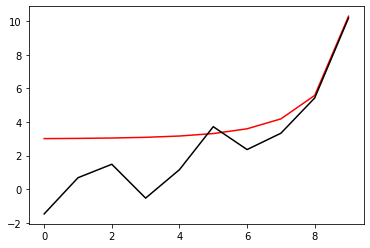

In [109]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [111]:
m2=tf.constant(np.float64(-1.0))
m2_2=tf.Variable(np.float64(np.random.uniform(-1.5, -0.5)))
print(m2_2)

lam=tf.constant(np.float64(1.0))
lam2=tf.Variable(np.float64(np.random.uniform(0.5, 1.5)))
print(lam2)

<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=-1.0359326164491272>
<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.8104192231092189>


In [60]:
def F_func(m, la, a,b):
    return 2*b/n_fin-m*a-la*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [61]:
def LP2(hh, m, la, phi, pi):
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m*dn+(1-dn*hh[j])*pi+dn*la*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh, m, la):
    Positive=[]
    while len(Positive)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
        F=np.array(tf.math.abs(F_func(m, la, phi_1, pi_1)))
        for i in range (len(phi1[F<0.1])):
            Positive.append([phi1[F<0.1][i], pi1[F<0.1][i]])
            if len(Positive)>=batch: break
    return Positive
def NN_func_n(hh, m, la):
    Negative=[]
    while len(Negative)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
        F=np.array(tf.math.abs(F_func(m, la, phi_1, pi_1)))
        for i in range (len(phi1[F>=0.1])):
            Negative.append([phi1[F>=0.1][i], pi1[F>=0.1][i]])
            if len(Negative)>=batch: break
    return Negative
def NN_func_01(hh, m, la, list1):
    PP=[]
    NN=[]
    phi=np.array(list1)[:, 0]
    pi=np.array(list1)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, m, la, phi, pi)[1]))
    for i in range (len(phi[F<0.1])):
        PP.append([phi[F<0.1][i], pi[F<0.1][i]])
    for i in range (len(phi[F>=0.1])):
        NN.append([phi[F>=0.1][i], pi[F>=0.1][i]])
    return PP, NN

In [62]:
Positive=[]
Negative=[]
for i in range (set):
    Positive.insert(i, NN_func_p(h_real, m2, lam))
    Negative.insert(i, NN_func_n(h_real, m2, lam))

In [112]:
Positive0=[]
Positive1=[]
Negative0=[]
Negative1=[]
for i in range (set):
    Positive0.insert(i, NN_func_01(h, m2_2, lam2, Positive[i])[0])
    Positive1.insert(i, NN_func_01(h, m2_2, lam2, Positive[i])[1])
    Negative0.insert(i, NN_func_01(h, m2_2, lam2, Negative[i])[0])
    Negative1.insert(i, NN_func_01(h, m2_2, lam2, Negative[i])[1])

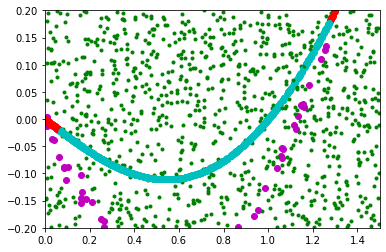

In [113]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
x_data3=[]
y_data3=[]
x_data4=[]
y_data4=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive0[i]])
    y_data1.insert(i, [v[1] for v in Positive0[i]])
    x_data2.insert(i, [v[0] for v in Positive1[i]])
    y_data2.insert(i, [v[1] for v in Positive1[i]])
    x_data3.insert(i, [v[0] for v in Negative0[i]])
    y_data3.insert(i, [v[1] for v in Negative0[i]])
    x_data4.insert(i, [v[0] for v in Negative1[i]])
    y_data4.insert(i, [v[1] for v in Negative1[i]])
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [105]:
def Error_func(hh, m, la, list1, list2):
    phi0=np.array([v[0] for v in list1])
    pi0=np.array([v[1] for v in list1])
    phi1=np.array([v[0] for v in list2])
    pi1=np.array([v[1] for v in list2])
    phi_0, pi_0=LP2(hh, m, la, phi0, pi0)
    phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)/batch
    sum_n=(batch-sum(NNlist))/batch

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return sum_p+sum_n+E_reg1+E_reg2

In [97]:
for i in range (set):
    print(Error_func(h_real, m2, lam, Positive[i], Negative[i]))
for i in range (set):
    print(Error_func(h, m2_2, lam2, Positive[i], Negative[i]))

tf.Tensor(0.029382559528006627, shape=(), dtype=float64)
tf.Tensor(0.04357209067519381, shape=(), dtype=float64)
tf.Tensor(0.05254973795270704, shape=(), dtype=float64)
tf.Tensor(0.02351923464766964, shape=(), dtype=float64)
tf.Tensor(0.02607480231873937, shape=(), dtype=float64)
tf.Tensor(0.02217798847000957, shape=(), dtype=float64)
tf.Tensor(0.01421081512338789, shape=(), dtype=float64)
tf.Tensor(0.023876860007875873, shape=(), dtype=float64)
tf.Tensor(0.03965768913130249, shape=(), dtype=float64)
tf.Tensor(0.04097159984247571, shape=(), dtype=float64)
tf.Tensor(0.9882224637448358, shape=(), dtype=float64)
tf.Tensor(0.91738991997645, shape=(), dtype=float64)
tf.Tensor(0.9320477725563395, shape=(), dtype=float64)
tf.Tensor(0.8870173489577784, shape=(), dtype=float64)
tf.Tensor(0.9675095738449154, shape=(), dtype=float64)
tf.Tensor(0.8504713570407432, shape=(), dtype=float64)
tf.Tensor(0.8574657398769967, shape=(), dtype=float64)
tf.Tensor(0.9216154420878246, shape=(), dtype=float64)


0 1.3819225306070633 -1.0192048761873773 0.8271469662376901
[-1.36803592  0.58637312  1.38712931 -0.42753308  1.06547708  3.62386451
  2.46210002  3.23456299  5.33399496 10.09364187]


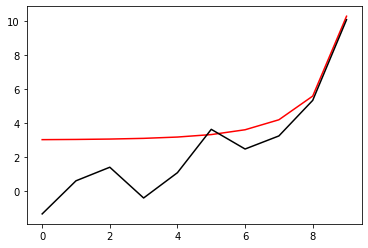

1100 1.055028714202995 -1.0474157453126016 0.7845253811908303
[-0.61463031 -0.05204616  0.52528235  0.35215889  1.27674567  2.72960604
  2.93075104  3.09440394  4.71693139  9.55869181]


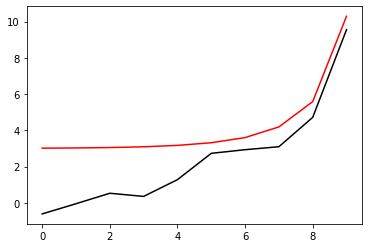

2200 0.8948652045581668 -0.9584566059765324 0.8652557517711604
[-0.40510051 -0.27261316  0.06700966  0.44809342  0.82744329  1.94963996
  2.17116607  2.57495288  3.95733322  9.49246159]


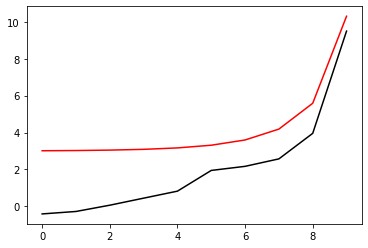

3300 0.8872366550614107 -0.8988289758224259 0.9094177809665581
[-0.12931722 -0.02314026  0.08191707  0.3185543   0.76620259  1.24176807
  1.47243287  1.77613725  3.06694095  9.39903943]


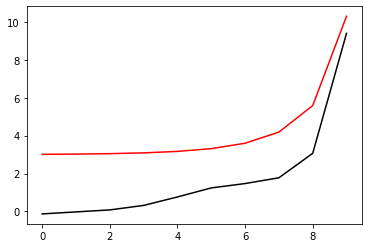

4400 0.8426655206014094 -0.8953707223044706 0.8886050724928193
[0.20433253 0.24147611 0.25165119 0.29230244 0.42245636 0.55526248
 0.55629165 0.71452551 1.93423264 9.27547135]


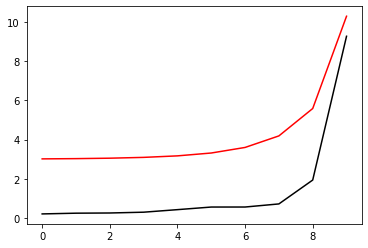

5500 0.7063060789046304 -0.8807141291917767 0.8780677669951216
[0.5589773  0.58185039 0.55909311 0.52672385 0.48367374 0.33358934
 0.16266113 0.11620545 1.188539   9.27368499]


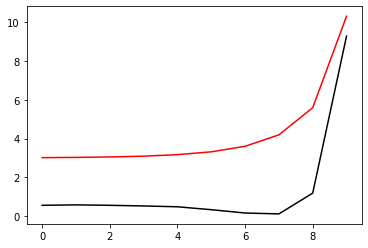

6600 0.27026766426435234 -0.8082150595960941 0.8679445025926367
[ 1.94573189  1.95697669  1.89300995  1.75312175  1.48073848  0.78534479
 -0.23078641 -0.90321388 -0.09369618  9.05652866]


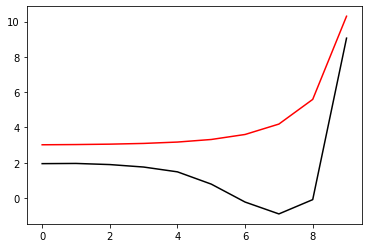

7700 0.390419548701845 -0.7651929461532568 0.893088929400073
[ 2.03263075  2.041993    2.04202369  1.99726335  1.8407098   1.42301585
  0.58809144 -0.39018967  0.10629871  9.11334547]


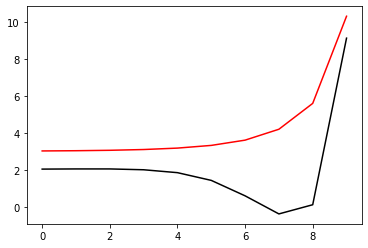

8800 0.2180272279854646 -0.8208283575506605 0.8573516331029594
[ 1.94382634  1.94369755  1.9309554   1.88327575  1.75158771  1.43672154
  0.78334792 -0.13416834  0.24706282  9.14633551]


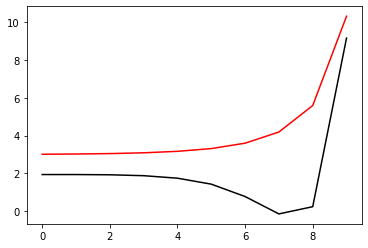

9900 0.07684168757644963 -0.8403510346281146 0.8235552370175092
[2.47262585 2.46911193 2.45460037 2.4083824  2.28867311 2.01384699
 1.44009828 0.53688192 0.68305234 9.0610525 ]


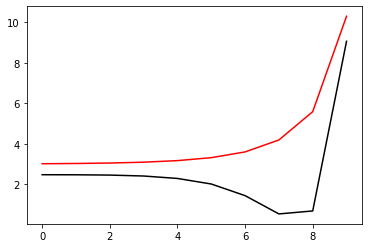

11000 0.10794112860962919 -0.8407257618374245 0.8280221134047602
[2.42902236 2.43918847 2.44828318 2.4481297  2.41263033 2.28023087
 1.92105387 1.21949397 1.34345254 9.24041336]


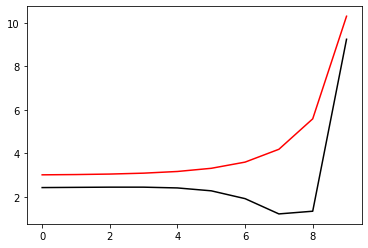

12100 0.3340901556360518 -0.8090358149207372 0.8647158481530225
[2.01236732 2.02012098 2.02606175 2.02177054 1.9925324  1.90370648
 1.67788521 1.19535647 1.26304711 9.25783663]


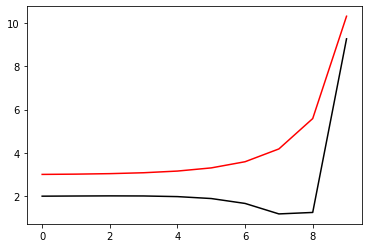

13200 0.1058064725624301 -0.8234667038533008 0.8442672269531231
[2.46029347 2.46460553 2.46716969 2.45637232 2.40507822 2.24143342
 1.8325869  1.29242748 1.25508497 9.27019136]


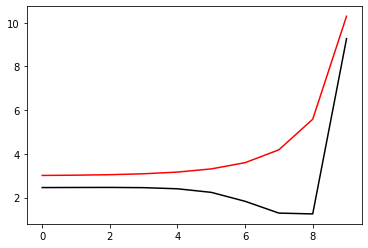

14300 0.05604261744726704 -0.8457064879879918 0.8197613248151467
[2.3975374  2.39071038 2.37205975 2.33116011 2.24513987 2.07079666
 1.7333955  1.25047395 1.25706764 9.22309997]


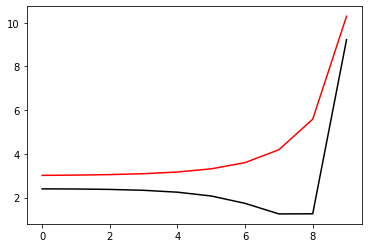

15400 0.18895927681161917 -0.8294500947979735 0.847187612790268
[2.00512902 2.00448022 1.99868733 1.97967429 1.93327332 1.83248043
 1.62564595 1.27404188 1.34892562 9.27504237]


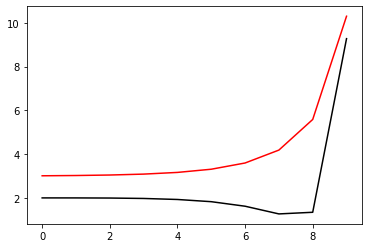

16500 0.05117165884768616 -0.8461790587322396 0.8296316153080477
[2.30079685 2.30682651 2.30313461 2.27737219 2.21135311 2.07154031
 1.79976369 1.3477051  1.25283783 9.17874447]


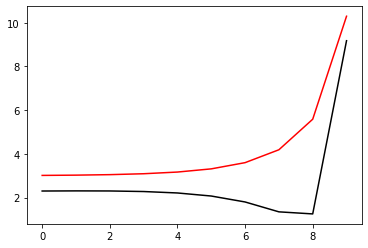

17600 0.04641897129025857 -0.8417357448603668 0.8339181719118938
[2.34669221 2.35108689 2.35761109 2.360041   2.34667186 2.29380435
 2.15429026 1.87149745 1.88942501 9.31150344]


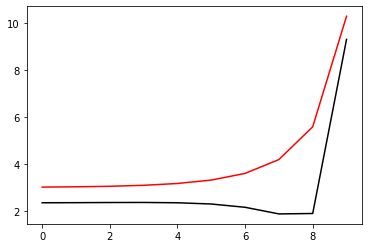

18700 0.04870846792709383 -0.8416150397888023 0.8357926042518419
[2.35182952 2.36056123 2.38144438 2.41516761 2.45909899 2.5015536
 2.50755167 2.41098895 2.55222671 9.33235107]


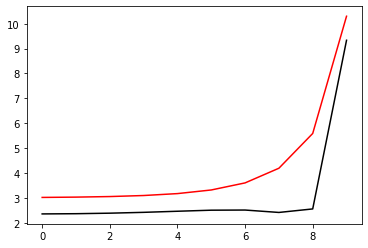

19800 0.2810287529410333 -0.8653928426775235 0.7939330426709619
[2.85124949 2.87067103 2.90899773 2.96445132 3.03054829 3.08224343
 3.03498614 2.7202438  2.62423235 9.38144109]


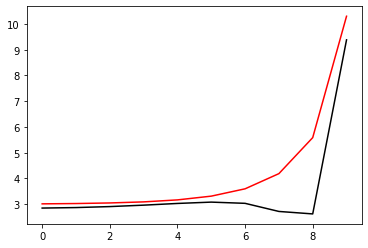

20900 0.16434041796481094 -0.8349815914137089 0.8579545278500197
[2.2243431  2.21779779 2.21298813 2.2106289  2.19864555 2.14681855
 1.9971802  1.70514466 1.76179161 9.34582274]


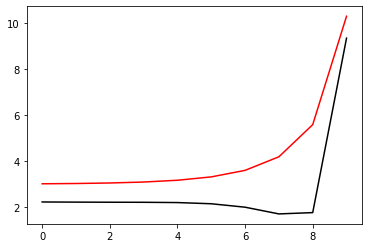

22000 0.1090299601297581 -0.8383627477782379 0.8385376271643445
[2.41518811 2.39632433 2.36086963 2.31171545 2.23878885 2.11348536
 1.88114827 1.497232   1.44406934 9.24800952]


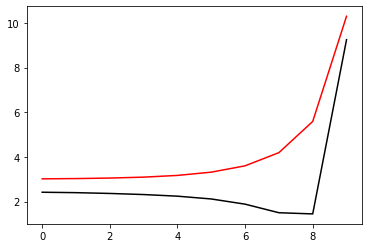

23100 0.0676677039679009 -0.837254715521003 0.8373781654053797
[2.52570196 2.51543796 2.49018619 2.44750919 2.37992719 2.26508345
 2.05581261 1.70758862 1.6766808  9.13551097]


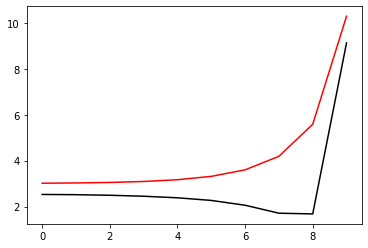

24200 0.0798448626798713 -0.837109684332672 0.837868233314067
[2.5631221  2.57091897 2.57675473 2.57600052 2.56097248 2.5145208
 2.39878967 2.16969919 2.23600559 9.30614591]


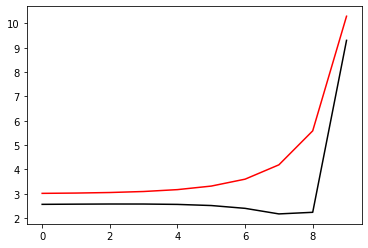

25300 0.05228691382491481 -0.8390124354264771 0.8430017742853134
[2.28888824 2.28888527 2.28900072 2.28339066 2.26234461 2.20950379
 2.09687086 1.90652074 2.04373316 9.32969848]


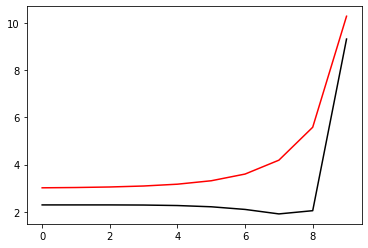

26400 0.034973146930592856 -0.8385476053695811 0.8397577119457953
[2.46850512 2.48093361 2.50101772 2.52420731 2.54550831 2.55484361
 2.53112352 2.45362632 2.66528054 9.35220422]


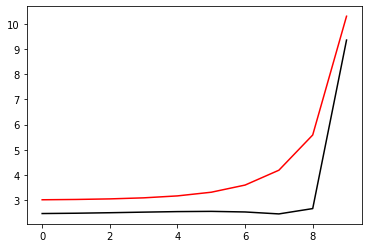

27500 0.049301010170791054 -0.8341047041717591 0.84625995019206
[2.35105963 2.35976832 2.37866862 2.40707522 2.44461179 2.48947347
 2.53650983 2.59248949 2.97958769 9.39630523]


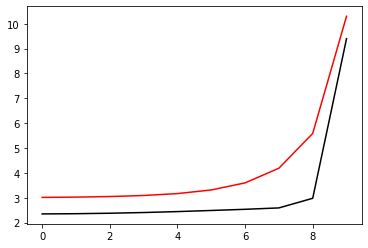

28600 0.04407137827886452 -0.8394985208274863 0.8418102795579935
[2.43577183 2.44563457 2.46790855 2.50490516 2.55927441 2.63556004
 2.74212837 2.91175749 3.47076076 9.42784054]


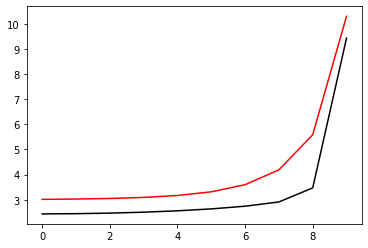

29700 0.2067113316930791 -0.8518964205016403 0.8240651616794419
[2.64252706 2.64391715 2.65433907 2.67879335 2.71829556 2.76280048
 2.77142201 2.7489728  3.35324582 9.34554385]


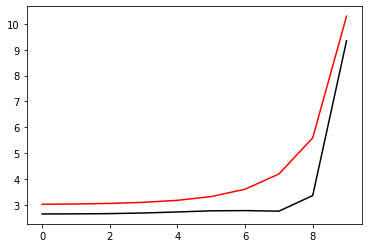

30800 0.04442223186448923 -0.8351697528502338 0.8421914923355306
[2.46911506 2.46636763 2.46134609 2.45419486 2.44304797 2.42242067
 2.3888805  2.40867886 3.10950445 9.39248704]


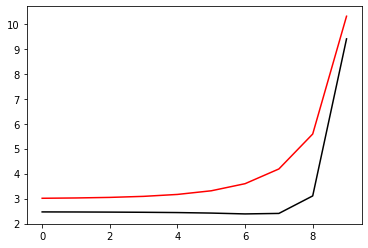

31900 0.04436585475908769 -0.8395853833344495 0.840141094189314
[2.40561511 2.40451468 2.4110646  2.42966453 2.46559623 2.52729359
 2.6307468  2.83419213 3.63513074 9.47820091]


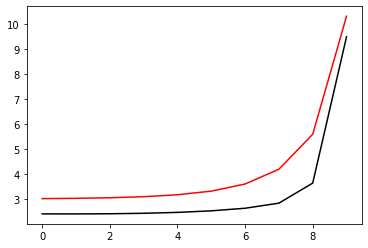

33000 0.06653296471620125 -0.8439625075800581 0.8416616884928233
[2.16137627 2.16508247 2.18732277 2.23863955 2.33747623 2.51427706
 2.81354388 3.3047569  4.34084709 9.52391925]


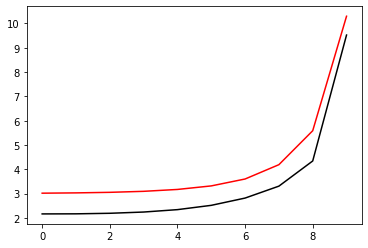

34100 0.39644009733721275 -0.7916991801961009 0.8894672754601636
[2.26399229 2.24530013 2.20211341 2.13418159 2.04405305 1.95187029
 1.92818387 2.13296871 3.07459379 9.41646843]


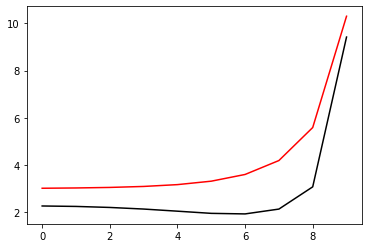

35200 0.40415169801022277 -0.818587307760329 0.8746762200757914
[1.88727234 1.87166367 1.83500839 1.77682529 1.7045612  1.64543484
 1.67008158 1.93605308 2.94865677 9.29856758]


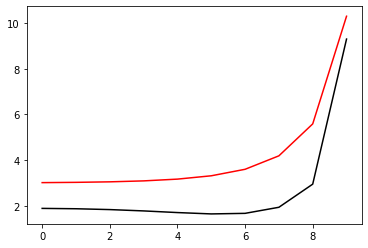

36300 0.03504145122401547 -0.8513363148163563 0.8293942411345865
[2.34572805 2.33076183 2.29840746 2.24628343 2.17352276 2.08119957
 1.9711672  1.9600489  2.78358521 9.35034493]


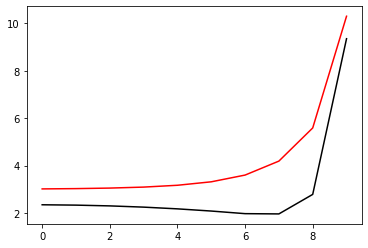

37400 0.05515511166914635 -0.8471647338728107 0.8367106539548597
[2.20647877 2.20234214 2.19091534 2.17036224 2.14173251 2.11214155
 2.09900646 2.17210399 2.98349901 9.39087259]


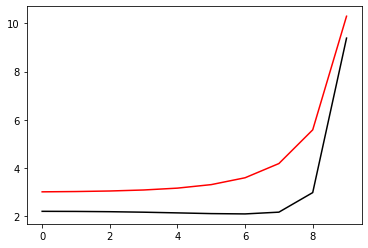

38500 0.08959152028107152 -0.8375892757227944 0.847974359252161
[2.15377749 2.15857076 2.16699762 2.17885319 2.19549682 2.22305243
 2.27643994 2.41409656 3.19055763 9.47774075]


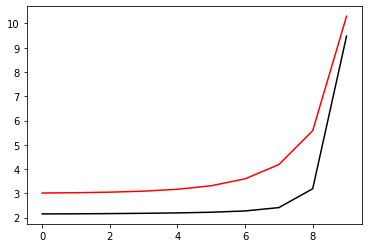

39600 0.04387103580845564 -0.8425705290607609 0.8416433412456379
[2.34604245 2.35355039 2.37105653 2.40125442 2.44950437 2.52524654
 2.64592473 2.8696856  3.67449971 9.44435616]


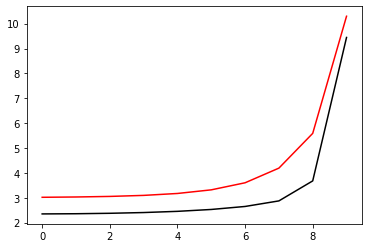

40700 0.04410399347804765 -0.8424970817265478 0.8422569381331277
[2.35271502 2.36310128 2.38872815 2.43491235 2.51064435 2.63211392
 2.82941465 3.17730741 4.08886412 9.51260331]


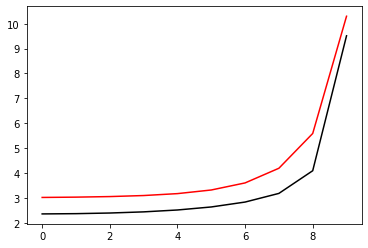

41800 0.040824430602648516 -0.8484336498148835 0.8373694077179087
[2.31845198 2.32695336 2.35774365 2.41791146 2.51931137 2.68236329
 2.94057915 3.37398648 4.38817229 9.47620809]


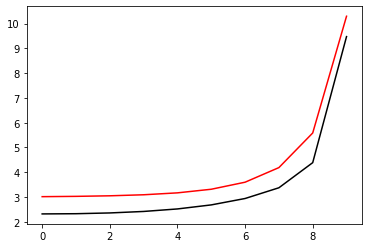

42900 0.20222780640395924 -0.8307424390001027 0.872160139453096
[1.92708447 1.93524624 1.95941674 2.00969832 2.10069403 2.25606138
 2.52027724 2.99884765 4.10936569 9.48677528]


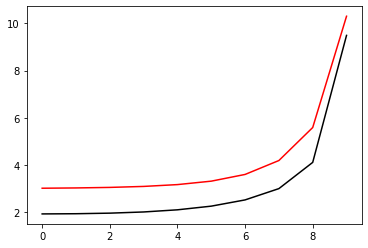

44000 0.06405618548921163 -0.851175214990693 0.8422988945704294
[2.21260995 2.23186687 2.26737891 2.32128602 2.40068183 2.51938469
 2.70370965 3.02067137 3.90460524 9.45046711]


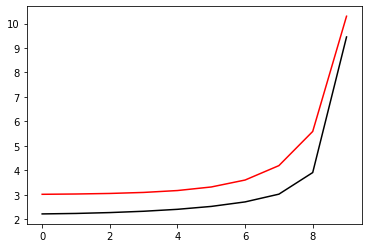

45100 0.23687268805180897 -0.8415098771253272 0.8584517365477327
[1.89574966 1.92264356 1.97190206 2.05142185 2.1753155  2.36949014
 2.67852716 3.17568182 4.20406277 9.47811616]


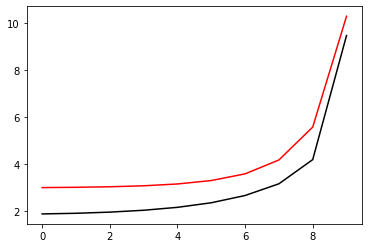

46200 0.07324620407373299 -0.8455057655451972 0.8347245588207574
[2.27217625 2.30054521 2.3498387  2.41712445 2.50467116 2.61479663
 2.7407239  2.86442941 3.50335641 9.43414918]


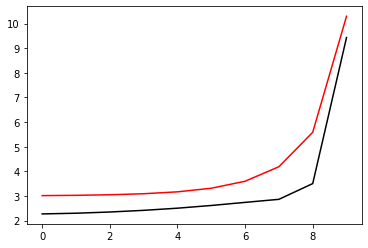

47300 0.035272511946274496 -0.8420724553232589 0.8421888849505499
[2.22497514 2.25004419 2.30099053 2.37857212 2.48811414 2.64469099
 2.88017679 3.21115363 3.85703776 9.445615  ]


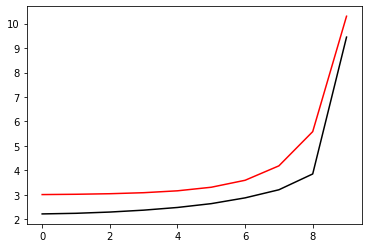

48400 0.036256604045455866 -0.8437465004844769 0.8429963550791739
[2.23879982 2.26012553 2.30741826 2.3897087  2.52177491 2.7319442
 3.06982054 3.56343395 4.30298841 9.46593174]


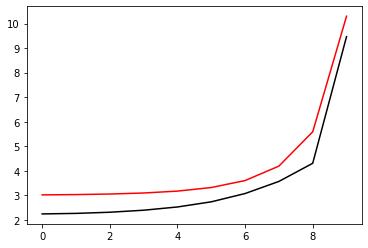

49500 0.025744713254331815 -0.8445340765495158 0.8438494872087663
[2.22633948 2.24390824 2.28879094 2.37328301 2.51826748 2.75900874
 3.15338255 3.78883962 4.76545388 9.54264759]


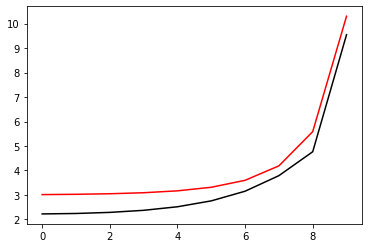

50600 0.1202522858883043 -0.8469551539998508 0.8289787986431739
[2.33039665 2.33320263 2.3565699  2.41115033 2.51363165 2.69252031
 2.97171063 2.9934924  4.1404809  9.45050178]


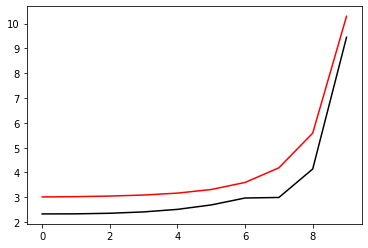

51700 0.04379039014237006 -0.8379213281194723 0.8333455769427112
[2.35853619 2.35533199 2.36263867 2.39353307 2.46164728 2.5856947
 2.76988608 2.81065011 3.87768838 9.46052064]


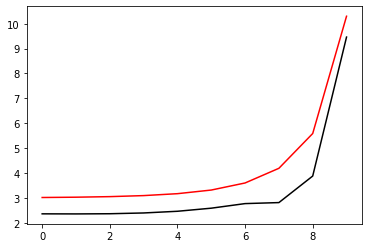

52800 0.04432866369230261 -0.8383267167237318 0.8345307017476549
[2.34816497 2.35314808 2.36844182 2.40483278 2.47760052 2.60408874
 2.78746902 2.96404237 4.00838211 9.48583343]


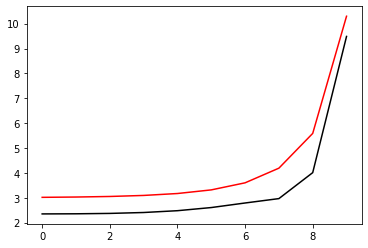

53900 0.04421416139170546 -0.8367054665977474 0.8392111051449316
[2.28111298 2.29154959 2.31720991 2.36574118 2.44999567 2.5887822
 2.8043478  3.13738585 4.20378279 9.49985925]


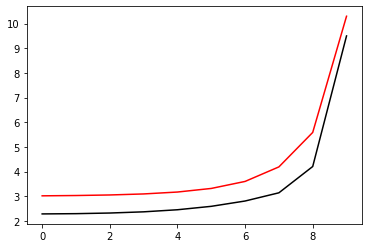

55000 0.06678873959809993 -0.8388896568284159 0.838940186148522
[2.19668119 2.20677938 2.23699942 2.29720867 2.403093   2.58150799
 2.88080756 3.39750336 4.57295212 9.51996671]


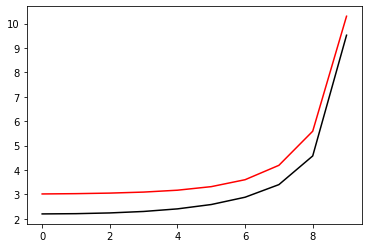

56100 0.05117724758810982 -0.8413039926673147 0.8383980928314381
[2.13557455 2.14866697 2.18329021 2.25264439 2.37641645 2.5898689
 2.96072713 3.62315133 4.95259399 9.64178694]


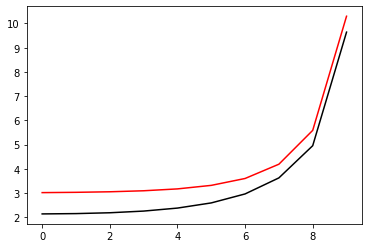

57200 0.1787012616153091 -0.8402912016003963 0.8459229095283296
[2.01548073 2.03271176 2.07208568 2.14071937 2.25312828 2.43700943
 2.75134553 3.33888254 4.6226702  9.48536725]


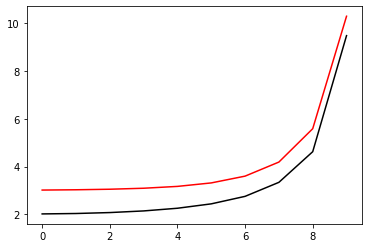

58300 0.15016469717655606 -0.8430731227659528 0.8237246490871263
[2.52448313 2.51994647 2.52131358 2.52768871 2.53289772 2.52057957
 2.46895327 2.50581196 3.51116949 9.49658262]


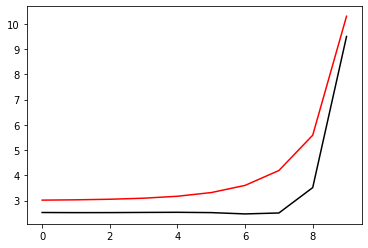

59400 0.03409208073756888 -0.8295152742079372 0.840968270136437
[2.44386546 2.44449467 2.44655856 2.45111643 2.45689248 2.46172936
 2.47958194 2.6227572  3.60426826 9.41126843]


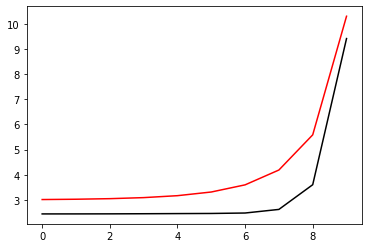

60500 0.037730646170942454 -0.8307552791673728 0.842159654779268
[2.38345464 2.38657585 2.3941836  2.40912988 2.43749619 2.49413075
 2.6174116  2.91731405 3.92134415 9.46651677]


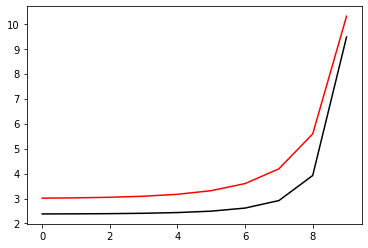

61600 0.043877943258841944 -0.8360565754749635 0.83783095694171
[2.38068804 2.38706689 2.40287274 2.43384253 2.49325661 2.60682051
 2.82601814 3.26797413 4.3555501  9.37545731]


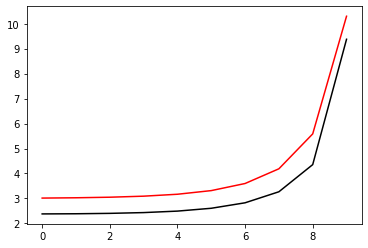

62700 0.09362236960551197 -0.8406463821953883 0.834319185759859
[2.42344373 2.4329447  2.46248356 2.52909093 2.6586037  2.89797852
 3.32354443 3.90182611 5.00330664 9.592186  ]


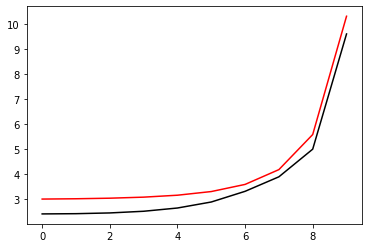

63800 0.18358245370376397 -0.8477730095527347 0.8165538720083331
[2.65569595 2.63416127 2.6061766  2.5804252  2.55902322 2.54132833
 2.54389949 2.70933374 3.80908008 9.57096609]


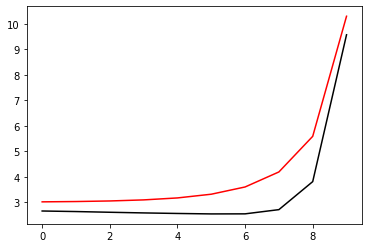

64900 0.0618765571193473 -0.8334954443845741 0.8315434978308449
[2.57421846 2.55518081 2.51881226 2.46564766 2.3934889  2.29950223
 2.20303656 2.26037689 3.27836833 9.37838153]


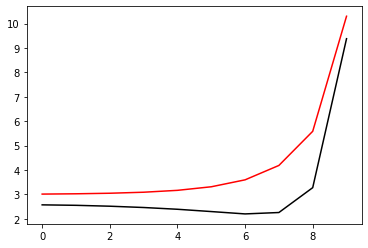

66000 0.0848451923535205 -0.8328561588385154 0.8345738728843138
[2.45630105 2.44903891 2.43314186 2.40752454 2.37268956 2.33497761
 2.32280038 2.46847474 3.4812553  9.46388055]


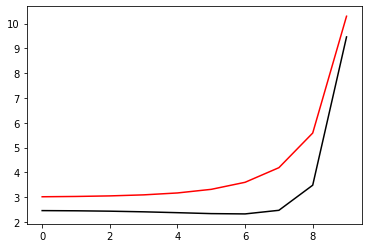

67100 0.06382252330296456 -0.8295757103012592 0.8393252276094417
[2.39148928 2.3933676  2.39527016 2.39709067 2.40121549 2.41638804
 2.4727096  2.6891824  3.68155618 9.42826799]


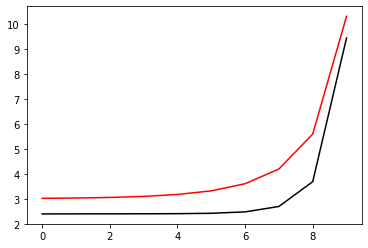

68200 0.05669056558239445 -0.8343391448898554 0.8361559050322084
[2.30576287 2.31713646 2.33585257 2.36666498 2.41740482 2.50362455
 2.66225218 3.0090226  4.08721188 9.51267205]


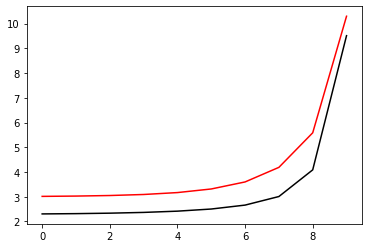

69300 0.0345413784271222 -0.8365314389389731 0.837318880539052
[2.18607744 2.19738199 2.23057984 2.2935362  2.40750928 2.60707769
 2.95496899 3.57403738 4.87603003 9.55305992]


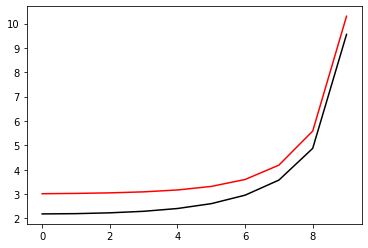

70400 0.38929320806032464 -0.8129297152007473 0.8721464453846426
[1.91896149 1.9465053  2.00303977 2.09776599 2.2511904  2.5003587
 2.91271814 3.62434795 5.02791449 9.56178708]


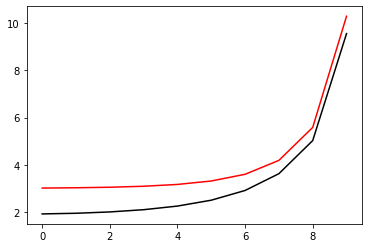

71500 0.06512198577136324 -0.8340905166650873 0.8440705020472049
[2.17166206 2.19027479 2.22897972 2.29008728 2.37904354 2.50395735
 2.67932934 3.00320996 4.07721674 9.53114046]


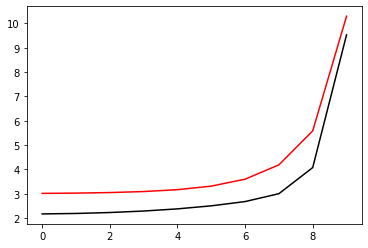

72600 0.04295122737494945 -0.8385151813094436 0.837728488266027
[2.26467138 2.26818733 2.2828806  2.31594898 2.37442159 2.46803531
 2.62176543 2.93845637 3.99057205 9.43928798]


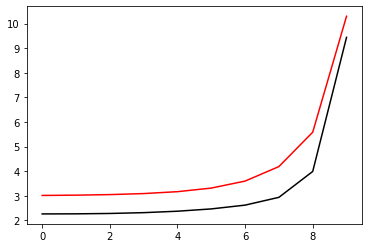

73700 0.03532729588695962 -0.8401700824878755 0.8389211247965914
[2.20685799 2.21343295 2.23735657 2.2877974  2.38028159 2.54238701
 2.82540671 3.3365106  4.50722716 9.53397013]


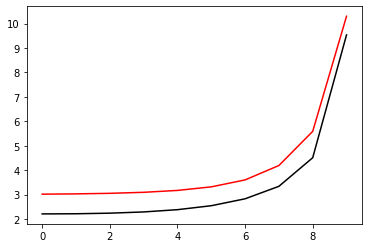

74800 0.051232487154690386 -0.845280042850085 0.8366151675641675
[2.19591869 2.21850519 2.26128483 2.33900282 2.47466381 2.70709256
 3.10406302 3.7880634  5.10066369 9.54275643]


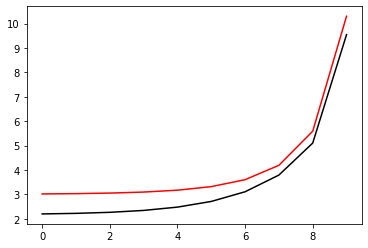

75900 0.1374821445170391 -0.8480233325908814 0.8267900044782779
[2.25153703 2.25799834 2.28478656 2.34452273 2.45386047 2.63339266
 2.8717462  2.9879939  4.45887871 9.49972096]


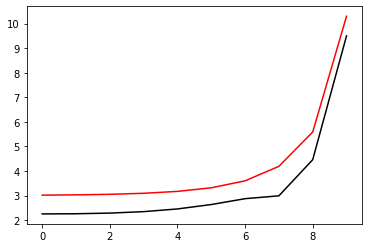

77000 0.08565570538159462 -0.8367711614692724 0.831416937531154
[2.31970362 2.31560892 2.31926171 2.33852387 2.37726802 2.427676
 2.45329152 2.42623987 3.72312335 9.40756341]


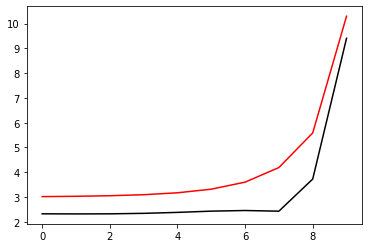

78100 0.0621248495829396 -0.8359325446892828 0.8336349007066767
[2.29778775 2.30375738 2.31690724 2.34386052 2.39080431 2.45956894
 2.54837126 2.7130929  3.90641232 9.47199101]


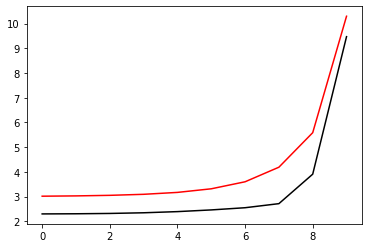

79200 0.054546219493919586 -0.8360965023001319 0.8359305193076116
[2.31329569 2.32629384 2.35214043 2.39767403 2.47266426 2.59292292
 2.78657283 3.14113349 4.29303374 9.47218932]


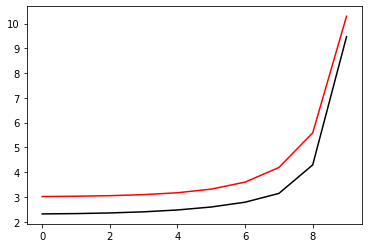

80300 0.05057780808535587 -0.8413238857823193 0.8324792388928454
[2.36815014 2.37866699 2.40948758 2.47014206 2.5783893  2.7637318
 3.07712826 3.6211347  4.85243154 9.60387153]


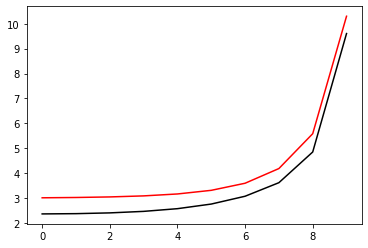

81400 0.039234098229159464 -0.8366927935074894 0.8351037658961298
[2.33419505 2.33899838 2.35111975 2.37455107 2.41501572 2.48211813
 2.59796253 2.85112725 3.75881599 9.43668417]


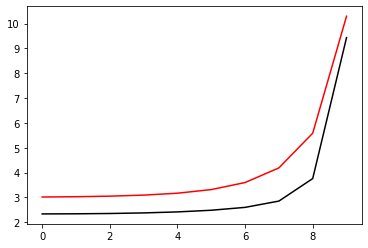

82500 0.02872825415495668 -0.8369936133594509 0.8365907144155895
[2.26406564 2.27375099 2.29668238 2.33792091 2.40775795 2.52563815
 2.73201468 3.13278557 4.18825836 9.49716985]


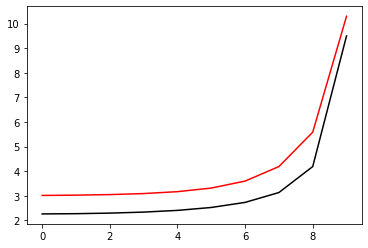

83600 0.043046727405280774 -0.837181492598217 0.8386629009638868
[2.24766858 2.26112534 2.29518358 2.35852057 2.46859526 2.65724416
 2.98357474 3.56841342 4.79948673 9.4624638 ]


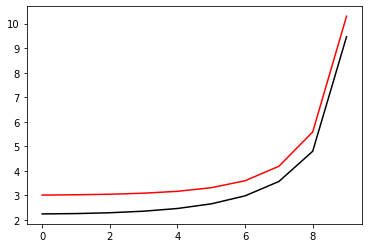

84700 0.03546424906387111 -0.8408759323228935 0.8383208273864365
[2.17198211 2.18646714 2.2259389  2.30564662 2.44871991 2.69746084
 3.13045027 3.89910205 5.34895165 9.61101956]


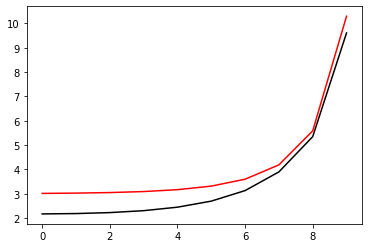

85800 0.09845782705119781 -0.8237799825438253 0.843238558204529
[2.30253644 2.30220688 2.32073124 2.3728296  2.47886724 2.6741656
 2.99683292 3.14957939 4.5513369  9.54279374]


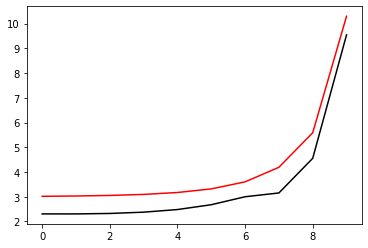

86900 0.04738907709678158 -0.8250260215508007 0.8357504103347553
[2.35430326 2.35494922 2.36902529 2.4135873  2.5096841  2.68761687
 2.96870546 3.18567198 4.52671232 9.51795001]


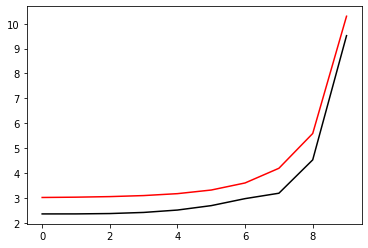

88000 0.06468036712620613 -0.8224180637272871 0.8364642564020024
[2.40816466 2.41564493 2.43719355 2.4859972  2.58227913 2.75232541
 3.01399923 3.32979912 4.61597024 9.41510515]


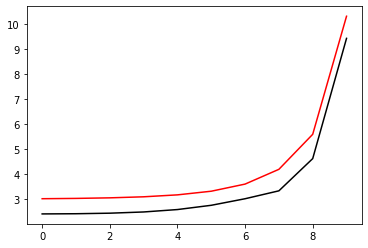

89100 0.06068653598431291 -0.830547497800135 0.8311034013456531
[2.26944961 2.27815532 2.30201341 2.35060943 2.44009308 2.59486928
 2.84853356 3.26906638 4.54371627 9.50209084]


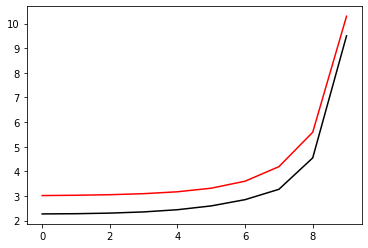

90200 0.06572242895119174 -0.8389751027003282 0.8256565373696862
[2.19688166 2.21733271 2.25682234 2.32724508 2.44730432 2.64793741
 2.98252968 3.56698868 4.94066167 9.56540402]


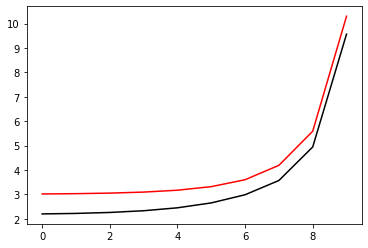

91300 0.06546494206019778 -0.8396122506853406 0.833301631964172
[1.97152007 1.99260629 2.0393782  2.1173176  2.24101593 2.43917522
 2.77007257 3.37494601 4.74206426 9.65121343]


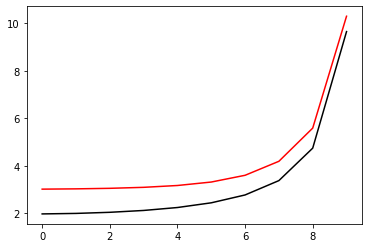

92400 0.034084833312952874 -0.8239884555732148 0.8286761038754533
[2.38638856 2.40095819 2.43456374 2.49193596 2.57910557 2.70358591
 2.87778022 3.1758752  4.25279065 9.48811874]


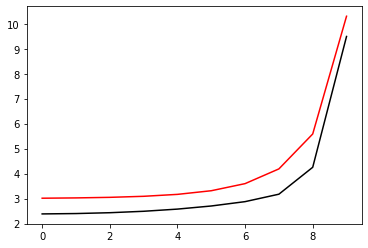

93500 0.16716262861187944 -0.8183523062979658 0.8511489293778566
[1.99563613 2.00815089 2.03810449 2.08696108 2.15989581 2.26882531
 2.44842122 2.80574751 3.87472957 9.45768455]


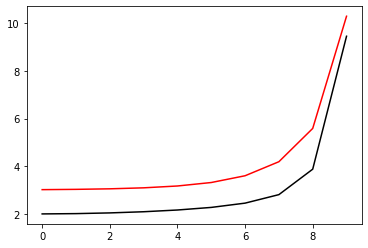

94600 0.07704366189755 -0.8233959052263174 0.838097366105519
[2.26337058 2.26465771 2.27468755 2.29530232 2.32732771 2.3752871
 2.46063751 2.68372181 3.58553167 9.50715909]


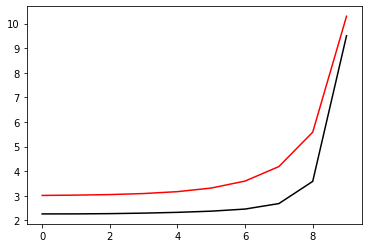

95700 0.043788057809549766 -0.8323765581995951 0.8265143778065364
[2.38412113 2.38641222 2.39464521 2.41241457 2.4447927  2.50037352
 2.60176719 2.84027797 3.73817076 9.44145602]


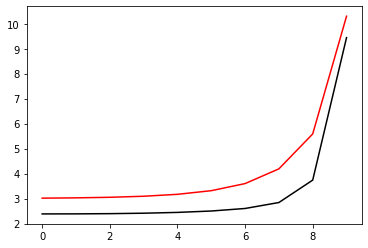

96800 0.060608501111033206 -0.8356260498074644 0.8266912843740137
[2.34378121 2.35325041 2.37650953 2.42096099 2.49755618 2.6250086
 2.83842558 3.22739396 4.24245204 9.49964267]


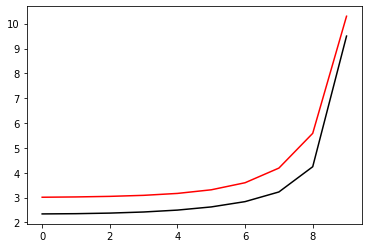

97900 0.054502513099823784 -0.8421063027366688 0.8244033697668175
[2.17821547 2.19277635 2.21721593 2.25119309 2.29871709 2.36876212
 2.48438475 2.73060993 3.58264734 9.48158023]


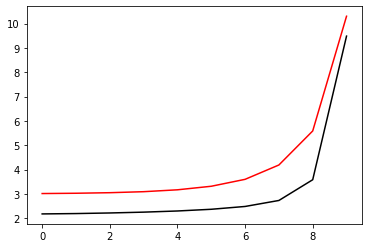

99000 0.07811599197843508 -0.8329213033826661 0.8323210788821184
[2.23623546 2.24540443 2.26899254 2.31163329 2.38219342 2.49790642
 2.6925842  3.04007876 3.95760523 9.54390276]


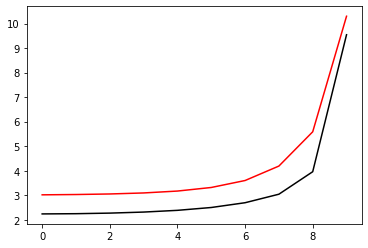

100100 0.03867833961970696 -0.8383225163510734 0.8314564408878851
[2.04706971 2.0528251  2.07820156 2.13683875 2.24889224 2.4514532
 2.81277795 3.42872085 4.55272575 9.52584207]


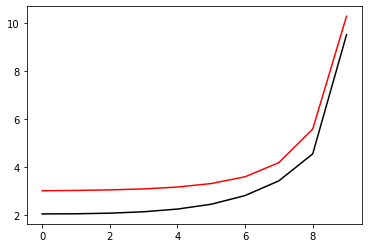

101200 0.25426320155918475 -0.8305630095247585 0.8422266541284967
[1.88421232 1.89224203 1.90900887 1.93692772 1.98087997 2.04058353
 2.10778982 2.33039985 3.44974809 9.43622644]


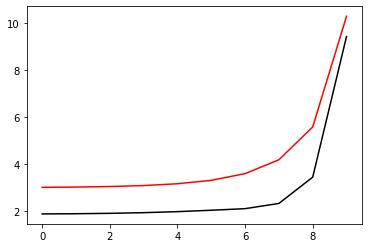

102300 0.03380805657638957 -0.8406228958132713 0.816808908404646
[2.19262181 2.1974397  2.21173776 2.239255   2.28467617 2.35207971
 2.44822859 2.59283073 3.44665687 9.5093595 ]


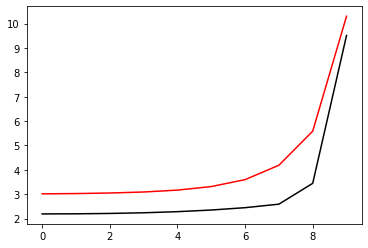

103400 0.05430805826361504 -0.8363672067734655 0.8227363449203198
[2.15668641 2.16517276 2.18456959 2.21935263 2.27744662 2.37285116
 2.5302683  2.80633129 3.6774681  9.43348168]


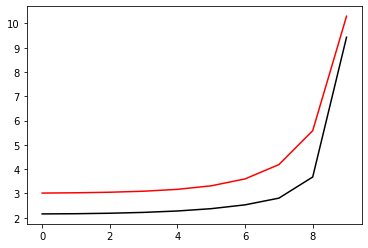

104500 0.024923547877988173 -0.8372046660364004 0.82354228940115
[2.14765217 2.16271884 2.19909826 2.26467272 2.37459224 2.55817827
 2.86123141 3.33634646 4.23146689 9.49480226]


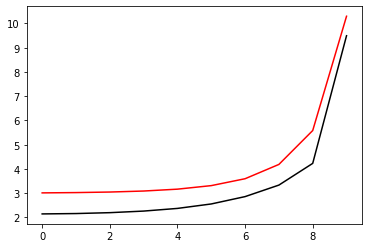

105600 0.26957944308744164 -0.7834036176979077 0.8824520715860532
[1.78686416 1.80826784 1.8490546  1.90814246 1.99012719 2.1011357
 2.25023696 2.55131572 3.48571727 9.36463482]


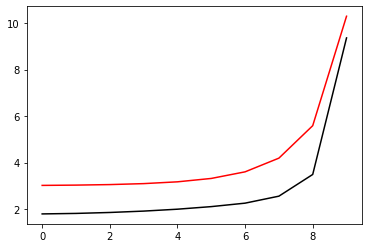

106700 0.26775590968927393 -0.8161199314637263 0.8542304048305522
[1.79493049 1.81505669 1.84883972 1.89209346 1.93949849 1.98045285
 2.00440104 2.12014149 2.99936614 9.36205297]


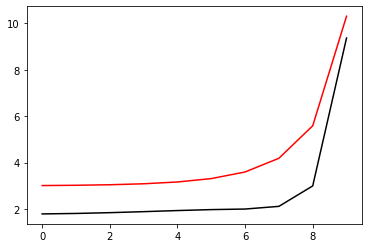

107800 0.0557164306814018 -0.8383617532048395 0.8207825932582762
[2.17113705 2.18436221 2.20969596 2.2470639  2.29309875 2.34010419
 2.37871962 2.41912394 3.03045322 9.3845969 ]


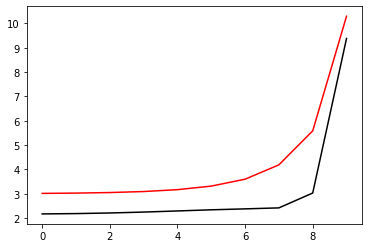

108900 0.044544842241270526 -0.8281677582963962 0.8287935241590387
[2.28223025 2.29371588 2.31950712 2.36276653 2.42778269 2.521643
 2.65315154 2.812861   3.3930173  9.39297883]


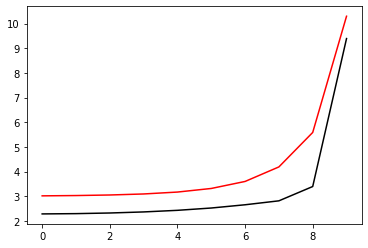

110000 0.08262525517138031 -0.8313203188571912 0.8262238849105744
[2.30149007 2.31219237 2.33925573 2.38876776 2.46986029 2.59747617
 2.79713203 3.11480318 3.79678585 9.44754375]


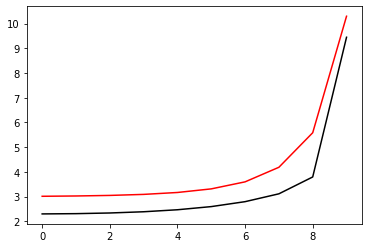

111100 0.06471604715921583 -0.8242930529857633 0.8332478637509765
[2.19806599 2.22411474 2.26371833 2.31943392 2.39585968 2.4953442
 2.59079588 2.64096086 3.22125676 9.3830213 ]


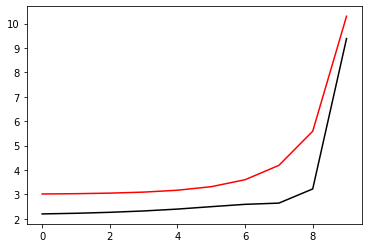

112200 0.05521956669721702 -0.8265375459665936 0.8269043315056127
[2.26943394 2.28958748 2.33067635 2.39783381 2.49930556 2.65019958
 2.87035709 3.11928531 3.63987955 9.52478007]


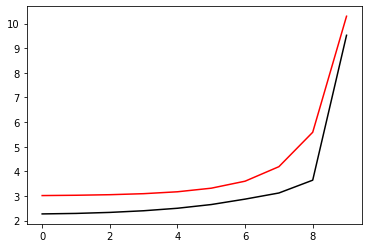

113300 0.036591270624732164 -0.8296175034637263 0.8261001704202365
[2.20405936 2.21960961 2.25855434 2.32849142 2.44328315 2.62744956
 2.92792231 3.38689069 4.09381694 9.47660987]


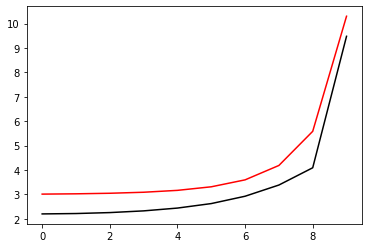

114400 0.3214916733711047 -0.8058027090537704 0.8659450395393528
[1.77025524 1.77701293 1.80575224 1.86512484 1.96926943 2.14313024
 2.43144324 2.91781767 3.82349685 9.42412793]


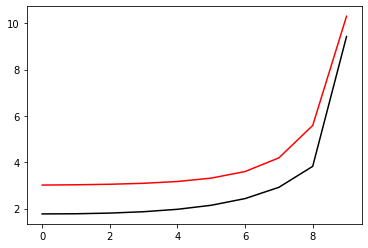

115500 0.03442575561912783 -0.8204616233718875 0.8251357865747477
[2.32089153 2.33896183 2.37677295 2.43575367 2.52376839 2.65125086
 2.81516891 2.87767777 3.40385167 9.40383869]


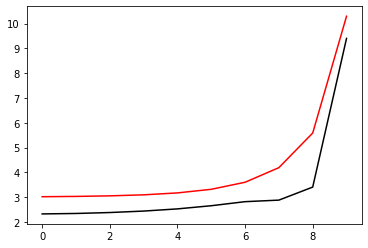

116600 0.2523510622849666 -0.7966591955833071 0.8619351534169025
[1.94487814 1.97040001 2.01530329 2.07872062 2.16346486 2.27540675
 2.4338465  2.70053557 3.39452088 9.44716627]


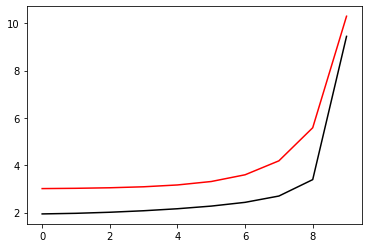

117700 0.08454256525252667 -0.844411746057076 0.8151285872354765
[2.14518598 2.15703263 2.1828279  2.22152087 2.2699517  2.32252029
 2.37209922 2.4415055  3.00804133 9.44339128]


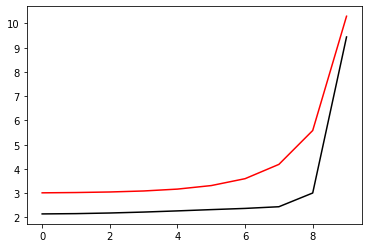

118800 0.04663905318653081 -0.8252763401257686 0.8253281594245133
[2.37813207 2.38588696 2.39832748 2.41251379 2.42146548 2.41185263
 2.36019799 2.28248677 2.75740904 9.3723736 ]


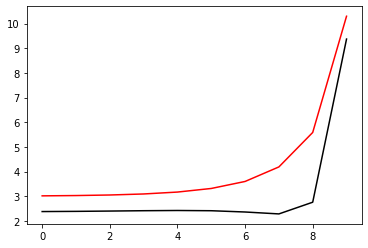

119900 0.046487856456358986 -0.8253181430486523 0.8257682418943576
[2.34796537 2.35329758 2.36952376 2.39717093 2.43577215 2.48468957
 2.54191873 2.60648583 3.105818   9.37655849]


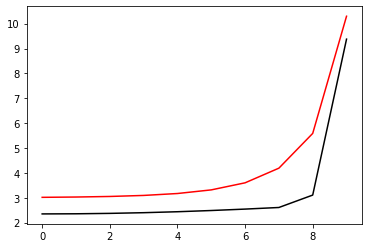

121000 0.0842885250850901 -0.825359861412401 0.8277113400739017
[2.29060581 2.29885347 2.3180064  2.35489892 2.41687238 2.5151385
 2.6646656  2.88966919 3.50691802 9.41659117]


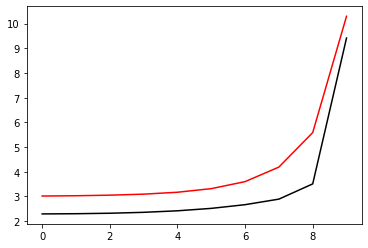

122100 0.06293521905743116 -0.8280776561756112 0.8267396624424511
[2.28235285 2.28978375 2.3103978  2.35094774 2.42137698 2.53712543
 2.7242496  3.04259806 3.82144329 9.45872022]


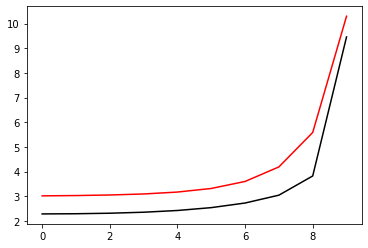

123200 0.06989298224341121 -0.8279138182055273 0.8302174111418457
[2.18434373 2.19373899 2.21345332 2.25084152 2.31704193 2.42898465
 2.61916756 2.97434512 3.88413094 9.48381176]


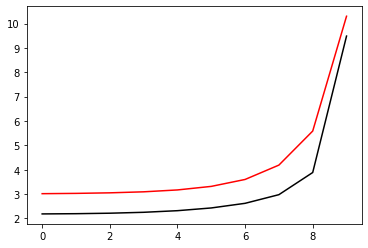

124300 0.03507197102523517 -0.8310363945392939 0.8297838605607614
[2.195787   2.21054286 2.24393678 2.30578273 2.4144371  2.5996246
 2.9119396  3.44833599 4.55632749 9.47961004]


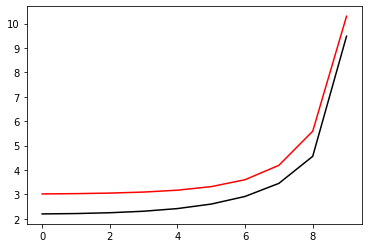

125400 0.035008546208225154 -0.8313651839506685 0.8299081633963756
[2.3074899  2.33070492 2.37346675 2.44854139 2.57571879 2.78788885
 3.14356527 3.76224293 5.00579702 9.63530809]


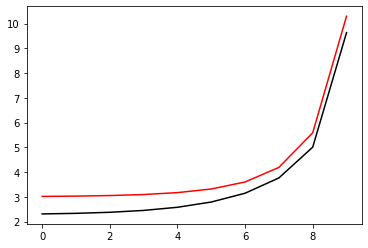

126500 0.2120284295814097 -0.8139608002360101 0.8607588491337406
[1.76710487 1.77446247 1.80167458 1.86058165 1.96850197 2.15780603
 2.49446297 3.12967661 4.50399446 9.52283679]


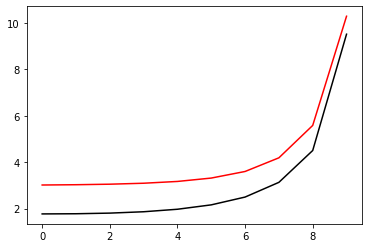

127600 0.17102143211907803 -0.819610385924229 0.845346344806998
[2.04171513 2.03837974 2.04063731 2.0522064  2.07418798 2.1110452
 2.18482396 2.41849129 3.45862992 9.43207295]


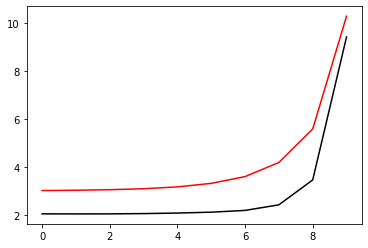

128700 0.04937832472975718 -0.839516993950819 0.8256015670688118
[2.12904451 2.12849592 2.13095079 2.13914256 2.15766951 2.19697743
 2.28746142 2.5362664  3.52261732 9.51317305]


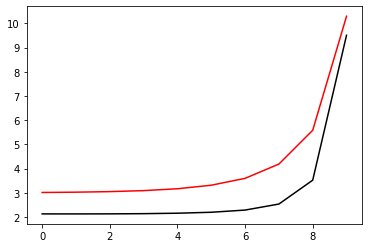

129800 0.05225564994216767 -0.840802100543105 0.8258667076031715
[2.21899296 2.23095819 2.25232188 2.28835351 2.34764294 2.44601119
 2.61336861 2.93693753 3.91443101 9.46712633]


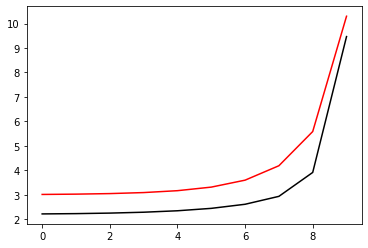

130900 0.04433864251614047 -0.8349718598156222 0.8319391880981538
[2.26424648 2.27741166 2.30849573 2.36816942 2.47016253 2.63642259
 2.90760643 3.37362625 4.41746749 9.51836064]


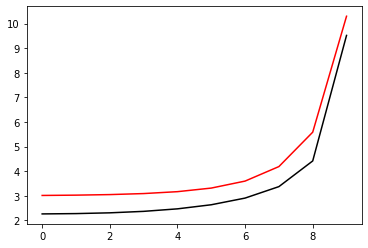

132000 0.06484341903950483 -0.8211545714979553 0.8367763370562444
[2.47407926 2.47706466 2.48826591 2.51373907 2.5595983  2.63518166
 2.7654213  3.05685168 3.99220215 9.49716975]


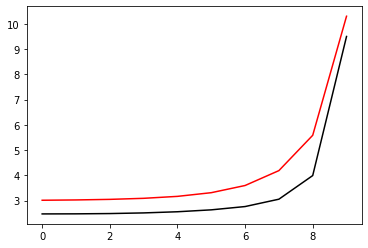

133100 0.0545993607775601 -0.8253455950838986 0.8355955480525067
[2.42928756 2.43465187 2.45036142 2.48250007 2.54206159 2.64945818
 2.84641704 3.23685727 4.25740698 9.48687994]


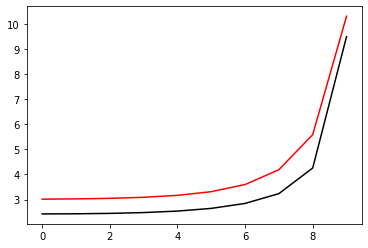

134200 0.26361948301209354 -0.8350913615329478 0.8560147765490288
[2.03779638 2.06484944 2.09862907 2.14487682 2.21377249 2.32473511
 2.51757203 2.89265088 3.88550016 9.49046993]


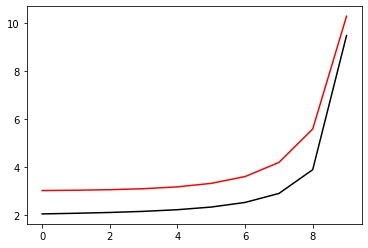

135300 0.190613916580889 -0.8373978562662386 0.8688759311644558
[1.89132097 1.90612314 1.93383778 1.97395635 2.03437851 2.13428887
 2.31559706 2.6850986  3.68635794 9.38433365]


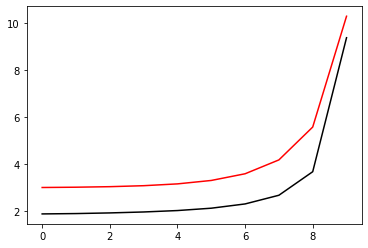

136400 0.03657851375476501 -0.8346889297226247 0.8490683418181105
[2.39791727 2.39127168 2.38384405 2.37724274 2.37028147 2.36693801
 2.39203394 2.55561421 3.3605832  9.42439795]


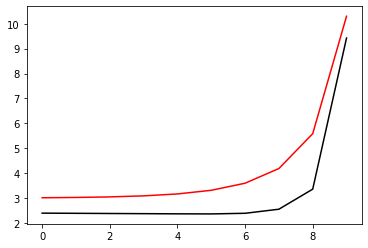

137500 0.03392694794822888 -0.8388688377939 0.8444035831294568
[2.42728057 2.42738364 2.42679424 2.42758959 2.43361745 2.45257979
 2.5092549  2.70125664 3.5256831  9.43498076]


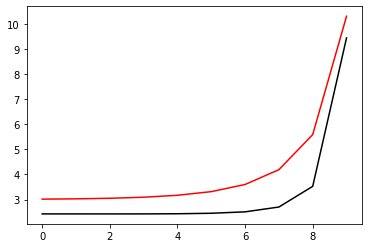

138600 0.04392370708850752 -0.8408124628162738 0.8431000789851494
[2.41516563 2.41824792 2.42542695 2.43834672 2.46143765 2.50548049
 2.59843107 2.834526   3.69843186 9.42472078]


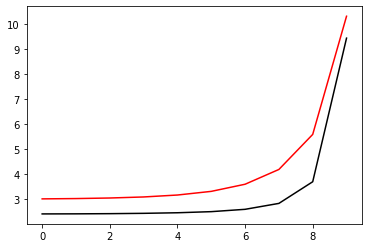

139700 0.04014672279548335 -0.8472740542529811 0.839606816627735
[2.35274767 2.36105201 2.37679929 2.4024468  2.44281251 2.50871857
 2.62595955 2.88036775 3.73843525 9.45177952]


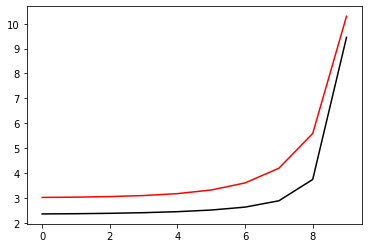

140800 0.05409340349320663 -0.8489281639725085 0.8386428711122484
[2.27080488 2.27451437 2.28448411 2.30554565 2.34446789 2.41458256
 2.54807947 2.84500346 3.7815296  9.52160131]


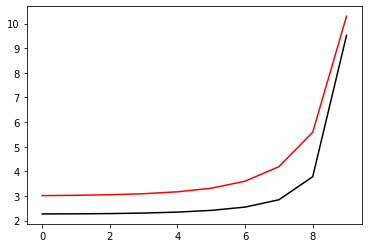

141900 0.0385982709526165 -0.8524582909773338 0.8391700623544741
[2.15620521 2.16668464 2.1967332  2.25641663 2.36286488 2.54577197
 2.85895663 3.41171407 4.60071706 9.5363655 ]


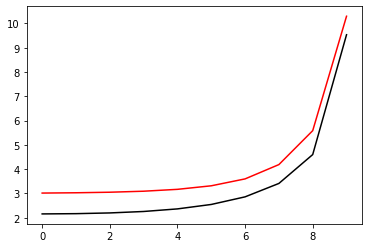

143000 0.06507739963157363 -0.8351183649468696 0.8495054512495658
[2.43187828 2.45688986 2.50376003 2.57772414 2.68815136 2.84981103
 3.08734845 3.48075015 4.50762316 9.50977934]


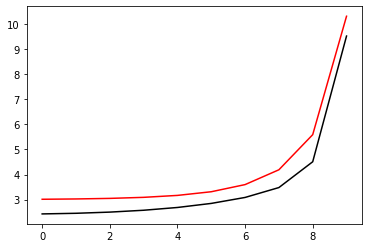

144100 0.05407276035932508 -0.8382335727193968 0.8474877542018475
[2.39713342 2.41237746 2.45016538 2.51697928 2.62313346 2.78835841
 3.05590384 3.54144563 4.6731522  9.57206637]


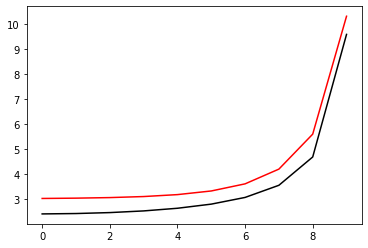

145200 0.0545778492504208 -0.8416086701904287 0.8459834240683937
[2.37398717 2.38897696 2.42471737 2.49047568 2.6032616  2.79399111
 3.12285604 3.72148958 4.99648868 9.48904458]


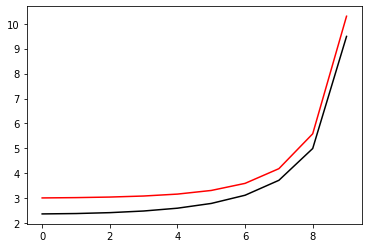

146300 0.16386889739940277 -0.8343722394585372 0.8557754368837386
[2.12895951 2.14107951 2.16885571 2.22547219 2.33379673 2.53247906
 2.88303985 3.44088984 4.60623609 9.54935438]


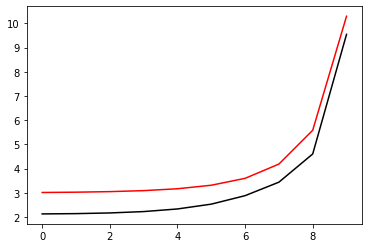

147400 0.12038621322344947 -0.8441425108147013 0.8473120336125775
[2.2076062  2.19373548 2.166399   2.12494172 2.07278803 2.04096536
 2.14457529 2.56133048 3.68022922 9.44235073]


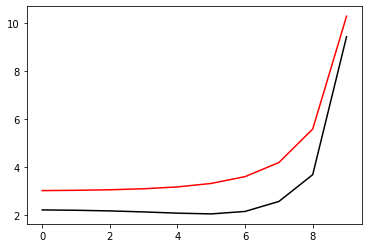

148500 0.053643046638179155 -0.8313855314329075 0.8500524440403885
[2.45252663 2.45101142 2.44093118 2.42081078 2.39617886 2.3790189
 2.38961503 2.56880099 3.57795283 9.38287084]


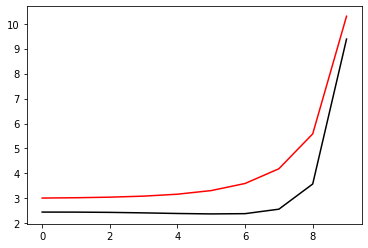

149600 0.04396986604897005 -0.8389471956526701 0.842247373760001
[2.45532832 2.45369632 2.4495743  2.44356765 2.44147013 2.4599075
 2.53438682 2.75061704 3.70223267 9.44646988]


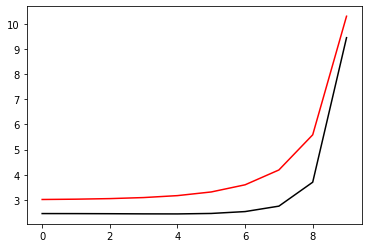

150700 0.0444663592046758 -0.840932721199035 0.8419302538259137
[2.3649625  2.37016438 2.38059666 2.39945605 2.4365352  2.51541286
 2.68378753 3.01717918 3.95276789 9.60389215]


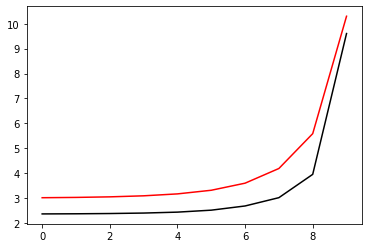

151800 0.05441146264061107 -0.8473919634571371 0.8416375467249558
[2.17750054 2.18531245 2.20133537 2.23097993 2.2851732  2.38740235
 2.58029301 2.92304639 3.8229559  9.47668056]


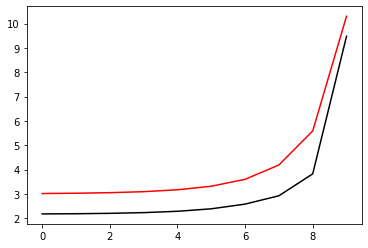

152900 0.04149544917652852 -0.8500037687041277 0.8376407243061473
[2.18232461 2.18655278 2.20257662 2.23551113 2.29641478 2.40717494
 2.61256118 3.01177643 3.99789171 9.47264953]


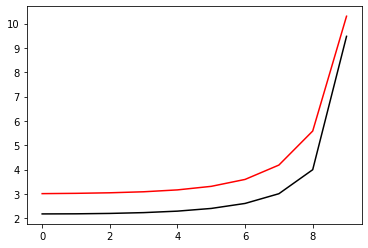

154000 0.07661116706374173 -0.8461173020351523 0.8397398207567883
[2.36294577 2.36348021 2.37171673 2.3961887  2.44959809 2.55330866
 2.75053772 3.15033478 4.17838823 9.50590981]


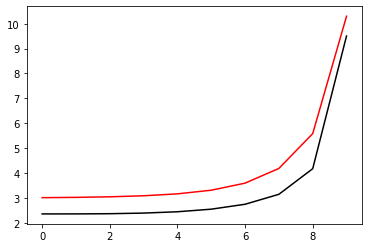

155100 0.3035885270511943 -0.8317679795644715 0.8644970899060417
[1.94890834 1.96146373 1.98952388 2.04109748 2.13232113 2.2918832
 2.57481258 3.10389364 4.29647007 9.49407262]


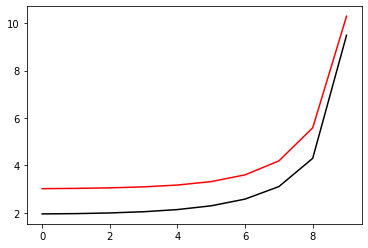

156200 0.06595228002676758 -0.8285614843812017 0.8493463578834143
[2.47574739 2.48955458 2.51243283 2.54402192 2.5861279  2.63841679
 2.69594076 2.79794294 3.58473005 9.47259949]


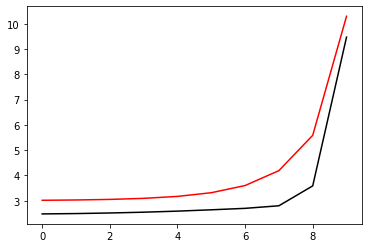

157300 0.04724036654841607 -0.8366905145094994 0.8425405158293259
[2.49672961 2.50715371 2.53036047 2.56923182 2.62963345 2.72374282
 2.8716338  3.09807078 3.85342578 9.39280005]


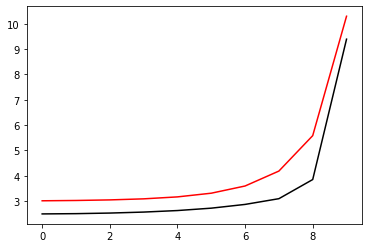

158400 0.03786663732724705 -0.8431014528262457 0.8425444902403494
[2.29031007 2.30562968 2.3375538  2.39036652 2.4738682  2.60658644
 2.81982482 3.16897717 4.03985415 9.4421763 ]


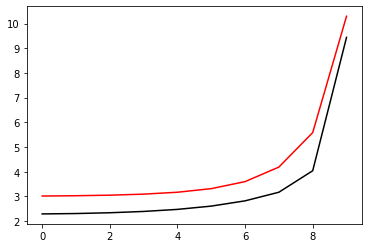

159500 0.02522621524449511 -0.8466798751498713 0.8426169249982945
[2.25031973 2.26087772 2.29395767 2.35887391 2.47154323 2.65925107
 2.97064329 3.50308997 4.60258806 9.54820578]


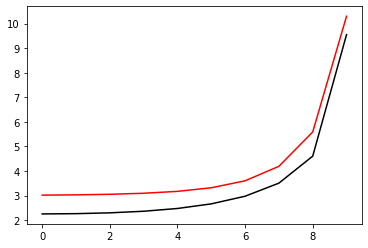

160600 0.19280307844959377 -0.8336095618957908 0.8599933095989891
[2.07527369 2.08436165 2.11495413 2.1731767  2.27005994 2.42901446
 2.70619248 3.26716017 4.52786198 9.48959027]


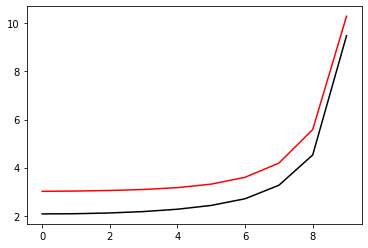

161700 0.21465428904777056 -0.8551965657125492 0.8261171952113853
[2.66699229 2.66112651 2.65505769 2.65275031 2.65413914 2.65844837
 2.68953056 2.91351897 3.92014569 9.40979706]


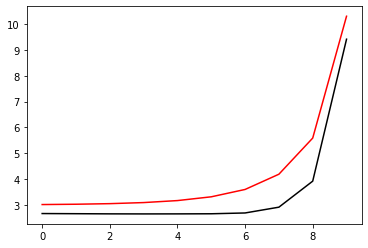

162800 0.044011595656798984 -0.8395450958986541 0.8434324250816575
[2.53832977 2.53217954 2.52035357 2.50360672 2.48389087 2.46989734
 2.49791435 2.71492865 3.73632972 9.48815544]


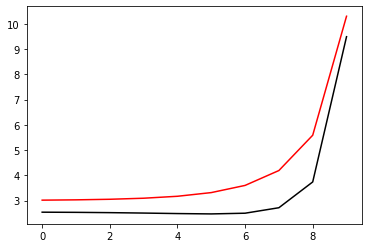

163900 0.044293506921860105 -0.8406106933596328 0.844469578601678
[2.4282626  2.42238104 2.41710165 2.41636292 2.42897566 2.47481348
 2.60036172 2.92395554 3.97952512 9.45063954]


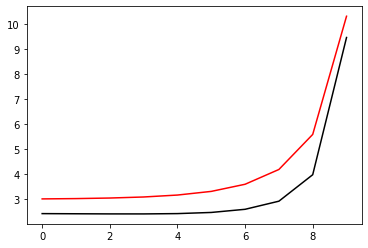

165000 0.06762138756600453 -0.8455304692613806 0.842175997216669
[2.28776132 2.28775825 2.29907595 2.33009488 2.39614618 2.52677041
 2.78274385 3.29114742 4.46538483 9.53230549]


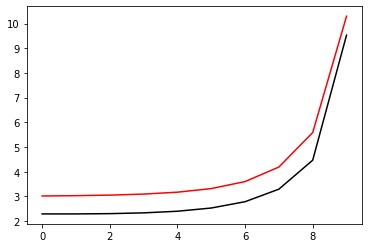

166100 0.03250392350236304 -0.8509622577208092 0.8412715140054196
[2.14219345 2.14418437 2.16185154 2.2107407  2.31476635 2.51349282
 2.87863325 3.55050078 4.91132991 9.52060687]


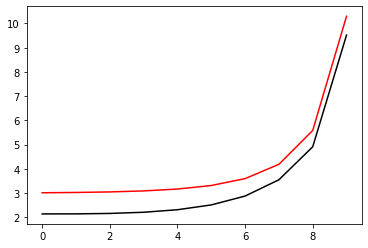

167200 0.40779403233168837 -0.8029184431287688 0.893944879778599
[1.82875304 1.84149519 1.86781465 1.91150258 1.98354794 2.10136676
 2.30678053 2.79846289 4.13672305 9.54107323]


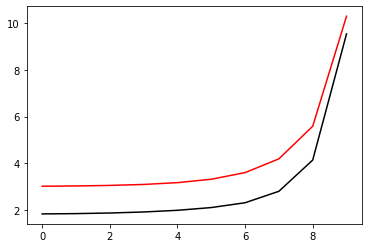

168300 0.27350669106810677 -0.8244875298825531 0.8766754225953888
[1.82159069 1.8337647  1.8571327  1.89339947 1.94749529 2.02995946
 2.17681493 2.56939772 3.87067874 9.45270725]


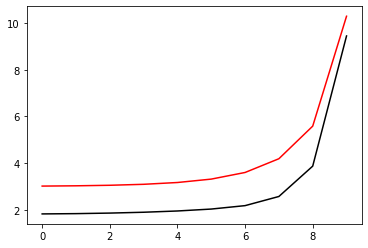

169400 0.05496329401969599 -0.8538277239790089 0.8401242231466922
[2.20931626 2.21361567 2.22466378 2.24211462 2.26231048 2.27770441
 2.28111429 2.36294273 3.36518032 9.42454442]


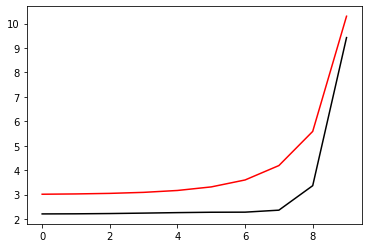

170500 0.2043318629099977 -0.8226016528709361 0.8728153088964762
[2.04740883 2.04761997 2.04877767 2.05248195 2.05684803 2.0589907
 2.06516527 2.16663594 3.06184379 9.4492375 ]


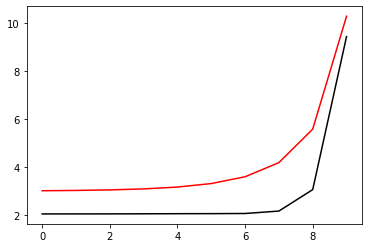

171600 0.13462590622686935 -0.8444665122600427 0.8548290172031877
[2.13200533 2.13815292 2.14249687 2.14449387 2.14257037 2.13371601
 2.12337644 2.19569651 3.00404581 9.38224505]


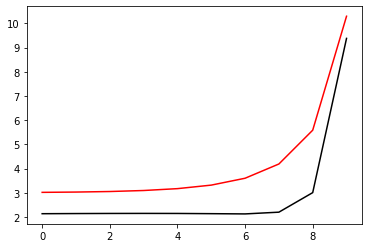

172700 0.049173629650044494 -0.8554771619633871 0.842312334148361
[2.21181746 2.21505984 2.22328767 2.23672565 2.25684662 2.28904416
 2.35283318 2.5385382  3.41761573 9.35913331]


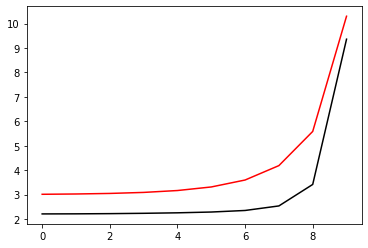

173800 0.04870705489333921 -0.8602120874849215 0.8392316402912869
[2.28393816 2.29369325 2.31375343 2.3480776  2.4032045  2.49207337
 2.64390126 2.94853936 3.89519641 9.48043238]


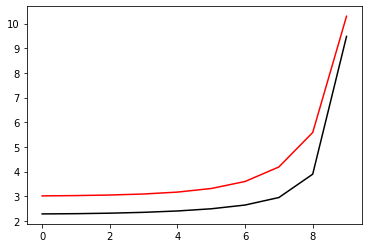

174900 0.0444179206823093 -0.8449300168196483 0.8454458200626053
[2.40091243 2.41225266 2.43414484 2.46410655 2.50010298 2.5379089
 2.5713317  2.66225558 3.41621163 9.41506061]


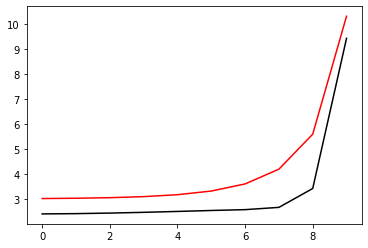

176000 0.08202113987795731 -0.8470134838412235 0.8449554004000962
[2.3726319  2.38034574 2.39910337 2.43158755 2.48205877 2.56145398
 2.70279954 3.00536194 3.81876601 9.50929053]


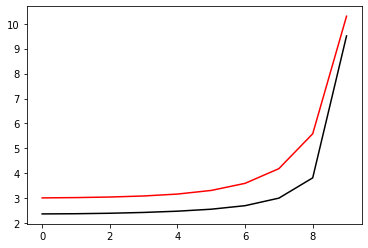

177100 0.05154684023929864 -0.851034770141353 0.8468119616358165
[2.19832393 2.20946914 2.23320691 2.27403066 2.34198965 2.45858575
 2.67073944 3.07420937 3.95359614 9.44132442]


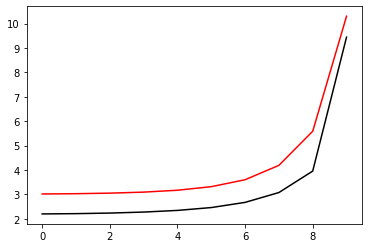

178200 0.05754645742663736 -0.8580135521134413 0.8436232563414412
[2.18104554 2.20133317 2.24413709 2.31994726 2.44732912 2.65927438
 3.01329902 3.60715807 4.70860411 9.54509257]


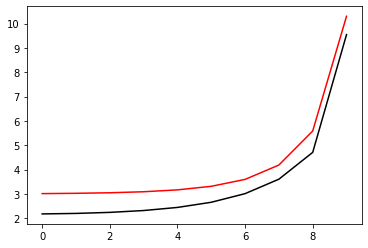

179300 0.22271760218805808 -0.8322049454349617 0.8721538713902979
[1.86510132 1.86927503 1.88545565 1.92172766 1.99736721 2.14866965
 2.44477484 3.01231207 4.16205257 9.46669125]


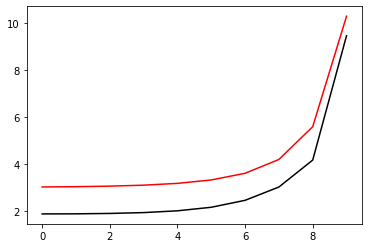

180400 0.04340388961288558 -0.8487336741619874 0.8461959042639018
[2.37523692 2.3749455  2.37471148 2.3779948  2.39047878 2.42362284
 2.51223999 2.79215902 3.76868916 9.46761656]


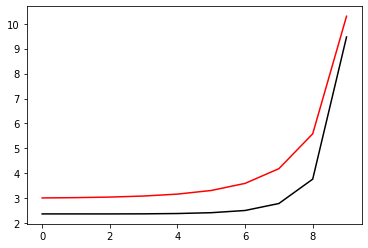

181500 0.03167709943384112 -0.8480964242911533 0.848201810108164
[2.37372888 2.38352719 2.40467153 2.44202796 2.50867461 2.62787632
 2.83907969 3.22677691 4.23831942 9.45256088]


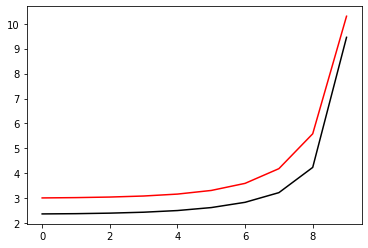

182600 0.04315311913854202 -0.8499794295035852 0.8480477010094382
[2.34014539 2.35137804 2.38097514 2.43729266 2.53504981 2.70234805
 2.98995269 3.49960414 4.61198502 9.56847944]


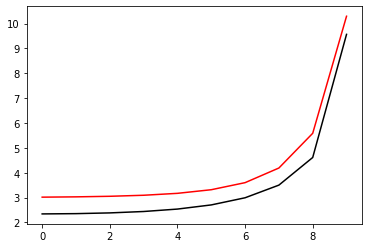

183700 0.16932474440962497 -0.8456289466234514 0.8632635610995049
[2.04330075 2.07003022 2.11362544 2.17750294 2.27005129 2.40632719
 2.61567979 2.99166787 3.98951525 9.4739859 ]


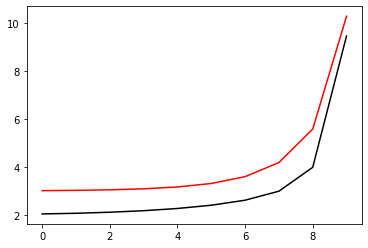

184800 0.031644132540020124 -0.8427733221679388 0.8526943117273269
[2.48163108 2.50556994 2.55291773 2.62455215 2.72568732 2.86688992
 3.06157592 3.33603415 4.13386452 9.52809037]


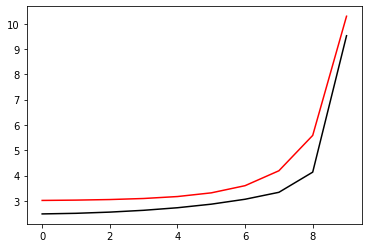

185900 0.04581444030662713 -0.8442526954798222 0.8525834674750118
[2.35655237 2.36145907 2.38545291 2.43286168 2.5109259  2.63386166
 2.836051   3.20643616 4.13390837 9.52214081]


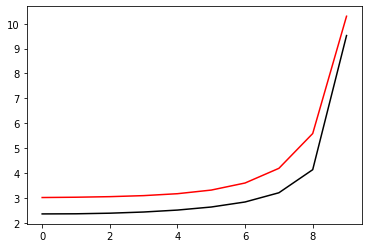

187000 0.05910112880129203 -0.8523983904478808 0.8504221576230496
[2.22445088 2.23525103 2.26857547 2.33547648 2.45453174 2.65771555
 3.00344866 3.60471674 4.80179587 9.52847579]


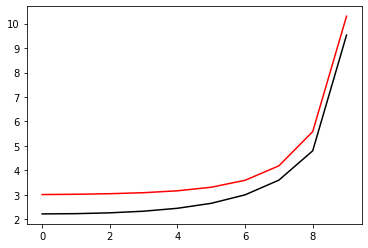

188100 0.0513909829734618 -0.8587596062352989 0.8521795258056518
[2.12467219 2.13726495 2.16664395 2.22421748 2.32656118 2.50140123
 2.80085546 3.34241318 4.5121524  9.59024785]


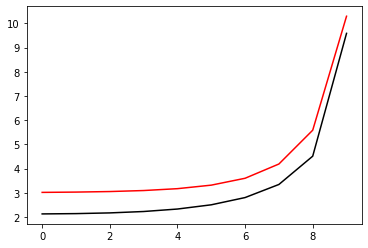

189200 0.10637548671184287 -0.8527989154923558 0.8421153653811332
[2.51554075 2.50161685 2.48054864 2.45596702 2.42830462 2.40171544
 2.40675838 2.58449584 3.46943247 9.37906794]


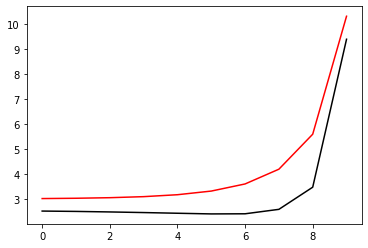

190300 0.045644750083054804 -0.846996502007561 0.8486525427175686
[2.435006   2.43137444 2.4259398  2.42227788 2.42873919 2.46209963
 2.56013204 2.82818276 3.76739827 9.47858166]


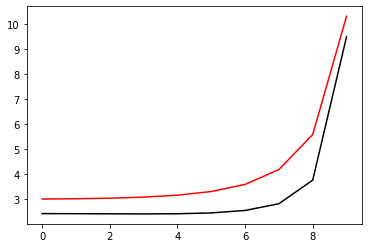

191400 0.18212110748529792 -0.8423132446787206 0.8580253805345396
[2.10416228 2.1065956  2.1170849  2.14131593 2.19270809 2.29556204
 2.49385064 2.88330927 3.91731343 9.4843245 ]


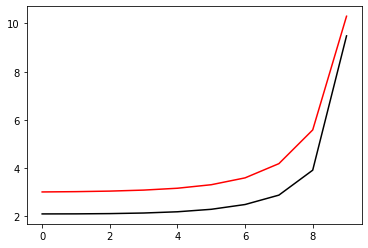

192500 0.06479246843707649 -0.8402837514949689 0.8530693397035708
[2.31531283 2.3109738  2.30624342 2.30108452 2.29508946 2.28127017
 2.2337733  2.20973047 3.04355318 9.37356571]


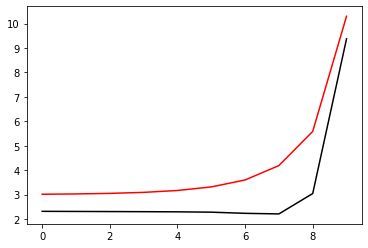

193600 0.040047928271844925 -0.8537436604151564 0.8424816227735704
[2.33591684 2.3283245  2.31765048 2.30674215 2.29689287 2.28762699
 2.28382749 2.35315012 3.16278307 9.45854143]


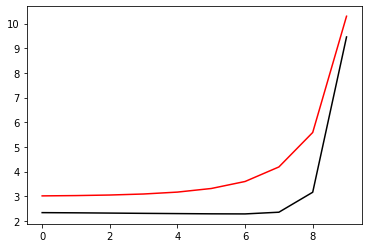

194700 0.04875017082287301 -0.857950454724674 0.8437453301766827
[2.1961827  2.19595727 2.19981333 2.21280822 2.24463432 2.31484075
 2.46333485 2.76910848 3.66666119 9.40044651]


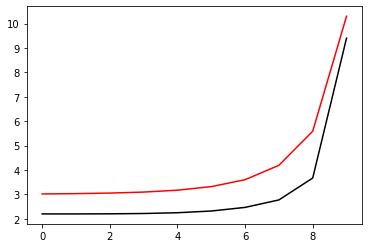

195800 0.05161894527677696 -0.8597365902422076 0.842991222553378
[2.2107654  2.23024081 2.26709327 2.32897832 2.43186725 2.60445224
 2.89291036 3.35302621 4.28448702 9.52659808]


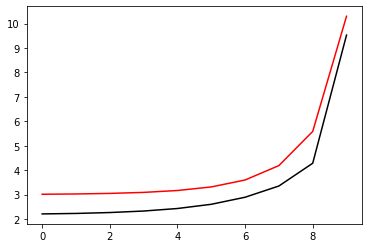

196900 0.03999447557224092 -0.858868267584197 0.8465875718104995
[2.25882617 2.28263132 2.33887414 2.44356584 2.62119761 2.90700499
 3.35091545 4.01331168 5.09716106 9.53631731]


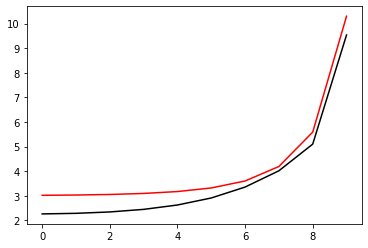

198000 0.06513857805007722 -0.8399607773352564 0.8514932635028344
[2.34427042 2.37410751 2.43753106 2.54747247 2.72107257 2.96818906
 3.26965156 3.65715108 4.78905874 9.54989283]


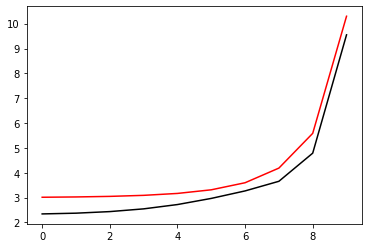

199100 0.052173078388861066 -0.8397263070909279 0.852470297144087
[2.34727371 2.37002994 2.42533471 2.52411076 2.67994012 2.9113316
 3.25763594 3.82922529 4.97174044 9.52935762]


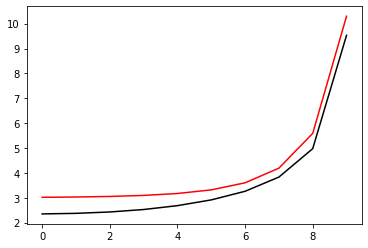

200200 0.10728404587690177 -0.8425675015814595 0.8509805803750184
[2.27595479 2.26568952 2.26753467 2.28979408 2.33909437 2.4197062
 2.54874536 2.85330902 4.03499269 9.46325034]


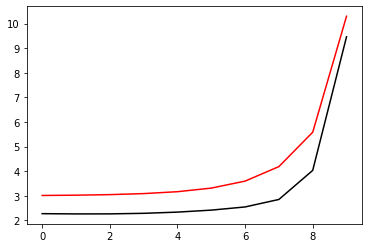

201300 0.039264861418665545 -0.8564721678724264 0.8399060838708187
[2.34636949 2.32349675 2.27950364 2.22167145 2.15743739 2.10185834
 2.10358803 2.32105801 3.44267804 9.43472765]


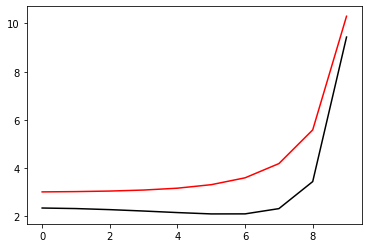

202400 0.04777033168779101 -0.851374054929655 0.8455561834807006
[2.32499805 2.33022492 2.33879598 2.35075586 2.37123168 2.40970594
 2.48851012 2.73273511 3.8216667  9.36729993]


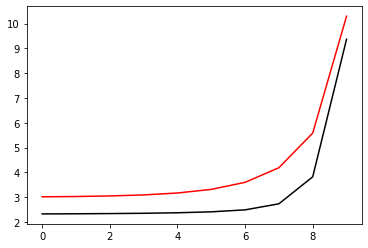

203500 0.025862086693690375 -0.8509363444477208 0.8481390318702622
[2.29538035 2.30628943 2.3351138  2.38787394 2.47397318 2.60796475
 2.81270611 3.16969358 4.26651424 9.49352101]


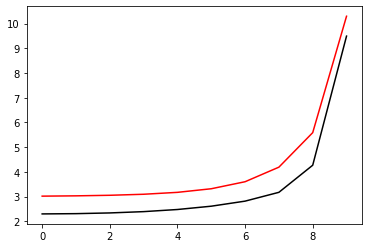

204600 0.10543663707975537 -0.8577129559546911 0.8448744058734644
[2.05970849 2.07673537 2.11805268 2.19927248 2.3440077  2.5903331
 2.99449573 3.61521261 4.84619087 9.53892975]


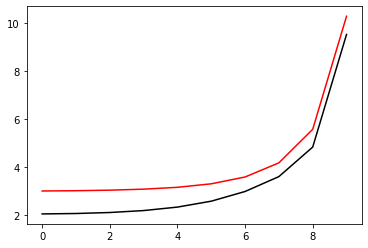

205700 0.06293301776450465 -0.8317655173807966 0.8525757019912492
[2.41127484 2.42388213 2.45189059 2.50539622 2.59933482 2.75346188
 2.96250792 2.85223332 3.88010329 9.43032288]


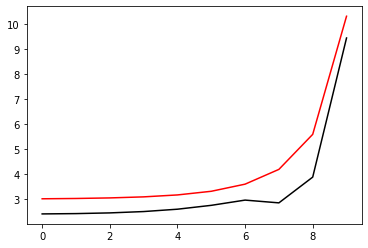

206800 0.0398383124498462 -0.8360018520438344 0.8457205907394364
[2.45535723 2.46613512 2.49305991 2.54501575 2.63560968 2.78021297
 2.96228611 2.94988884 3.9334261  9.4680094 ]


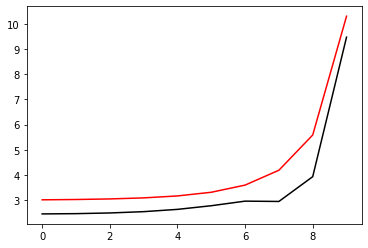

207900 0.053358845533435804 -0.8348599043846853 0.8467232973686206
[2.48615952 2.49713021 2.52440221 2.57608811 2.66365765 2.79821887
 2.96741199 3.08237474 4.03296824 9.59423344]


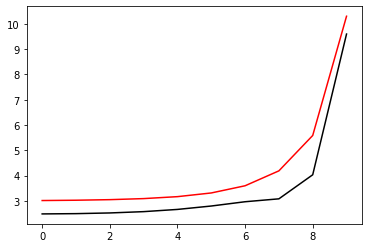

209000 0.06560339997463117 -0.836051976773819 0.8458344561214475
[2.44355093 2.45453152 2.48039794 2.52780796 2.60611625 2.72609169
 2.89602966 3.14075848 4.09261882 9.4892102 ]


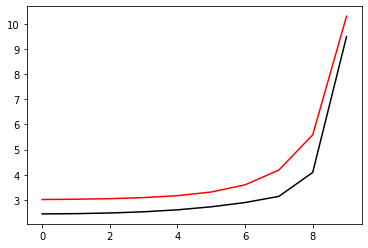

210100 0.05412975048816906 -0.8360596711518679 0.8466482263857243
[2.46154936 2.47398079 2.50075044 2.54570983 2.61796872 2.73219756
 2.91595552 3.25098819 4.23467694 9.48393316]


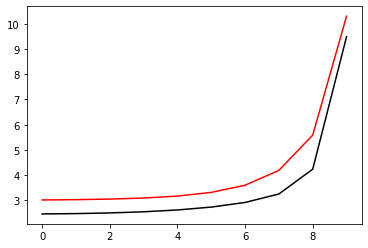

211200 0.06573399067812821 -0.8424903957942758 0.8372290767909903
[2.44080899 2.42632143 2.41545389 2.41634995 2.43513187 2.48301363
 2.58769872 2.84341334 3.72078672 9.36177401]


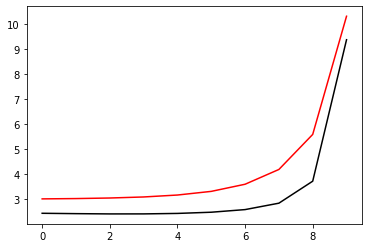

212300 0.053059356953228165 -0.8377673080859862 0.8429266515443856
[2.44832284 2.44717244 2.44779648 2.45662807 2.48505403 2.55171459
 2.69367983 3.01442241 3.97941017 9.46726526]


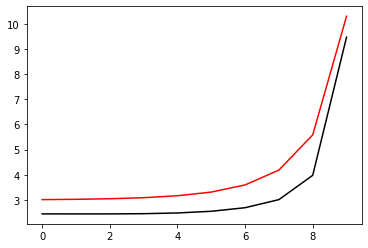

213400 0.033978569611818464 -0.8405811520648551 0.8414737861822259
[2.40362316 2.41283825 2.42831259 2.45808932 2.51389516 2.61838037
 2.8182335  3.22932754 4.30945274 9.4936023 ]


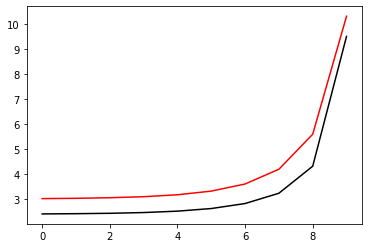

214500 0.025036656250676474 -0.8456836624809168 0.8379249733919459
[2.22556811 2.23952315 2.27347892 2.3393351  2.45532544 2.65577501
 3.00624778 3.63977699 4.95083125 9.55996707]


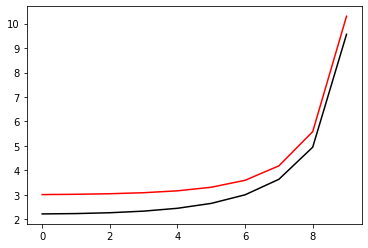

215600 0.10758573994875666 -0.8272891629424982 0.8470768709429073
[2.33616539 2.33489215 2.34455201 2.37054293 2.41938273 2.49641824
 2.58633537 2.61804036 3.73705216 9.46938444]


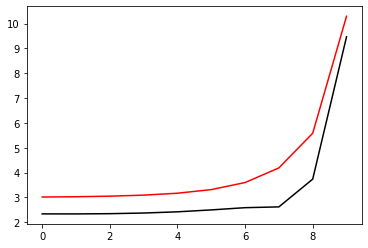

216700 0.06215719631548052 -0.8276044261311483 0.8344593649926024
[2.5688021  2.55487461 2.53848877 2.5281214  2.52591254 2.52476585
 2.50024442 2.44728695 3.39764709 9.36408567]


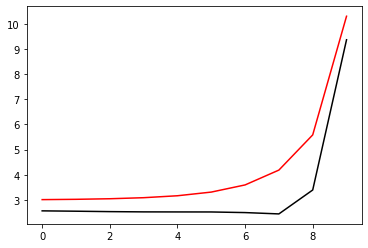

217800 0.04216567625485764 -0.8271804010105666 0.8378460218186722
[2.496165   2.49644705 2.4974904  2.50162135 2.51251263 2.53191108
 2.55910854 2.64017211 3.55700615 9.44253244]


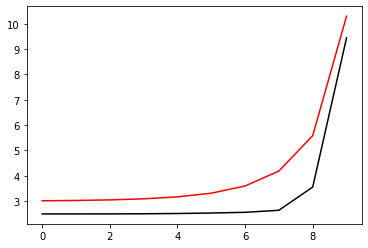

218900 0.2061137346784857 -0.8457680392654666 0.8109200468032447
[2.64360899 2.63849745 2.63239198 2.62406214 2.61070981 2.58715902
 2.54979566 2.56442507 3.32045474 9.41525907]


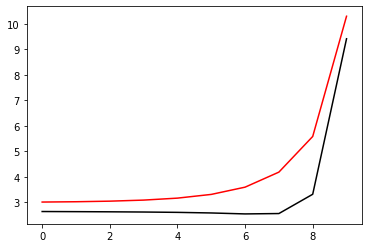

220000 0.0658091883006854 -0.825064547022369 0.8348394642658795
[2.60346796 2.59854377 2.58791451 2.56996372 2.54163341 2.49874281
 2.44619175 2.46220601 3.17937979 9.38693028]


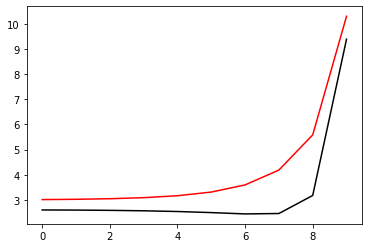

221100 0.06433908826471794 -0.8292009906106642 0.8342642551491627
[2.48296261 2.48193249 2.47865703 2.47209708 2.46133891 2.44819027
 2.44789963 2.54665492 3.3024949  9.40338684]


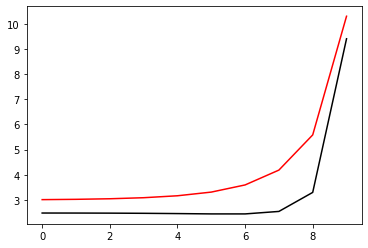

222200 0.0612755186548594 -0.8302337226737581 0.836038288936529
[2.31661572 2.32151897 2.33024104 2.34640793 2.37657823 2.43446594
 2.55329646 2.83288514 3.76735582 9.4908235 ]


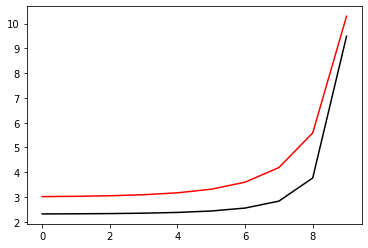

223300 0.05889479012875113 -0.8202017963797212 0.8353073023186472
[2.60293948 2.58583103 2.55775355 2.51838522 2.46015965 2.36123705
 2.17542909 1.92356396 2.60843643 9.38950823]


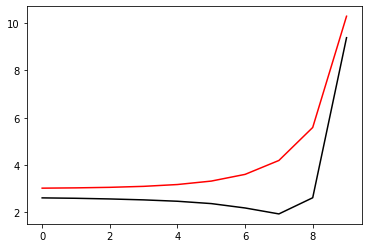

224400 0.05578709987441505 -0.8346166486614691 0.8273468934724291
[2.37974755 2.37044702 2.34611529 2.30071157 2.22456446 2.10070119
 1.91213558 1.71515845 2.27777493 9.32030269]


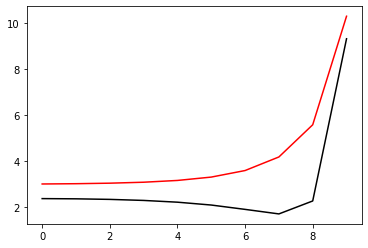

225500 0.1397273353267755 -0.8183495924117639 0.8471882562853094
[2.27934493 2.28543138 2.29135446 2.29015541 2.27509977 2.2360879
 2.15926911 2.07801554 2.63759045 9.271688  ]


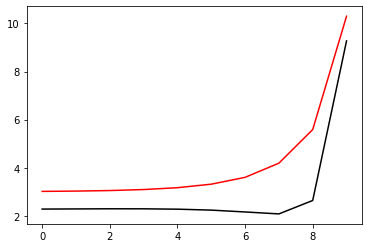

226600 0.04520586427734504 -0.8390748632151662 0.8300207400824449
[2.27694123 2.27024922 2.25685321 2.23300359 2.19138572 2.12152549
 2.01436654 1.914684   2.43171745 9.33854553]


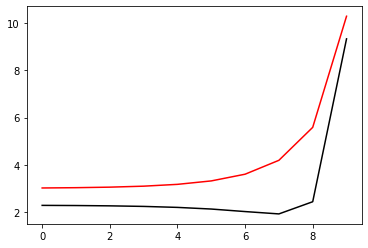

227700 0.046219735312934065 -0.845500957138206 0.8267889597873376
[2.25036643 2.24569235 2.24058541 2.23854345 2.24249089 2.25552342
 2.28210398 2.3609993  3.00200069 9.38594195]


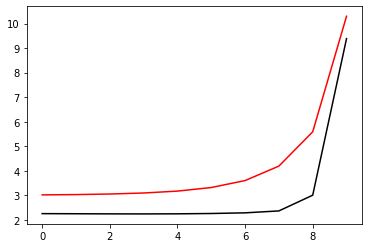

228800 0.05118917266346798 -0.8493061215184896 0.8256175168023119
[2.19443922 2.20362765 2.22367026 2.26057656 2.32206452 2.41961116
 2.56971986 2.80945037 3.55010111 9.4472047 ]


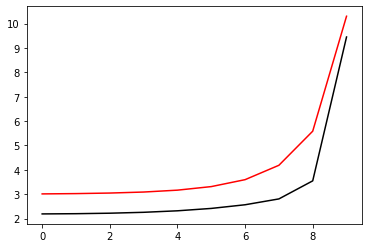

229900 0.041542007788197055 -0.8443614106621257 0.831446607095758
[2.12467858 2.1359649  2.16349976 2.21400927 2.29976612 2.44348704
 2.68325723 3.0645881  3.92836609 9.45974409]


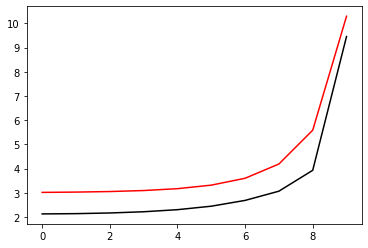

231000 0.19429954024764176 -0.8398538886436887 0.8171596269239242
[2.68261411 2.67525781 2.67163555 2.67621381 2.68352151 2.6699885
 2.58304541 2.46045192 3.19543775 9.40920399]


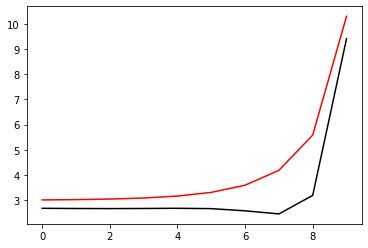

232100 0.06466996572946129 -0.8285999384287672 0.83358499006847
[2.43090347 2.43802285 2.44480802 2.44519393 2.43424168 2.40180996
 2.33582062 2.29671534 3.05264647 9.3936738 ]


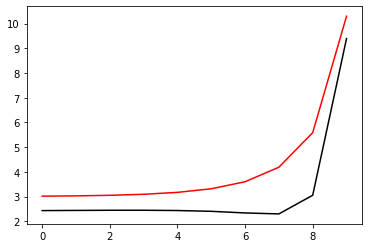

233200 0.05630411856758536 -0.829535746153551 0.8337982989495696
[2.40586978 2.41959796 2.43962496 2.46636728 2.4989542  2.53337257
 2.56227112 2.62457638 3.35226695 9.37011037]


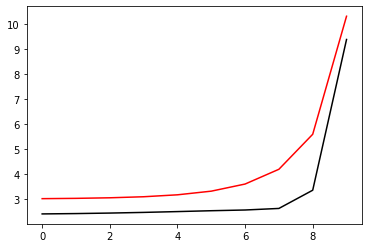

234300 0.08611214675685033 -0.8325800357298287 0.8308613608434947
[2.60471437 2.60794592 2.62763052 2.6638014  2.72053516 2.79944157
 2.89880702 3.05504982 3.77636467 9.45736949]


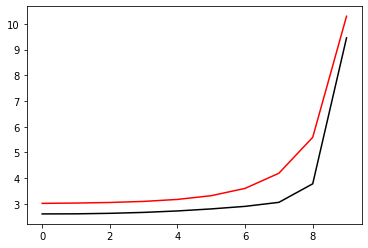

235400 0.03925338571339818 -0.8336412762881928 0.8335364374095209
[2.26745987 2.2705805  2.29382144 2.34280247 2.42374802 2.55269547
 2.75723413 3.10612513 4.00858184 9.49525112]


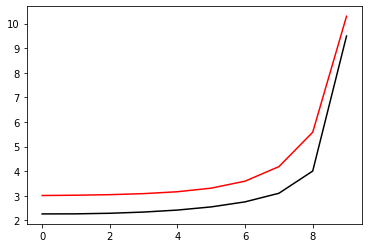

236500 0.2229445441421876 -0.8137354747719974 0.8637487856869039
[1.88601634 1.90065233 1.93689978 2.00544724 2.12252782 2.31401927
 2.62456082 3.137039   4.19989956 9.53839281]


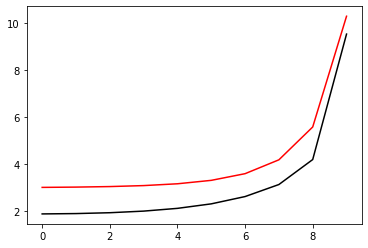

237600 0.02588025681632784 -0.8423343048243557 0.8303042709908905
[2.12024367 2.1382144  2.17339651 2.22770217 2.30864024 2.4272815
 2.60308542 2.90507474 3.77331896 9.42369859]


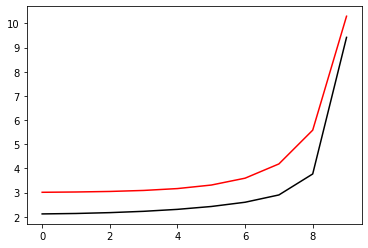

238700 0.031291889076700594 -0.8452105264329576 0.8286799302504113
[2.17516423 2.19661099 2.2417363  2.31833658 2.44006175 2.63265338
 2.93804245 3.39984201 4.3079353  9.51023003]


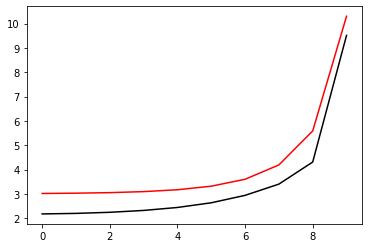

239800 0.2791442914824867 -0.8109501888948603 0.8719120893253607
[1.88389847 1.90063321 1.93898011 2.00718895 2.11857909 2.29649024
 2.58361126 3.06566865 4.07681369 9.41347657]


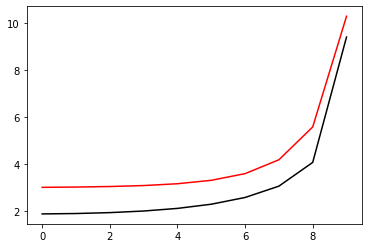

240900 0.05755960844152841 -0.8476886796487393 0.8307175053851206
[2.2413105  2.25784556 2.28687907 2.32838937 2.38466233 2.46067961
 2.57232997 2.79928419 3.57550373 9.46501028]


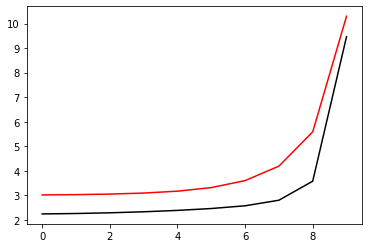

242000 0.09612269437259258 -0.820903162182643 0.8435481773012292
[2.396314   2.4041013  2.41743261 2.43383339 2.44614489 2.44154516
 2.41002179 2.43569749 3.10185979 9.40177904]


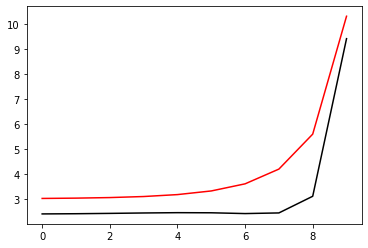

243100 0.19451917046396291 -0.8209497016711133 0.8447751036200393
[2.29735155 2.30365916 2.31260021 2.32303518 2.33209252 2.33723485
 2.3481766  2.43655021 3.11069121 9.53003559]


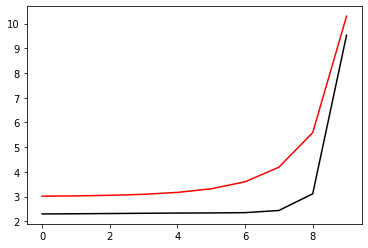

244200 0.05601746608758841 -0.8323835182966146 0.8359683299536113
[2.40623303 2.41867429 2.43738569 2.4610145  2.48874351 2.5217218
 2.56941981 2.68563409 3.31758299 9.40224384]


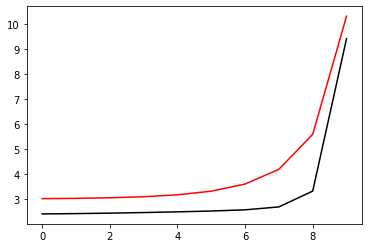

245300 0.05203118120939521 -0.8338209246111952 0.8356623582122509
[2.38710591 2.39554245 2.41370935 2.44379053 2.49128621 2.56628956
 2.69179122 2.938094   3.71340745 9.487009  ]


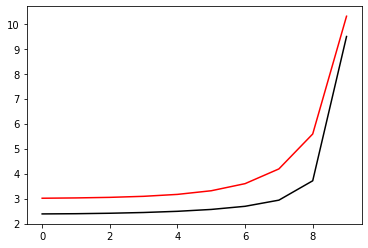

246400 0.03893267351095303 -0.840348532723673 0.8321185341304832
[2.3253236  2.33563094 2.36366571 2.41959649 2.51645196 2.67940117
 2.95045097 3.41000915 4.40173434 9.5027603 ]


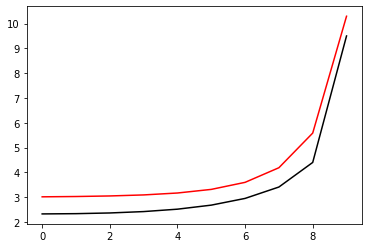

247500 0.14790762646792407 -0.8261665860299281 0.8542022058618295
[1.88469249 1.89733091 1.92724662 1.9786535  2.06390002 2.20447912
 2.43962911 2.8770284  3.91239473 9.46459079]


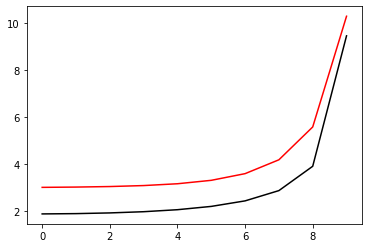

248600 0.026891867764339727 -0.8425803155755748 0.8303295592006515
[2.15676448 2.17038338 2.20126001 2.2530289  2.33331853 2.45697698
 2.65352215 3.00094644 3.90257026 9.48351967]


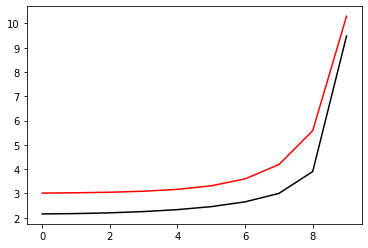

249700 0.11479867512704868 -0.8444047197232494 0.8251938737923751
[2.33675545 2.35188411 2.38713032 2.4458672  2.53585533 2.66961437
 2.86664423 3.20447923 4.08869152 9.47891529]


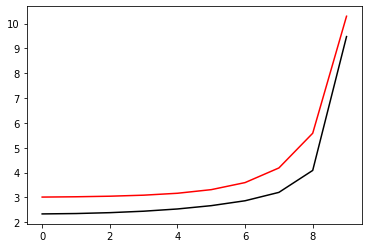

250800 0.0572403753574745 -0.825253865875454 0.8428048881667762
[2.3221051  2.32751063 2.34441355 2.3784608  2.43518637 2.52313929
 2.66682968 2.97298165 3.9067116  9.53226698]


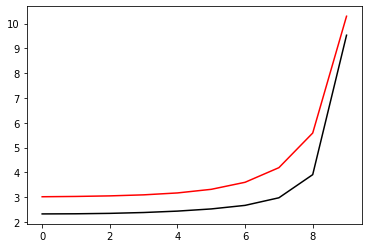

251900 0.29168298083930067 -0.8226446305390592 0.8306579120850281
[2.68663006 2.68921106 2.69354319 2.70120787 2.71055301 2.7132548
 2.69564463 2.70892812 3.40357822 9.35385961]


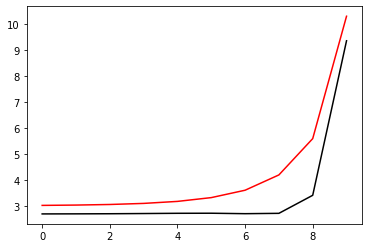

253000 0.23642201116670852 -0.8195454351049478 0.8502446997778559
[2.36962261 2.36073822 2.34305676 2.3208058  2.29119837 2.2444809
 2.16702227 2.10790543 2.70727799 9.35778404]


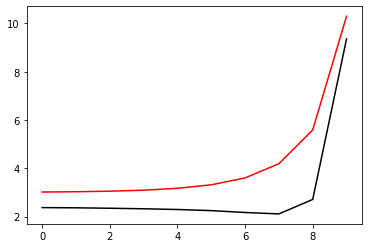

254100 0.06557058632091571 -0.8291693651748498 0.8374607317319388
[2.46233101 2.44708161 2.41719235 2.37595576 2.32170365 2.24544205
 2.13505553 2.0375531  2.57593826 9.35849367]


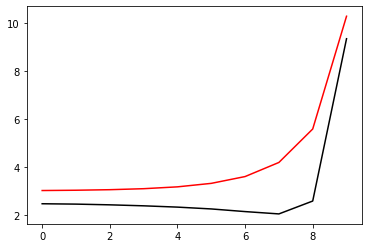

255200 0.06722603813480822 -0.8319080634271867 0.8343474745414423
[2.49890022 2.49949208 2.49285462 2.477364   2.45143509 2.41068803
 2.34993256 2.316465   2.89482922 9.30136821]


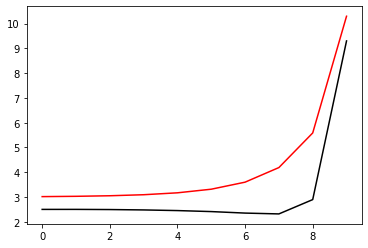

256300 0.05643858924582514 -0.8346935737965276 0.831750377646208
[2.56613036 2.5663704  2.56656379 2.56442971 2.55786348 2.54423359
 2.52536842 2.55507364 3.17685515 9.40345148]


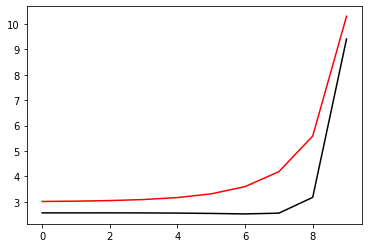

257400 0.03430505557034982 -0.8345571970040082 0.8345781824927224
[2.41654613 2.42605439 2.44268987 2.4641952  2.49032012 2.52201697
 2.56742659 2.68823636 3.39159688 9.41863386]


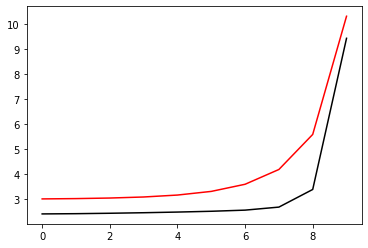

258500 0.2221440841087793 -0.8528526169907764 0.8132162497049631
[2.5946295  2.60031821 2.62258104 2.66150858 2.71912054 2.79345355
 2.86719311 2.94497089 3.59531024 9.42572087]


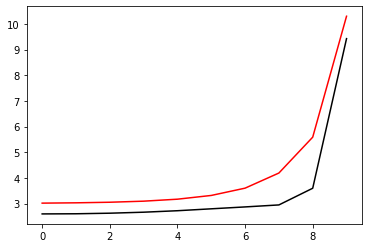

259600 0.05527779030259643 -0.8311611504747612 0.8380585329912218
[2.39601856 2.38730297 2.37036812 2.33988331 2.28067558 2.16535466
 1.97132416 1.82421757 2.52470683 9.35461524]


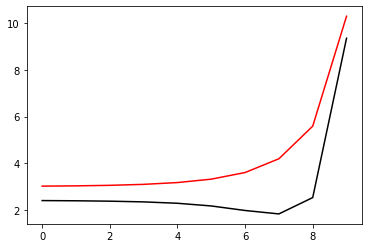

260700 0.053208564105736905 -0.8342238710704196 0.8347767472671335
[2.41270825 2.41577397 2.41819145 2.41304221 2.39046591 2.33560345
 2.23553139 2.15809566 2.79282617 9.28365731]


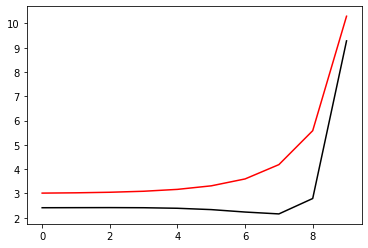

261800 0.12229639133222875 -0.8513855619863716 0.8239633567235273
[2.31753672 2.32289465 2.32966981 2.33522712 2.33401938 2.31783007
 2.2816034  2.28423997 2.94467932 9.37157756]


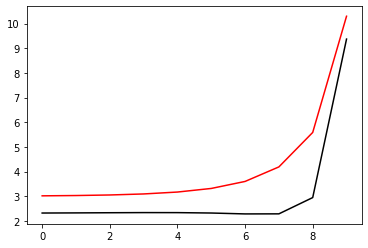

262900 0.05338352155869676 -0.8463817707030559 0.8319002588012706
[2.20531427 2.21005402 2.21820319 2.23122178 2.25112012 2.27972658
 2.32489757 2.44982741 3.20872136 9.40669003]


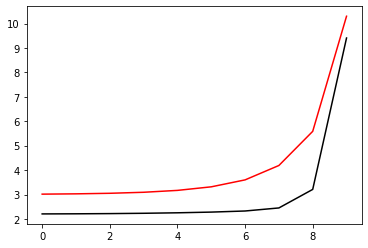

264000 0.06325894534075059 -0.8485532794179569 0.8316348037609297
[2.21445227 2.22787845 2.25478418 2.29942825 2.36984735 2.47936278
 2.64920817 2.93280576 3.77825753 9.57668806]


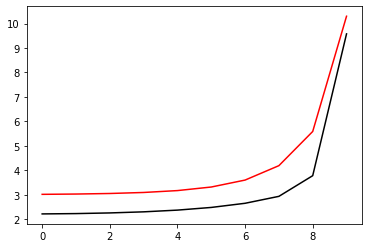

265100 0.14160592952311266 -0.8337256648454928 0.8274107644765027
[2.52022795 2.51693023 2.51668088 2.52003634 2.52623567 2.52924562
 2.48912416 2.28789803 2.90080903 9.37939953]


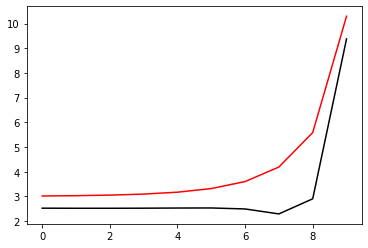

266200 0.07132631175096936 -0.8348499334589592 0.8314573699183826
[2.43153793 2.43926288 2.4488599  2.45853842 2.46630121 2.4636142
 2.41769236 2.26344308 2.85277158 9.39222067]


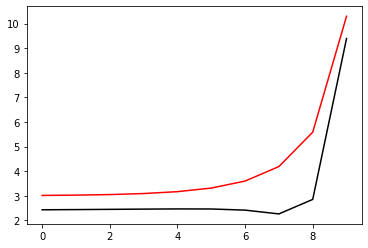

267300 0.05446018161169962 -0.8311544024162711 0.835051800510824
[2.44836369 2.45746601 2.47072324 2.48549749 2.49787134 2.49829153
 2.46154725 2.36519898 2.92348148 9.32671663]


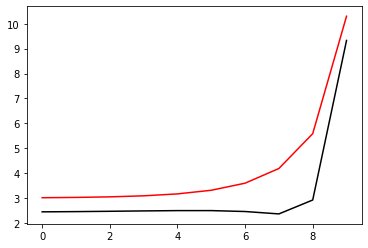

268400 0.034455464319691584 -0.8306976633918824 0.8368359843189674
[2.40781251 2.41696759 2.43397906 2.4573843  2.48549026 2.51347311
 2.53060458 2.54837686 3.14026037 9.42943975]


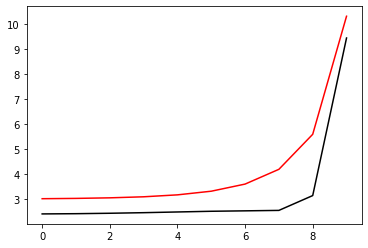

269500 0.034076833255665864 -0.8330214597292098 0.8349108534444223
[2.43656275 2.44494521 2.4637387  2.49410089 2.537533   2.59655385
 2.67559634 2.81083592 3.46582657 9.42014425]


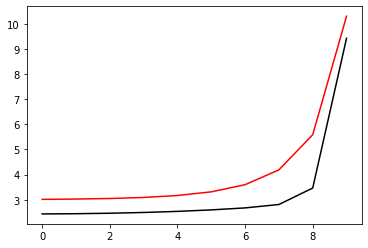

270600 0.04399615353315685 -0.8330412149069475 0.8369567620220069
[2.32018963 2.32945518 2.35212949 2.39436417 2.46343511 2.57164368
 2.74242982 3.03711281 3.84893807 9.47943248]


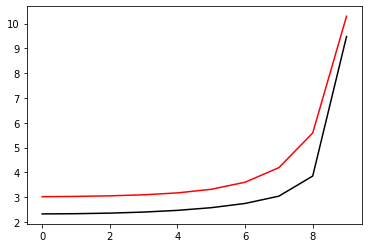

271700 0.042593978604749366 -0.8377135636732724 0.833542177727061
[2.31952237 2.33132103 2.36142263 2.4176931  2.51353579 2.67173809
 2.93267167 3.38646624 4.39532994 9.52007723]


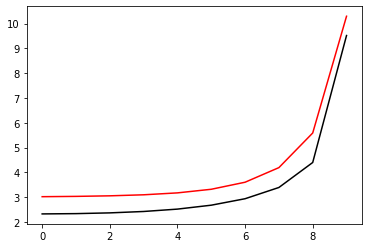

272800 0.044289151782157116 -0.8363945476338188 0.8345302431245852
[2.31567063 2.32517521 2.35131302 2.40410767 2.49796866 2.6575434
 2.93098675 3.42976133 4.54671449 9.52956396]


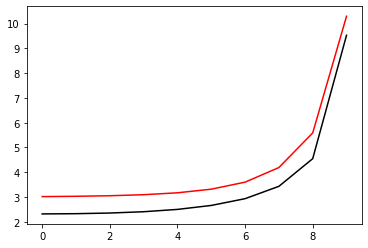

273900 0.13158410987049216 -0.8355795556524552 0.8398100300925424
[2.10368137 2.10343351 2.11605205 2.15637575 2.24511889 2.41675161
 2.73610315 3.3423216  4.65307551 9.47505801]


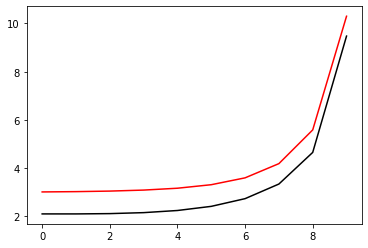

275000 0.06266452176794274 -0.8379930113324061 0.838146449004582
[2.166649   2.17353331 2.20326925 2.26877533 2.39401518 2.62167762
 3.03232047 3.78715373 5.28407231 9.58014586]


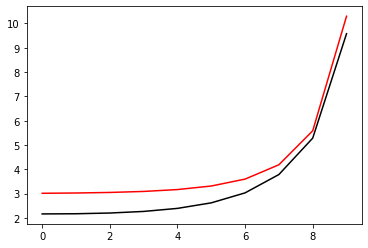

276100 0.035454589154622504 -0.8428418129587889 0.8367427991461299
[2.0698364  2.08420024 2.12708596 2.21422028 2.37413207 2.65821106
 3.16096677 4.06085987 5.7366451  9.61596059]


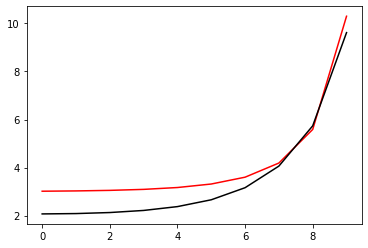

277200 0.550445221719698 -0.8676356941160553 0.812753100645587
[2.13789533 2.16345244 2.21874335 2.31495005 2.47178453 2.72278475
 3.11897731 3.76506021 5.28176588 9.55766649]


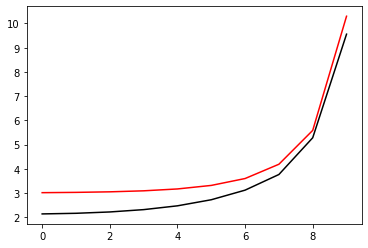

278300 0.17905333713534796 -0.8268847786254099 0.8501294276872725
[2.20172073 2.21599882 2.25030034 2.31082923 2.40687778 2.55636409
 2.80234571 3.28720045 4.66542935 9.53925069]


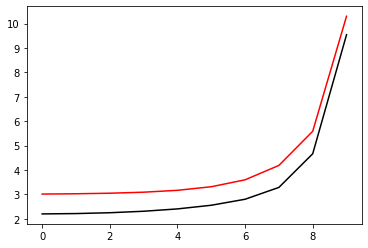

279400 0.10570823604940033 -0.8404673821001378 0.8290771614549373
[2.40279284 2.4035313  2.40725234 2.41866987 2.44184313 2.48310975
 2.57470814 2.87904439 4.11045181 9.50587875]


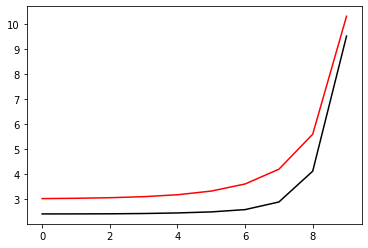

280500 0.028431222627516697 -0.8374691509092248 0.8369284972553384
[2.28302661 2.28773465 2.30082572 2.32754853 2.3783823  2.47425449
 2.66387075 3.08967935 4.36183778 9.50513942]


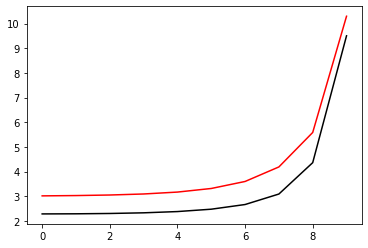

281600 0.04313624297691965 -0.8376430569963075 0.8392145346124403
[2.26283699 2.27439491 2.30422337 2.36056615 2.46086954 2.63780513
 2.95230768 3.53505618 4.86889849 9.50415575]


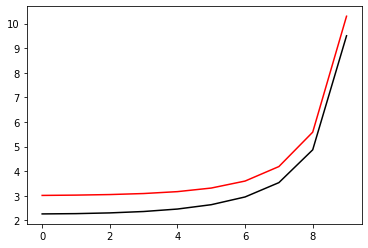

282700 0.03545255434971905 -0.8411795753624263 0.8384040810054273
[2.18928894 2.2038916  2.24350711 2.32217789 2.46267215 2.70727647
 3.13443069 3.89547293 5.37820889 9.59881134]


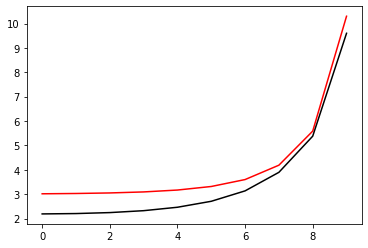

283800 0.04397749729474 -0.8275731742250781 0.8384289572039385
[2.32133899 2.32242933 2.34175006 2.39185504 2.4912182  2.67124804
 2.96003658 3.05443899 4.49025139 9.52405903]


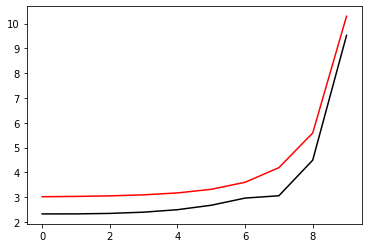

284900 0.0458888750232726 -0.8289666552434583 0.8306351422485962
[2.3801627  2.38432963 2.40433684 2.4548505  2.55525832 2.73340701
 3.00375618 3.19289547 4.57923442 9.52658374]


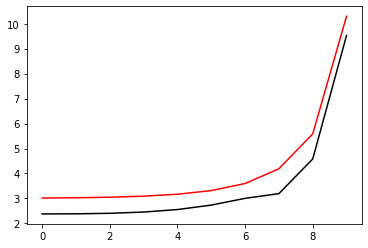

286000 0.0711370394042137 -0.8342534049416197 0.8356133995556816
[2.18965547 2.20145743 2.22944699 2.28235728 2.37690759 2.53687642
 2.77830709 3.0544998  4.39925331 9.50897298]


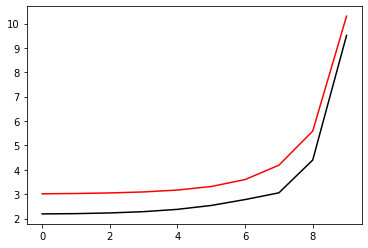

287100 0.045441625439002764 -0.8426811178986398 0.8274889776530481
[2.18742659 2.20205177 2.23803143 2.30651427 2.42562513 2.62169205
 2.92478555 3.37561579 4.73123682 9.4860844 ]


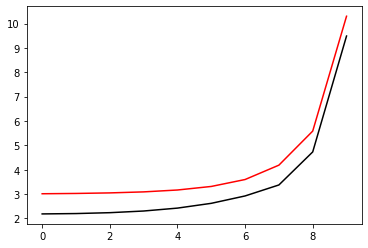

288200 0.42568287924409914 -0.8035679688935483 0.8589084836526257
[2.1809383  2.21077593 2.26126839 2.33886613 2.45465355 2.61500249
 2.76521304 2.8699056  4.23102994 9.5326097 ]


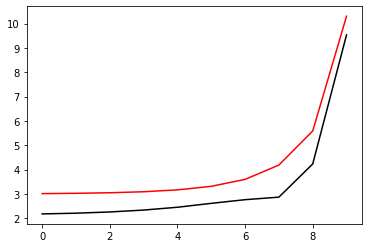

289300 0.03742182826587123 -0.8380559941652298 0.8260391734774816
[2.11458261 2.13148902 2.16857211 2.22823839 2.31208083 2.41012961
 2.49045814 2.64617471 4.02443467 9.44019245]


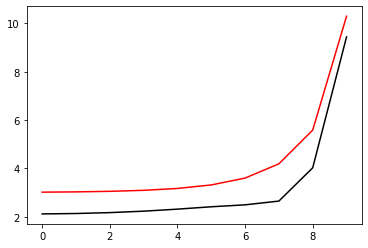

290400 0.05468500324264992 -0.8409199299293266 0.8235692143370196
[2.15796044 2.1720955  2.20634803 2.26540402 2.35408583 2.47883236
 2.65973629 2.9810422  4.20340878 9.52491051]


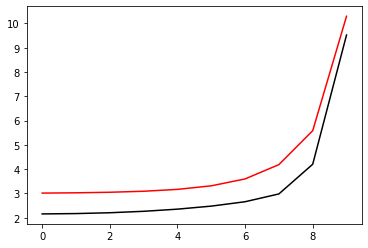

291500 0.033986763364875085 -0.8242211527729094 0.836578119716833
[2.40502272 2.40542321 2.41994917 2.45856861 2.52897069 2.64072764
 2.81267413 3.12938595 4.2005278  9.44504245]


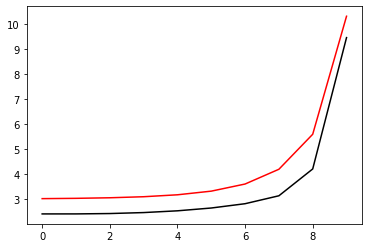

292600 0.043861544988112906 -0.8268142269704876 0.8344104553044226
[2.41759916 2.42599641 2.44709339 2.48811723 2.56045226 2.68229841
 2.8897401  3.28781463 4.3843774  9.50678559]


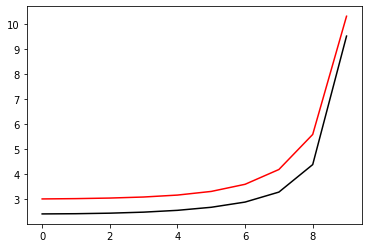

293700 0.05414572692610496 -0.8268465244967431 0.8346432885391083
[2.4225573  2.42959823 2.44888416 2.48694123 2.55513906 2.67524911
 2.89524273 3.34275316 4.49149456 9.53313427]


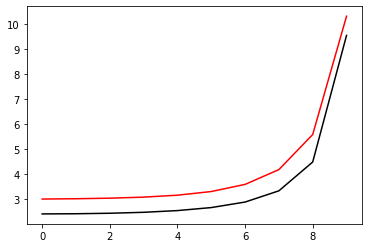

294800 0.07505673135471329 -0.8258019240644997 0.8361225930510077
[2.51382551 2.52603246 2.55137778 2.59755757 2.67754758 2.81545676
 3.06270714 3.55186421 4.75569617 9.53396783]


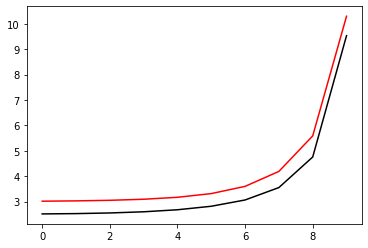

295900 0.04657446903038545 -0.8354719574893227 0.8334634111285868
[2.28641546 2.28424621 2.28471931 2.29262534 2.31344441 2.35989794
 2.47345592 2.80187639 3.87416072 9.46026808]


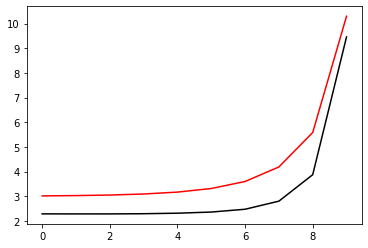

297000 0.07749483807426716 -0.8355476843402138 0.8348171248250424
[2.26400299 2.26772148 2.27818371 2.30106193 2.34624394 2.432328
 2.60101581 2.97704047 4.07433472 9.44313305]


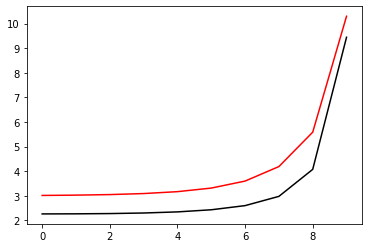

298100 0.05551237156215033 -0.8379491536656921 0.8352407674585496
[2.18497839 2.19213161 2.21248548 2.25423815 2.33174971 2.4712257
 2.72107316 3.18969286 4.34648211 9.50577612]


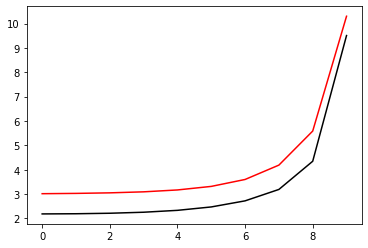

299200 0.058589886443764755 -0.8405953563625806 0.8343031687519447
[2.21526463 2.22389299 2.25240478 2.31286889 2.42346396 2.61478005
 2.93911994 3.50154044 4.71626638 9.42562416]


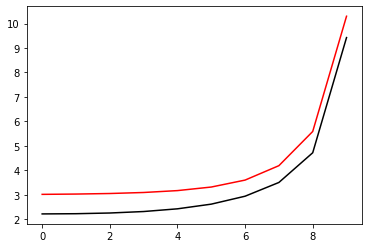

300300 0.0546894569947142 -0.8276126049551852 0.8371281076585427
[2.36953898 2.39143885 2.44061552 2.52795344 2.67423191 2.91188565
 3.24400845 3.46069608 4.72636486 9.51354949]


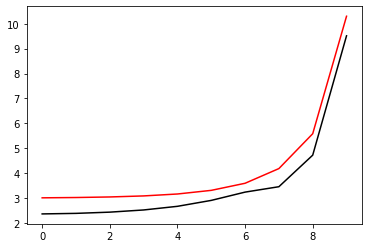

301400 0.034591590502524604 -0.8307580222907065 0.8380952011592835
[2.23964769 2.25974967 2.30501379 2.38373235 2.50830857 2.68977314
 2.93485224 3.35087688 4.6520134  9.54469897]


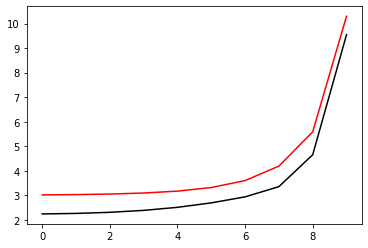

302500 0.12439038707536458 -0.8355238111043733 0.8192532721529907
[2.57734737 2.57918139 2.59525065 2.63482275 2.7030906  2.79708767
 2.89311802 3.03560604 4.14100243 9.4513961 ]


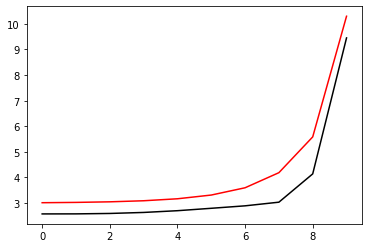

303600 0.03544705870854677 -0.8425636159427637 0.8264573771045249
[2.25925406 2.25158071 2.24564614 2.248882   2.26502495 2.2928436
 2.33793834 2.52088911 3.68668638 9.36328137]


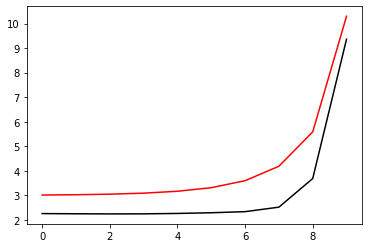

304700 0.04468763057279818 -0.844606449834588 0.826596361148053
[2.18433149 2.17523101 2.16327873 2.1560866  2.16153539 2.18918921
 2.26315451 2.50426971 3.66041272 9.46906271]


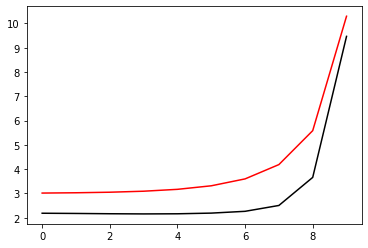

305800 0.05480861761544607 -0.8431972270431797 0.8283615972513656
[2.19200855 2.19237505 2.19512723 2.20575028 2.23292836 2.29363254
 2.42612778 2.74848462 3.89385652 9.45440931]


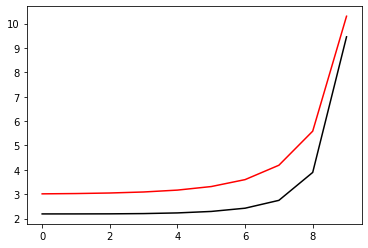

306900 0.04293624411517158 -0.8439009286034859 0.8292688370023805
[2.15893424 2.16737171 2.18779875 2.2266252  2.29768788 2.42749836
 2.66683886 3.12074075 4.28999284 9.56315052]


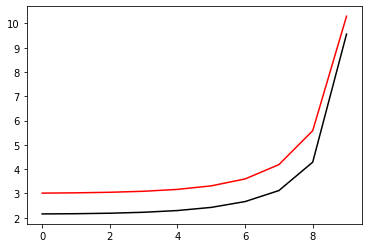

308000 0.23250824540769136 -0.8224822736245534 0.8556000058451396
[2.02054947 2.05516137 2.11323196 2.20102155 2.33408577 2.53824656
 2.85943273 3.39245764 4.54882657 9.55161298]


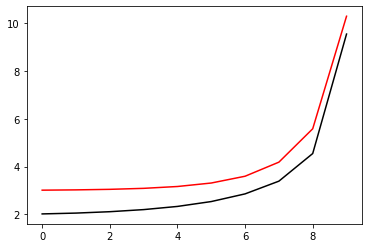

309100 0.3415994739131493 -0.8026596896257194 0.8737576871869892
[1.9054771  1.93468104 1.9782995  2.0160659  2.03611934 2.0428895
 2.09523939 2.40434456 3.48476385 9.4333322 ]


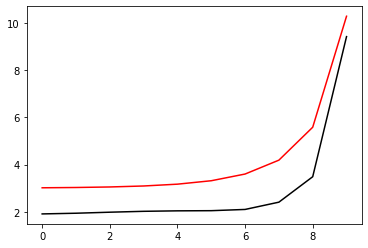

310200 0.19952298980409128 -0.8360120127934361 0.8424328747230251
[1.97524251 1.98384378 1.99968917 2.01210563 2.0058961  1.9723319
 1.94630093 2.14295083 3.1817728  9.48566099]


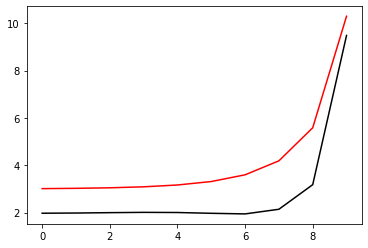

311300 0.0378137617460835 -0.8445835847870249 0.8273072121944803
[2.21722255 2.22504759 2.24101972 2.26219576 2.28381239 2.30247632
 2.33068927 2.47375454 3.38651497 9.40499856]


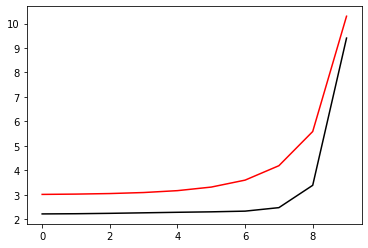

312400 0.054532257902674935 -0.844154873755116 0.8307520427709361
[2.14982113 2.16151041 2.18808188 2.23268492 2.30143197 2.40694855
 2.57262622 2.86157077 3.77680463 9.45698334]


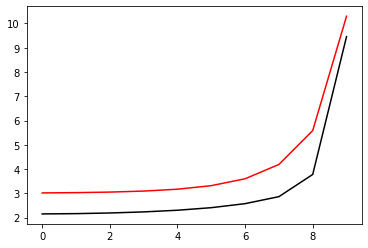

313500 0.024721271779676052 -0.8445128766050704 0.8315010166094082
[2.16410672 2.17944046 2.21691135 2.28512309 2.39643401 2.5710735
 2.84165599 3.27547375 4.22412948 9.41088456]


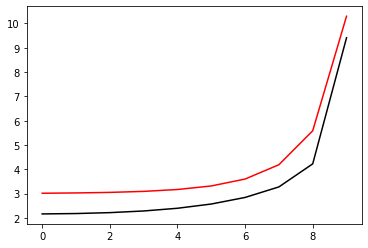

314600 0.04078839909284551 -0.839227918323832 0.8306125625354223
[2.20724916 2.21605972 2.2403461  2.27994896 2.33390351 2.38833882
 2.37837414 2.26358992 3.31971377 9.39692629]


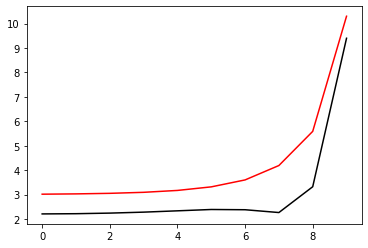

315700 0.047660190272616636 -0.8334061934304856 0.8315014812576128
[2.37411204 2.38259329 2.40366964 2.44301976 2.5026866  2.57378063
 2.6226055  2.63406557 3.5615301  9.44885118]


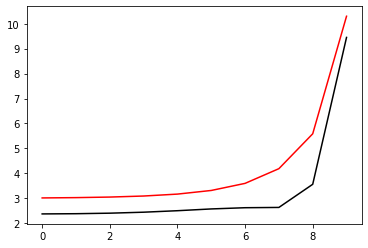

316800 0.0541512921010704 -0.8361572513325962 0.8337444505824702
[2.22968864 2.24059357 2.26347037 2.29932863 2.34987716 2.41485126
 2.49249829 2.62731107 3.53565311 9.47509761]


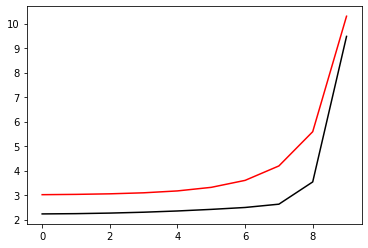

317900 0.04420213478994644 -0.8344545659783839 0.8356060076057608
[2.293031   2.3080681  2.34122244 2.39724906 2.48298202 2.60873783
 2.79218634 3.0929061  4.04402415 9.48127231]


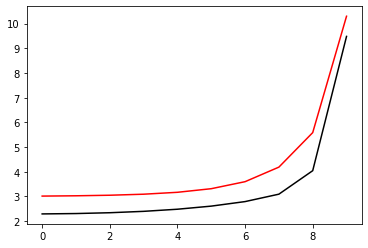

319000 0.07599580813273006 -0.8363967879847581 0.8351554402909481
[2.25257378 2.26286985 2.29325254 2.35240899 2.45347362 2.6185338
 2.8890567  3.35901379 4.4426294  9.47498241]


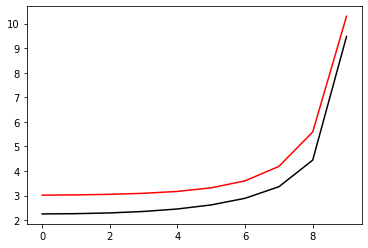

320100 0.2608428825564055 -0.8427737399773911 0.834990208755837
[1.93998419 1.95640678 1.99606283 2.06936002 2.19469958 2.40299181
 2.74970794 3.34825138 4.58839037 9.48770729]


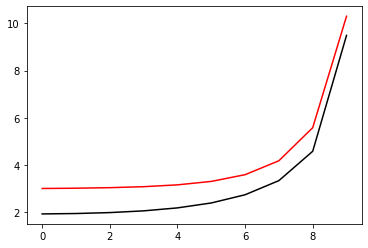

321200 0.054644622454303286 -0.8271121996164095 0.832864778102753
[2.29578148 2.31065732 2.34470569 2.4037376  2.49495647 2.62071885
 2.77378912 3.01987376 4.07101868 9.4819569 ]


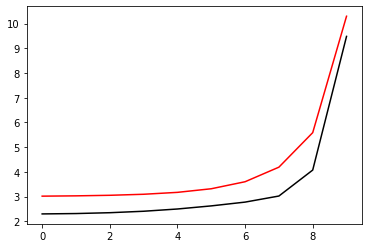

322300 0.036089008626006246 -0.832255861597528 0.8308315089947523
[2.23605341 2.24928213 2.28118439 2.33873747 2.43219039 2.58164354
 2.84253672 3.31169771 4.34224027 9.4866098 ]


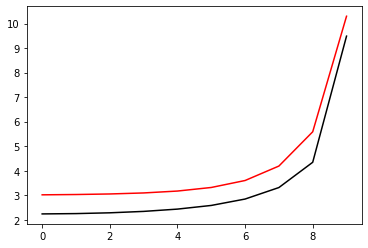

323400 0.24461721787739057 -0.8222375258159186 0.8478801264963199
[1.90883456 1.92809649 1.96777141 2.03785395 2.15753762 2.36590565
 2.74099512 3.36928759 4.49075452 9.52508483]


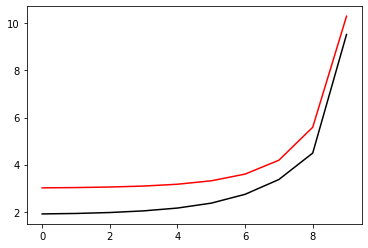

324500 0.48581014265808237 -0.8038042672821339 0.8542984723415296
[2.5460026  2.5555731  2.57519983 2.60138437 2.62550822 2.59241133
 2.37635296 2.49313884 3.34120433 9.40366165]


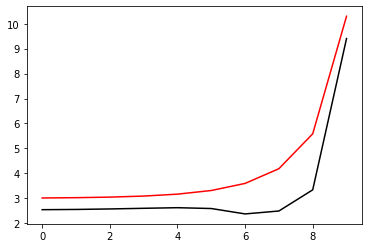

325600 0.044671276386807034 -0.8315458321656166 0.828040429805803
[2.36805602 2.36680034 2.36239008 2.34945956 2.31059834 2.21451578
 2.07001748 2.25133747 3.19932788 9.40276384]


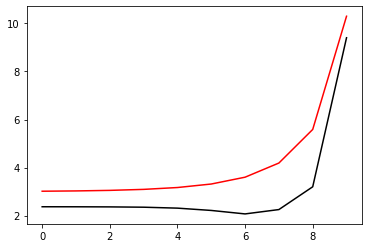

326700 0.0541229543122274 -0.8271571613615687 0.8320972191443816
[2.40908941 2.41465563 2.42366914 2.43078602 2.42774768 2.40309951
 2.35970097 2.47600749 3.37342219 9.41763331]


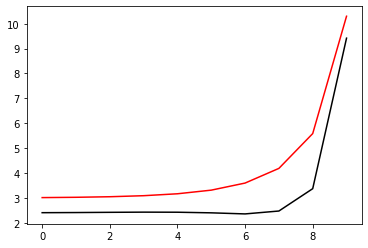

327800 0.04411124666036013 -0.8278172175355809 0.8323144259529068
[2.39354581 2.39882295 2.41016624 2.42701461 2.44809008 2.47365924
 2.51426037 2.65760016 3.52622876 9.43131404]


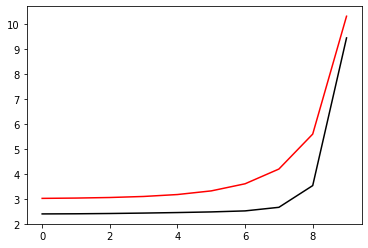

328900 0.04426224434518171 -0.8305785188391427 0.830296709511452
[2.33847989 2.34348172 2.35827434 2.38640613 2.43413449 2.51411559
 2.64973598 2.90159888 3.78007557 9.48620708]


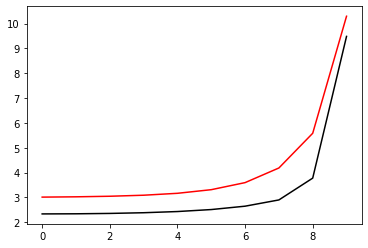

330000 0.07871949840465975 -0.8341636847949092 0.8280811949520002
[2.33233837 2.33912021 2.3589653  2.39982122 2.47414876 2.60122858
 2.813718   3.18966297 4.15395673 9.50843365]


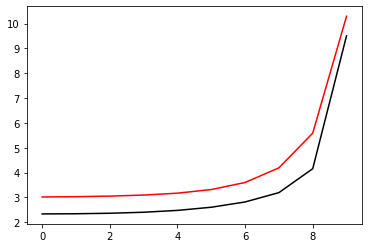

331100 0.055432858961940265 -0.8330601052982523 0.8316798072277779
[2.15112102 2.15817994 2.18363339 2.24231056 2.35122699 2.53922728
 2.8580667  3.41345171 4.58033707 9.51138029]


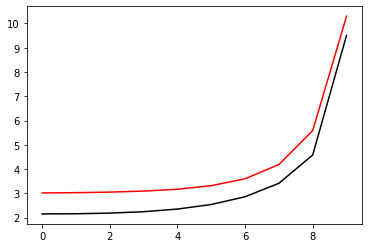

332200 0.17854718412181475 -0.8256304051229881 0.8408162265373951
[2.1396588  2.16942007 2.22995296 2.32312477 2.46443545 2.68323966
 3.03641844 3.65265019 4.93467433 9.45685729]


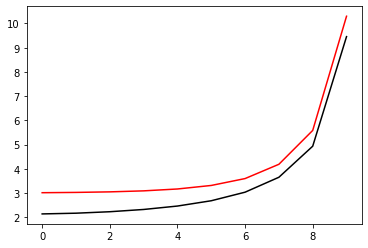

333300 0.20773368760993519 -0.8158202361124379 0.8442871611466188
[2.47641829 2.47082497 2.4632278  2.45473596 2.44501073 2.43725028
 2.46495327 2.72199104 3.87447361 9.44864859]


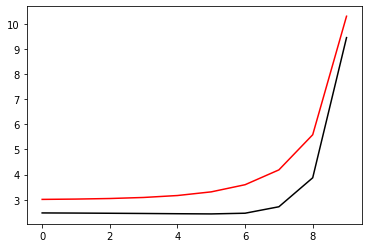

334400 0.3939892823026116 -0.8698076363851783 0.7769141385462797
[3.06496949 3.05734373 3.03845807 2.99414865 2.88651143 2.64631801
 2.24126554 2.12424419 3.18112606 9.41955313]


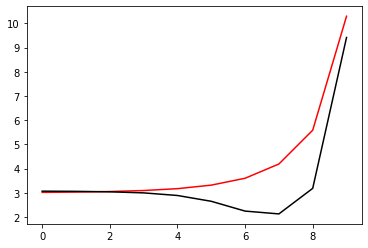

335500 0.20166704766125712 -0.8460112395371885 0.801378016745687
[3.03493353 3.01273105 2.96117164 2.86525842 2.69839109 2.43049171
 2.07699183 1.90363878 2.91214076 9.37025735]


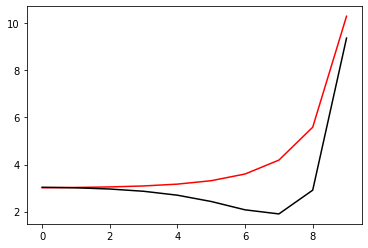

336600 0.04749578617345557 -0.8167029692263397 0.8317444589484916
[2.68570535 2.65165833 2.57564323 2.44826175 2.258348   2.00021774
 1.70325757 1.5722212  2.58429356 9.4177968 ]


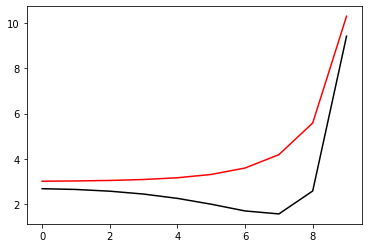

337700 0.06558527361093412 -0.8195074921565015 0.8305054280115634
[2.61283385 2.60214488 2.5749991  2.52385132 2.43898281 2.3113645
 2.14918404 2.07880886 2.97597407 9.43064734]


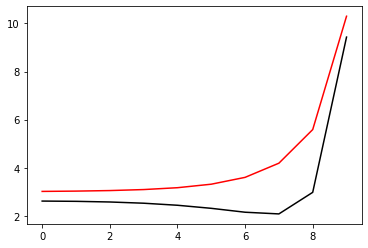

338800 0.05525235793872602 -0.8324283271013091 0.8218257409482943
[2.41166163 2.40797648 2.39250926 2.3563929  2.2884995  2.17642288
 2.02019821 1.92271512 2.67013716 9.36443466]


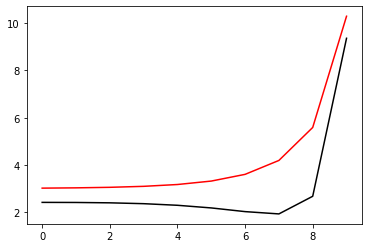

339900 0.045283430963672225 -0.8290446718818413 0.8279126973551216
[2.35137642 2.36027487 2.37031483 2.37839762 2.38083877 2.37316598
 2.35946155 2.42387276 3.2541742  9.50332769]


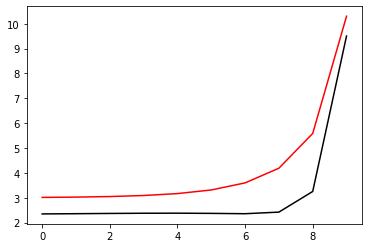

341000 0.0855873023184662 -0.8323370772074478 0.8265270397782456
[2.30146435 2.31636816 2.340844   2.37224085 2.40697461 2.44176324
 2.48187928 2.60335619 3.42231187 9.43161423]


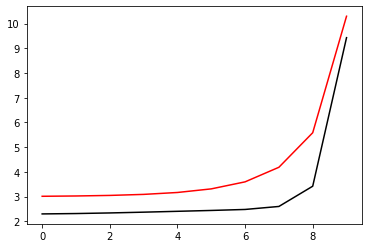

342100 0.06197234326950249 -0.8314650809189256 0.8280516215092495
[2.24811922 2.26003082 2.28671883 2.33102952 2.39630388 2.48840602
 2.62350443 2.87760825 3.78814583 9.45856797]


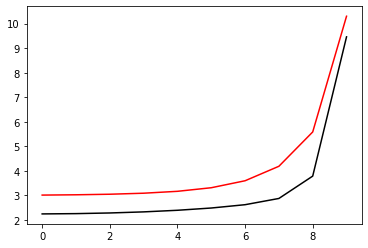

343200 0.06398374724757187 -0.8329198814850052 0.8301012779898269
[2.15951944 2.17572702 2.20943697 2.27373282 2.38449281 2.56516912
 2.85341324 3.33000638 4.42535875 9.481935  ]


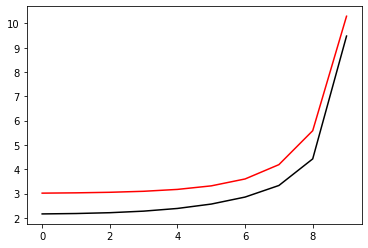

344300 0.34658298271775095 -0.857785695107157 0.7977439336619992
[2.53481772 2.5369384  2.55923732 2.6149972  2.72155007 2.90259844
 3.1691871  3.48753062 4.46875216 9.51448867]


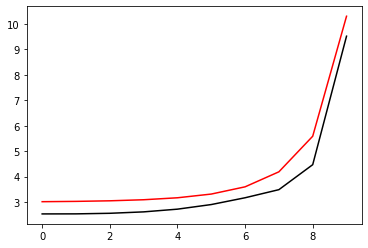

345400 0.034130262755291525 -0.8231145618215281 0.8373604178985959
[2.44708988 2.43749214 2.43709226 2.45760085 2.50791023 2.58930977
 2.66974979 2.7210082  3.47736178 9.41916006]


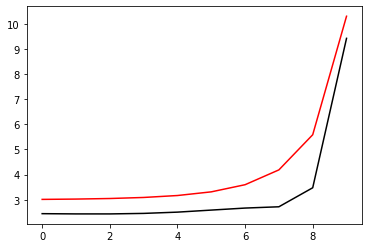

346500 0.12442547637433714 -0.8330705733544235 0.8172163429014739
[2.66150568 2.63875544 2.60715719 2.58016835 2.5645299  2.55666828
 2.53070338 2.47494934 3.08571938 9.34375024]


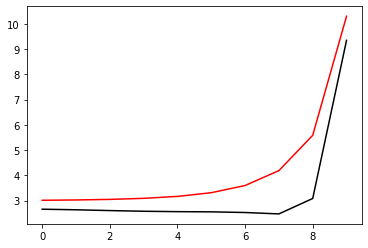

347600 0.044440275481172097 -0.8209028688330102 0.8325280651181074
[2.52536819 2.51797384 2.50307101 2.48474828 2.46898385 2.45732947
 2.44024122 2.43250156 3.05994932 9.39719217]


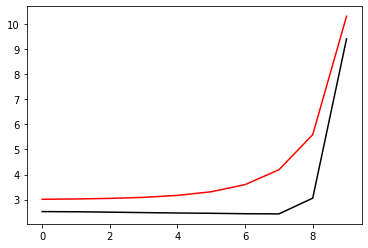

348700 0.10407771948655377 -0.8304894959056157 0.8206566743573457
[2.59831377 2.58277978 2.55554001 2.51088061 2.439934   2.33122697
 2.18744251 2.10139438 2.69653855 9.31051679]


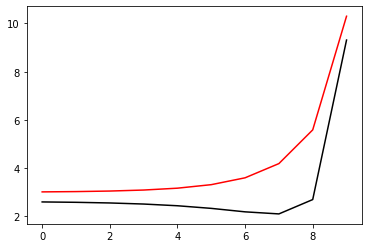

349800 0.04389741253434969 -0.821011621242054 0.831492611522828
[2.54641665 2.5405434  2.52619941 2.50071584 2.46091247 2.4035882
 2.33125055 2.30509297 2.90257098 9.378528  ]


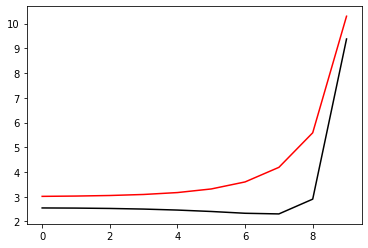

350900 0.0597018327924746 -0.8235933366442615 0.8317510704567934
[2.42840176 2.42872052 2.42445256 2.41061869 2.38153601 2.33126608
 2.26064465 2.23342661 2.81513098 9.36697361]


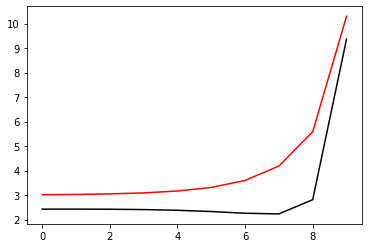

352000 0.08463121887631138 -0.8278540177221676 0.8287763462645122
[2.40297717 2.40560567 2.41208031 2.42369986 2.43969292 2.45795137
 2.47725683 2.53829589 3.15451935 9.36928747]


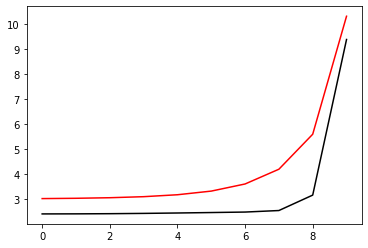

353100 0.06368738257765313 -0.8277575179990182 0.8302145673109348
[2.31826889 2.32480083 2.34078309 2.37005951 2.41991783 2.49805363
 2.61495736 2.8101666  3.51475106 9.43198839]


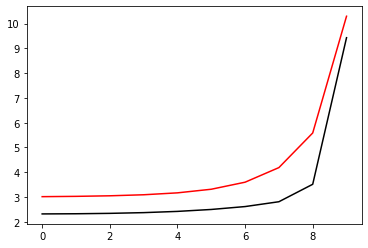

354200 0.06466375958288295 -0.8290261906837051 0.8308233994140638
[2.19466877 2.21558035 2.25102401 2.30625148 2.39015045 2.51643871
 2.7090143  3.03141657 3.88051    9.48768614]


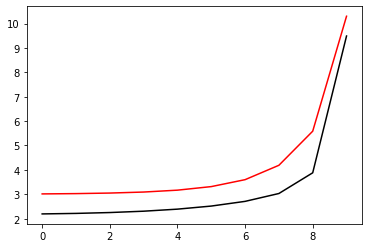

355300 0.04871498787083105 -0.8288750058093877 0.8310124556133183
[2.32019966 2.33005955 2.35314565 2.39374384 2.46098596 2.56961055
 2.74826364 3.07719284 3.9855153  9.52047257]


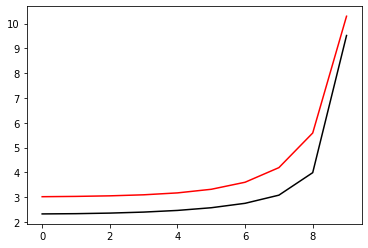

356400 0.15581002342128544 -0.8293110318625787 0.8345055425341211
[1.97024775 1.98239535 2.01643707 2.07854595 2.18538422 2.3653964
 2.67018637 3.2057557  4.35688216 9.52693247]


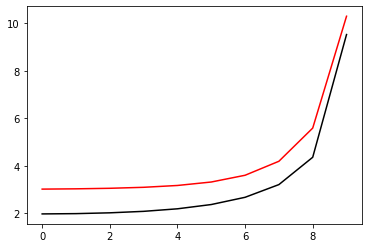

357500 0.032370280022763306 -0.8337646503544256 0.8312147354746097
[2.12488561 2.14357841 2.18629746 2.25900273 2.37500127 2.55964677
 2.86096453 3.38754544 4.53646918 9.50341073]


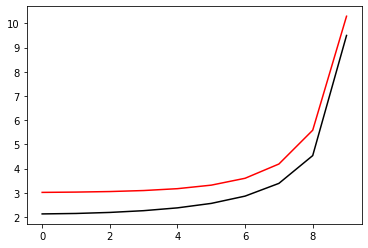

358600 0.05952389285059819 -0.8317723974836873 0.827966651114186
[2.32150471 2.34869797 2.40592303 2.4998017  2.64670833 2.87367549
 3.21909735 3.75112841 4.86400868 9.60282568]


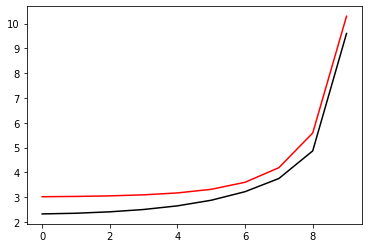

359700 0.054700406402176244 -0.8250272076792422 0.8350755286858914
[2.32944703 2.35267953 2.40633051 2.49881129 2.64405637 2.86744753
 3.21794437 3.810346   5.03755343 9.57490363]


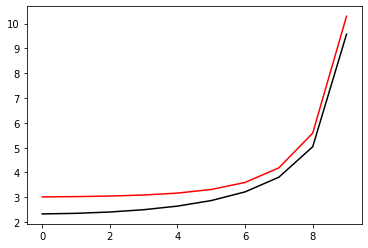

360800 0.0452926030588235 -0.8346929514607215 0.8319526539458774
[2.21563234 2.23432114 2.27656707 2.35737418 2.49808242 2.73387667
 3.13098678 3.83379164 5.25469719 9.57354823]


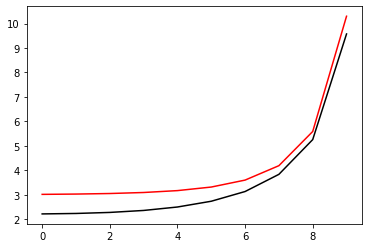

361900 0.1364776018266418 -0.8302764366914389 0.8397814455916065
[2.04440284 2.05531492 2.09436124 2.17884051 2.33734177 2.62087593
 3.12800415 4.04741343 5.72484198 9.69712434]


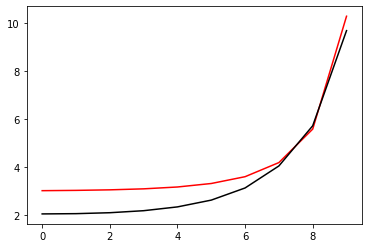

363000 0.08170843679246259 -0.8342340015921998 0.8313394520520548
[2.45970151 2.44096126 2.41051061 2.38103286 2.36997768 2.41626575
 2.62397191 3.25487297 4.80573097 9.5171883 ]


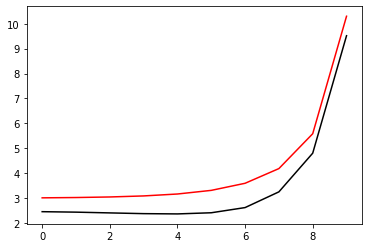

364100 0.12696166802906164 -0.8327938122686603 0.8398568665253501
[2.22453533 2.21891011 2.19960344 2.16861023 2.13613789 2.12881663
 2.22108974 2.63373107 3.97371683 9.50078465]


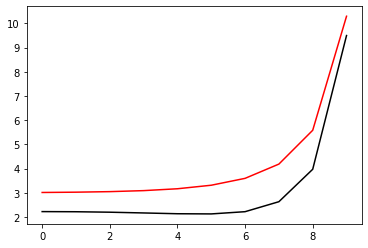

365200 0.07570152896233158 -0.8237130397804431 0.8388583183617127
[2.40673129 2.39912839 2.37621034 2.33773631 2.28760134 2.24107721
 2.2489232  2.4907421  3.65728085 9.46708554]


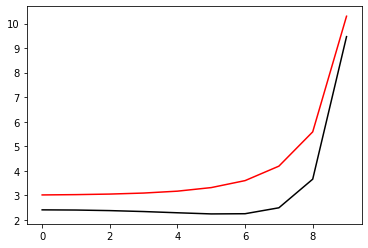

366300 0.05340564310678253 -0.829652686550927 0.8335071470927324
[2.43022152 2.43060895 2.42720105 2.41955609 2.41245206 2.42116841
 2.48898583 2.75886645 3.87790376 9.46903139]


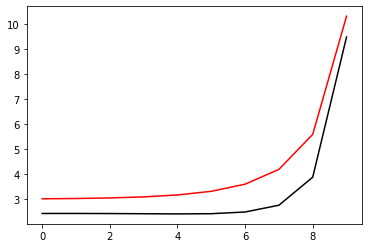

367400 0.03397197565516607 -0.8307255173004251 0.8342146370001122
[2.37753594 2.38736939 2.40202657 2.42597767 2.46797578 2.54692868
 2.70502079 3.06307616 4.18945947 9.46364018]


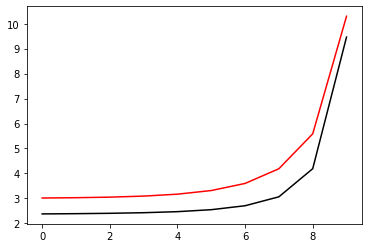

368500 0.02626254199011768 -0.8343385940996879 0.832948556386162
[2.22853123 2.2330198  2.25118282 2.29192355 2.37216104 2.52167909
 2.79957474 3.33315785 4.58126995 9.5192198 ]


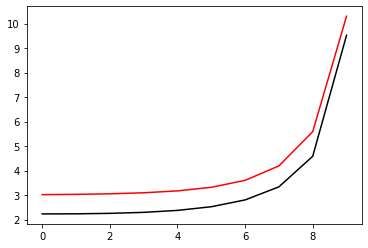

369600 0.04653118905796225 -0.8374349661995155 0.8330878299526029
[2.00314837 2.01551841 2.05284874 2.13209603 2.27799421 2.5383595
 3.00669005 3.83834662 5.34215894 9.66736563]


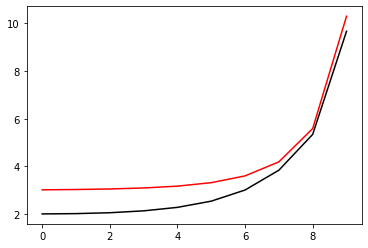

370700 0.26505009723632406 -0.8157694187692441 0.8518219988978457
[2.02638915 2.04154469 2.0709101  2.11524207 2.1793587  2.2717035
 2.41561289 2.75807333 3.93553973 9.49275433]


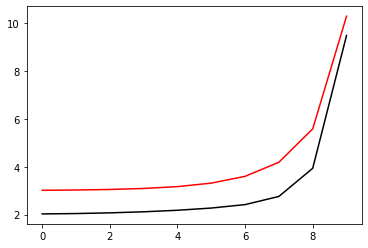

371800 0.10651125850708042 -0.8345812785787977 0.819602903775605
[2.47750975 2.46532194 2.45741323 2.45809166 2.46397192 2.46297968
 2.440767   2.52754629 3.52411614 9.40630162]


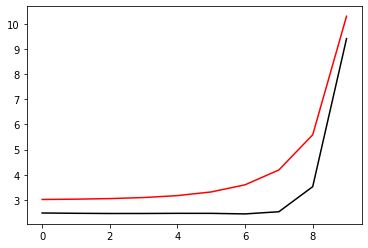

372900 0.06469104853152112 -0.8156190092184895 0.836782588816468
[2.45387629 2.44479858 2.42930281 2.40909444 2.37928992 2.32678024
 2.24708897 2.261886   3.2057902  9.43101181]


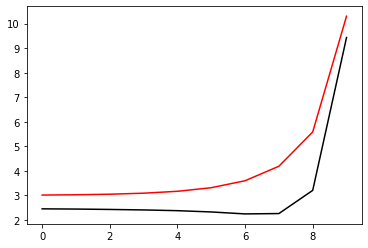

374000 0.08128053506116413 -0.8220973992761059 0.8317517554765675
[2.44920656 2.44990581 2.44874012 2.44599709 2.44278782 2.44291127
 2.46498051 2.60443647 3.49526605 9.36505926]


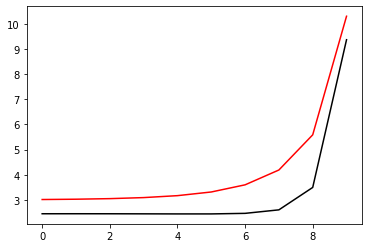

375100 0.06373715098525726 -0.8279113222213682 0.8283005333310828
[2.38625869 2.3862419  2.38828116 2.39574082 2.41386118 2.45509247
 2.55305543 2.8151057  3.76326421 9.44771867]


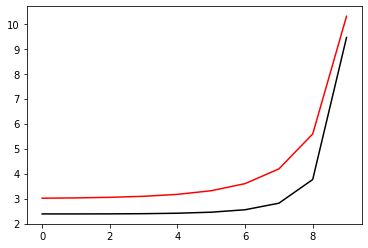

376200 0.06254569930531717 -0.8206941145220616 0.8345268314615284
[2.37322895 2.38518431 2.40439389 2.43308277 2.47990085 2.56144984
 2.71438065 3.04583403 4.04164778 9.47276602]


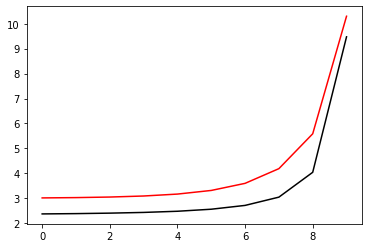

377300 0.03368774562522853 -0.8325241418308865 0.8274469204042847
[2.32948452 2.33515836 2.35228458 2.38699835 2.45185475 2.56909471
 2.78525997 3.22151725 4.35452199 9.46051534]


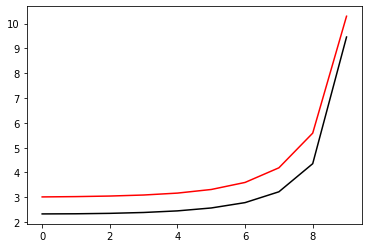

378400 0.3282843139938377 -0.8466196851621177 0.8046608610642938
[2.58947275 2.59516049 2.60711154 2.6329169  2.68152008 2.7625642
 2.87761909 3.04782827 3.93592505 9.47366283]


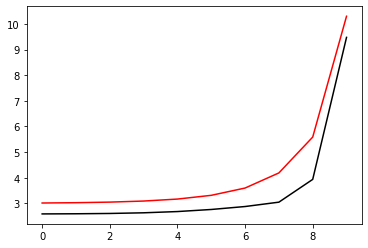

379500 0.03411101801670717 -0.8236123668584701 0.8283874512002388
[2.39647206 2.39607511 2.39550968 2.39755795 2.40448069 2.41695391
 2.44297751 2.5754594  3.52522799 9.43694727]


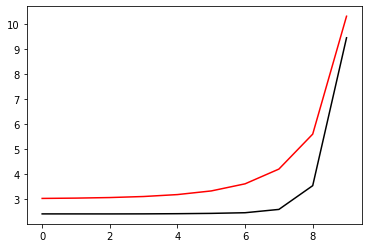

380600 0.04396529042887771 -0.8244007945290605 0.8289028926044368
[2.36752867 2.37243475 2.38361869 2.40299749 2.43492035 2.48941686
 2.59246851 2.84159732 3.81015494 9.42597879]


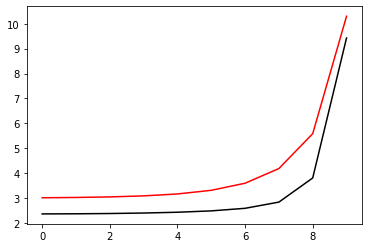

381700 0.04368793146058545 -0.829059708795904 0.8262142833670741
[2.2921075  2.2970257  2.31401192 2.34883733 2.41175253 2.52204708
 2.72044251 3.11442278 4.18752543 9.48316059]


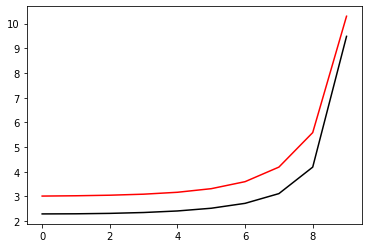

382800 0.0507439576490893 -0.826268290050324 0.8298707368492768
[2.24040384 2.23929394 2.24195153 2.25739208 2.29616092 2.37443352
 2.52440137 2.84296606 3.8765081  9.3683455 ]


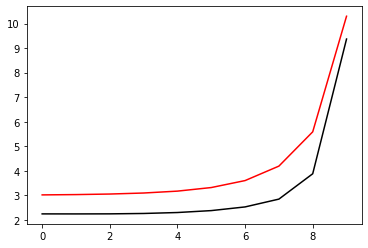

383900 0.15991273828409147 -0.8214835256235414 0.8378072876625426
[1.98035539 1.99207549 2.02025903 2.0725608  2.16245841 2.31623286
 2.58637158 3.09524072 4.29328803 9.51713302]


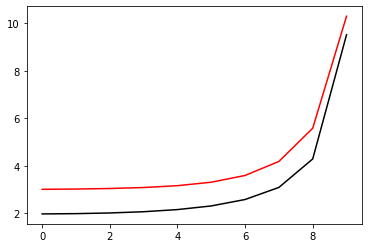

385000 0.08826538550605165 -0.8290816766137133 0.8249774754016427
[2.27325028 2.28725528 2.30879324 2.33511315 2.36431206 2.39117781
 2.41148561 2.53237731 3.48676538 9.40025879]


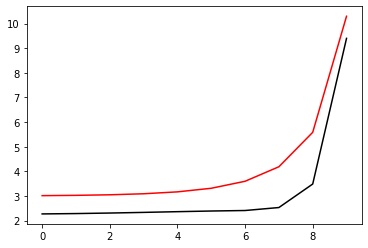

386100 0.0632675514296013 -0.8232036156074531 0.8328309273163338
[2.23542575 2.24925708 2.27674862 2.31846274 2.37801851 2.46481729
 2.6031455  2.8664026  3.79981299 9.54647507]


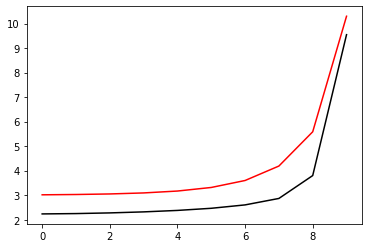

387200 0.12929578696003502 -0.8268942987567526 0.8332680397658586
[2.1000543  2.11532647 2.14632667 2.1985993  2.28181273 2.41421685
 2.63553018 3.04300764 4.0615842  9.45386092]


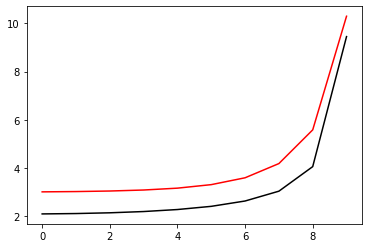

388300 0.05157531788912486 -0.833888728002766 0.8321082483580776
[2.32756172 2.31703453 2.30882609 2.30475048 2.30246274 2.29163359
 2.24771321 2.20357505 2.85126035 9.36236495]


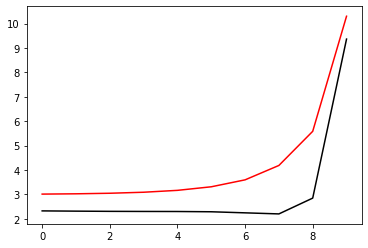

389400 0.05453763356579493 -0.8357598732669717 0.8283374838804328
[2.30210481 2.29571222 2.28578497 2.27641851 2.26704587 2.24925131
 2.20487507 2.1693338  2.80903123 9.4693387 ]


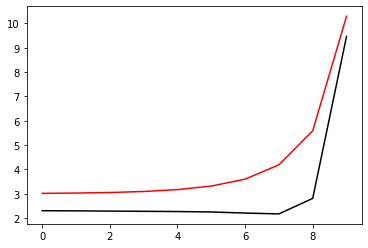

390500 0.04032621057225441 -0.8346935525155551 0.8331883564302586
[2.23752643 2.23744683 2.23778258 2.23997956 2.24570828 2.25290869
 2.25552297 2.29719257 3.00005725 9.38830139]


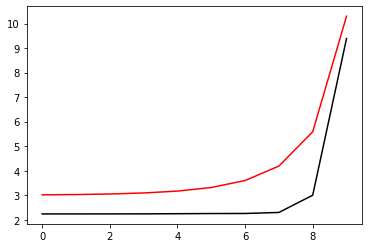

391600 0.030837265375808522 -0.8444444675289562 0.8260530619418238
[2.18679761 2.18548262 2.19005797 2.20540175 2.23613547 2.28830261
 2.37205359 2.54393547 3.35969536 9.40975051]


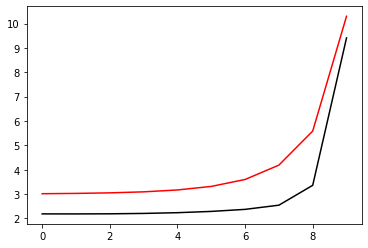

392700 0.04701562941883329 -0.8365321467450807 0.8378757804102801
[2.16456776 2.18241917 2.21265059 2.25499297 2.31308761 2.39434686
 2.51343444 2.73209874 3.55209567 9.41101932]


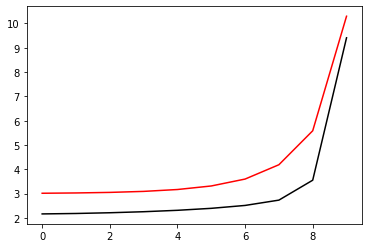

393800 0.04440601675903078 -0.8363844893376688 0.8365436115264357
[2.28884313 2.30893362 2.34781816 2.40924388 2.49921881 2.62806218
 2.81299752 3.10917868 3.96653653 9.48282733]


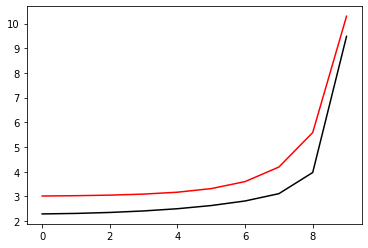

394900 0.044293300273448154 -0.8364830177156051 0.8372455795442604
[2.29452319 2.30854003 2.34236854 2.40371756 2.50374866 2.66088078
 2.90949553 3.33066829 4.30040977 9.47558022]


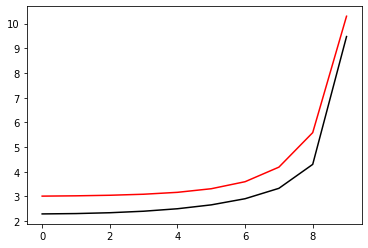

396000 0.18816275470617286 -0.8329528656478069 0.8473244752472747
[2.07647689 2.10834828 2.16963776 2.26898036 2.42835583 2.68353399
 3.09090759 3.74003185 4.9196907  9.64112093]


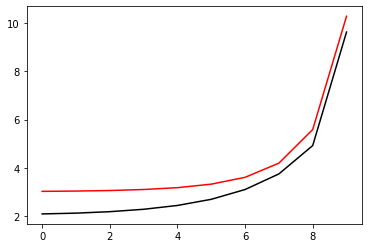

397100 0.05543754306965915 -0.8403948195096588 0.8365192681406274
[2.21713575 2.21814607 2.22661824 2.25061607 2.30599111 2.42358653
 2.66900555 3.18670726 4.34773193 9.51644604]


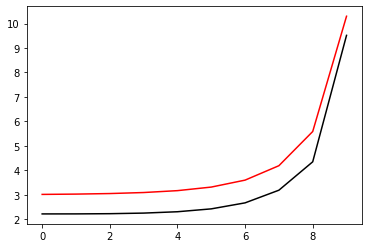

398200 0.05441584936296372 -0.839156479529814 0.8381257213767276
[2.31279897 2.3306343  2.36290209 2.41982658 2.51567686 2.67533056
 2.9506629  3.47320412 4.66789023 9.52861881]


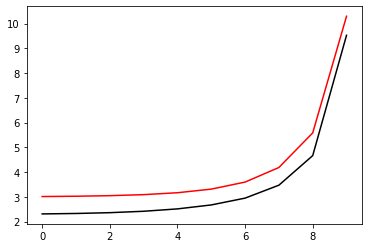

399300 0.32542427270334323 -0.8608564392170388 0.8127221507592561
[2.52431457 2.52288753 2.53638616 2.57294744 2.64366186 2.76756745
 2.98413162 3.41728583 4.54453735 9.46899111]


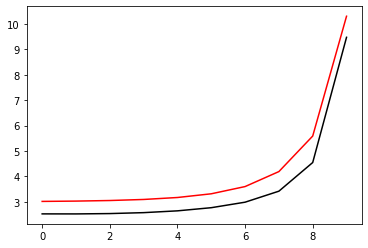

400400 0.03447425132832655 -0.8238055312908361 0.8433091251099911
[2.52714429 2.51040066 2.48188205 2.44507193 2.39818845 2.33884058
 2.29153126 2.4320986  3.43751876 9.45204409]


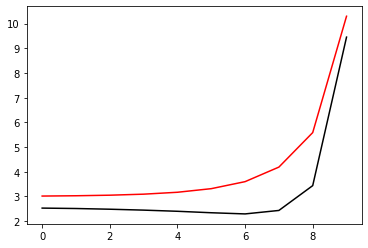

401500 0.033993018412321656 -0.8315226387584407 0.8365254782777908
[2.53646356 2.53390034 2.5277721  2.51852476 2.50970491 2.51078084
 2.55089607 2.74815478 3.72397524 9.45277919]


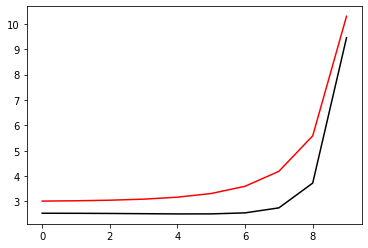

402600 0.05377279396890731 -0.8346949175666221 0.8383730831329528
[2.2906681  2.28263217 2.2701042  2.25151247 2.22679648 2.20279568
 2.21167806 2.39047441 3.35812424 9.51736259]


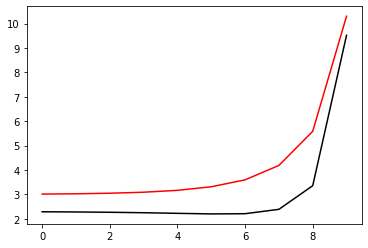

403700 0.053568793043147406 -0.831737101921789 0.84025371707334
[2.39910146 2.40473272 2.41737366 2.43767239 2.46808239 2.51716481
 2.61228914 2.860648   3.82637165 9.47072805]


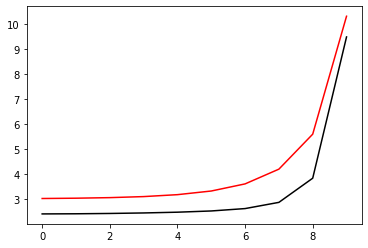

404800 0.04440286897711132 -0.8378614764652184 0.8367747798403228
[2.31485919 2.32233051 2.34086063 2.37769116 2.44302163 2.55598685
 2.75646668 3.15081135 4.22404471 9.4947527 ]


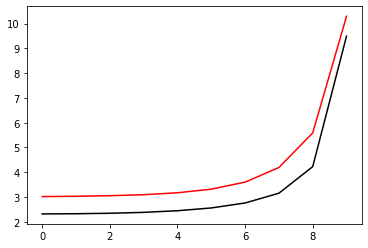

405900 0.06163456324902274 -0.8251626120666308 0.8433868279762664
[2.42040001 2.43477947 2.46727216 2.53244554 2.65061695 2.84887876
 3.1363283  3.47899145 4.54528773 9.62043365]


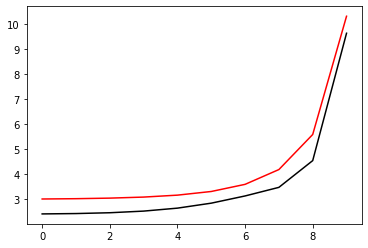

407000 0.06153897585345016 -0.8406024986595437 0.8355070148007128
[2.21738591 2.23125423 2.26593963 2.33181165 2.44528732 2.63377164
 2.94805094 3.4954003  4.72791933 9.52789901]


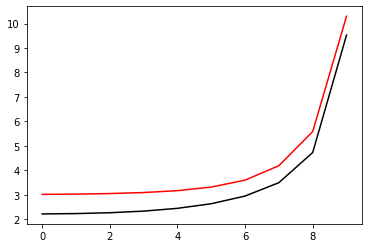

408100 0.1487481083843364 -0.8364663995688411 0.8450997433166599
[2.08864201 2.10308981 2.14115699 2.21450231 2.34471299 2.56836665
 2.95430537 3.64928707 5.02740172 9.57175428]


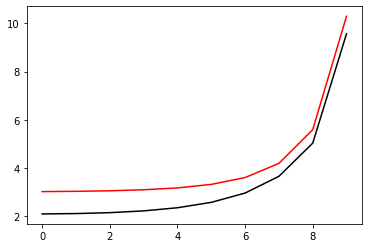

409200 0.38948909722219666 -0.8631571880468807 0.8084540869075079
[2.49931664 2.48727508 2.47327719 2.46716627 2.47583831 2.51504206
 2.6439338  3.05051608 4.22541771 9.52364053]


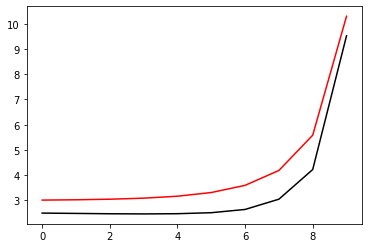

410300 0.054347353188558496 -0.8246298593371146 0.8403727306638662
[2.45460221 2.45329063 2.44679588 2.43864809 2.43676692 2.45758873
 2.55105382 2.88306408 4.01971895 9.41238343]


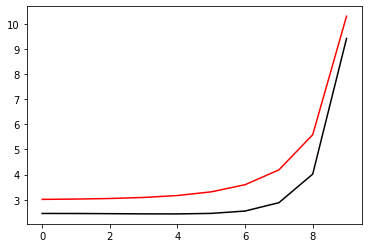

411400 0.054141391711209325 -0.8402108730383336 0.8316568165940807
[2.18784437 2.18983387 2.18992149 2.18525408 2.17999977 2.19111267
 2.27718903 2.62582188 3.80580356 9.40774935]


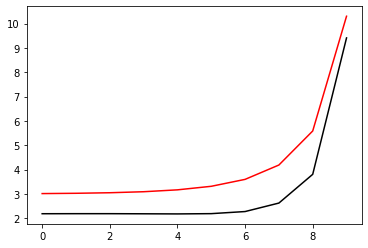

412500 0.024658408592516584 -0.8457875617780328 0.8312989492705389
[2.19958808 2.2023674  2.20983925 2.22550218 2.2577849  2.32790846
 2.49064977 2.90272972 4.11948883 9.50342286]


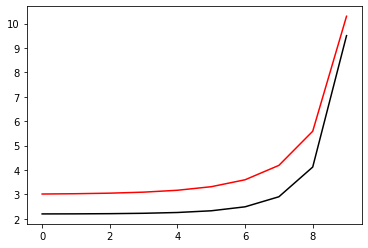

413600 0.3228325384563521 -0.7897492193111715 0.8830302670553019
[2.02406247 2.04937088 2.08209198 2.12326806 2.17902255 2.25944603
 2.38317354 2.65961638 3.75493139 9.45124715]


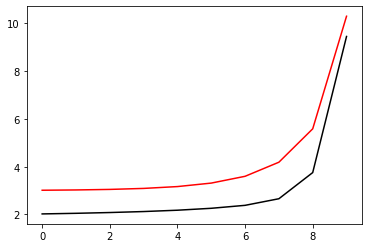

414700 0.30770592555185416 -0.8124681279345892 0.874549805218063
[1.82892423 1.84141444 1.86401997 1.89516506 1.93611213 1.9941068
 2.09955956 2.40702813 3.59975615 9.51552176]


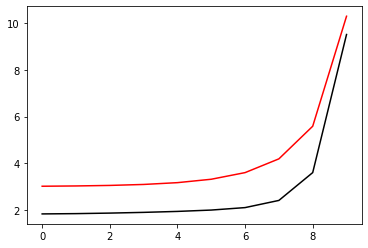

415800 0.05680679074433323 -0.8520404035222287 0.8274393448275311
[2.21313811 2.21836742 2.23095731 2.24854601 2.26732759 2.28214535
 2.29031133 2.35919839 3.24750577 9.3811063 ]


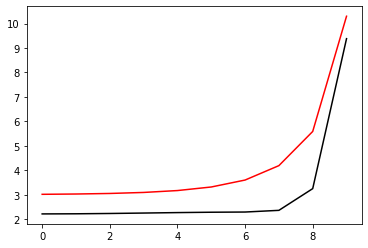

416900 0.049721096926573595 -0.8455830883944968 0.8324482046800288
[2.21210364 2.2204149  2.23881283 2.26967402 2.31710184 2.39197546
 2.52315169 2.7718097  3.62451049 9.434748  ]


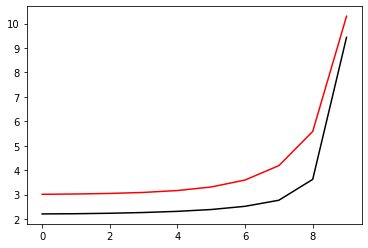

418000 0.054990548248458726 -0.8477762471933218 0.8328589316571249
[2.2547792  2.27753377 2.31886388 2.38688387 2.49673471 2.67443688
 2.95675002 3.37217997 4.25525185 9.55960734]


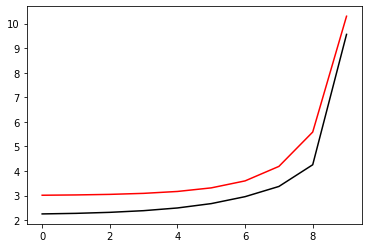

419100 0.06084040394521591 -0.838095776884699 0.8378595298407734
[2.19146552 2.20853443 2.24436339 2.29513008 2.35926677 2.43276321
 2.50302723 2.60446989 3.32910507 9.45364285]


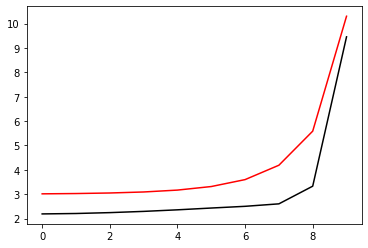

420200 0.06562000431033513 -0.8397159715612209 0.8365117037238181
[2.25071989 2.27577982 2.31631766 2.37469869 2.45385347 2.55608658
 2.6739138  2.80895207 3.52252167 9.43360659]


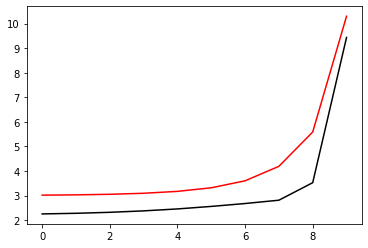

421300 0.041025298645341615 -0.8359080464752212 0.8349984419166596
[2.29550754 2.30736322 2.33638205 2.38643993 2.46278075 2.57436145
 2.74749927 3.05949208 3.79615323 9.44193482]


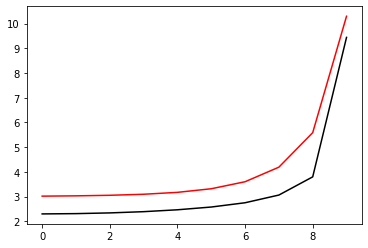

422400 0.039032119528292095 -0.8389937260541265 0.8340530844390277
[2.34425062 2.36150289 2.39781054 2.46296256 2.57360062 2.76271461
 3.09011791 3.58505097 4.39576902 9.51763164]


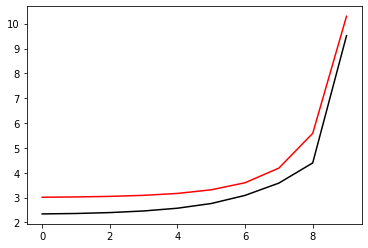

423500 0.2210813702135378 -0.8169185093313793 0.8714318762968865
[1.81618526 1.82208824 1.84549623 1.89569015 1.9870299  2.14646815
 2.42570566 2.92997909 3.95514844 9.45576528]


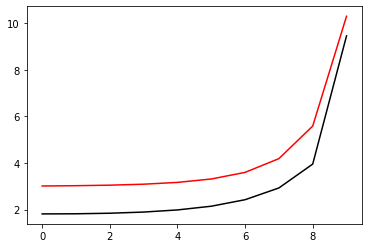

KeyboardInterrupt: 

In [114]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, m2_2, lam2, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h, m2_2, lam2])
    for i in range (90):
        optimizer.apply_gradients(zip(gradients, [h]))
    for i in range (10):
        optimizer.apply_gradients(zip(gradients, [h, m2_2, lam2]))
    if j%11==0: 
        print(j*100, Error_func(h, m2_2, lam2, Positive[j%10], Negative[j%10]).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.9506080670289839 -0.9336462241366666 0.7547041596480679
[1.6164812  1.62248967 1.64554228 1.69571767 1.78705206 1.94648773
 2.22572373 2.72999668 3.7551686  9.45427216]


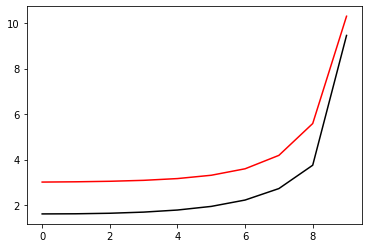

1100 0.17807773028414778 -0.816620893087234 0.7895808011990214
[2.22393975 2.22231585 2.22273984 2.23148449 2.24999192 2.26325189
 2.20270243 2.08480907 2.75854912 9.35537659]


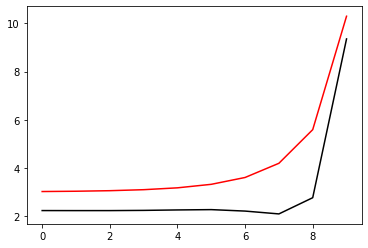

2200 0.4295441506352075 -0.8402202132653078 0.7658458812318921
[2.47812742 2.45158104 2.41846618 2.37954678 2.32854825 2.24088264
 2.0532337  1.77322124 2.24816344 9.35605931]


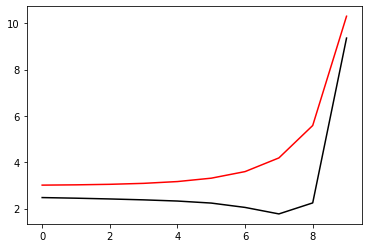

3300 0.3523232106762628 -0.8291888071603278 0.7645688198594157
[2.6357447  2.59574556 2.52994337 2.43467952 2.29581922 2.08521075
 1.76750161 1.38392209 1.76242073 9.19953406]


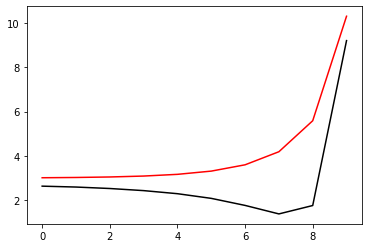

4400 0.038248696383656335 -0.7824122490086298 0.806799633461497
[2.62083309 2.59812028 2.54453975 2.45075338 2.30221824 2.07411002
 1.73396051 1.3229053  1.64644816 9.26621579]


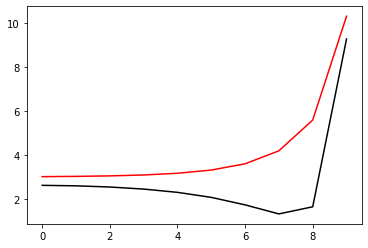

5500 0.06539802179666244 -0.7935999095322305 0.8037858462895514
[2.35787911 2.33939995 2.29425764 2.21091283 2.07287705 1.85498588
 1.52614145 1.12745489 1.43487713 9.26485711]


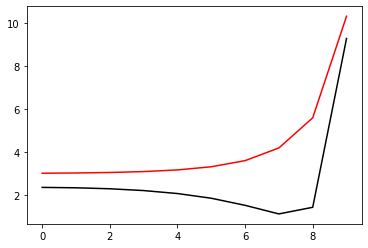

6600 0.0531957971647305 -0.7900469856642223 0.8060174866991469
[2.43808994 2.43315854 2.41611912 2.37661118 2.29976579 2.16118065
 1.92376105 1.59522249 1.87188913 9.29046815]


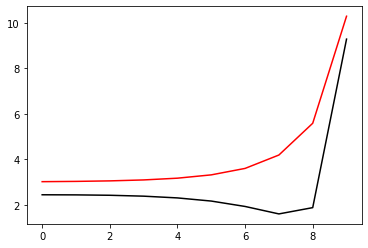

7700 0.06787896760066356 -0.7927768646117236 0.8035567253876046
[2.46285088 2.46601667 2.46934644 2.46769444 2.45043248 2.39726328
 2.27162777 2.0580393  2.3507438  9.32782864]


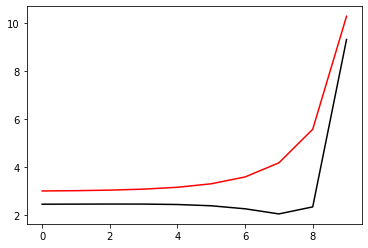

8800 0.045235398282996116 -0.7952528498143413 0.805740877195079
[2.30961813 2.31689195 2.3272324  2.33720328 2.3390085  2.31715812
 2.24576247 2.12212945 2.46073839 9.30306175]


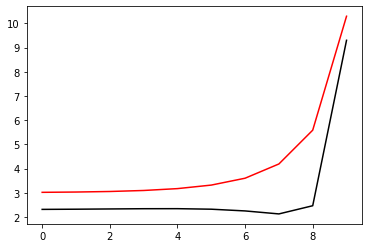

9900 0.05458581960550035 -0.7975898826854927 0.8036405171958836
[2.3514988  2.35810224 2.37270505 2.39581493 2.42564551 2.45664407
 2.4781147  2.49734408 2.94002819 9.41359293]


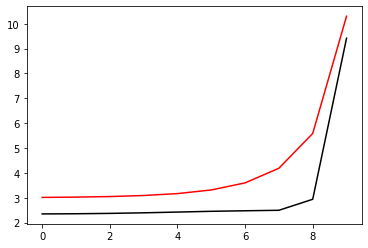

11000 0.0885690723062879 -0.8170526130624093 0.7957220276245807
[2.04840209 2.05533719 2.07121256 2.09574344 2.12901057 2.16933317
 2.21197533 2.27558626 2.77544561 9.3370744 ]


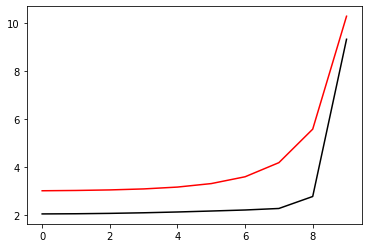

12100 0.08514687764744086 -0.8174732046805377 0.8010867527803087
[1.87880997 1.8893037  1.9218237  1.98563688 2.09568651 2.27109207
 2.52141559 2.82818284 3.50031496 9.43109247]


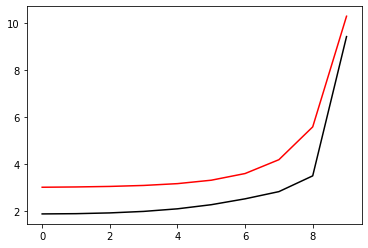

13200 0.06215955392381147 -0.8031433168734515 0.804476211563154
[2.23034753 2.24609428 2.28041519 2.34005268 2.43183386 2.56073652
 2.73193654 2.95605785 3.52158522 9.46208223]


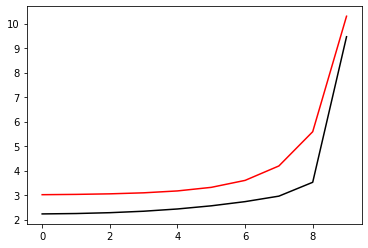

14300 0.04058872710601928 -0.8022580516266657 0.8085899644579284
[2.0655162  2.0877393  2.1332544  2.20392261 2.31497702 2.49710179
 2.80530066 3.24311262 3.96985967 9.4358367 ]


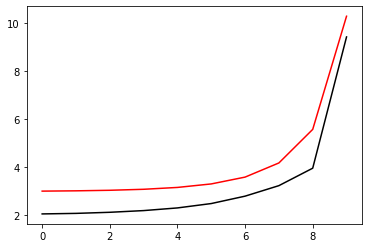

15400 0.0350914600264434 -0.8046392071883208 0.8091197806169745
[2.11898944 2.14133363 2.19178351 2.27984196 2.4210939  2.64399229
 2.99428708 3.54051471 4.46815954 9.54052511]


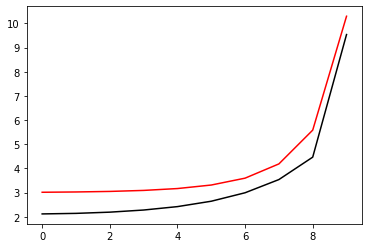

16500 0.0265706485234356 -0.809693274616122 0.807622077742831
[2.02552679 2.04314121 2.09157405 2.18501678 2.34699262 2.61958807
 3.07594433 3.8349201  5.09458794 9.5387061 ]


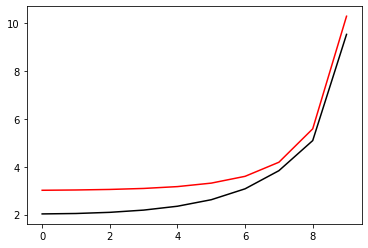

17600 0.28822644721136054 -0.7935767173199753 0.8639646126596818
[1.89321554 1.92839071 1.99044984 2.0904974  2.25061731 2.50870457
 2.92881215 3.61561965 4.74813035 9.46258019]


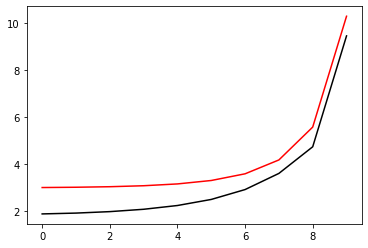

18700 0.033436133658572786 -0.8278567616004721 0.809597760792622
[2.04793015 2.06889747 2.11830702 2.20410208 2.34338779 2.56689226
 2.92721436 3.52303146 4.59276661 9.5173497 ]


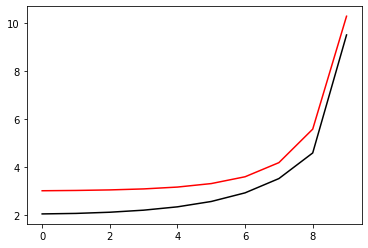

19800 0.09881421164840934 -0.8198757506547042 0.8056013519548457
[2.35216148 2.3416944  2.34849734 2.37482731 2.42019466 2.48045689
 2.57073833 2.88065439 3.84162181 9.45781839]


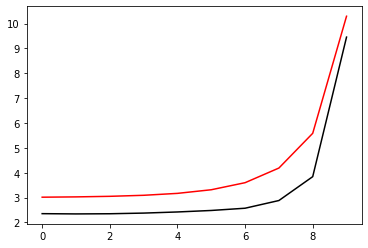

20900 0.05292969008287094 -0.8081150156940481 0.8149238761511006
[2.35785162 2.35414827 2.35447577 2.36664792 2.39393285 2.43893311
 2.52703969 2.81004342 3.7781673  9.40055813]


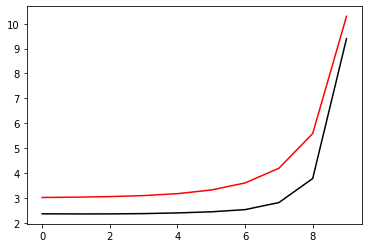

22000 0.08196018429574864 -0.8098863244554302 0.8134690239915137
[2.34860442 2.35174295 2.35989608 2.37768493 2.41232817 2.4770219
 2.60468944 2.90681597 3.88369897 9.46435237]


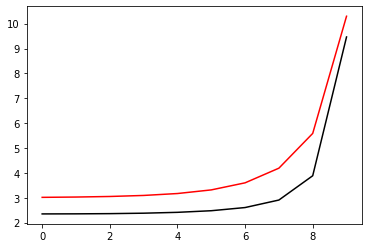

23100 0.06352571552527007 -0.8114095209082738 0.8132172786908624
[2.33094638 2.33773846 2.35350951 2.3841468  2.43991733 2.53976553
 2.72043991 3.07750397 4.08574602 9.58716926]


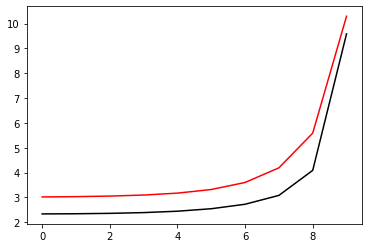

24200 0.05927685632453305 -0.8120508295328075 0.8142177424383356
[2.29196959 2.31004284 2.3404206  2.39116704 2.4755673  2.6159814
 2.84953523 3.27293805 4.34511665 9.49489888]


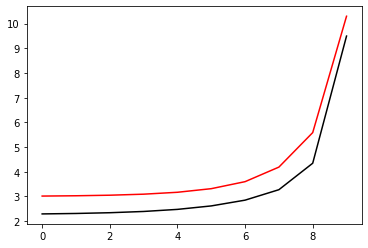

25300 0.06322213187488275 -0.8157655619976493 0.8111339591361391
[2.35230163 2.35861741 2.38687647 2.44168142 2.53965243 2.70758941
 2.99527454 3.51657134 4.70056249 9.50267877]


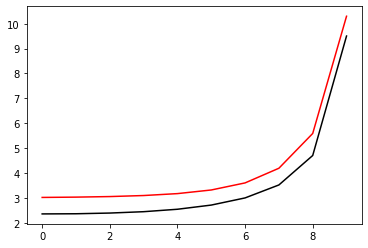

26400 0.2544610896307878 -0.8220331792037674 0.793837441965116
[2.2390514  2.22184826 2.21772602 2.23538445 2.2907602  2.40624759
 2.57654106 2.67334183 4.02896909 9.56462924]


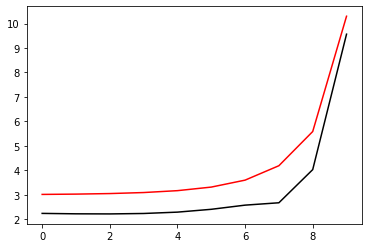

27500 0.03453098270105609 -0.7974622221669084 0.8108965357068478
[2.47053286 2.45792212 2.43746922 2.42109394 2.41934897 2.44020998
 2.48222674 2.52206219 3.74191507 9.4442706 ]


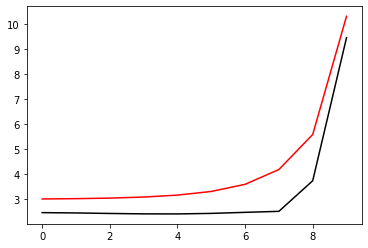

28600 0.04407429924151986 -0.799715279027803 0.8110878907344186
[2.38672355 2.38808954 2.38958251 2.39267639 2.40530678 2.43916763
 2.50598177 2.64858421 3.81673342 9.45845525]


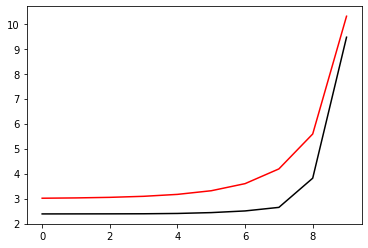

29700 0.05593432217997629 -0.8112776889644343 0.807808607110644
[2.08635125 2.08933982 2.09309239 2.09346219 2.09014773 2.08893869
 2.11287447 2.2683323  3.39421796 9.47999668]


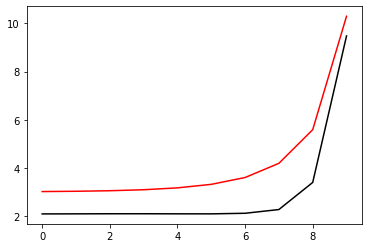

30800 0.06090818449662366 -0.8168516701696925 0.8057841962573948
[2.03368691 2.04030359 2.05140251 2.0703792  2.1020596  2.15748106
 2.26647005 2.54259005 3.6936346  9.44762031]


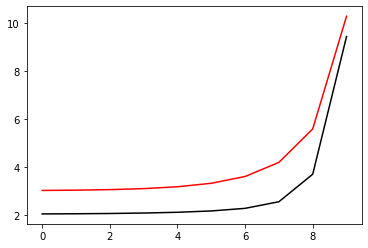

31900 0.2548130736440779 -0.8096707398752495 0.8184664117063118
[1.74042977 1.75340575 1.77884185 1.82397577 1.89971848 2.02585666
 2.24188105 2.65898666 3.8649992  9.47838133]


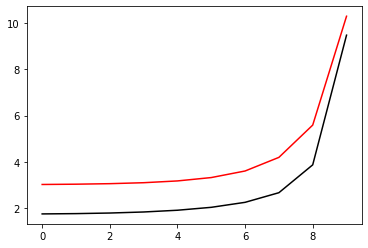

33000 0.19425194445064864 -0.8036352049812814 0.8168418207053234
[1.92286373 1.93447647 1.95667445 1.98528582 2.01668551 2.04023729
 2.03797609 2.14960058 3.24247832 9.38678739]


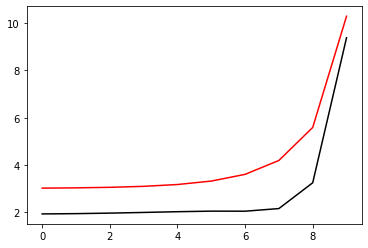

34100 0.06308120313632729 -0.8102734276249266 0.8031420879677443
[2.09969428 2.10521667 2.11850075 2.14074289 2.17114732 2.20804252
 2.26218388 2.39712275 3.30083596 9.41743355]


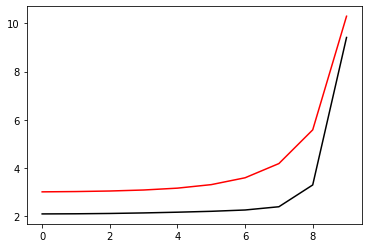

35200 0.07583249807314073 -0.8174280399590655 0.8004998649534075
[1.98314145 1.99333876 2.01535279 2.05535864 2.12560525 2.25506244
 2.50469987 2.9241417  3.82307965 9.42091586]


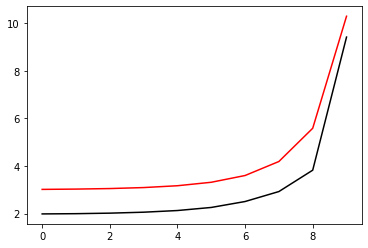

36300 0.03586582333152293 -0.813790537916432 0.8062727446153897
[1.89995492 1.93006057 1.99291265 2.09537591 2.26126204 2.53607652
 2.9831083  3.6032094  4.51896777 9.56047592]


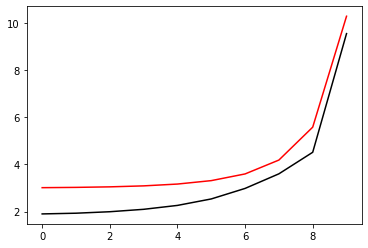

37400 0.03484766945542352 -0.7965778125090052 0.8111416713533346
[2.21877479 2.22729489 2.27114912 2.3634527  2.52491685 2.77571824
 3.0703745  3.30232266 4.39718271 9.56939156]


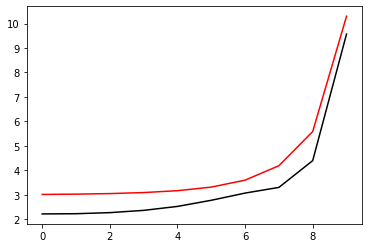

38500 0.032687625033276484 -0.8071146798681504 0.8078626297876179
[2.10617047 2.12476749 2.17188546 2.26036168 2.40787757 2.63081718
 2.92698638 3.28358502 4.39480093 9.48985165]


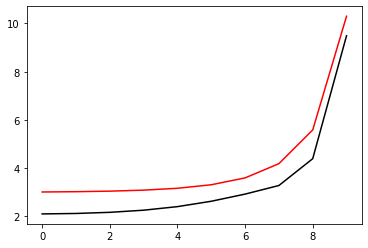

39600 0.044648382211179546 -0.8084152358020309 0.8077171336954808
[2.1185983  2.13846733 2.1869043  2.2762226  2.42422343 2.65403367
 2.99297765 3.48796644 4.62321096 9.52830182]


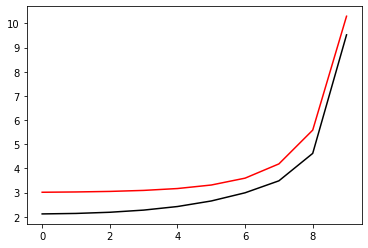

40700 0.029341352143523142 -0.8138699078485113 0.8043488051879711
[2.05982473 2.07872808 2.12778013 2.22146738 2.38205893 2.64600984
 3.07277714 3.75548837 5.02038071 9.67173531]


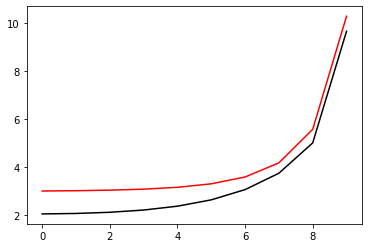

41800 0.2372307956577662 -0.7964301878743029 0.8395820712471654
[1.64613188 1.66329312 1.70474366 1.77990251 1.90331065 2.10111279
 2.42384005 2.98685039 4.18841204 9.50110783]


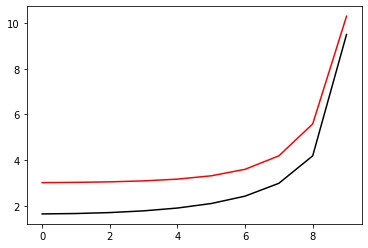

42900 0.05557638642365039 -0.8116625343690835 0.8092580392105762
[2.07151353 2.08593971 2.11578386 2.16346443 2.23227867 2.32775644
 2.46807049 2.74815379 3.6853346  9.42511384]


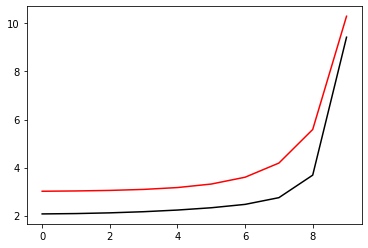

44000 0.14366161015162132 -0.8160221319417553 0.8048068262298838
[2.23985548 2.25351855 2.2872588  2.35140042 2.4631566  2.64703993
 2.93422415 3.37251716 4.3550916  9.54560881]


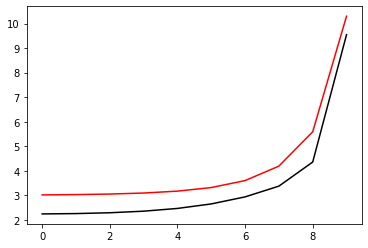

45100 0.05721314772534242 -0.8124468977967212 0.8119986622985572
[2.05620932 2.06672875 2.10002159 2.16964187 2.29437024 2.50632888
 2.86254062 3.4666232  4.64774089 9.52790341]


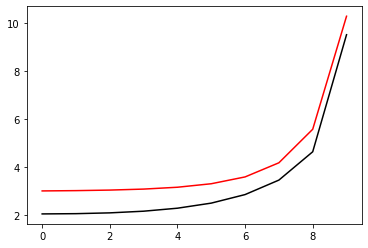

46200 0.3253233490984683 -0.8262534598228334 0.7974662258393573
[2.30964846 2.31270461 2.34213753 2.41604199 2.55860088 2.81019852
 3.2320905  3.87153727 5.08675966 9.55839679]


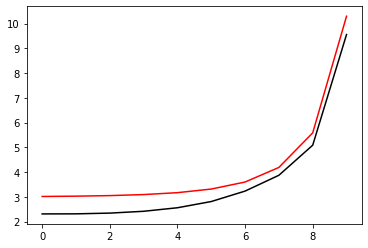

47300 0.32191831931367065 -0.7881049987181203 0.8359926643925547
[2.18948997 2.16781358 2.13933916 2.11768432 2.11025895 2.12370008
 2.19658222 2.51652005 3.68520694 9.47915437]


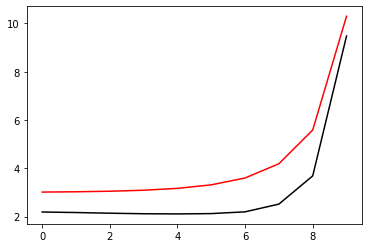

48400 0.035384456115853696 -0.799775626421469 0.8156605229478958
[2.34410077 2.32961628 2.2997317  2.26175674 2.22090665 2.17945663
 2.1602485  2.33122261 3.39450773 9.39322018]


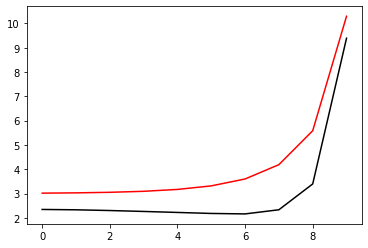

49500 0.08553225668174802 -0.7994143892027151 0.8197389570729544
[2.22774467 2.2285977  2.2210899  2.20442507 2.18352011 2.16899407
 2.19101629 2.37722236 3.40464886 9.44570634]


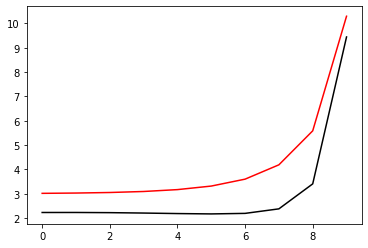

50600 0.04303939036458517 -0.8160727274051629 0.8044605766825864
[2.14621183 2.13297963 2.10782612 2.06976165 2.01839031 1.9593282
 1.92246524 2.04861696 3.040868   9.35079026]


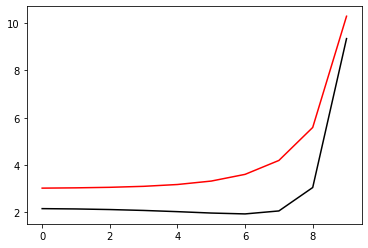

51700 0.05118321828220651 -0.8208255487261262 0.8038676578031106
[2.04891954 2.04152932 2.03095991 2.02200257 2.02301317 2.05121006
 2.14497574 2.42027854 3.49141386 9.50815029]


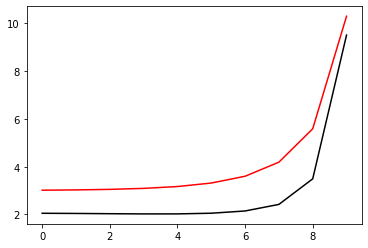

52800 0.0544593552088359 -0.8180945115273671 0.8079472333717822
[2.08493763 2.09858756 2.1193968  2.15243317 2.20617564 2.29732914
 2.45837555 2.787292   3.83425791 9.47356383]


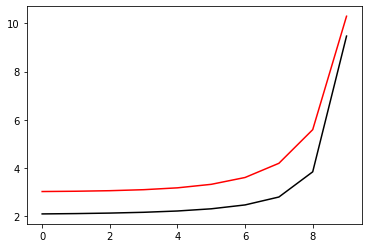

53900 0.05080075306884171 -0.8057658611316342 0.813099043269297
[2.27293044 2.2833848  2.30993161 2.35905893 2.44065965 2.56731159
 2.75780529 3.05562555 3.96087194 9.46806389]


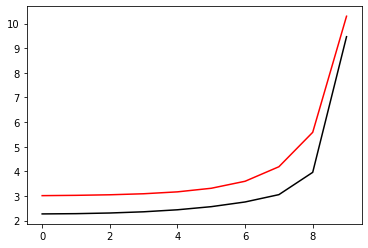

55000 0.08317985275988787 -0.809663045263567 0.8102872657472807
[2.25760741 2.27049666 2.30131783 2.35645842 2.44568303 2.58698802
 2.81861797 3.2331944  4.15993245 9.57829933]


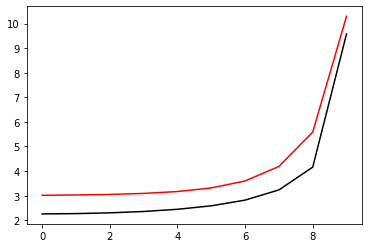

56100 0.3258193748106812 -0.8352270554057183 0.7749834415185641
[2.53252176 2.53695307 2.55218778 2.58423164 2.63979741 2.72747984
 2.85475095 3.04218253 3.78485883 9.43263541]


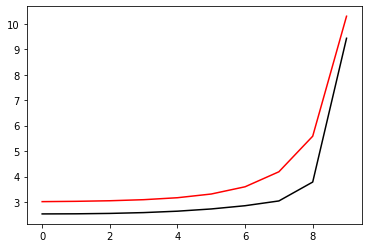

57200 0.08433293987677432 -0.8029569897596309 0.8083253631929053
[2.50766698 2.48976974 2.46634859 2.43932041 2.40319393 2.34184709
 2.22297545 2.09078028 2.70991405 9.35897295]


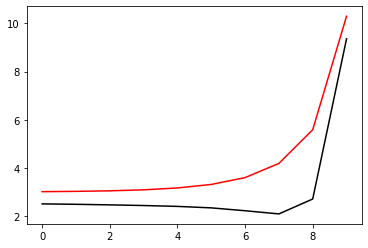

58300 0.05494286260802545 -0.8003189576970065 0.8092315464593384
[2.428345   2.42400777 2.41222294 2.39425046 2.36870273 2.32781735
 2.26122297 2.22012408 2.85925715 9.36046661]


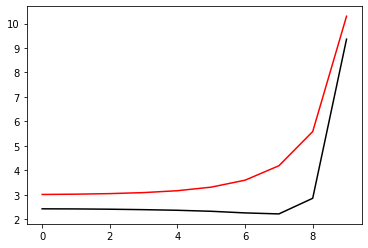

59400 0.034410765075559936 -0.8038068456991002 0.8074720628418096
[2.39035271 2.39416287 2.39998923 2.40667437 2.41512696 2.42797773
 2.45379776 2.54919896 3.2508374  9.38864929]


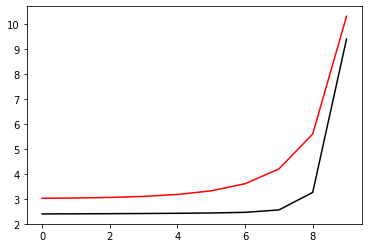

60500 0.03414492010029762 -0.8037911103959646 0.809735355573293
[2.28916862 2.29413635 2.30557673 2.32470358 2.35538235 2.40665112
 2.49997313 2.71057099 3.50756997 9.41657539]


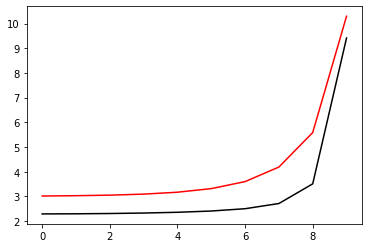

61600 0.22766254779672276 -0.7864436328945769 0.8374597183553472
[1.80309502 1.80866701 1.82637444 1.86058013 1.92077824 2.02437796
 2.20596456 2.55954234 3.53807883 9.47196833]


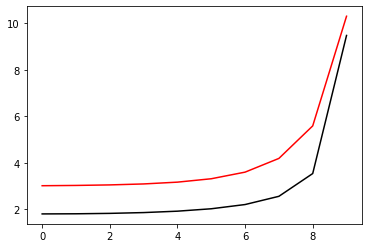

62700 0.07062090225823618 -0.8037078708363639 0.8127866426362119
[2.1938923  2.19109442 2.18598409 2.17946726 2.16896153 2.14823392
 2.1128648  2.13473183 2.83574955 9.38751364]


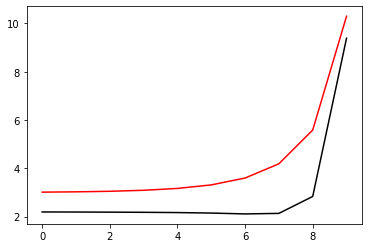

63800 0.044524133278718826 -0.8043718559788773 0.8095856291725995
[2.27747543 2.28391853 2.29729259 2.3175215  2.34482973 2.38042172
 2.42927557 2.54167333 3.24974358 9.40844198]


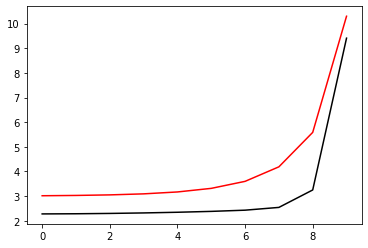

64900 0.07278007500416425 -0.8055911869091454 0.8120893681308906
[2.06281752 2.07530228 2.09726145 2.12923127 2.17266286 2.23207139
 2.32199938 2.50848198 3.27460157 9.33971919]


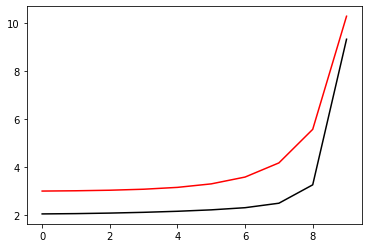

66000 0.08396823775497962 -0.8104071939619193 0.8072178110900342
[2.25156281 2.26198464 2.28523041 2.32540677 2.38998986 2.49183848
 2.65655671 2.9577565  3.82242229 9.48335133]


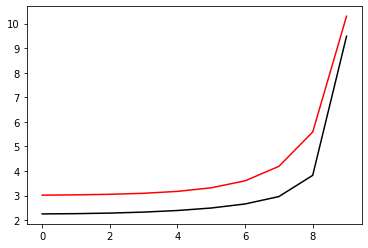

67100 0.0635672070167379 -0.811857293834421 0.8072798149528756
[2.22319444 2.2319655  2.25222279 2.28890041 2.35099751 2.45413988
 2.63065018 2.97047069 3.90323755 9.46694928]


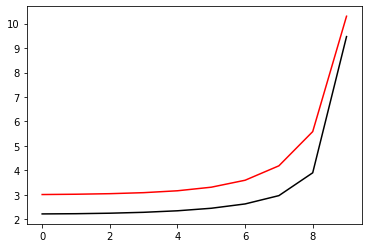

68200 0.07607602291224104 -0.8233588278553111 0.8096737839572952
[1.97568233 1.98550105 2.00819193 2.04804276 2.1132714  2.21997296
 2.403621   2.76449479 3.74868995 9.5028304 ]


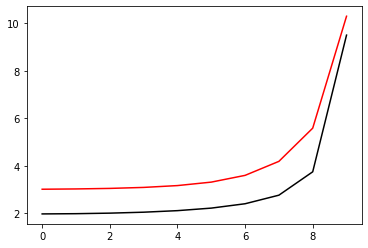

69300 0.048963720287069516 -0.8139671512077906 0.8097062325730797
[2.21490075 2.20448587 2.18382432 2.14806602 2.08178453 1.96636181
 1.85139012 2.05016261 3.02537634 9.38351613]


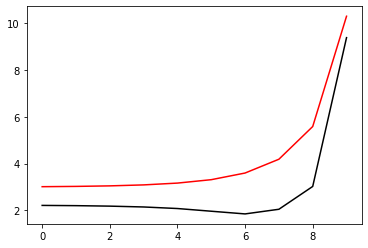

70400 0.05462747368083484 -0.8186364562296743 0.8074632191562585
[2.1730238  2.16835002 2.15731668 2.13727873 2.10519208 2.06163072
 2.03544101 2.21664892 3.19572227 9.41255576]


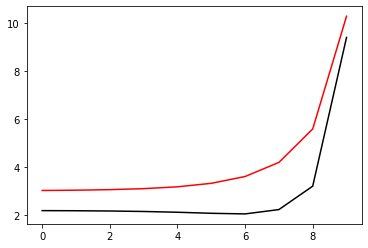

71500 0.02691149632893138 -0.8211285301792552 0.8084426962002021
[2.07365015 2.08019048 2.09429281 2.11852666 2.15827237 2.2231504
 2.33373583 2.59021696 3.58493717 9.44353354]


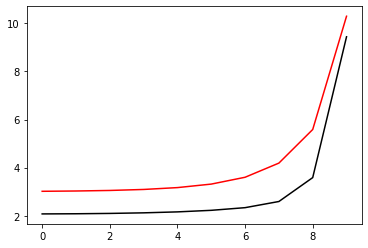

72600 0.04430324636590705 -0.8110677904761132 0.815525311271799
[2.22875238 2.24570724 2.28543755 2.35410544 2.45930517 2.60582681
 2.79105947 3.04737069 3.93724947 9.4695024 ]


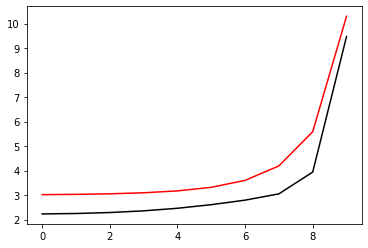

73700 0.044365882704521346 -0.8148383942935994 0.8134122298796718
[2.19278882 2.20731346 2.24144512 2.30339869 2.40479187 2.56480343
 2.82205548 3.26149285 4.21376819 9.50342243]


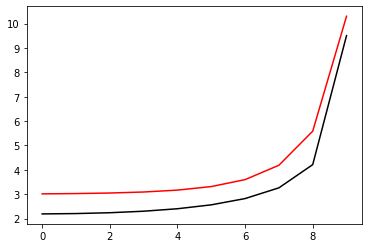

74800 0.056756777255808 -0.8206777615745043 0.8071956302013266
[2.2051008  2.21440028 2.23930395 2.28596846 2.36527319 2.49796446
 2.72900749 3.1584947  4.14753663 9.51664705]


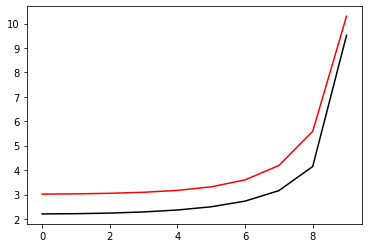

75900 0.05517982946877798 -0.8214505104459349 0.8092946786042143
[2.10323196 2.11577756 2.13756914 2.16944858 2.21839998 2.29650939
 2.42594501 2.68214732 3.59750017 9.35171441]


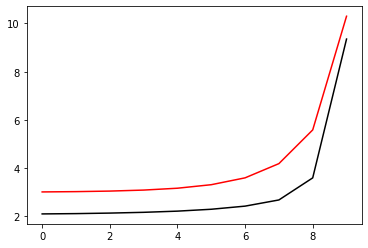

77000 0.08388041173631679 -0.811141307113718 0.8127631918647602
[2.28794884 2.29699584 2.31935303 2.35976129 2.42587108 2.53195886
 2.70413158 2.93859225 3.73676577 9.46240222]


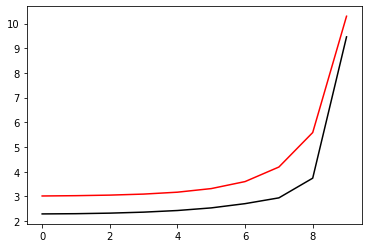

78100 0.06362286691340123 -0.811943388680399 0.8143748065148727
[2.22989776 2.23831082 2.25943649 2.29911177 2.36660627 2.47979325
 2.6783175  3.05770084 3.93373582 9.46121783]


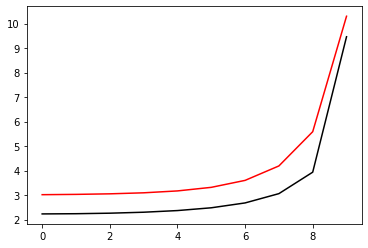

79200 0.0649215858528387 -0.8128949052231987 0.8154300170233207
[2.0785734  2.1040004  2.14394181 2.20774286 2.31126693 2.48640644
 2.80940098 3.37342313 4.3738678  9.51877206]


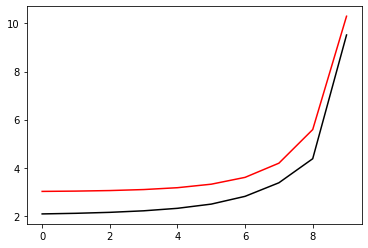

80300 0.07111477478071021 -0.7985100782667128 0.8199176546693593
[2.29657854 2.2820181  2.26889339 2.2591642  2.24958616 2.22741026
 2.14357946 1.9531912  2.96743294 9.41553956]


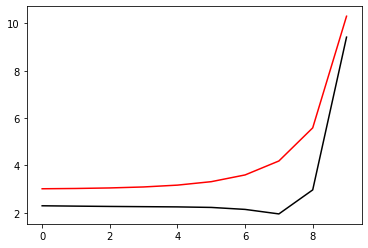

81400 0.16189777159121332 -0.8061367420562444 0.7980623742149984
[2.65076981 2.63604784 2.60851727 2.56538479 2.49581791 2.37378412
 2.15633609 1.86235237 2.57906028 9.28511254]


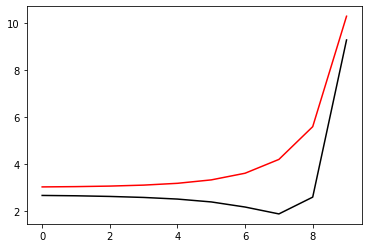

82500 0.03789759423212411 -0.7993508889767329 0.8112971377342556
[2.39637904 2.39411663 2.38330691 2.35733472 2.30850487 2.22315127
 2.08086553 1.92211811 2.6058542  9.38238991]


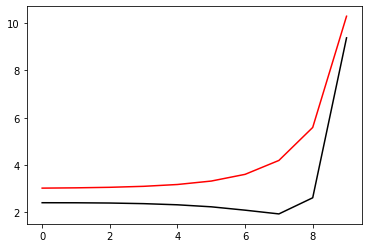

83600 0.044576988030991256 -0.8038560643030889 0.810601257394467
[2.32455636 2.32767881 2.33245    2.3359311  2.33446    2.322487
 2.29523612 2.30025901 2.99630429 9.37357197]


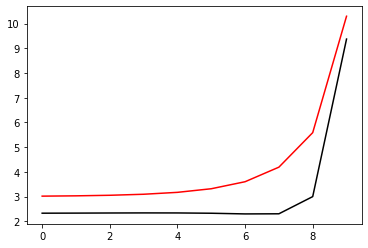

84700 0.054380543448447775 -0.8050692929593593 0.810247700493657
[2.28913259 2.29342063 2.307655   2.33408723 2.37524633 2.43504654
 2.52348756 2.69488619 3.4648552  9.45635931]


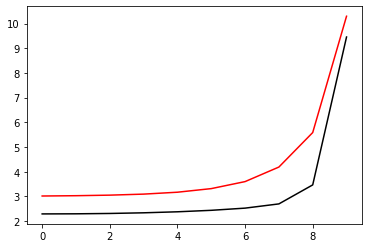

85800 0.1579255628241265 -0.8134797462525233 0.7895671001013026
[2.62456661 2.63441114 2.65799884 2.69730074 2.75072567 2.79781301
 2.75540053 2.60076518 3.26006923 9.33804417]


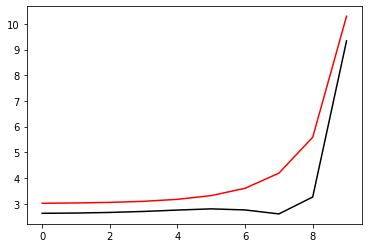

86900 0.0561006460507079 -0.8012217226528522 0.8072082413577305
[2.37100723 2.36797505 2.36145641 2.35036916 2.3284937  2.28285904
 2.20486684 2.1756781  2.96025936 9.38811992]


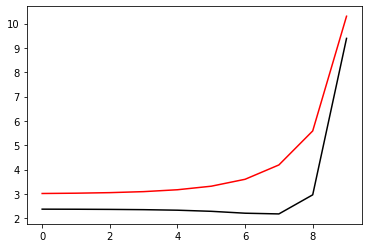

88000 0.08444235826516791 -0.8058003209486482 0.8064001972563274
[2.30268723 2.30681431 2.31717193 2.3363969  2.36710653 2.41344256
 2.48528935 2.63966268 3.44850665 9.41996442]


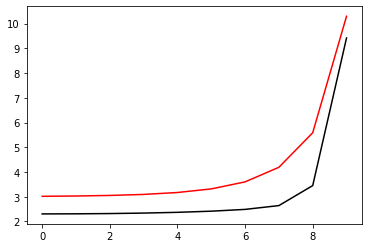

89100 0.2777512814106838 -0.8284214645371941 0.7945930953636798
[2.22920313 2.22293319 2.21737907 2.21414895 2.21411296 2.21995853
 2.24388111 2.35639487 3.08734403 9.33529252]


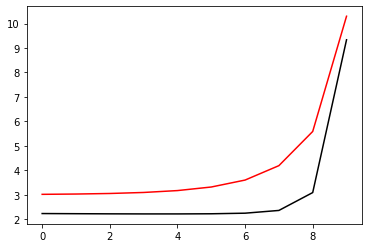

90200 0.07110330402856375 -0.8052656677284241 0.8060331134383687
[2.39192564 2.39895682 2.40278509 2.40138608 2.39286146 2.37254155
 2.34019327 2.36408827 2.99641939 9.39251994]


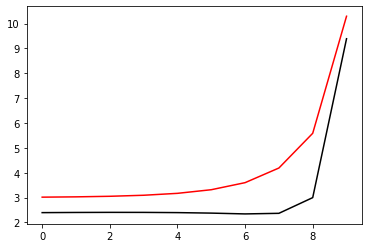

91300 0.05541636930995906 -0.8080521961650265 0.8052595621625394
[2.41498206 2.42532287 2.44210163 2.46330914 2.48726059 2.51172083
 2.53976108 2.63072714 3.30716464 9.41620825]


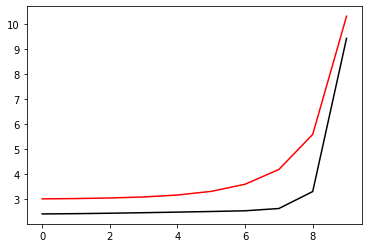

92400 0.1605666355186238 -0.8075580024411795 0.813623824026539
[1.95351472 1.94819364 1.94224118 1.93544095 1.92640567 1.9151227
 1.91185688 1.98770727 2.66313319 9.45817138]


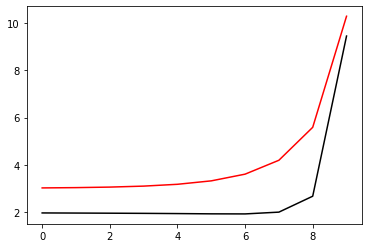

93500 0.038246202814453185 -0.8219878731390086 0.8012314983789579
[2.12348995 2.12300463 2.12109184 2.11683729 2.10950099 2.09922727
 2.09515947 2.16575871 2.82460696 9.35787727]


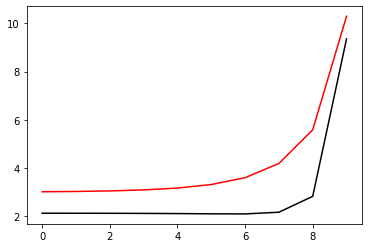

94600 0.032739299391599364 -0.8190427455099544 0.806665883248005
[2.02820198 2.02726748 2.03313879 2.04978892 2.08388335 2.14753109
 2.26465361 2.50691325 3.34097902 9.41467967]


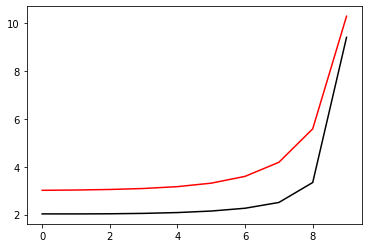

95700 0.041172543159434624 -0.8235335607051787 0.8051357407353169
[2.08603586 2.09834272 2.12430287 2.17258913 2.25439708 2.38797607
 2.60209016 2.96262653 3.87427888 9.37044457]


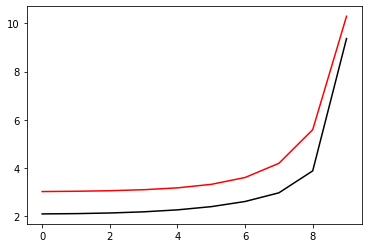

96800 0.044530790896213764 -0.8124710551067292 0.8147112287367362
[2.1891395  2.20565529 2.24048364 2.30300188 2.40903317 2.58250501
 2.86349851 3.33327234 4.3578972  9.52759877]


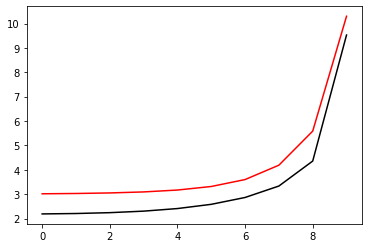

97900 0.039812983550249065 -0.8194389103023911 0.8117852471677832
[1.97995201 1.99391111 2.03019019 2.10356833 2.23902061 2.47887778
 2.89421393 3.60041571 4.89720379 9.53307897]


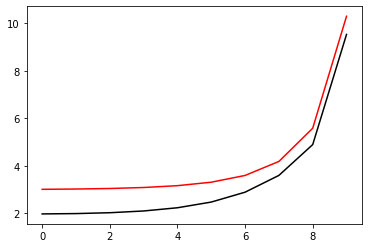

99000 0.16128469018648636 -0.8076829440912103 0.8216648304941457
[2.10714119 2.1091275  2.13109242 2.18764118 2.29414697 2.47647969
 2.79501203 3.41452497 4.76590831 9.64038618]


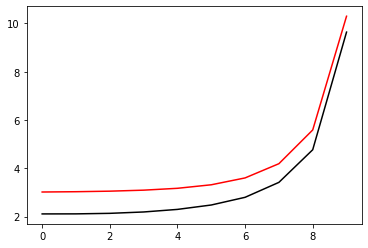

100100 0.05364394324825913 -0.8203306410835698 0.8141026736509969
[2.08204229 2.0856147  2.1034119  2.1496294  2.24641627 2.43086604
 2.77328451 3.42536974 4.83131722 9.53959444]


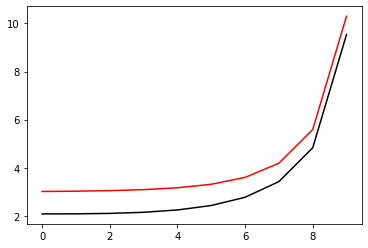

101200 0.058928872417782927 -0.8197407119584004 0.8168328643904794
[2.0868011  2.10241537 2.13799544 2.21044881 2.34483804 2.5850797
 3.01101059 3.77754778 5.29139079 9.58805989]


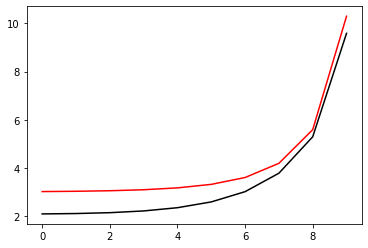

102300 0.03564213293894107 -0.8171014028988749 0.8197593598566498
[2.10732906 2.11309347 2.13903514 2.20479258 2.33694684 2.5823096
 3.03040821 3.85129842 5.43192464 9.71082069]


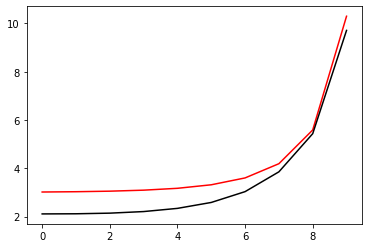

103400 0.19739412099854625 -0.8228850750447502 0.8429671161450407
[2.01463771 2.01505065 2.02070871 2.04347538 2.10027088 2.21479615
 2.42756057 2.9190645  4.31130422 9.5106169 ]


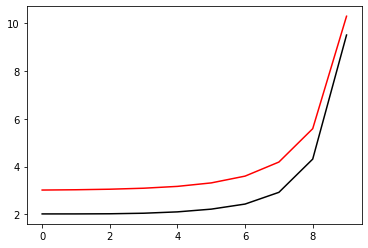

104500 0.02477909880170555 -0.8353355826277684 0.8234770498327809
[2.14403079 2.14096838 2.1426654  2.15924121 2.20630857 2.30750214
 2.50797261 2.97809299 4.33464071 9.4599271 ]


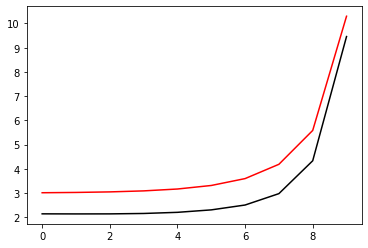

105600 0.025724941298921247 -0.8355960489498071 0.8225438004038562
[2.14736634 2.15030601 2.15964787 2.18390705 2.2385571  2.34985068
 2.57092632 3.06584825 4.43725068 9.51057105]


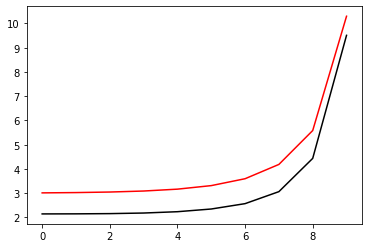

106700 0.03729798481474262 -0.830062808231813 0.8239605727288415
[2.21405364 2.22458636 2.24740176 2.28532039 2.34998821 2.4652311
 2.68183791 3.14625326 4.44058421 9.51958674]


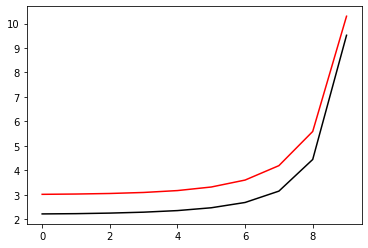

107800 0.07863589691410103 -0.8388329490742636 0.8190200305503527
[2.18016817 2.19270534 2.22280495 2.27899892 2.37732909 2.55061454
 2.86717387 3.47728166 4.86025735 9.55105914]


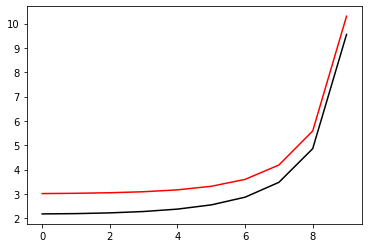

108900 0.22774159755529516 -0.8042052124942091 0.8580490892287437
[1.87839698 1.89385978 1.92460207 1.96883564 2.02950304 2.11619126
 2.2611827  2.63965302 3.9537296  9.48204383]


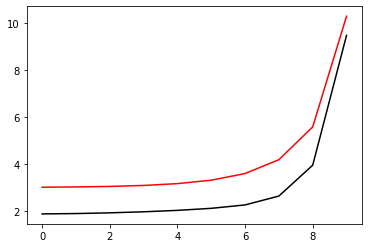

110000 0.23234201711912833 -0.842811690927414 0.8108957927472199
[2.2464309  2.23951161 2.24220794 2.25432926 2.27291714 2.29257104
 2.30897064 2.42092265 3.48367681 9.50455427]


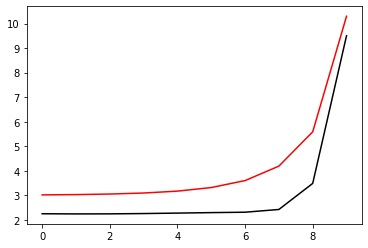

111100 0.12834069554934122 -0.8350336062784489 0.8162632267497235
[2.3997734  2.37651248 2.34147993 2.29714474 2.23997741 2.1592618
 2.05151442 2.03273592 2.97922903 9.36451995]


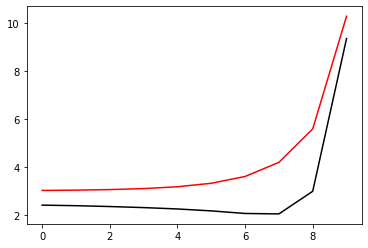

112200 0.08040144118399696 -0.8402768555848961 0.8145086313380228
[2.21418911 2.20333363 2.18133526 2.15205947 2.11970749 2.09011999
 2.08357099 2.21131262 3.22426414 9.43278291]


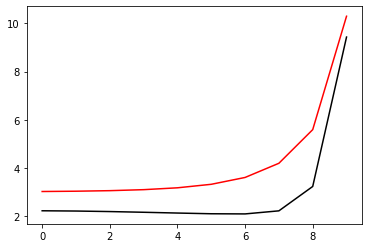

113300 0.03240931462722044 -0.8375185490542636 0.8189037700678712
[2.20226733 2.20811093 2.21433146 2.22399606 2.24466328 2.29031945
 2.38746519 2.62722651 3.63375432 9.41560297]


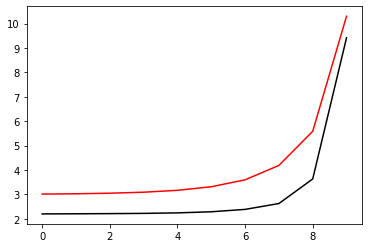

114400 0.051614570633260116 -0.8332478544452594 0.8259067573537607
[2.04864456 2.06904124 2.11471459 2.19224444 2.31680431 2.51666796
 2.83322705 3.31557589 4.38114166 9.57515198]


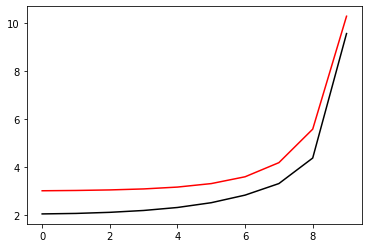

115500 0.026429867743373 -0.8329883874325398 0.8264400171949516
[2.17702433 2.19854523 2.25140266 2.34646659 2.49924746 2.7360027
 3.09986755 3.68009512 4.80960122 9.50828588]


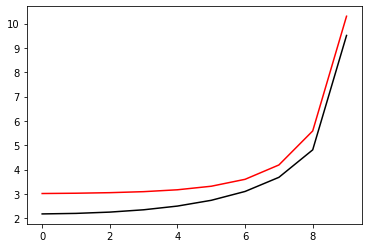

116600 0.0415673067500463 -0.8343793844278585 0.8269891123267579
[2.21443201 2.22935691 2.27446545 2.37190603 2.54777554 2.84442901
 3.32881711 4.09974396 5.40397203 9.62037905]


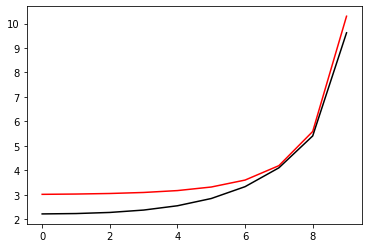

117700 0.23995374643967138 -0.8192718418858098 0.8501389107717038
[1.91833615 1.94815887 1.99876923 2.07860275 2.20349473 2.39923244
 2.7117838  3.26861416 4.47493605 9.48348056]


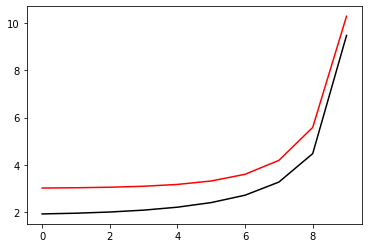

118800 0.058427110702147594 -0.8281879070923538 0.8344758302801385
[2.2024659  2.20525991 2.21973395 2.24637422 2.28178255 2.30951345
 2.29846262 2.53662198 3.72316709 9.38961567]


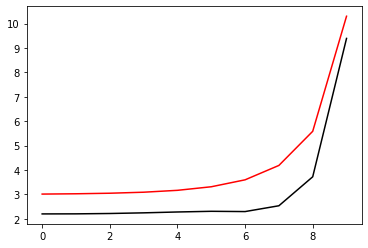

119900 0.13582701355359744 -0.8298252962722661 0.8356208438354552
[2.00768395 2.02689906 2.0548674  2.09504383 2.14923885 2.21746822
 2.31528147 2.62130962 3.82431388 9.50101557]


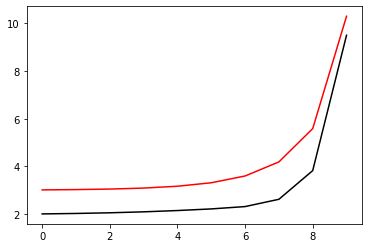

121000 0.07527308149812108 -0.8395747090591427 0.8278185610719013
[2.12478625 2.13809818 2.16387859 2.20168452 2.25225568 2.31980527
 2.42747496 2.70824642 3.82689982 9.45767756]


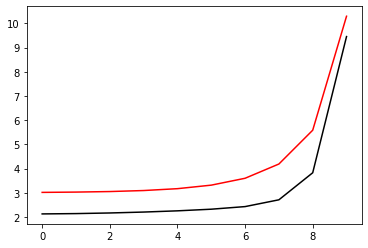

122100 0.0337821662838894 -0.8431877701573347 0.8254465948147411
[2.08720862 2.10031734 2.13193455 2.18673298 2.27424913 2.41372784
 2.6461171  3.07434175 4.23992329 9.47935444]


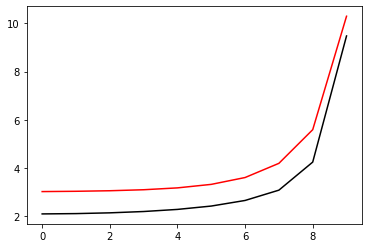

123200 0.059776617779767095 -0.8432240577658678 0.8273704400365414
[2.08338689 2.11604662 2.17789492 2.27720611 2.43154531 2.67154541
 3.04403213 3.62204188 4.82351084 9.55219383]


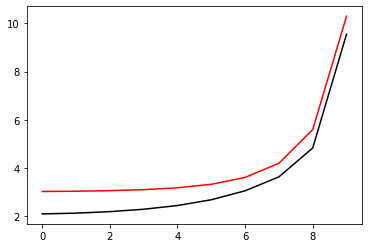

124300 0.02958160344318773 -0.8421513598537002 0.822727678415505
[2.14853207 2.16772112 2.21174417 2.27838321 2.36297451 2.44875887
 2.49848889 2.65696271 3.794575   9.46295349]


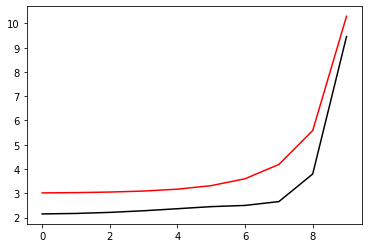

125400 0.05468102722119869 -0.8393234274204102 0.8254366334605888
[2.11202942 2.12980384 2.17007558 2.23595992 2.3305767  2.4621052
 2.65875446 3.00172385 4.06273268 9.37140181]


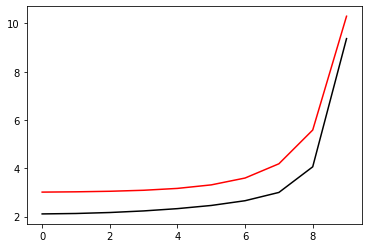

126500 0.026491407045820346 -0.8385306198302347 0.8277582202479714
[2.21002107 2.2280311  2.28072298 2.37450925 2.52736952 2.77305338
 3.15232602 3.6682199  4.65313083 9.54126663]


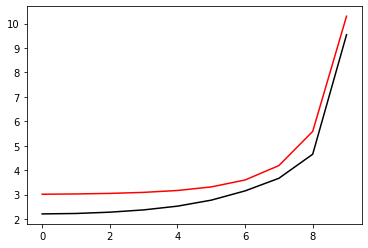

127600 0.02918817305624795 -0.8370335018390894 0.8278617529118527
[2.13528468 2.15770704 2.21216739 2.30927043 2.46813944 2.7155
 3.08279522 3.67072222 4.81233844 9.54563006]


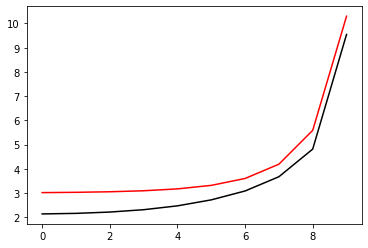

128700 0.022447752730150462 -0.8410125135811948 0.8288667899977259
[2.11719702 2.14141161 2.19897584 2.30604139 2.48858782 2.79271898
 3.3029368  4.12808267 5.42180582 9.68046534]


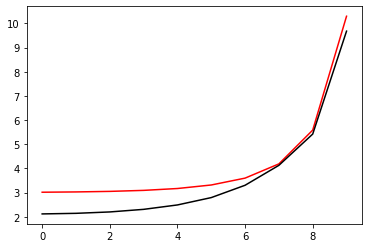

129800 0.2647524400736384 -0.8308921787667394 0.8212619918287855
[2.59150963 2.60506924 2.64018583 2.70888454 2.82505342 3.00066129
 3.23964    3.62241205 4.72940977 9.51858385]


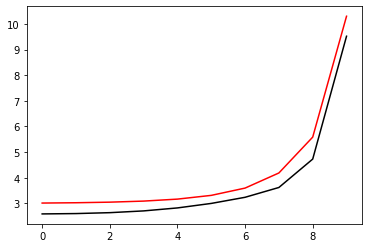

130900 0.12704439354702352 -0.8423706817659266 0.830138891559472
[2.45683773 2.44027992 2.43789097 2.45932895 2.5128575  2.60259196
 2.72579298 2.95119584 3.86170692 9.467632  ]


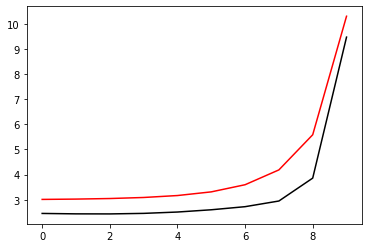

132000 0.06637836613838782 -0.8232592615777339 0.8412758293555076
[2.46977385 2.46261918 2.45910841 2.47199781 2.51010816 2.5776646
 2.67738054 2.8790759  3.7556197  9.44857101]


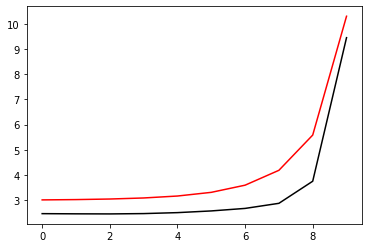

133100 0.05572040029687149 -0.8270292497898499 0.8379063455925813
[2.48534085 2.48901345 2.49766374 2.51962336 2.56582417 2.64724638
 2.77946355 3.03563716 3.94226218 9.48119351]


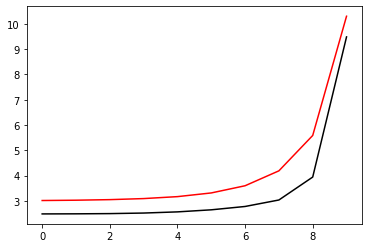

134200 0.05439615882056912 -0.8282599619957305 0.8375390949981272
[2.44839681 2.45729038 2.47444165 2.50477108 2.55766139 2.64876721
 2.8077567  3.12370674 4.08293076 9.48155154]


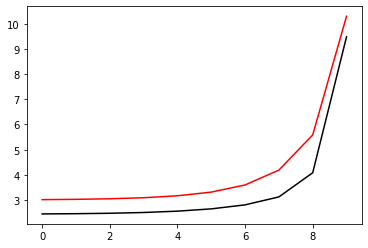

135300 0.0511691709073127 -0.8300729941824742 0.8367010138900942
[2.44946704 2.45751303 2.47720991 2.51400675 2.57790452 2.68786905
 2.88421726 3.27417736 4.31539237 9.55474434]


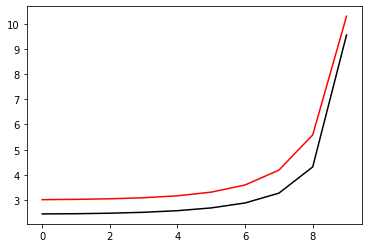

136400 0.32364393664496527 -0.8211765016624908 0.8684131389362733
[2.13724887 2.1552437  2.17907    2.21243784 2.26351471 2.34873218
 2.50570159 2.84111653 3.80675048 9.46053099]


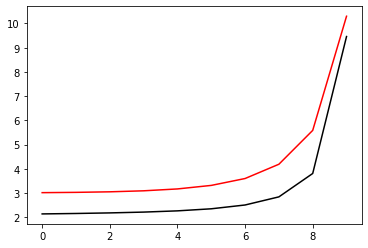

137500 0.24495802127523209 -0.8110665340025908 0.8980295432004574
[1.83516139 1.8462438  1.86771277 1.90056012 1.95248256 2.04172306
 2.21017742 2.57161106 3.5860376  9.34192823]


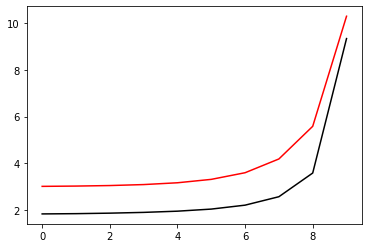

138600 0.21576686633811534 -0.822295485398742 0.887565257171961
[1.85683233 1.87118426 1.89630073 1.93121077 1.98012059 2.05706057
 2.20001436 2.52333676 3.50422726 9.43414814]


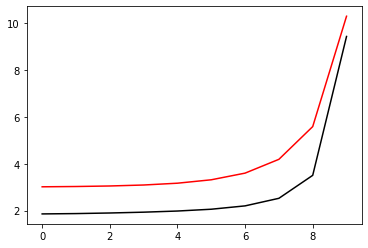

139700 0.08041398679411911 -0.849956371981188 0.8525779050553425
[2.18087586 2.17683842 2.17587177 2.17656594 2.17626442 2.17640376
 2.19835726 2.35024379 3.15968148 9.40002075]


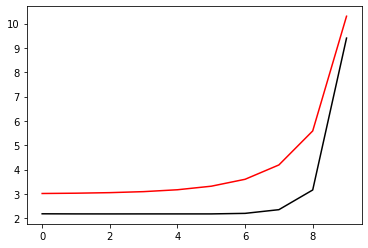

140800 0.053264076566829154 -0.8588243923635194 0.8420215218683565
[2.29635734 2.30175144 2.31100329 2.3257653  2.34985299 2.39093094
 2.46937278 2.66941342 3.49495983 9.49021168]


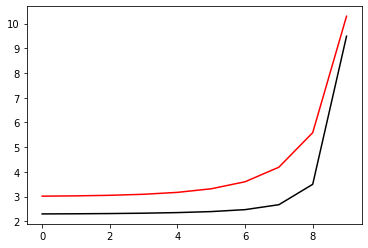

141900 0.04753290104396685 -0.8589213846627406 0.8424893964191377
[2.25089084 2.2545024  2.26740283 2.29509395 2.34464582 2.4303743
 2.58471385 2.89424508 3.79161422 9.46814664]


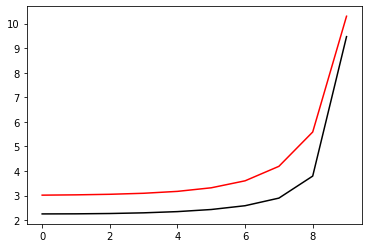

143000 0.08101309248403875 -0.851336529953943 0.8499660121975755
[2.38068098 2.39045985 2.4151195  2.46142546 2.53977894 2.66813734
 2.88162832 3.26666815 4.21974734 9.48171195]


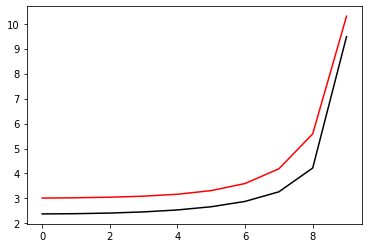

144100 0.055340187641391016 -0.8558091565646005 0.846625040888206
[2.29859833 2.31930977 2.36054113 2.42585116 2.52794675 2.68998586
 2.95806106 3.43973527 4.5171532  9.58159378]


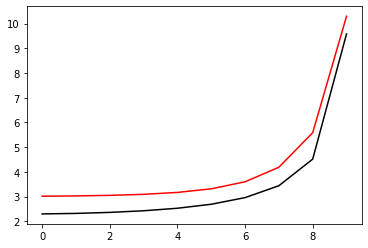

145200 0.1718377618213012 -0.8580079817769034 0.846017751833235
[2.37876559 2.39726105 2.44118675 2.52645445 2.67446321 2.92105196
 3.3288196  4.00199543 5.25083037 9.58451015]


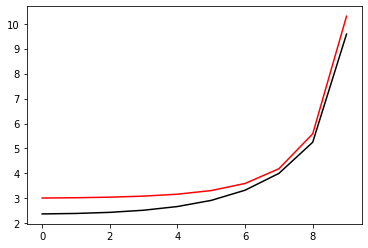

146300 0.03992765878686687 -0.8562565383569839 0.8494341858086749
[2.2711569  2.27874119 2.30114258 2.34714072 2.42803739 2.56055358
 2.77488027 3.15822416 4.15308765 9.48496138]


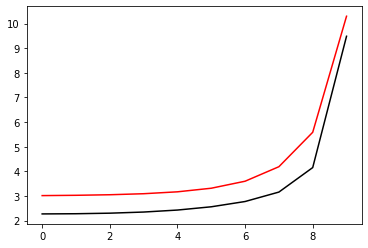

147400 0.056925234555172205 -0.8628773478648181 0.8446370436500785
[2.22548852 2.23540529 2.25437924 2.28596863 2.33678574 2.41817262
 2.5573477  2.85328584 3.78236506 9.42827975]


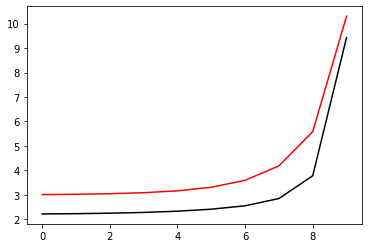

148500 0.1165546092497688 -0.8451281615629236 0.8665617893771825
[2.03114284 2.04953313 2.07788874 2.11312906 2.15575803 2.20838175
 2.28358413 2.46791301 3.29694301 9.49398491]


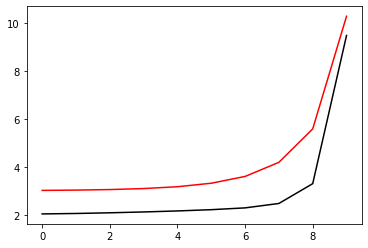

149600 0.12452658281553651 -0.8520595936607055 0.8367140754864327
[2.57112722 2.57263191 2.57712281 2.57686836 2.55957548 2.50104269
 2.36015678 2.19069548 2.71865029 9.33894009]


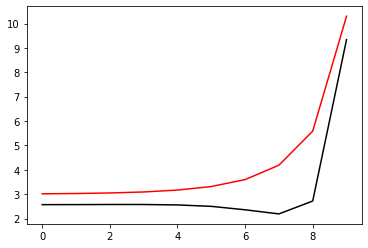

150700 0.05487656989785565 -0.842587012854246 0.8485629984134259
[2.50091628 2.50557222 2.51307094 2.51873633 2.51435368 2.48673722
 2.42261416 2.36123354 2.89826333 9.38823799]


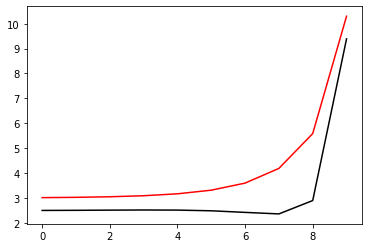

151800 0.04429304699137462 -0.8433051247266146 0.8489833422167496
[2.47839795 2.48203211 2.48931087 2.49872802 2.50777014 2.51398097
 2.52037769 2.57137565 3.14215729 9.33151003]


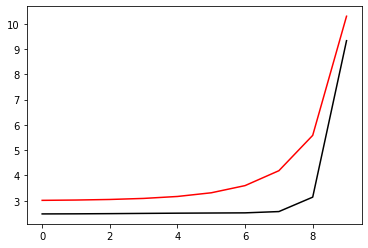

152900 0.04427630379731814 -0.8466745835294479 0.8471642465240685
[2.43010953 2.43302577 2.44146084 2.45824323 2.48763636 2.53838488
 2.63160636 2.83093384 3.51810481 9.4453394 ]


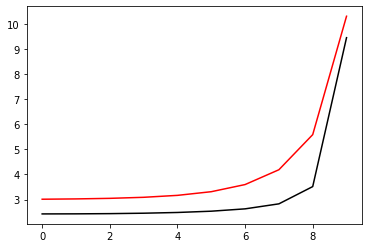

154000 0.08993644890336347 -0.8494219281951331 0.8454776722054256
[2.47014096 2.47974043 2.50179812 2.5419     2.61052961 2.72733056
 2.92570636 3.2752227  4.11736283 9.4742514 ]


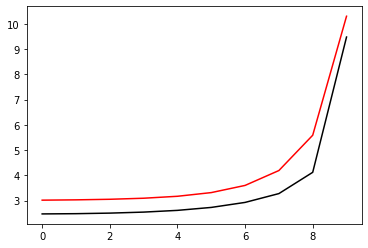

155100 0.0621119528958066 -0.8450123974288947 0.8512351965527829
[2.27373156 2.29497245 2.3260522  2.3641443  2.41150043 2.4748039
 2.57225107 2.77251304 3.49566222 9.48375824]


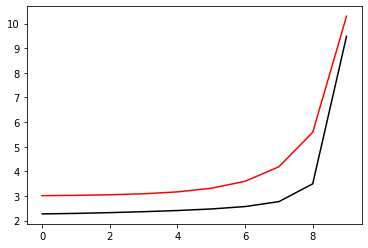

156200 0.0543301008826011 -0.8481035544646539 0.8485734910361559
[2.33963351 2.35694405 2.39160301 2.45016733 2.54181274 2.68482994
 2.91852634 3.33347546 4.278588   9.44841954]


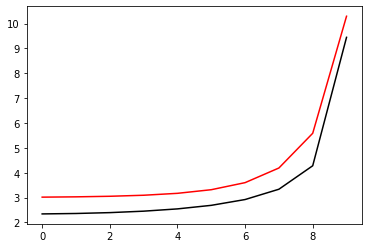

157300 0.032830283674085234 -0.8510045084081503 0.8482769673410867
[2.30825666 2.32656433 2.36919795 2.44609594 2.57705642 2.79526927
 3.1610987  3.79065363 4.99049666 9.60035244]


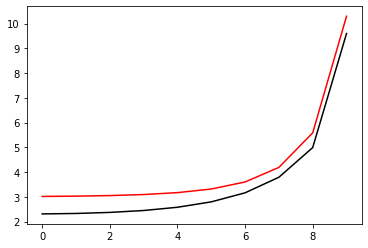

158400 0.17999448471391072 -0.8551637882689279 0.8523800399197079
[2.02250533 2.04535832 2.09108458 2.16799359 2.29192935 2.48866461
 2.80890751 3.40256507 4.67796647 9.49697954]


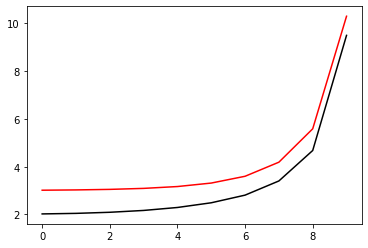

159500 0.03409832979872228 -0.8397429071816017 0.8449898054997992
[2.35281053 2.37740758 2.42854679 2.50959327 2.63086165 2.80904226
 3.06906086 3.48578575 4.51671907 9.55693829]


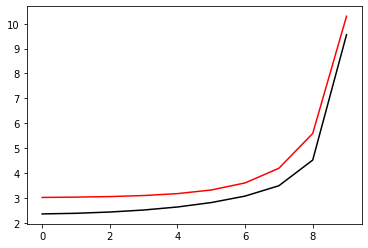

160600 0.2448047056916395 -0.8254251091699042 0.8671699662002883
[2.10471431 2.12953597 2.1803965  2.26123628 2.38146133 2.56186061
 2.85379024 3.37999812 4.47966569 9.5299522 ]


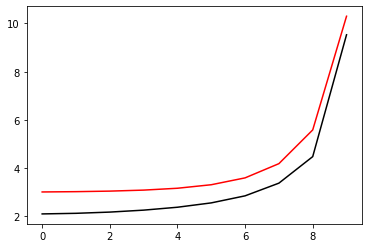

161700 0.21080360587843072 -0.8323888175769119 0.8589418248376263
[2.22546791 2.21085536 2.1980002  2.18827572 2.18130539 2.19206803
 2.28747447 2.63075974 3.65321691 9.44132472]


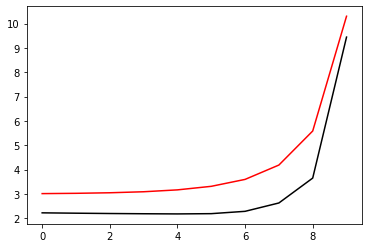

162800 0.05379937853492782 -0.8480400808655055 0.8451348123109095
[2.30425004 2.30549342 2.30815791 2.31736999 2.34138861 2.39498991
 2.51752545 2.84817582 3.8727036  9.44327727]


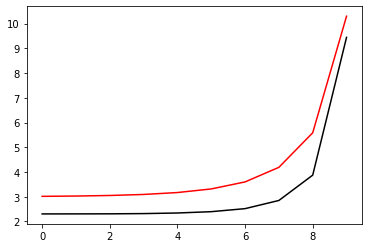

163900 0.04404122176080787 -0.848180662827552 0.8464350661742819
[2.30093666 2.31183103 2.33512301 2.37902728 2.45527156 2.58227181
 2.79433907 3.19157346 4.25212649 9.48934496]


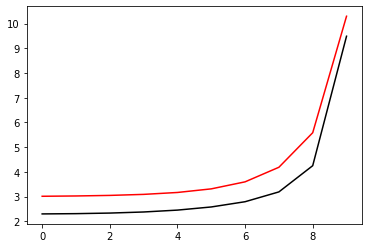

165000 0.055474250002953286 -0.8528954412399717 0.8455445460508796
[2.17423368 2.19222855 2.23518482 2.31729217 2.46044197 2.69843108
 3.07806344 3.67310434 4.85225481 9.66133683]


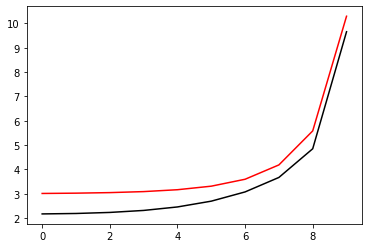

166100 0.23744422135382587 -0.8461963274611067 0.8259426823440537
[2.66002298 2.64553058 2.64543947 2.66723166 2.71671622 2.78803435
 2.81585971 2.66766038 3.697214   9.4581647 ]


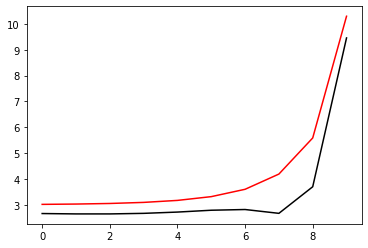

167200 0.3294755778123245 -0.8516689891324377 0.8163612703534582
[2.53752802 2.51384307 2.48320732 2.45063858 2.40993334 2.33972252
 2.20395312 2.00796259 3.02104783 9.36021441]


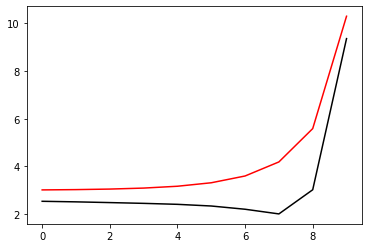

168300 0.056486306726599614 -0.8288040826443639 0.8406776212815827
[2.48600686 2.47584096 2.4528892  2.41952126 2.3730546  2.29909087
 2.17050225 2.0226626  2.97669762 9.39743055]


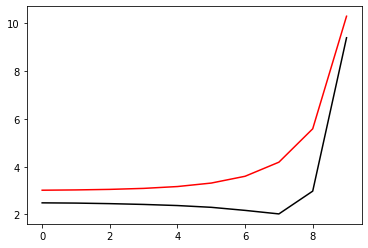

169400 0.03452977666130363 -0.8331232528861146 0.8364653621429036
[2.50813651 2.50802147 2.50458423 2.49561932 2.47844594 2.44422905
 2.37460192 2.30954032 3.17918448 9.39986648]


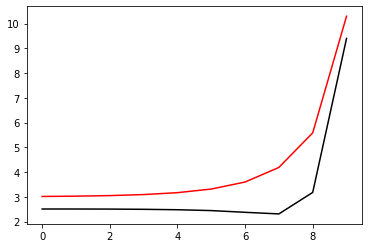

170500 0.03414844043204442 -0.832208060071044 0.8386737117353266
[2.41942863 2.42432677 2.4335442  2.44592581 2.46093367 2.47749201
 2.49463771 2.5602439  3.39097975 9.46174915]


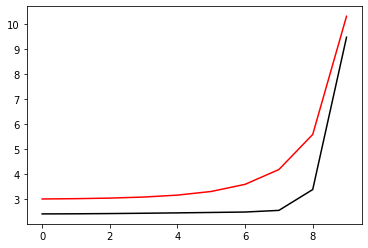

171600 0.04415577211051347 -0.8353346108121213 0.8368478225355785
[2.42092748 2.42437618 2.43487421 2.45038528 2.46892723 2.4888881
 2.51276057 2.60271166 3.3429859  9.4291845 ]


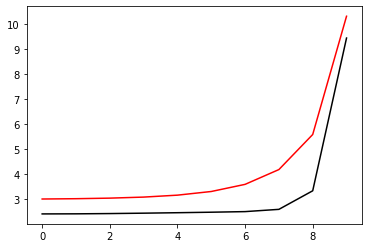

172700 0.04051345970979353 -0.8371608375238347 0.8372649491953938
[2.25831604 2.26534687 2.28607677 2.32550413 2.39064298 2.49338079
 2.65663261 2.9508281  3.85423625 9.5245414 ]


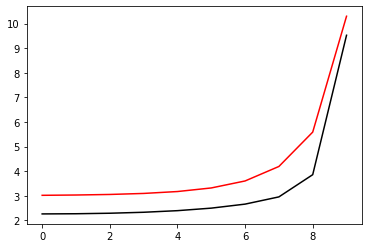

173800 0.044421530945556134 -0.8378000560569268 0.8374867107365146
[2.28246716 2.29455348 2.32420207 2.38015051 2.47481443 2.6289501
 2.88153054 3.32454273 4.36432034 9.48071932]


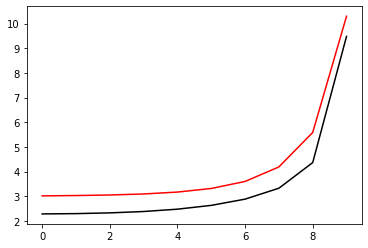

174900 0.04448503666713 -0.8389367422272013 0.8371049050958356
[2.32537712 2.3386535  2.37165089 2.43419325 2.54209028 2.72277659
 3.0302617  3.5890392  4.79161297 9.54425254]


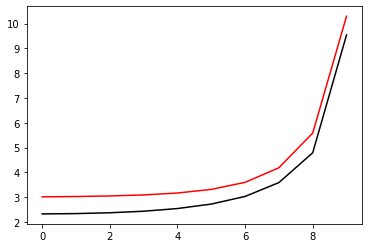

176000 0.05822435021666417 -0.8415078477769616 0.8373484689074939
[2.16191776 2.19601368 2.25560903 2.34915848 2.49208679 2.71371974
 3.07244245 3.70060884 5.01743022 9.53934384]


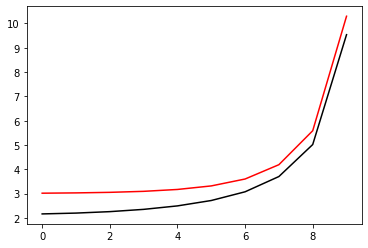

177100 0.03645078332926458 -0.8461048696229427 0.8352827031845635
[2.03470672 2.05610774 2.10802805 2.20795711 2.38367236 2.68091948
 3.18047047 4.03195691 5.5969019  9.6326086 ]


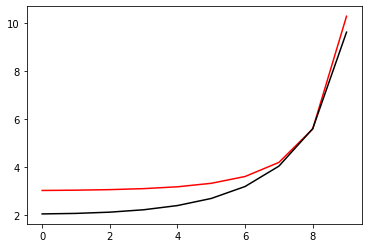

178200 0.056103931465073226 -0.839845826404787 0.8409946220308541
[2.21002564 2.22838051 2.27723344 2.37411582 2.54355456 2.82718904
 3.30429637 4.14281026 5.74578963 9.59723763]


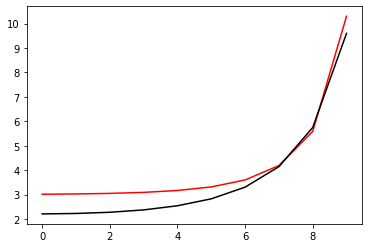

179300 0.15394248694442142 -0.8294990374728086 0.84904498552244
[2.23075733 2.22425114 2.23168802 2.26726863 2.34828761 2.49861857
 2.76187432 3.30398862 4.88459232 9.64007282]


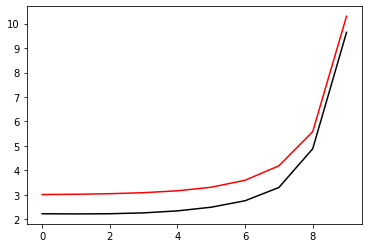

180400 0.045904129880293576 -0.8429227759417337 0.8410259369140298
[2.14236121 2.15317162 2.17768837 2.22491607 2.3143111  2.48038944
 2.78934249 3.40149684 4.93323218 9.51250321]


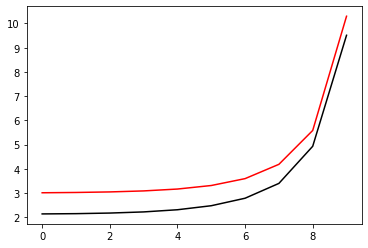

181500 0.0257088945197621 -0.8414841208445312 0.8424762408236045
[2.23601298 2.24916876 2.284587   2.35321855 2.47527573 2.68795602
 3.06275576 3.75797456 5.27899363 9.59895039]


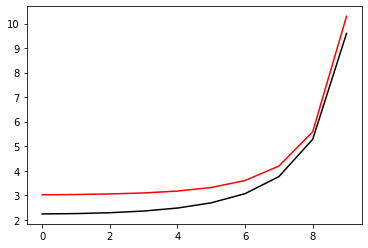

182600 0.02670222249222899 -0.8428581736809492 0.8435917829005056
[2.1396873  2.15199734 2.19190271 2.27457977 2.4267346  2.69756768
 3.1779809  4.03229047 5.67199841 9.59780851]


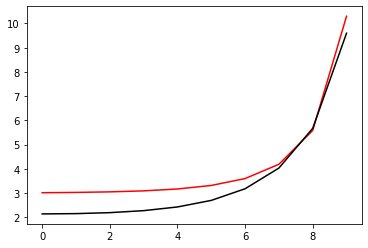

183700 0.30107921433966767 -0.862600428664171 0.8150143560737729
[2.79824684 2.80772222 2.82507691 2.8540411  2.89070542 2.91918933
 2.97617803 3.44372258 4.90639305 9.58319992]


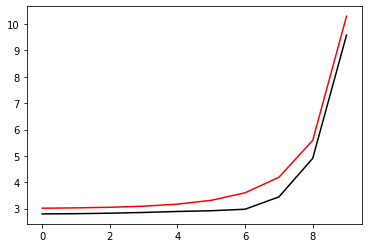

184800 0.037691822768377535 -0.8350425966433036 0.8443598801825603
[2.57660239 2.56457703 2.5403861  2.50793843 2.47453482 2.4613117
 2.54510077 3.00426739 4.51181612 9.47524529]


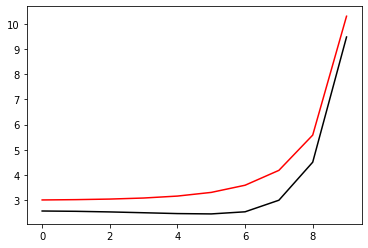

185900 0.052857668997181154 -0.8354017318687214 0.844526002373147
[2.55573371 2.55614937 2.55555591 2.55586131 2.56455285 2.60199253
 2.72849615 3.1440417  4.55664862 9.52441991]


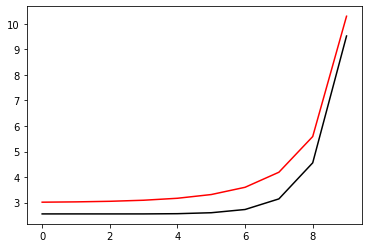

187000 0.42847417412988675 -0.8321306793454101 0.8480010337908889
[2.58292942 2.61299266 2.65386895 2.70384725 2.77021235 2.87068119
 3.05241905 3.46863478 4.75359082 9.63543069]


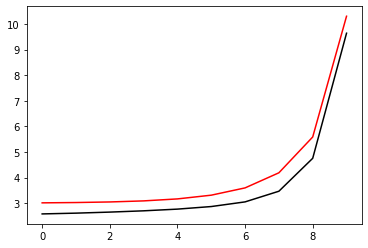

188100 0.1839439689244505 -0.8435595062544721 0.8574250615466961
[2.07854703 2.09966419 2.13337297 2.17731745 2.23502606 2.32194001
 2.48302081 2.86789753 4.09840098 9.49546897]


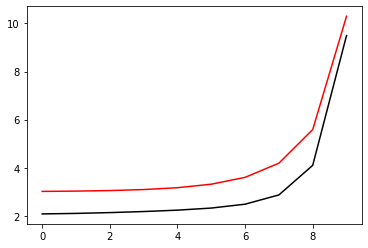

189200 0.4372286942699179 -0.8018359303046287 0.9003826593801427
[2.06963793 2.07905471 2.09318368 2.10525031 2.11271159 2.12360924
 2.17686509 2.41825469 3.47055998 9.42579983]


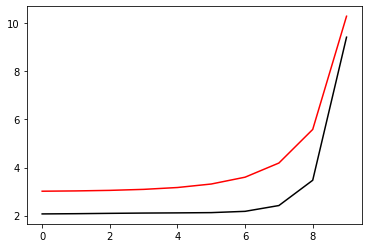

190300 0.22597577832622323 -0.8334982309711525 0.8793067142070597
[1.8777759  1.87097742 1.86146137 1.85064822 1.83935235 1.83763428
 1.88815642 2.14031656 3.2144194  9.37126315]


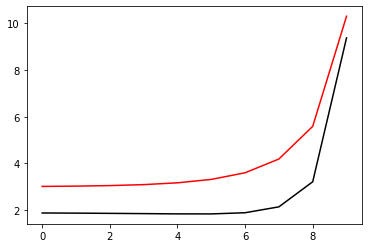

191400 0.055774581702489626 -0.8623151145257638 0.842298927449762
[2.30786836 2.30433282 2.29353525 2.27008332 2.2263176  2.15511853
 2.06705347 2.09286238 2.95510971 9.38733454]


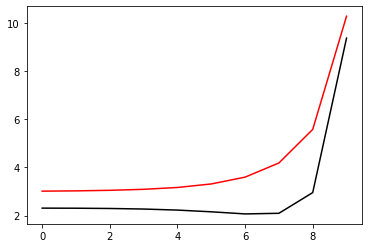

192500 0.028055025887217748 -0.8605614714631382 0.8452200796062735
[2.36947689 2.3682657  2.37144423 2.3788722  2.39152488 2.41262971
 2.44994026 2.56590748 3.38378248 9.34044511]


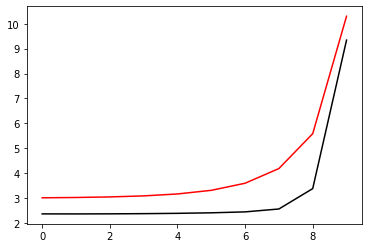

193600 0.028167146856459633 -0.8584464360843884 0.8490696516968333
[2.271475   2.27012835 2.2781016  2.30128046 2.34827053 2.43358612
 2.58307285 2.86303136 3.76085535 9.44071001]


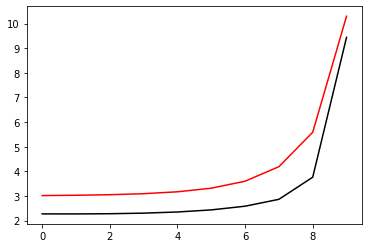

194700 0.04010390723238655 -0.8509112513210833 0.85488972458665
[2.28237646 2.29663004 2.32326899 2.36035675 2.40830566 2.46868679
 2.54266668 2.67525495 3.43126986 9.41622503]


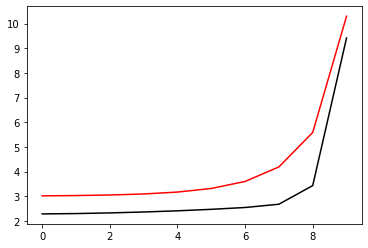

195800 0.044277876664454444 -0.853547084909347 0.852437018651874
[2.35830354 2.37292316 2.40427602 2.45814299 2.54240238 2.67159306
 2.87309601 3.20744101 4.06005979 9.55846929]


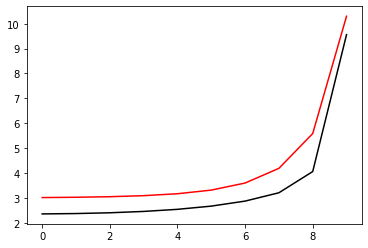

196900 0.04438715869661052 -0.8543044768719599 0.8533349779871943
[2.34638481 2.36145928 2.39673295 2.46192215 2.57398877 2.76017108
 3.06817498 3.58988984 4.6376705  9.54193652]


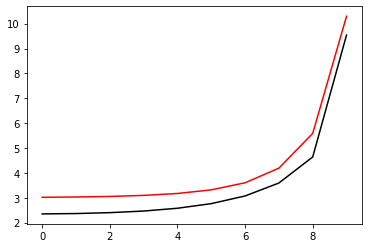

198000 0.17300302225096284 -0.8627057870640791 0.8475489816947996
[2.40264861 2.4136208  2.45264154 2.53361193 2.68034141 2.93212672
 3.35724113 4.07501276 5.35257124 9.57679981]


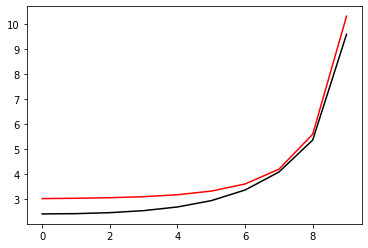

199100 0.0300289840069502 -0.8611999460875865 0.849747288730188
[2.20548682 2.2050742  2.2168858  2.25735399 2.35001292 2.53299494
 2.87779639 3.5336964  4.88114262 9.59841075]


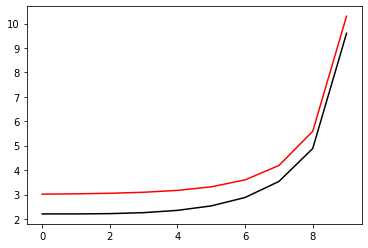

200200 0.09598326532895979 -0.8472825123927376 0.8593563107224784
[2.55490265 2.56618036 2.59630554 2.66125383 2.78620924 3.00897239
 3.34987224 3.67254172 5.04564622 9.56634042]


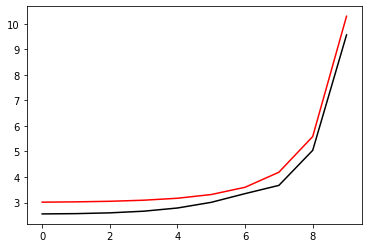

201300 0.049209479514477836 -0.845756117590694 0.8598486470709555
[2.38614797 2.3844241  2.38791546 2.4118303  2.47304241 2.59177084
 2.77688532 3.00777877 4.32559596 9.49950369]


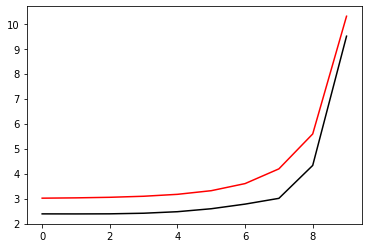

202400 0.03392207761604054 -0.8481103829779699 0.8537128245231616
[2.48429148 2.47714082 2.4703523  2.47620864 2.50874486 2.58240228
 2.70843549 2.92950189 4.13174367 9.55786385]


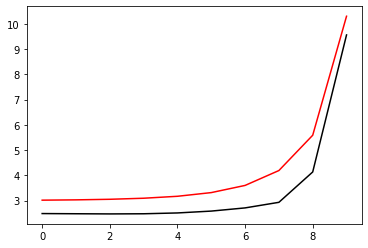

203500 0.030269336735932417 -0.8527866137316653 0.8516011684101288
[2.40797288 2.40553375 2.40627228 2.41868278 2.45612988 2.53868617
 2.70074903 3.0460459  4.26333289 9.48726228]


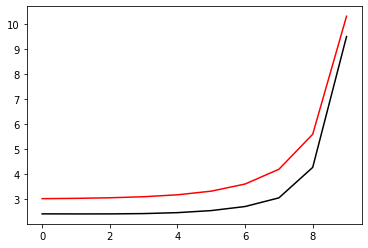

204600 0.034751085045199 -0.857633598485097 0.8491914035269771
[2.3292147  2.33133733 2.34429531 2.37757788 2.44777406 2.5859545
 2.85303983 3.3880797  4.7094037  9.53716423]


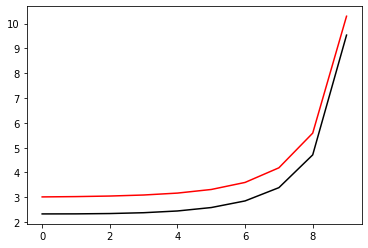

205700 0.05498087174128535 -0.8559832916893213 0.847714667717317
[2.53519469 2.52470352 2.51725625 2.51919986 2.53609643 2.57819484
 2.68577097 3.0251152  4.19121514 9.46299944]


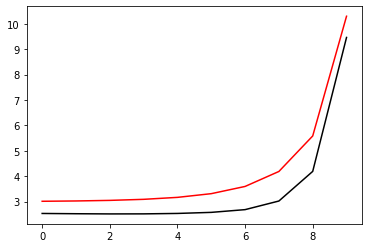

206800 0.04403110093091711 -0.8549061206457461 0.8495911228267982
[2.47518775 2.46851041 2.457091   2.44670494 2.44686774 2.47619271
 2.58056683 2.91227682 4.07898092 9.53536393]


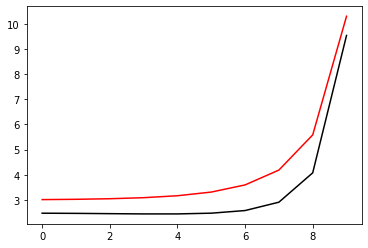

207900 0.044093546472606236 -0.862404560709692 0.8484396924553285
[2.25871108 2.26389095 2.26566872 2.26350801 2.26232419 2.27540426
 2.34075496 2.59165594 3.63024396 9.49637596]


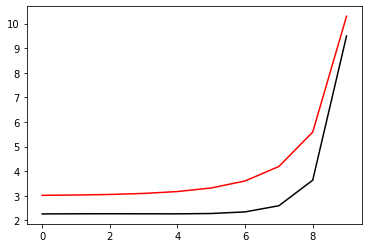

209000 0.05375150830988916 -0.8635755848515566 0.8471085289834677
[2.31460208 2.324614   2.34079686 2.36511669 2.40405754 2.47475651
 2.61969773 2.96019277 4.03226668 9.47608501]


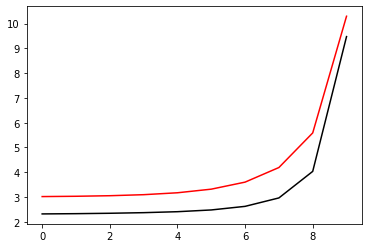

210100 0.3893156979601888 -0.8094397566039957 0.89385841225018
[2.17056358 2.1995557  2.23667704 2.28253044 2.34197695 2.42130116
 2.51862142 2.69565563 3.67187545 9.43317503]


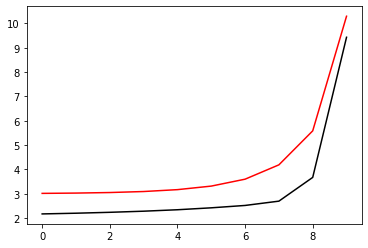

211200 0.3481916088484843 -0.8400508474873049 0.8738964778874511
[1.99865953 2.00916603 2.02934443 2.05398105 2.07750321 2.09193402
 2.10048683 2.27512732 3.38186065 9.34916901]


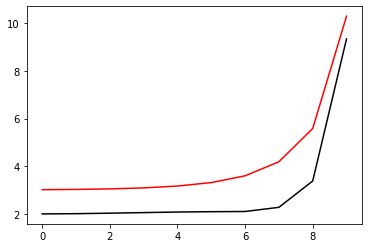

212300 0.03164241325419685 -0.8643831537685789 0.8428843334119557
[2.31368471 2.32147296 2.33951502 2.36824738 2.40762645 2.45900597
 2.53196104 2.67524647 3.54046848 9.42761397]


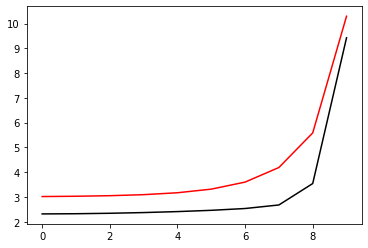

213400 0.057994566546922935 -0.8626491042472563 0.8444946508253327
[2.33056761 2.33937595 2.36091804 2.39814807 2.45677492 2.54921869
 2.69998403 2.95640322 3.80089412 9.46876992]


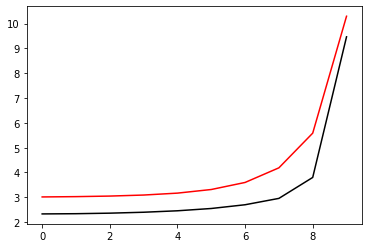

214500 0.025023361695125784 -0.8571095121161036 0.8534912083835244
[2.23830465 2.26173357 2.31444441 2.40254861 2.54111145 2.76103379
 3.11000463 3.63655543 4.5661124  9.46008857]


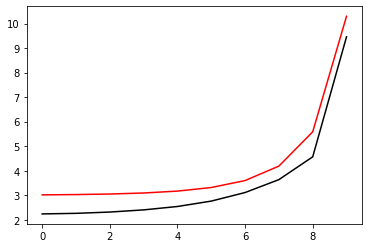

215600 0.018851624784852142 -0.8604886307813757 0.8531661130007815
[2.15538823 2.18192655 2.24340303 2.35221027 2.53252575 2.82268604
 3.28470107 4.00957879 5.14995211 9.56711511]


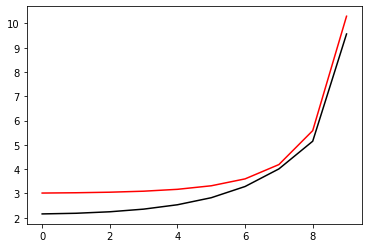

216700 0.03589254535361541 -0.8576424387801543 0.8584493594291234
[2.26589088 2.28760799 2.34160874 2.438884   2.59815291 2.84723789
 3.20043726 3.44129991 4.45061742 9.47865905]


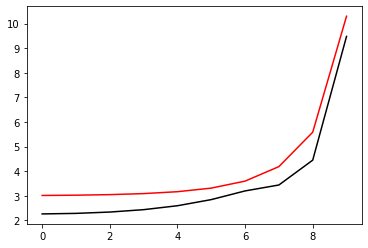

217800 0.05034941849483705 -0.8666068165014756 0.852023695118712
[2.23255625 2.25492212 2.30883084 2.40661204 2.56702091 2.81607652
 3.16545793 3.49724272 4.53372971 9.51109367]


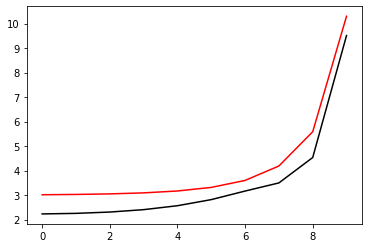

218900 0.03215921695314621 -0.8662856136141295 0.8553484902995531
[2.23084259 2.25483081 2.31203281 2.41578217 2.58601503 2.8495799
 3.2274668  3.69982518 4.81200254 9.53721141]


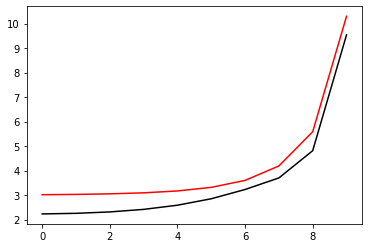

220000 0.21891738804530497 -0.8540678535872737 0.872869008950919
[2.03441835 2.05646726 2.10879476 2.20668023 2.36908592 2.62294045
 3.00514277 3.58126314 4.78586493 9.49940139]


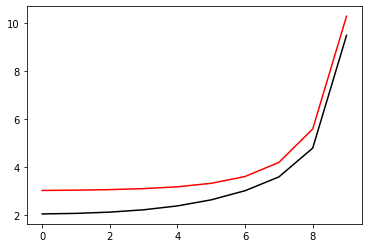

221100 0.030005560792959247 -0.8718705991266801 0.8544832507848616
[2.21114255 2.23306032 2.28309502 2.37015457 2.50903416 2.72125112
 3.03976482 3.53922698 4.628087   9.51592277]


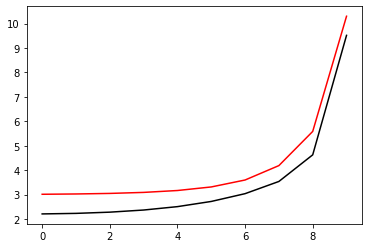

222200 0.05782993734116523 -0.8724477889327481 0.8554458307679106
[2.25490728 2.28157081 2.33975951 2.44275565 2.61080434 2.87734115
 3.29740592 3.96365556 5.19124967 9.59748042]


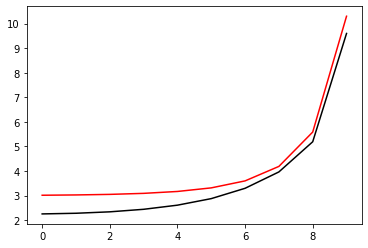

223300 0.1752499454264718 -0.8741121608660163 0.8505109784469537
[2.23592855 2.21091296 2.20826941 2.24151889 2.32379397 2.47082596
 2.71293244 3.18304292 4.39933743 9.60017317]


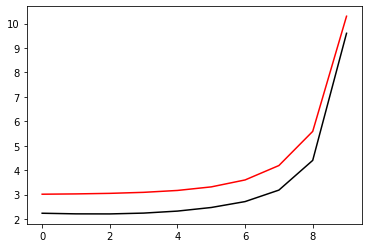

224400 0.08928588817129066 -0.866804729752595 0.84814436406432
[2.44408853 2.42836282 2.40603587 2.39185572 2.3901428  2.39942178
 2.44582944 2.71835235 3.82682803 9.45017384]


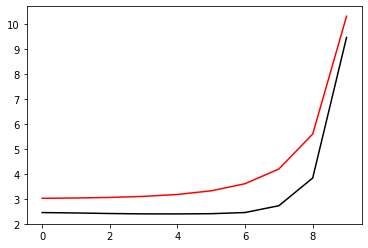

225500 0.026865792817735757 -0.864242617104382 0.8538430882793968
[2.43998061 2.4301089  2.4154154  2.40562081 2.41056881 2.44164015
 2.53289496 2.83108462 3.93596078 9.46967906]


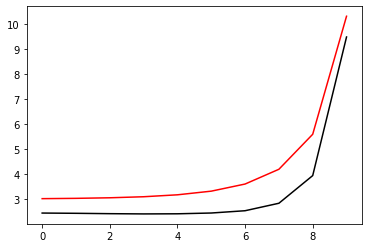

226600 0.026826747862957374 -0.867879052647218 0.8542161041573354
[2.33768046 2.33686644 2.33085686 2.32101945 2.31230526 2.31500898
 2.3633336  2.60390796 3.66353783 9.35387935]


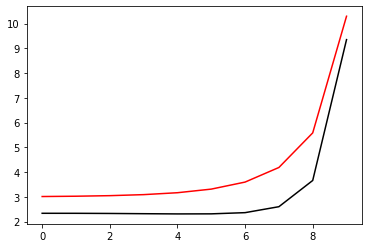

227700 0.03533783999020506 -0.8702104925734735 0.8529048748367831
[2.32438268 2.32834542 2.33629955 2.35138358 2.38183938 2.44579078
 2.58340582 2.91126668 3.99416151 9.4688347 ]


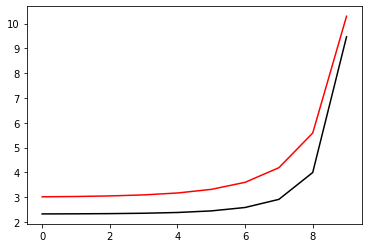

228800 0.05866326637444573 -0.8705733251658622 0.8461150991860164
[2.36234168 2.3695085  2.3781325  2.38374966 2.38328328 2.37093876
 2.33518674 2.34750835 3.21556298 9.40539101]


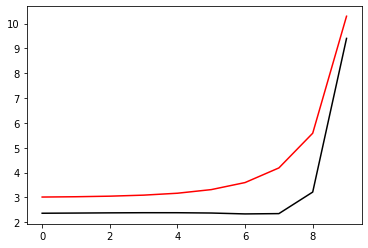

229900 0.052368167313970336 -0.8678323637841008 0.8503731776881646
[2.30299672 2.30787237 2.31605271 2.32506971 2.33211761 2.33603174
 2.34652627 2.44402977 3.31320418 9.40774091]


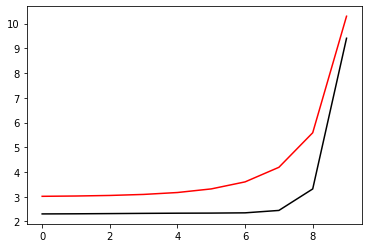

231000 0.11401632627925302 -0.8701417648584917 0.8486937632272058
[2.36978453 2.37955373 2.39809045 2.4282486  2.47566406 2.55301769
 2.68464042 2.91937436 3.76298883 9.44519202]


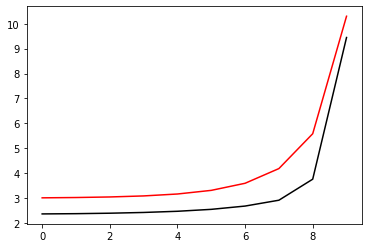

232100 0.06512964032449539 -0.8444102980027879 0.8592108452726221
[2.53739006 2.53634004 2.53663234 2.53739666 2.5336035  2.5106825
 2.43343314 2.31312103 2.934327   9.31971514]


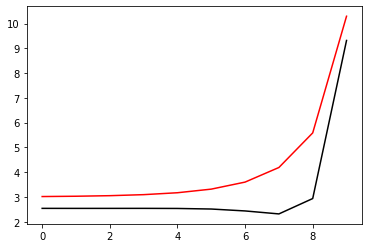

233200 0.05553057792659149 -0.848370803811649 0.8561384496951212
[2.5138572  2.51931688 2.52742521 2.53852774 2.55253133 2.56968381
 2.5987433  2.67813924 3.25544703 9.41035488]


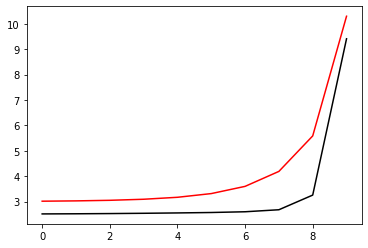

234300 0.17111851958055074 -0.8419753325876567 0.8674057633789961
[2.27407396 2.28656456 2.30566972 2.33043777 2.36500067 2.42086747
 2.52493235 2.72290529 3.37200289 9.3776047 ]


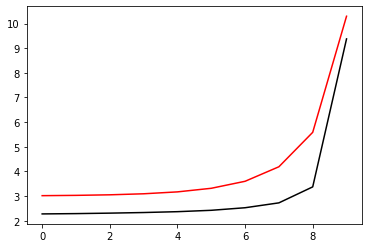

235400 0.04489634157637964 -0.8539781227147131 0.8549725737621342
[2.43390278 2.42529244 2.41493437 2.40174829 2.38256712 2.35419807
 2.3200007  2.3348935  2.85084023 9.41869226]


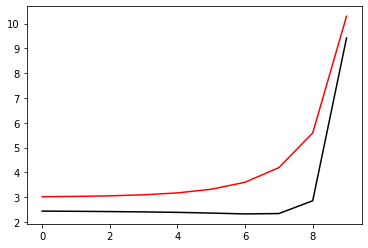

236500 0.02640021445584998 -0.8583281991331895 0.8521322517849933
[2.33150758 2.33052751 2.3316851  2.33854369 2.35718535 2.39825593
 2.48254027 2.66636379 3.33917901 9.37754194]


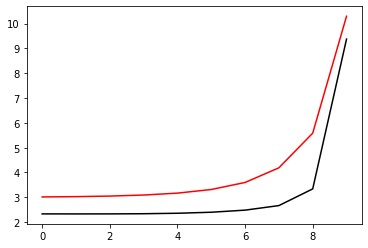

237600 0.023931821840156943 -0.8635809631558699 0.8496260870740776
[2.23421546 2.24138197 2.26753624 2.32161573 2.41795997 2.57950058
 2.83697716 3.23031578 4.06050376 9.47680538]


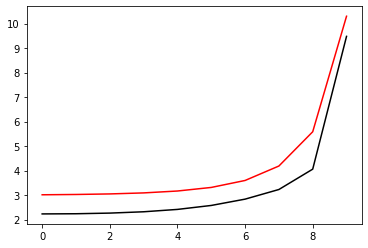

238700 0.3152330372675197 -0.8309898620985955 0.8906190903121658
[1.92461706 1.94972817 2.00354227 2.09301365 2.23006656 2.43312083
 2.72887388 3.16644994 4.04268513 9.48114578]


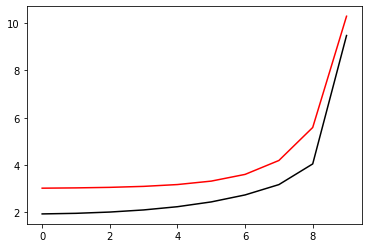

239800 0.05425028403353762 -0.8628262427369066 0.8525420471632359
[2.27720139 2.3043951  2.35567135 2.43155885 2.53569142 2.67280052
 2.85006459 3.10997808 3.82127671 9.52762673]


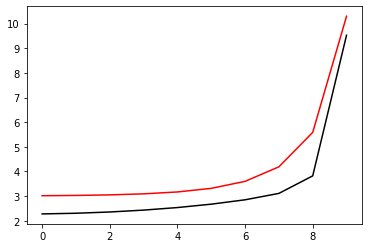

240900 0.03980370090793809 -0.8673808028053488 0.8511083331175258
[2.23154714 2.25043354 2.29671208 2.37872007 2.50886282 2.70745039
 3.00737213 3.46199519 4.35431437 9.48197169]


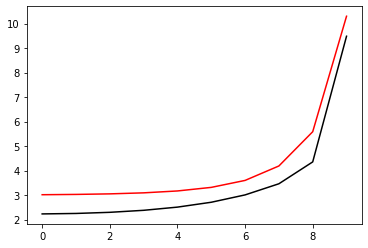

242000 0.05973302421203014 -0.8618345923964021 0.8513263519457901
[2.31361653 2.32688185 2.35621933 2.40597377 2.48113374 2.58840611
 2.742423   3.00375858 3.76186533 9.4548846 ]


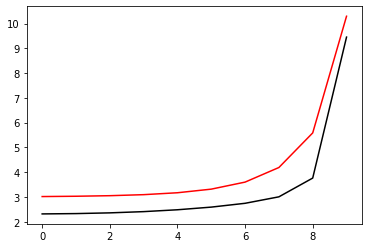

243100 0.035319476383176174 -0.8637131949778288 0.8539931905016058
[2.18910262 2.20587058 2.24620178 2.31940806 2.44117535 2.63789982
 2.9493503  3.4183773  4.31840589 9.57365177]


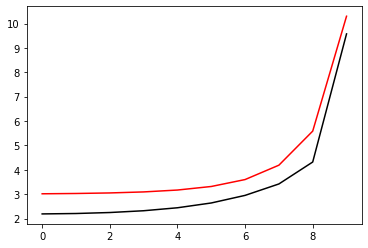

244200 0.2338844280959846 -0.8666669464691308 0.8479919834937488
[2.48080956 2.4859868  2.51244864 2.56953896 2.66902845 2.82557625
 3.05944833 3.45001183 4.36417148 9.49378416]


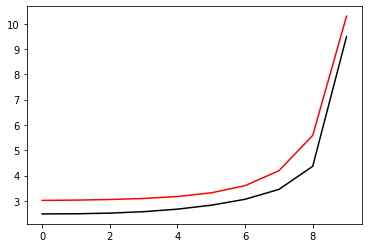

245300 0.31592288005049685 -0.8316213780292069 0.8884331204831784
[2.15757838 2.17507947 2.20837417 2.26423928 2.35500421 2.49849752
 2.72745901 3.13229555 4.1173983  9.50776852]


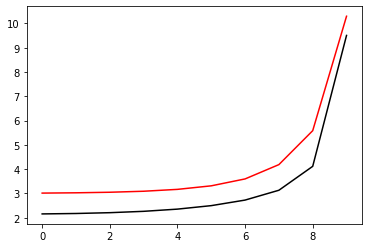

246400 0.07750067887129088 -0.8647580733297399 0.8528245693786899
[2.49477737 2.50348161 2.51790392 2.53603619 2.55534414 2.56420255
 2.53602851 2.54433757 3.22609067 9.3894032 ]


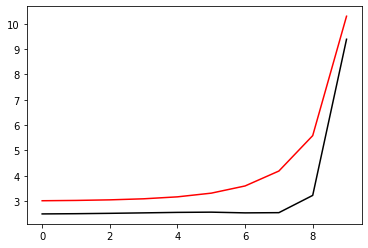

247500 0.03329078080778982 -0.856874764317959 0.85940521923053
[2.43447352 2.44310984 2.45871466 2.47931568 2.50342987 2.52913559
 2.5524697  2.60520429 3.2852214  9.4102152 ]


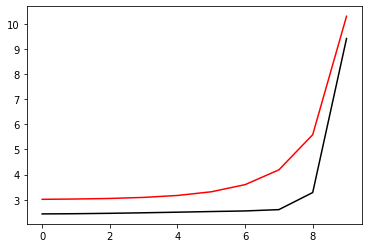

248600 0.04386626263649778 -0.8580477025180332 0.8592054315939062
[2.43415463 2.4422582  2.4615202  2.49493223 2.54695869 2.6244157
 2.73624607 2.90541611 3.59079912 9.3697582 ]


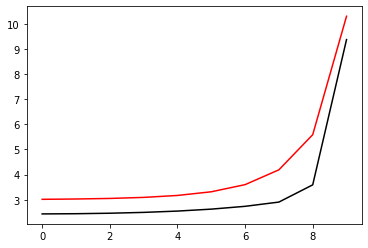

249700 0.041618958518442696 -0.8614653214055333 0.8574067609764094
[2.42809632 2.43960295 2.46870293 2.52308801 2.61425352 2.76027383
 2.98654086 3.32905191 4.10624878 9.48366591]


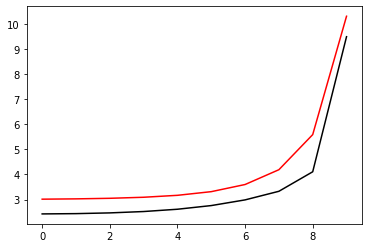

250800 0.030956704990121185 -0.8447397629485246 0.8583941507297164
[2.50798465 2.51834313 2.5464557  2.6039504  2.7068493  2.86983205
 3.05550797 3.19182951 3.99034712 9.58272951]


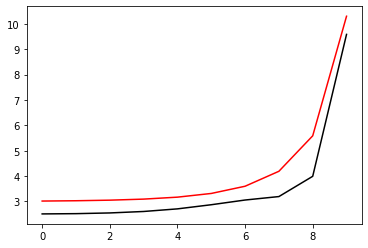

251900 0.06958957318161642 -0.84424013354001 0.8585536505905883
[2.55137883 2.56597606 2.59891434 2.6598407  2.76191849 2.92408849
 3.20690792 3.54607731 4.18995529 9.49534081]


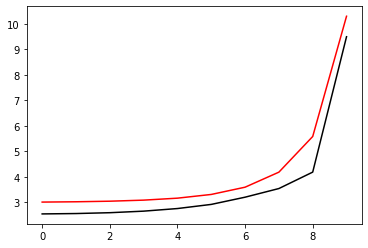

253000 0.14921137906610213 -0.8517168548518477 0.8627320089467644
[2.26195442 2.2781277  2.30975181 2.36365898 2.45099132 2.59200993
 2.82657683 3.21698953 4.05699571 9.46350266]


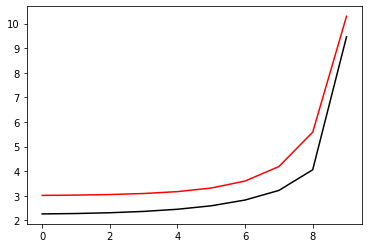

254100 0.05389610343874467 -0.8599674350251567 0.8557710601091963
[2.27634934 2.28570063 2.31273618 2.36846629 2.46988696 2.64452928
 2.93832821 3.43275038 4.42309338 9.5596428 ]


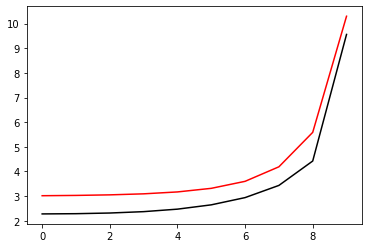

255200 0.05452137869459314 -0.8562521168810276 0.8598646473947538
[2.39080204 2.41601452 2.4593048  2.53458346 2.65979046 2.8622538
 3.17958829 3.67782144 4.70826781 9.46462999]


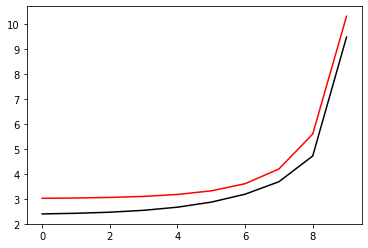

256300 0.0350604264885498 -0.8573617198246243 0.8592486833390656
[2.32730894 2.34280043 2.38202913 2.45618196 2.58358816 2.79641287
 3.15520595 3.78724204 5.01321276 9.61515651]


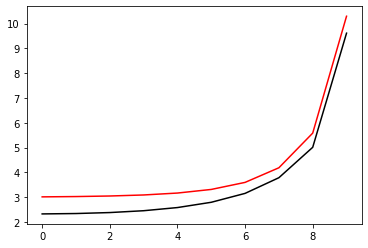

257400 0.10706108289589149 -0.8650912990187867 0.8460498972488301
[2.33957052 2.33144405 2.34473834 2.38825732 2.47864411 2.646524
 2.93851456 3.24665567 4.52512066 9.57653085]


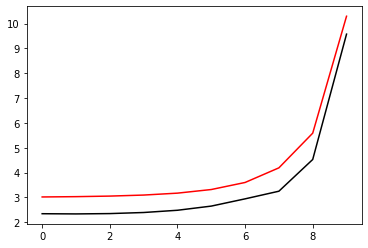

258500 0.03025085001848233 -0.8549540578308742 0.8528902033519339
[2.40230375 2.40510647 2.41493895 2.43983182 2.49080491 2.5852146
 2.74793549 2.97643549 4.12995186 9.46227896]


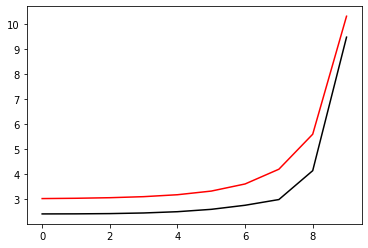

259600 0.04256491054968023 -0.8585608984293012 0.8509108767500553
[2.3866453  2.39308132 2.41070785 2.4472327  2.51563593 2.63650097
 2.83946083 3.18218577 4.33196515 9.50841579]


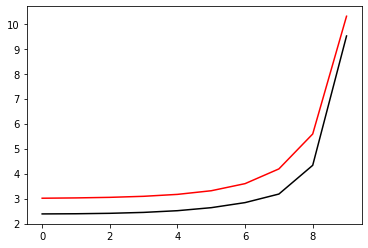

260700 0.03410621342997803 -0.8590061237812874 0.8507969085034989
[2.34917319 2.36883234 2.4024845  2.44716058 2.50644432 2.5904872
 2.72088151 2.98023311 3.98620029 9.5758721 ]


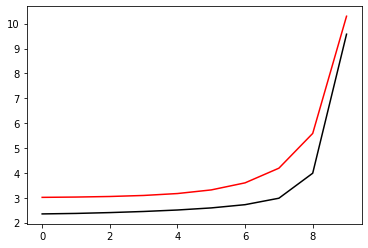

261800 0.04437210980166246 -0.8576572032969455 0.8542085996117038
[2.34819307 2.36529742 2.40316057 2.46839116 2.57158941 2.73433349
 2.9976727  3.4442411  4.50876639 9.50801147]


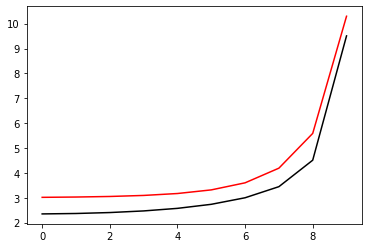

262900 0.041556896262726156 -0.8629833518227095 0.8508142900339771
[2.33280971 2.34529811 2.3760811  2.43399058 2.53230954 2.69429851
 2.96599964 3.45949364 4.58428097 9.54764959]


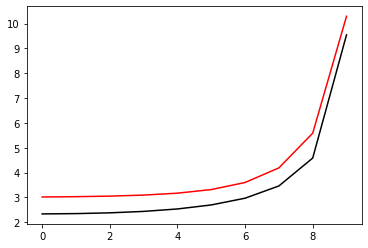

264000 0.06632506960607552 -0.8414808395998843 0.8540945227079279
[2.50189131 2.51881329 2.54915881 2.59444757 2.65693006 2.72851584
 2.75101519 2.70658865 3.60814806 9.35661887]


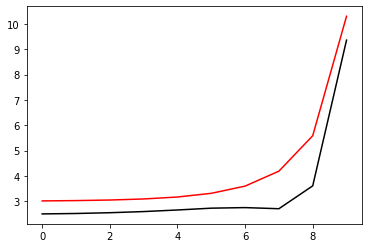

265100 0.0551548998575132 -0.8414028114706454 0.8510790480564565
[2.52890931 2.54457176 2.57560388 2.62378394 2.69098277 2.77780353
 2.88986685 2.99193468 3.74728332 9.46018055]


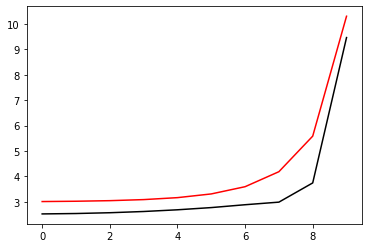

266200 0.05410404789521506 -0.8423245852934261 0.8512738194181478
[2.51246368 2.52302802 2.54783719 2.59012721 2.65396849 2.7471875
 2.89046877 3.14960954 3.91028761 9.46830664]


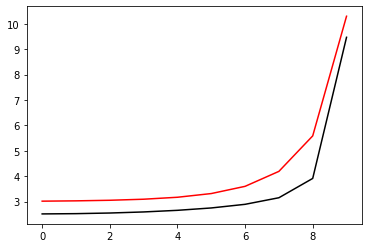

267300 0.05401325376140941 -0.8414014562567943 0.8529942715661147
[2.5067468  2.5187094  2.54525592 2.58924336 2.65822245 2.7675742
 2.94928408 3.28404769 4.11942446 9.39786926]


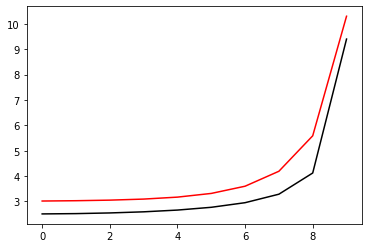

268400 0.034127295760541035 -0.8483464095652322 0.8498340896940901
[2.38639885 2.40109144 2.43046253 2.48110839 2.56604952 2.70790195
 2.95008197 3.39380411 4.41446789 9.4883423 ]


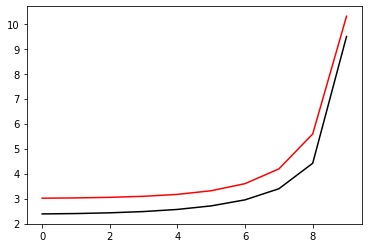

269500 0.025069823010375192 -0.8527244733750569 0.8473841485047495
[2.27904773 2.29227646 2.32627943 2.39254904 2.50832729 2.70500248
 3.04247534 3.64674713 4.89230589 9.56345689]


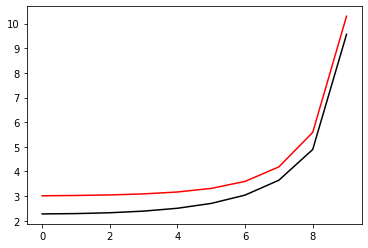

270600 0.026471828467333217 -0.8603260218860184 0.8414772146422108
[2.24317232 2.26880844 2.31028211 2.37081125 2.45800993 2.58450355
 2.77315571 3.1205697  4.13474903 9.46533512]


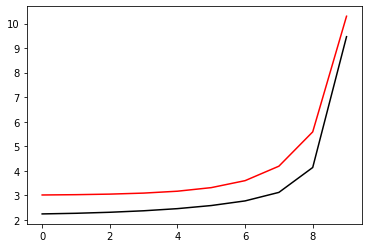

271700 0.04262554764394956 -0.8545839273912856 0.8448950762945907
[2.29218086 2.29623025 2.31358612 2.34730803 2.40006406 2.47865191
 2.60529335 2.88266603 3.85151108 9.53490081]


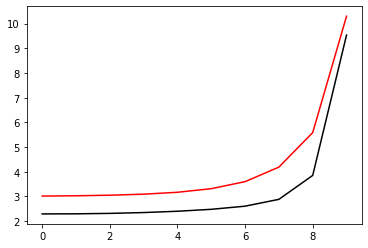

272800 0.05376462822377909 -0.8593578559604523 0.8449700753297413
[2.23284907 2.2493462  2.28440065 2.34407744 2.43937736 2.5896367
 2.83158465 3.25648884 4.31508609 9.50804486]


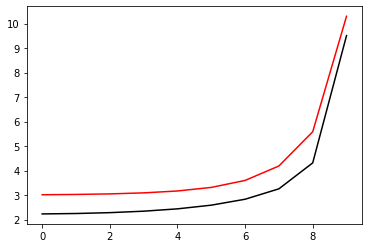

273900 0.04432678104339868 -0.8487282556476222 0.8526489524547368
[2.37023386 2.3860111  2.42379046 2.49132112 2.59981617 2.76889731
 3.03772903 3.50391537 4.57586848 9.52350219]


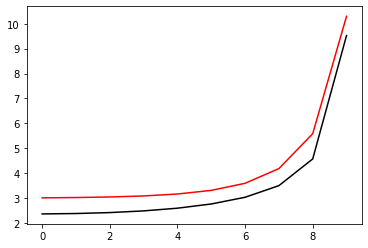

275000 0.0649348522908524 -0.8443658188152828 0.8572045771946439
[2.38556338 2.41036786 2.46344094 2.5514944  2.69188336 2.91480023
 3.27420878 3.87094747 5.03423847 9.63792461]


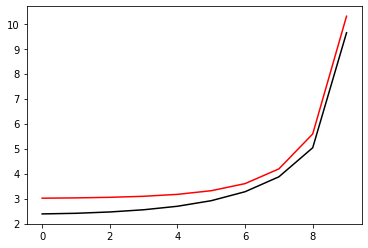

276100 0.3234647317368141 -0.8699021880094456 0.8226696654016942
[2.65398253 2.63806226 2.63481465 2.65571006 2.70991673 2.80349216
 2.91913242 3.00323326 3.91379366 9.43871144]


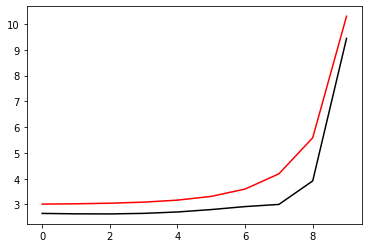

277200 0.06425792829431701 -0.8451695762438378 0.8578502164148218
[2.39176573 2.39389975 2.39696064 2.41188455 2.44956854 2.51688465
 2.60717594 2.70936602 3.57750319 9.4591846 ]


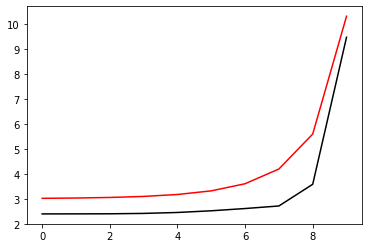

278300 0.0335588058283904 -0.8589045392808557 0.8473767720370446
[2.37172042 2.38013537 2.39821633 2.43271247 2.49470489 2.59715849
 2.75059053 2.98949327 3.93704751 9.45226787]


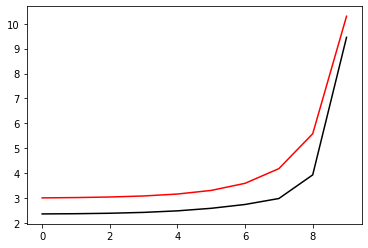

279400 0.04515163340665136 -0.8589457295478774 0.8532067458422767
[2.21892439 2.23614323 2.27239743 2.3358547  2.44112772 2.60994414
 2.87497056 3.30697102 4.39639185 9.54909357]


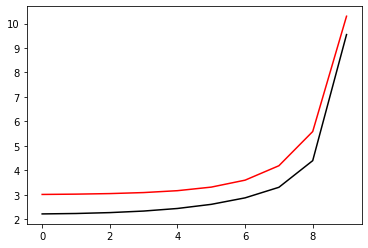

280500 0.025013377445816713 -0.8602284991158983 0.8540723430609057
[2.27528647 2.29129228 2.33380178 2.41551541 2.5554254  2.78369558
 3.1494868  3.7448197  4.95524852 9.50169175]


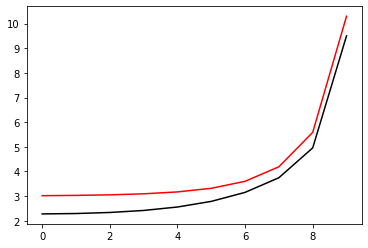

281600 0.2245743845953022 -0.8360730237749151 0.8810635306513593
[1.97573327 2.00089758 2.04949095 2.12287392 2.22633345 2.3560463
 2.48066246 2.7131157  4.05019993 9.53255657]


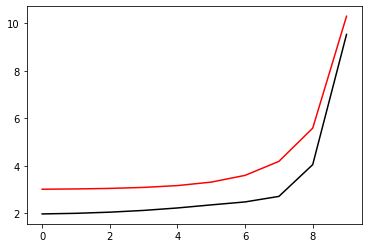

282700 0.043502332628555476 -0.8605117795658547 0.8470274347650114
[2.22438867 2.24014688 2.27665549 2.33724839 2.42215278 2.5242961
 2.63130856 2.80883307 3.88544491 9.45229774]


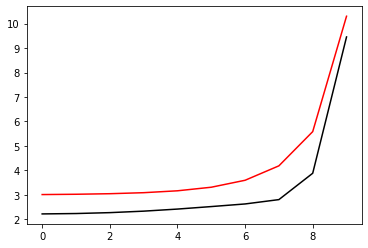

283800 0.0543086321575878 -0.859204357795685 0.8501403900356995
[2.23945418 2.25508202 2.29219522 2.35663    2.4553246  2.60012722
 2.81928053 3.1949927  4.2289682  9.49957237]


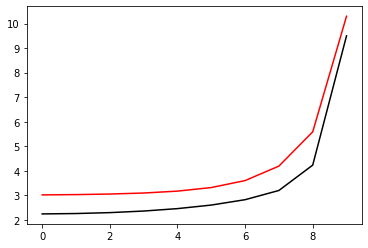

284900 0.04272487851833946 -0.8556017157816816 0.8551969250170989
[2.24821051 2.26333413 2.30161253 2.37293326 2.49146063 2.68216102
 2.99329645 3.52914081 4.633023   9.44764062]


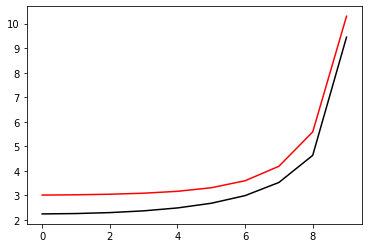

286000 0.19328529606244083 -0.86088997688036 0.8434101436380866
[2.75598932 2.74631751 2.7395435  2.74257188 2.75991219 2.79430654
 2.8570569  3.05875258 3.96197519 9.41971546]


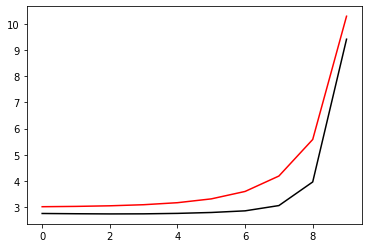

287100 0.14274166931424612 -0.870941556570737 0.8484711036007629
[2.51915225 2.48644491 2.44229893 2.39205349 2.33442436 2.26153887
 2.17622062 2.22350465 3.09535889 9.40467189]


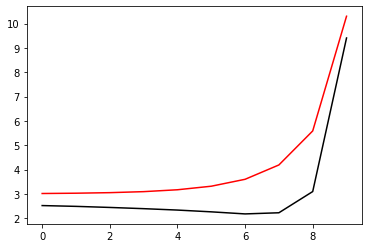

288200 0.07911465023116546 -0.8707048158713478 0.8531218495742177
[2.33631999 2.319812   2.29039201 2.25478551 2.21684092 2.17709897
 2.14892376 2.26583446 3.21074276 9.45730057]


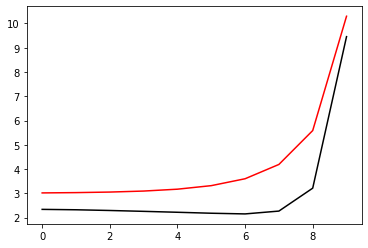

289300 0.03524637311557548 -0.8705611765962719 0.8561243683212832
[2.29078996 2.28610698 2.27659597 2.26427417 2.25399701 2.25436575
 2.29023468 2.48452273 3.48985238 9.42747205]


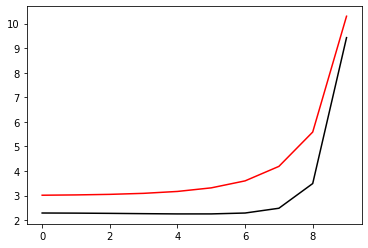

290400 0.16338634562513982 -0.8612314909440449 0.8481420674568523
[2.6423965  2.64112652 2.64117363 2.64069355 2.64078015 2.64092238
 2.62000179 2.49380493 3.24225572 9.51858854]


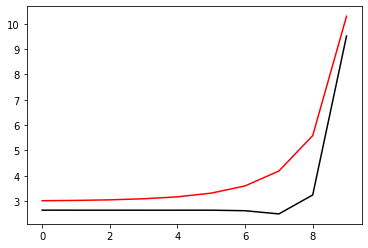

291500 0.03427226554942143 -0.8475699333831695 0.8544496902647604
[2.6166745  2.61710716 2.61708908 2.61585569 2.61166764 2.59872607
 2.5646987  2.52786203 3.22732713 9.41088818]


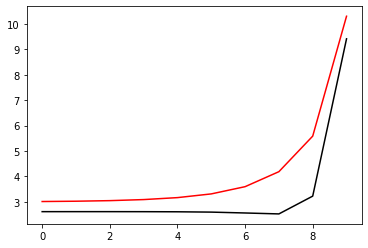

292600 0.03499345045346287 -0.8641288244142312 0.8538276176162718
[2.31883098 2.31529232 2.30909383 2.29494771 2.26673933 2.21743505
 2.14881729 2.11948813 2.75602804 9.36220238]


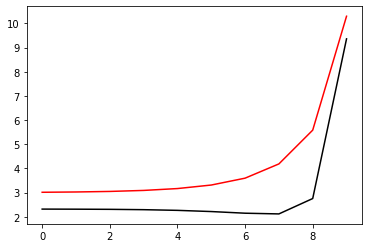

293700 0.05204952084854191 -0.866377650758592 0.8514054638942736
[2.30914538 2.30843664 2.30460955 2.29350118 2.26896028 2.22357799
 2.15518404 2.12005548 2.70342715 9.3327828 ]


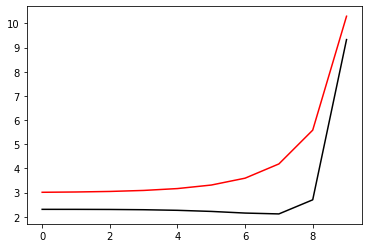

294800 0.05386732212768854 -0.8689770793095499 0.8510949660913955
[2.32486649 2.33241375 2.34258952 2.35557295 2.3719865  2.39531738
 2.43945791 2.5696467  3.27066589 9.41152256]


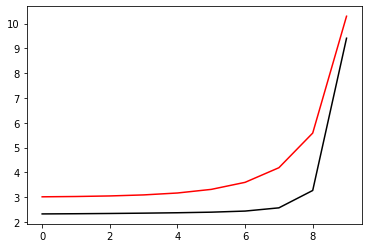

295900 0.04072525965680644 -0.8681772318368638 0.8537257635758226
[2.26432935 2.27532996 2.30102084 2.34645383 2.42183576 2.54608107
 2.752932   3.10419014 3.96194207 9.43158066]


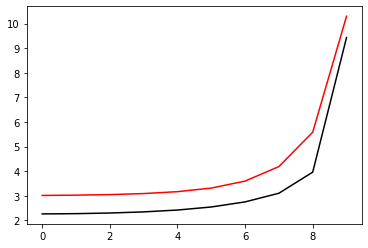

297000 0.06597073167941846 -0.8620614833833358 0.859377147304002
[2.4142432  2.43690555 2.48672594 2.5732644  2.71260289 2.92900569
 3.2579247  3.75710438 4.71729145 9.53092955]


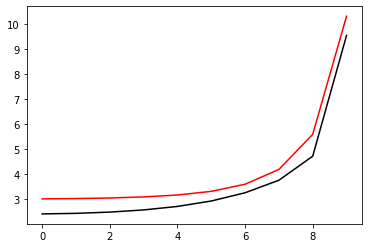

298100 0.046933825352346976 -0.8696094937049694 0.8623591801494818
[2.15037354 2.17656516 2.22487149 2.30083964 2.41357148 2.57650188
 2.81469653 3.20072589 4.08268118 9.47999845]


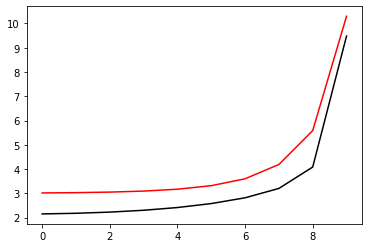

299200 0.1290295834402279 -0.865282750622219 0.8487702227511951
[2.48688503 2.49050054 2.50071502 2.51139832 2.50991914 2.47218065
 2.37008272 2.29494203 2.90938101 9.38993732]


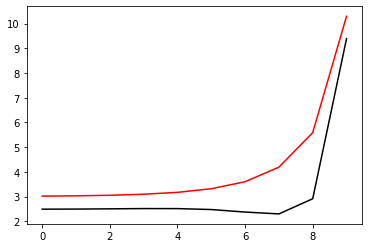

300300 0.045452708880695906 -0.8570623508209665 0.8583909710566537
[2.45249086 2.46006077 2.474503   2.49405774 2.51475819 2.53125012
 2.54908064 2.6409152  3.32458443 9.41901615]


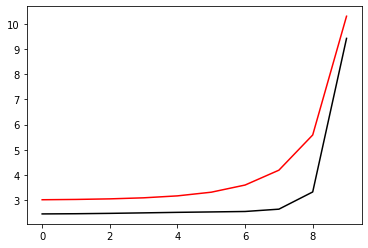

301400 0.034485332004406066 -0.8615228514233111 0.8560178792824533
[2.45631264 2.46445423 2.48273445 2.51401796 2.56313983 2.64058162
 2.77152186 3.02636936 3.81571638 9.39263636]


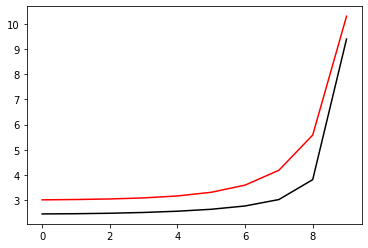

302500 0.11549399553227195 -0.8584997243572443 0.8693394826505976
[2.16645023 2.18088401 2.20084878 2.22820852 2.26626005 2.32256755
 2.41665687 2.61968723 3.35100697 9.41473193]


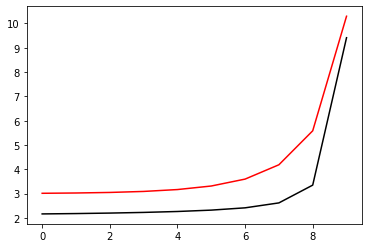

303600 0.024470324878120245 -0.8688240470938906 0.8562070250888398
[2.27930518 2.2922925  2.32272969 2.37353437 2.45181834 2.57266473
 2.76631866 3.10554314 3.95884386 9.44672676]


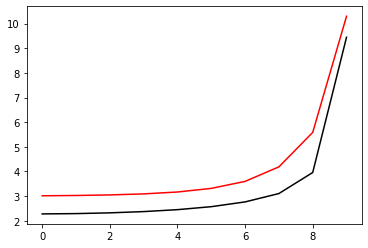

304700 0.03910440532119561 -0.8597031623214827 0.8658235265740426
[2.29736545 2.30116611 2.31760242 2.35347497 2.41818739 2.52834573
 2.71861493 3.07832701 3.99292927 9.51435698]


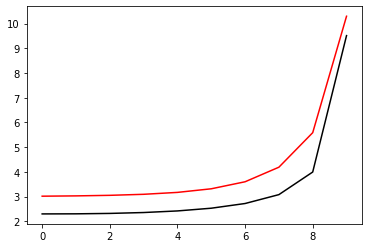

305800 0.1259605691602262 -0.8750315495230686 0.8542646879981864
[2.3653389  2.37806499 2.40679577 2.46087427 2.55554192 2.7167735
 2.99036767 3.4720456  4.52581968 9.50516941]


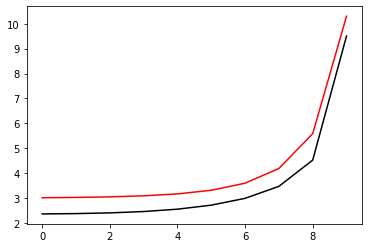

306900 0.03558663776349263 -0.8699363238342293 0.8593530621210667
[2.28083369 2.28705442 2.30898997 2.35950797 2.459119   2.64108606
 2.96638025 3.56126294 4.79839914 9.57854675]


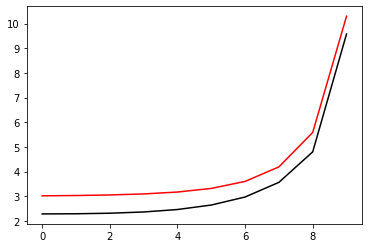

308000 0.08200708003364104 -0.8608554708239691 0.861485766440486
[2.48628474 2.48229728 2.48343968 2.50135086 2.54955418 2.64811135
 2.83676648 3.23151294 4.31446393 9.48873884]


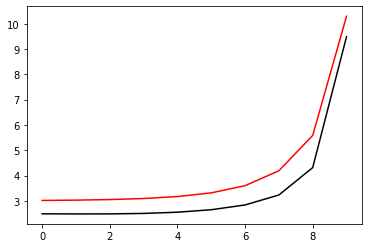

309100 0.13797900575906755 -0.8597943575658302 0.8688637820033674
[2.30307491 2.30881161 2.32015202 2.34532536 2.40020348 2.51324572
 2.74408241 3.23532846 4.42570064 9.54903739]


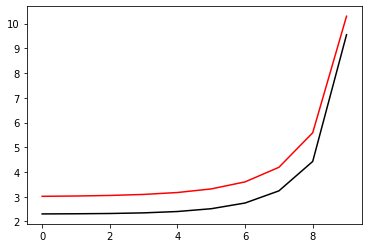

310200 0.20098135472282386 -0.8600545956147468 0.8713644245065268
[2.21731859 2.20020043 2.16914676 2.12712626 2.07824132 2.03691325
 2.05539368 2.30431713 3.33261885 9.44156694]


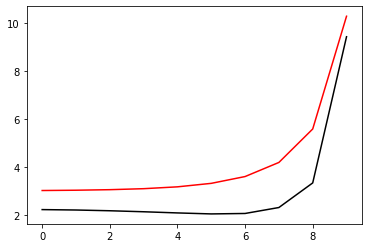

311300 0.03639011063177337 -0.8726270250781951 0.8567183696123737
[2.35514611 2.35418021 2.34619821 2.33004274 2.30898681 2.29620689
 2.33194193 2.54439133 3.48414088 9.41728049]


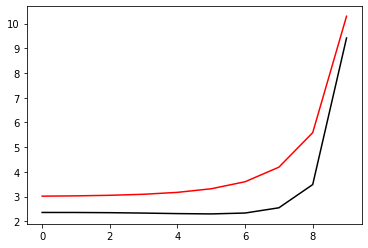

312400 0.054538221138657694 -0.8742022945530932 0.8558550578701516
[2.35708768 2.36096916 2.36743454 2.37849874 2.40141572 2.45412378
 2.57735476 2.87712732 3.84056947 9.47891832]


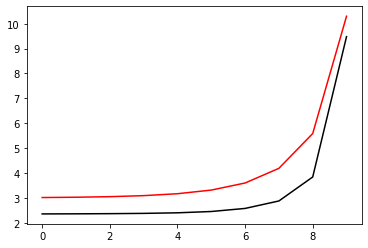

313500 0.22189926942700705 -0.840991664445944 0.8907169595078642
[2.1263896  2.12851403 2.13883291 2.16129209 2.20241939 2.27782266
 2.42488923 2.75256218 3.73463013 9.48112835]


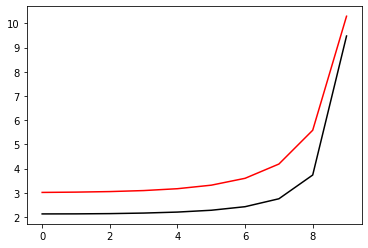

314600 0.044250544890876785 -0.8690884911361257 0.8674604254373383
[2.26894945 2.27708334 2.28726796 2.2981557  2.31124152 2.32957927
 2.3664394  2.50663502 3.29866124 9.42035537]


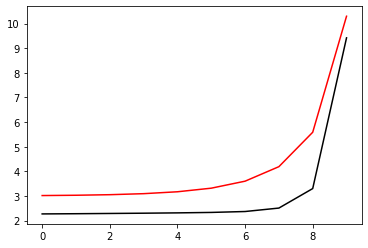

315700 0.03133437915651455 -0.8763797133384232 0.8596746223066297
[2.35717289 2.36880748 2.39119238 2.42705608 2.4829022  2.57435814
 2.73434986 3.02334508 3.83434971 9.43127975]


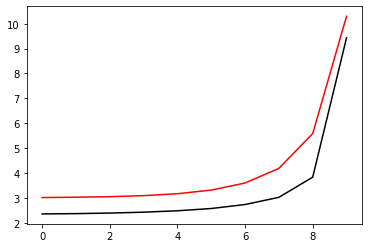

316800 0.044191888010525 -0.86671877266777 0.8686295913282157
[2.38810121 2.40110495 2.43180626 2.48855812 2.5820005  2.73094556
 2.96994566 3.37073131 4.28345362 9.44288627]


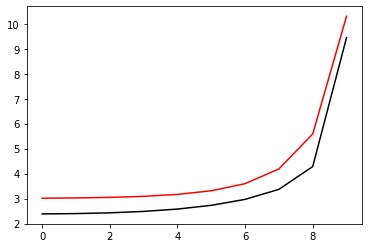

317900 0.03308947846682377 -0.8739755166248826 0.8652811576931355
[2.24815003 2.26142783 2.2978915  2.37061114 2.50163809 2.72718847
 3.10718081 3.7324411  4.87290516 9.54738253]


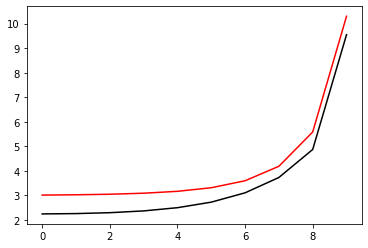

319000 0.3033902224134172 -0.8805190054024686 0.824562019155647
[3.02543028 2.99574019 2.96953659 2.95903426 2.96541446 2.97712469
 2.94770042 2.76205476 3.85218044 9.46162545]


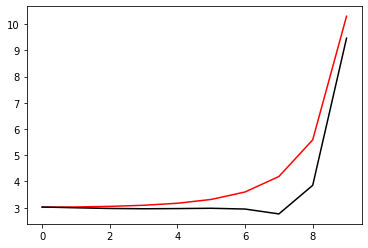

320100 0.13829267933762607 -0.8571704008239011 0.8572245489999086
[2.75861328 2.73729708 2.70056566 2.66303039 2.63057132 2.59605649
 2.52863022 2.37474016 3.43728368 9.50437199]


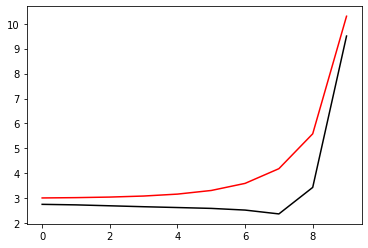

321200 0.06269797800039625 -0.8553229403784438 0.8666695652609434
[2.55769273 2.55574709 2.54497907 2.52651994 2.50562396 2.4820205
 2.43995173 2.3859217  3.42330664 9.42245329]


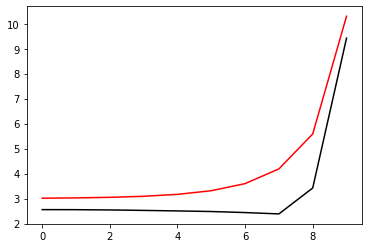

322300 0.05059067245145871 -0.859414843137573 0.8632266119816319
[2.53112978 2.52982376 2.52645582 2.52074224 2.51339404 2.50559507
 2.49990954 2.5567187  3.55499406 9.43251348]


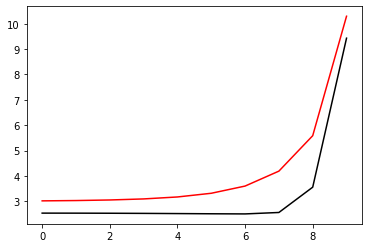

323400 0.03454408018722845 -0.8647517147119642 0.8591712643165245
[2.51024838 2.51253974 2.52097666 2.5380433  2.56666517 2.61366986
 2.69731241 2.90551319 3.92212778 9.46787367]


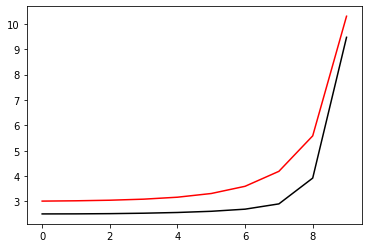

324500 0.22133346430586232 -0.8759244405094578 0.8375377094300167
[2.70097895 2.7187541  2.74672007 2.78409336 2.8331521  2.89551266
 2.96090628 3.02276632 3.73262377 9.45621725]


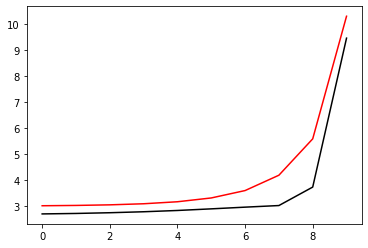

325600 0.04405111960270458 -0.8533883348059799 0.8626156314424513
[2.56129231 2.56311678 2.56861905 2.57847411 2.59049125 2.59981196
 2.60489819 2.66909921 3.3992691  9.46259921]


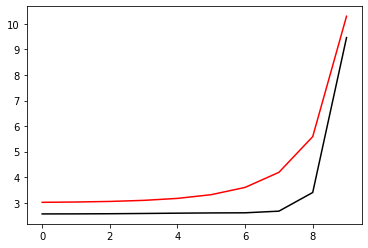

326700 0.05412443892804097 -0.853710998165152 0.8622895853878767
[2.57643062 2.57976587 2.58888429 2.60497607 2.63019168 2.67003492
 2.74276819 2.92987573 3.7381612  9.42580489]


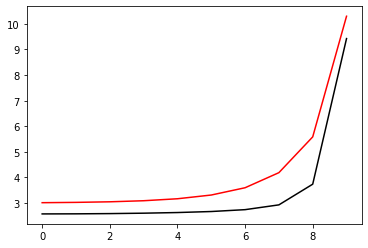

327800 0.0376746031841768 -0.8529589423910544 0.8631882980317452
[2.6481027  2.65809762 2.67443225 2.701734   2.74707904 2.82428513
 2.96479289 3.26346574 4.1842037  9.49495191]


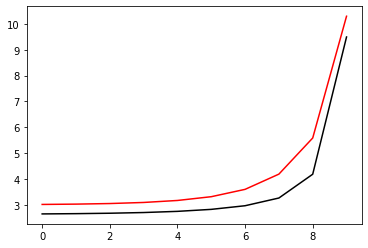

328900 0.10744990079236663 -0.8558465185457977 0.86555757798091
[2.38773666 2.37049843 2.33966855 2.30149011 2.25923009 2.2169502
 2.19221249 2.27252797 2.96916639 9.42294703]


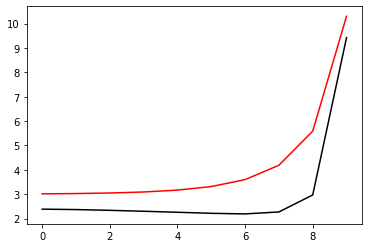

330000 0.10588635708816606 -0.8556302094991484 0.864060910691801
[2.45110978 2.43051816 2.38580705 2.31604438 2.21744319 2.08272541
 1.9101127  1.76682583 2.22246651 9.26209393]


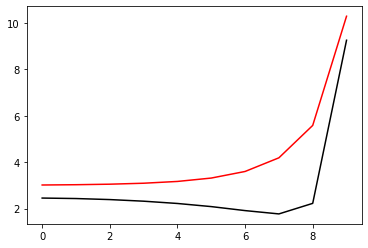

331100 0.059086911724676346 -0.8656722398941962 0.8565050479193536
[2.37063696 2.35550705 2.32806101 2.28923067 2.24167263 2.19122158
 2.15426703 2.20352482 2.86038695 9.40705996]


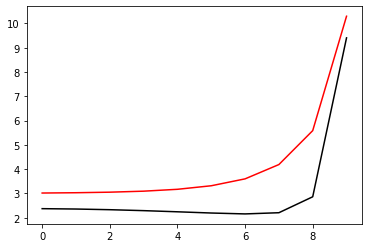

332200 0.07393834062917368 -0.8719887840973026 0.8537503438933636
[2.24821659 2.25136247 2.25843564 2.27352197 2.30489253 2.37046274
 2.50347874 2.77178032 3.58766539 9.42811622]


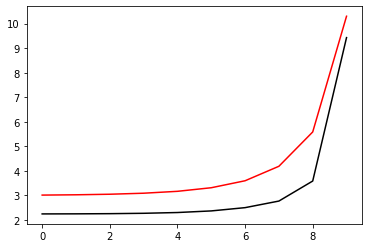

333300 0.026883732352182242 -0.8726382823706723 0.8539367517771543
[2.30699478 2.31705531 2.34164409 2.3880191  2.47134181 2.61848723
 2.87243958 3.28841642 4.14864788 9.51235112]


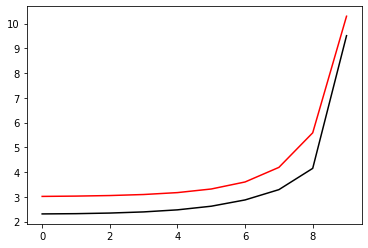

334400 0.1467005332819259 -0.8622554738451149 0.8669486158006992
[2.18949806 2.19291827 2.21236041 2.25954928 2.35000483 2.51038405
 2.78613661 3.25330532 4.20508893 9.47273115]


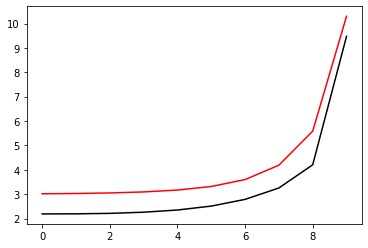

335500 0.10461673909937531 -0.8561029609798371 0.8710508981839244
[2.35726553 2.34584927 2.32509289 2.29860718 2.26059761 2.18733969
 2.05951564 2.26928191 3.31623776 9.41975083]


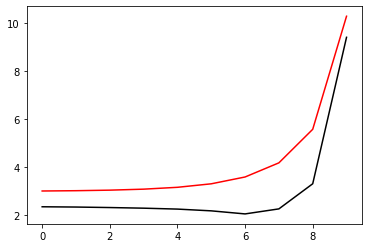

336600 0.0263542515390638 -0.8710117544512507 0.8579988009633198
[2.33294257 2.32925052 2.32079883 2.30704093 2.28713376 2.25970988
 2.2475138  2.45103159 3.49074559 9.3997125 ]


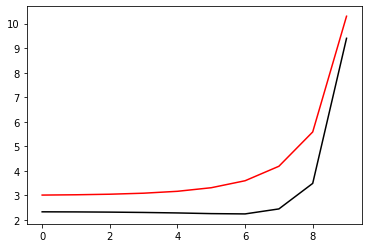

337700 0.03987810813463552 -0.8736548758128632 0.8573901522421541
[2.2992132  2.30292758 2.31066763 2.32435735 2.34903786 2.39796648
 2.50482431 2.77567944 3.80220647 9.45328601]


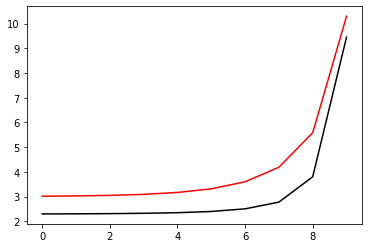

338800 0.34263355922477884 -0.8838080449606759 0.8201740139783282
[2.65439695 2.65824278 2.6750454  2.70489654 2.74946845 2.79982578
 2.7549565  2.49930629 3.38385823 9.47480946]


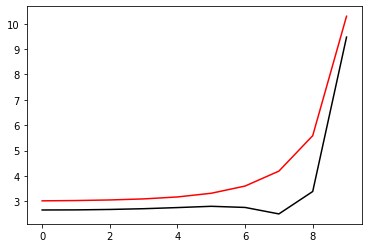

339900 0.15429133214513308 -0.8346702648088432 0.8636007243940323
[2.53080078 2.53551256 2.53989699 2.54130196 2.52476715 2.43641453
 2.15068609 1.89902906 2.88332339 9.36558306]


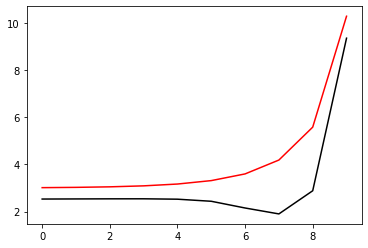

341000 0.08616645609097277 -0.8497102484957195 0.8521541674445502
[2.58465346 2.58543911 2.58379224 2.57304099 2.53478468 2.42532257
 2.18197991 1.9150777  2.75516691 9.36693534]


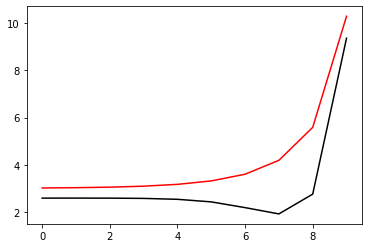

342100 0.06895448922484455 -0.8432815665099607 0.8610565391077107
[2.48320738 2.48062592 2.47246575 2.45047527 2.39724254 2.28209823
 2.07198236 1.85278046 2.59555065 9.32308322]


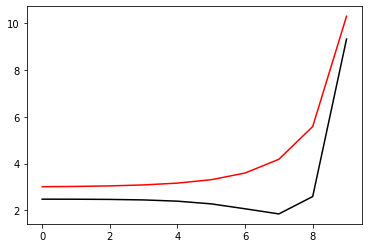

343200 0.059472050646869855 -0.8487502687321137 0.8553473621977737
[2.50878589 2.5137834  2.51732233 2.51575123 2.50173396 2.46370669
 2.39207741 2.34409224 3.06330224 9.44866639]


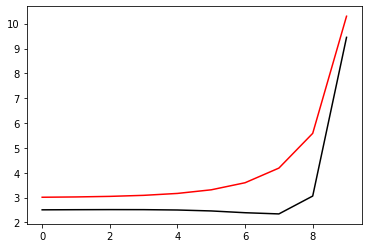

344300 0.04123506134719544 -0.8486583317932394 0.8576903203179129
[2.37763209 2.37504315 2.37592318 2.38149296 2.39499405 2.42417901
 2.49029613 2.66187708 3.4836827  9.42447102]


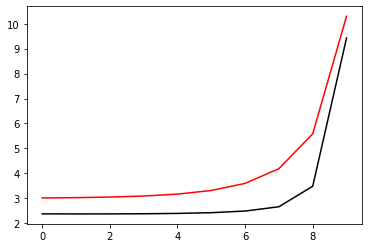

345400 0.22456616946977095 -0.862977426496331 0.8420669322499124
[2.6975715  2.69766092 2.70586077 2.72629089 2.76718757 2.84187707
 2.96046368 3.03664569 3.69920267 9.47954186]


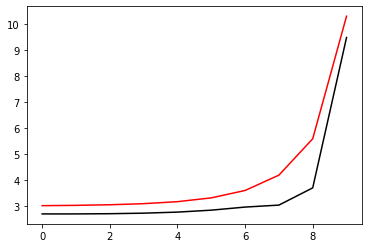

346500 0.03577694548583219 -0.8496817471618133 0.8480263482628001
[2.57317285 2.53713334 2.4901967  2.42989933 2.34694971 2.22050047
 2.01607052 1.83744461 2.57669914 9.41184817]


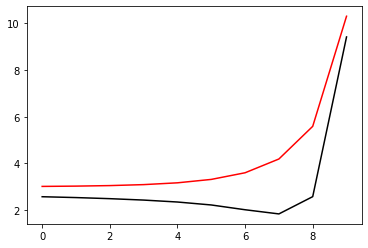

347600 0.05458837082615039 -0.8513725922516978 0.8531162784198598
[2.3859741  2.37296413 2.34652414 2.30647978 2.25045333 2.16906602
 2.04786009 1.9568921  2.70876959 9.36464047]


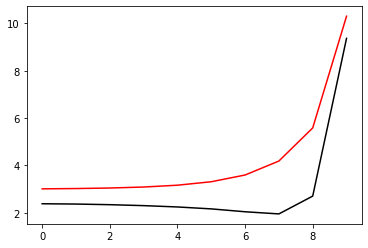

348700 0.04795129172632595 -0.8537600149229522 0.8530714477796296
[2.38231509 2.38713597 2.39499428 2.40063602 2.39646957 2.37200573
 2.31781818 2.29244086 3.01664383 9.36293447]


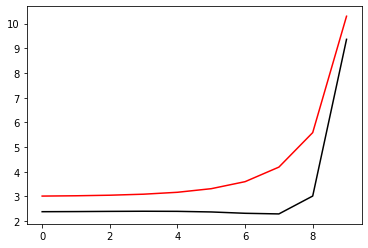

349800 0.04439833849142898 -0.8528980411557892 0.8544771409036526
[2.40667607 2.41915992 2.44388373 2.48094006 2.52845981 2.5824097
 2.63877747 2.74457109 3.51884915 9.41150061]


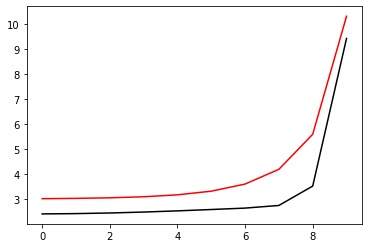

350900 0.04400575546271284 -0.8546065435316645 0.8539147205102685
[2.40320098 2.41301672 2.43568109 2.47547044 2.53851505 2.6328027
 2.77276215 3.01618348 3.86256938 9.46263144]


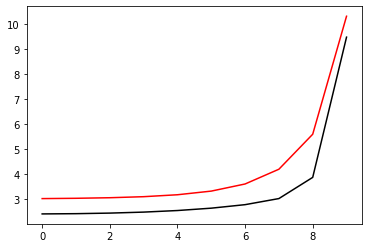

352000 0.0555134840177676 -0.8594808186930929 0.8526062812910954
[2.22576839 2.24260915 2.28098197 2.35220233 2.47291414 2.66896284
 2.98153295 3.48685375 4.55499725 9.42206091]


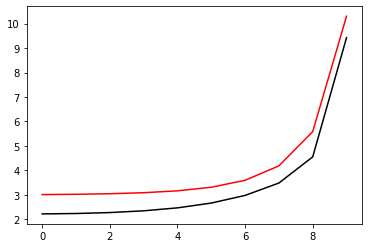

353100 0.06123458907588246 -0.8484807492910376 0.8543270640031189
[2.30848787 2.32087483 2.35081741 2.4050755  2.48994969 2.59699171
 2.65665288 2.58637041 3.81172416 9.50040499]


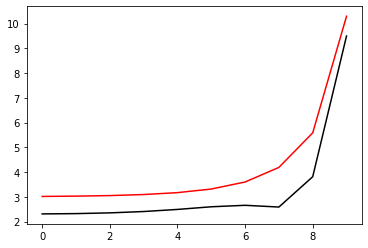

354200 0.3418169872216137 -0.8415940431502593 0.8718793991043838
[2.04605017 2.06311206 2.09530046 2.14678966 2.2203335  2.31005096
 2.39046906 2.47749309 3.61010172 9.37837406]


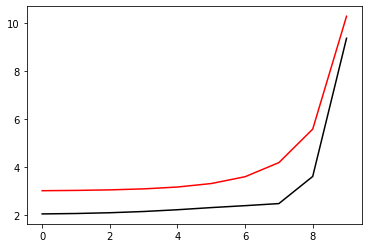

355300 0.03574192873007699 -0.8634528690118561 0.8478688377903981
[2.22543512 2.24389268 2.27764995 2.32622775 2.38846339 2.45716604
 2.51579438 2.60302661 3.55963369 9.46772396]


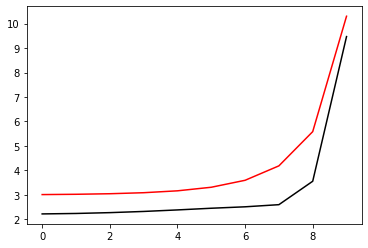

356400 0.054397444275126855 -0.862452364663064 0.8495244773605527
[2.22706965 2.24241919 2.2745916  2.32653058 2.40142599 2.50368957
 2.64531841 2.8996251  3.89280975 9.46225149]


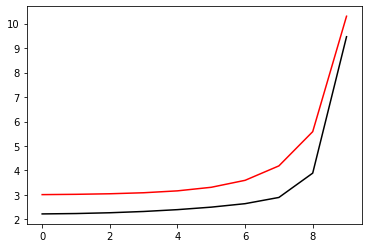

357500 0.02460875819859341 -0.8620710166939255 0.8506415764344978
[2.26478733 2.28486876 2.33032079 2.40676148 2.52393239 2.69943943
 2.96599822 3.40618143 4.47957637 9.37428813]


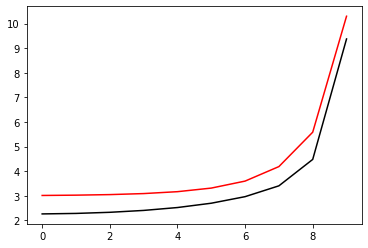

358600 0.041184699514915386 -0.8554818054112951 0.8576767621006732
[2.26276018 2.26608347 2.28383411 2.32654586 2.4131102  2.57794056
 2.88484105 3.44517476 4.63983254 9.51936436]


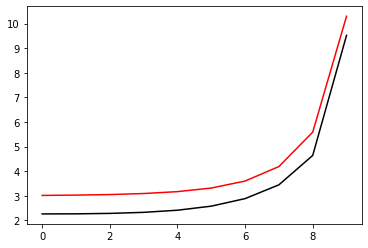

359700 0.17232011384722742 -0.8614569074666308 0.8427977728385995
[2.716285   2.72398624 2.74528557 2.78075802 2.82902035 2.87699695
 2.90372344 3.07559619 4.15237102 9.53649362]


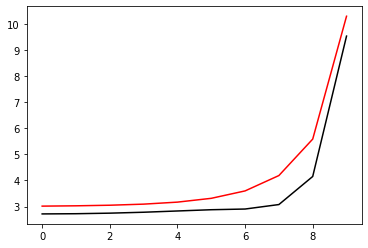

360800 0.051304945592767964 -0.8751391877648331 0.855759009786623
[2.33282556 2.33399907 2.34447207 2.36945051 2.4093021  2.45877391
 2.51650801 2.69255563 3.71428285 9.44251604]


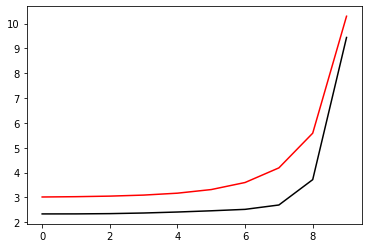

361900 0.04430432236954286 -0.8676987995433197 0.8617390535101572
[2.40416331 2.40779815 2.41993009 2.44663331 2.49243229 2.55996424
 2.6600597  2.89842169 3.95813161 9.46713287]


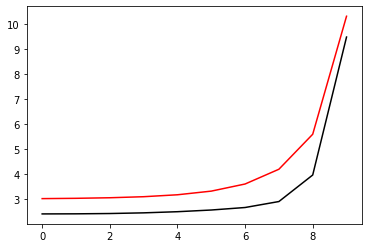

363000 0.055235221216926235 -0.8732412133782217 0.8616817815931587
[2.30517883 2.32389557 2.35926793 2.41629123 2.50299246 2.63240286
 2.83166001 3.20758142 4.3753     9.58416418]


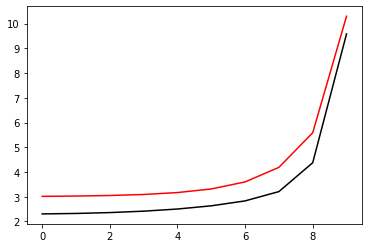

364100 0.45765634403178507 -0.8108618357444758 0.9183297006146303
[2.1280287  2.1655359  2.22107039 2.29686728 2.39804734 2.53209838
 2.71189009 3.01014944 4.05127321 9.48664466]


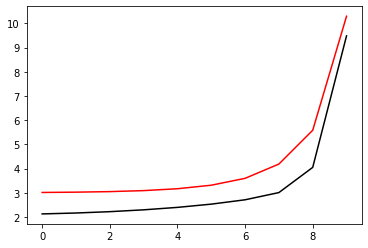

365200 0.40339696511088946 -0.8448514678528956 0.9006028602035904
[1.94339005 1.96012173 1.99136719 2.03513987 2.08735814 2.14140552
 2.19666627 2.36312166 3.42887422 9.42187423]


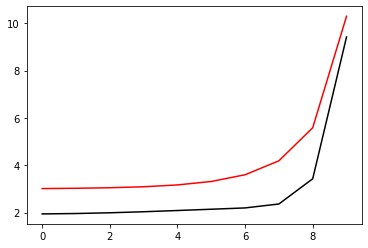

366300 0.0410155667931525 -0.881051951874782 0.8581600990397458
[2.30664335 2.30839622 2.32120266 2.33981093 2.35388017 2.34381761
 2.27818829 2.1871059  2.90487322 9.30116802]


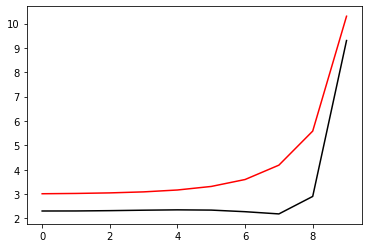

367400 0.05482560678062359 -0.8777005923317505 0.8592283260209743
[2.34572396 2.35336492 2.37026437 2.3954952  2.42723574 2.46342913
 2.50684025 2.58961297 3.21676194 9.42164249]


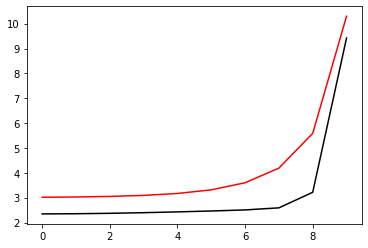

368500 0.025297662604583968 -0.8733326957302402 0.8643590804063349
[2.34320869 2.34333229 2.350363   2.36778488 2.39932359 2.4529239
 2.54486325 2.70889609 3.31175495 9.40198559]


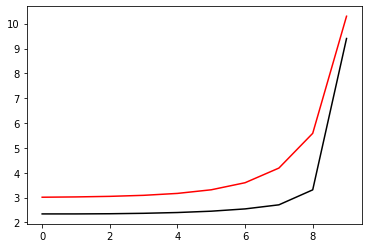

369600 0.030469295892147745 -0.8712414420186172 0.8680801780727468
[2.29576421 2.3134903  2.35072137 2.40850384 2.49429822 2.62203569
 2.81388961 3.11578909 3.85705966 9.46510476]


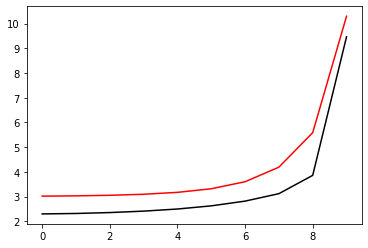

370700 0.03432607556052795 -0.8723940504358574 0.8679706688998805
[2.31543381 2.32894827 2.36477477 2.43352032 2.54832    2.73075798
 3.01711153 3.47247776 4.37985721 9.59791222]


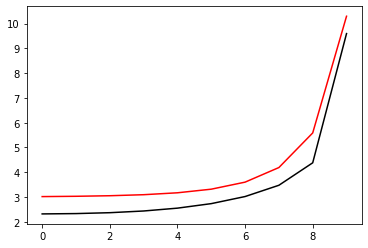

371800 0.3825706882211951 -0.9057563547119114 0.815180544365087
[2.78265879 2.76793139 2.76187636 2.77506368 2.81094447 2.86608883
 2.91275215 2.86717689 3.70656068 9.419844  ]


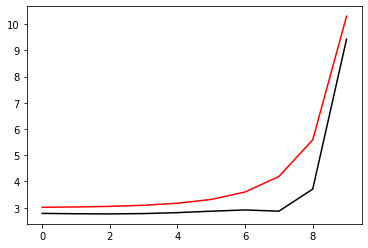

372900 0.13077855521200785 -0.8576453139851543 0.8550339841484138
[2.80861411 2.79620604 2.77472921 2.75351726 2.7353919  2.71398301
 2.67488841 2.62228017 3.40841364 9.44554461]


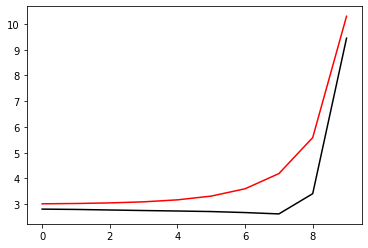

374000 0.08711080284031712 -0.8673697058514913 0.8590026149932406
[2.38936285 2.380099   2.35858419 2.32222262 2.26957119 2.19938696
 2.11770608 2.08951558 2.91170164 9.33733027]


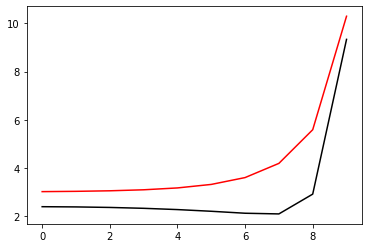

375100 0.054924671044381125 -0.8681282018847073 0.8601619094683696
[2.34445326 2.33790792 2.32587735 2.30865203 2.2882731  2.26922552
 2.26390199 2.34411501 3.17902713 9.47863295]


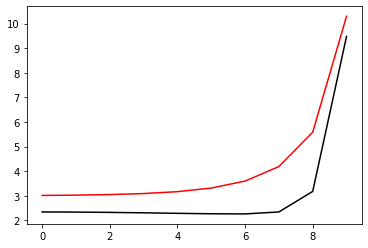

376200 0.20552302001025244 -0.8543030144556505 0.873180977332095
[2.37588343 2.38273113 2.38463536 2.38206885 2.37526132 2.35996979
 2.31467796 2.26003339 2.97246323 9.3718596 ]


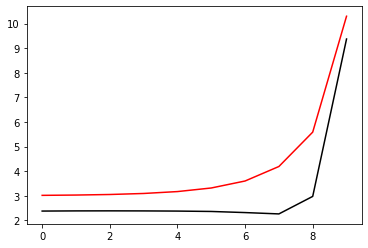

377300 0.0521043552731114 -0.8567212431571578 0.8591253057650803
[2.51695737 2.51755692 2.51607734 2.51188882 2.50355145 2.48482699
 2.43910511 2.37405636 2.98773883 9.40462028]


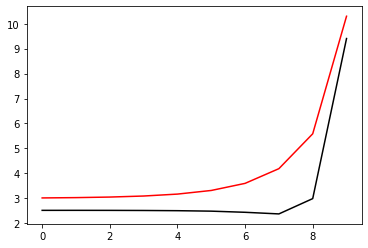

378400 0.03438119877949706 -0.8559287915105976 0.8613504393281625
[2.47906031 2.4862095  2.49740746 2.51186576 2.5310443  2.55893933
 2.60376025 2.68938724 3.30590502 9.318904  ]


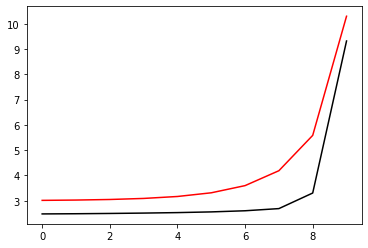

379500 0.03166482073280689 -0.8593376374172996 0.8597153407852947
[2.42727029 2.4341065  2.45132967 2.48223598 2.53357962 2.6191778
 2.76500117 3.02012565 3.73347642 9.45920438]


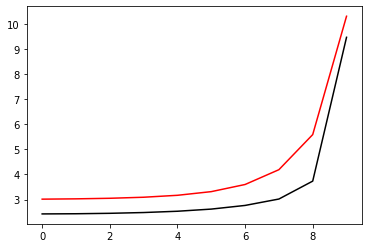

380600 0.042952060875156385 -0.8619236891531229 0.8589194575539599
[2.39988898 2.41196507 2.44266879 2.50071676 2.60070531 2.76891712
 3.04904882 3.50956385 4.40078472 9.50671432]


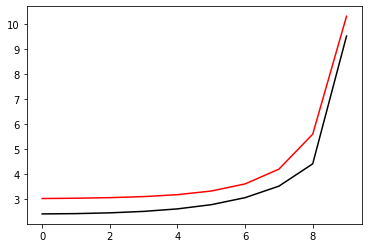

381700 0.032270246480220394 -0.8644763074801322 0.8579300510162498
[2.30209841 2.31203334 2.34225361 2.40661184 2.52567113 2.7331637
 3.08556107 3.67671372 4.75654538 9.57458808]


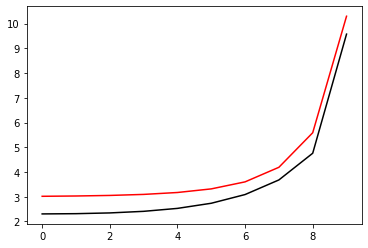

382800 0.14439018286816432 -0.8707042720298678 0.8542918333680778
[2.44561987 2.45599184 2.49746977 2.586919   2.74911241 3.02342197
 3.46189113 4.15229282 5.38264986 9.56870317]


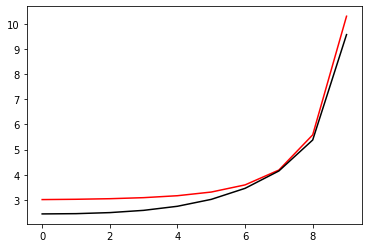

383900 0.15830726554364988 -0.8542020224639605 0.8715965114371584
[2.24934954 2.25608559 2.276562   2.32505891 2.4223458  2.60495152
 2.95620172 3.65979992 5.0576858  9.62067753]


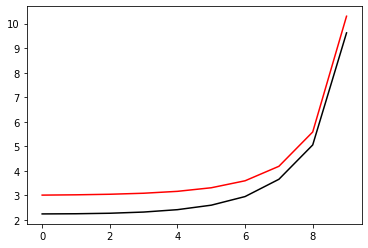

385000 0.06310678964875346 -0.8644441066418314 0.8609834918142227
[2.34690949 2.34407429 2.34927512 2.36434757 2.39824581 2.46962582
 2.62221966 3.03577295 4.33990113 9.4937199 ]


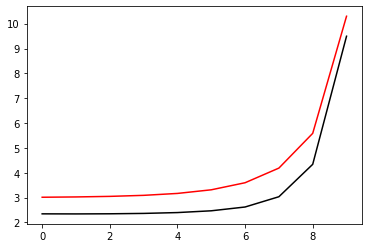

386100 0.17340945907856514 -0.8665692027496247 0.8559917126781577
[2.63265366 2.63215829 2.64297453 2.67119232 2.72919134 2.83843351
 3.02854308 3.37678858 4.50689771 9.53669817]


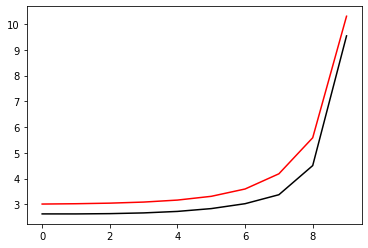

387200 0.07419533705223653 -0.8684104280704859 0.8604349992540611
[2.32787176 2.31935333 2.30501962 2.28797427 2.27162739 2.26241713
 2.28779987 2.48817798 3.56940844 9.32860904]


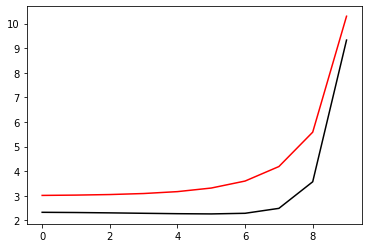

388300 0.03166633444865325 -0.8727659219006416 0.8552110381101765
[2.39813285 2.40010051 2.40214356 2.40677262 2.42064541 2.45721879
 2.54913925 2.81005902 3.86106815 9.42327192]


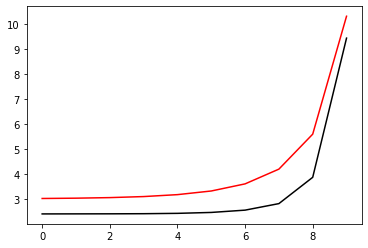

389400 0.05511664652025695 -0.8741707661514054 0.8567197947740789
[2.31086482 2.32205103 2.3489131  2.39806838 2.48238656 2.62699109
 2.87873149 3.33714426 4.46250571 9.52303546]


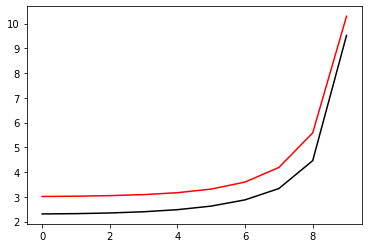

390500 0.2343957422093129 -0.8822759273966005 0.8386835679853983
[2.71642037 2.72461939 2.74856612 2.79412682 2.87130781 2.9941468
 3.17302327 3.41253313 4.30602382 9.47997942]


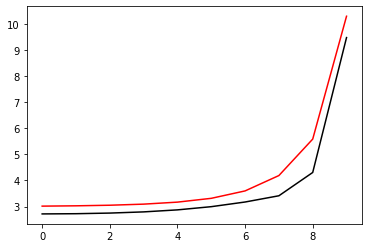

391600 0.1128704933808892 -0.8787299758337387 0.8573499910147849
[2.51331166 2.49133098 2.47320483 2.46797419 2.47978954 2.50980066
 2.54733153 2.614611   3.3705993  9.4116798 ]


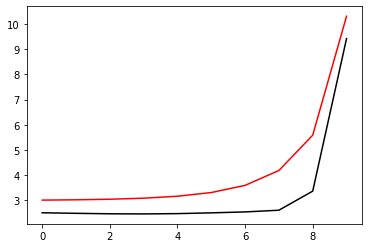

392700 0.037359543450198145 -0.873359009304762 0.8650471100727093
[2.46803757 2.45958474 2.45153224 2.45397563 2.47529556 2.52029355
 2.58801109 2.71398608 3.51529966 9.43010013]


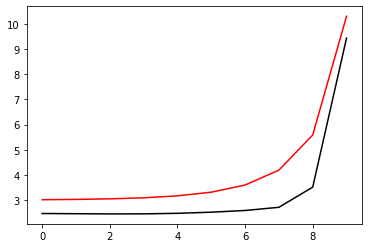

393800 0.08525431587981111 -0.8818475275109672 0.8603424678375128
[2.42052462 2.42369716 2.43343532 2.45590728 2.50129041 2.58166909
 2.7109288  2.94336416 3.83666839 9.38999016]


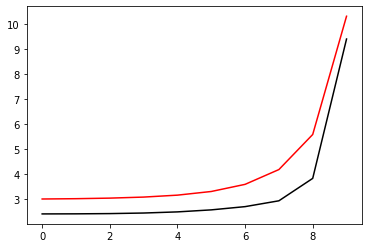

394900 0.04651832174884358 -0.8786332239371354 0.8634469238220805
[2.28572657 2.29201161 2.30521647 2.32184141 2.34017518 2.35685476
 2.36700357 2.43053284 3.175443   9.39559816]


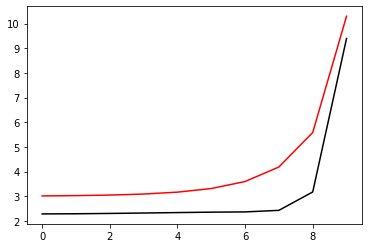

396000 0.06876512396289336 -0.8762220742078652 0.865188779902187
[2.32866367 2.33987753 2.36146084 2.39434103 2.44047026 2.50521138
 2.60179593 2.7786277  3.52514976 9.45042311]


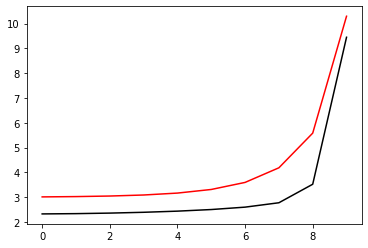

397100 0.06123465072758561 -0.8686316590551151 0.8728206437840291
[2.34140135 2.35546759 2.38340022 2.42802285 2.4956764  2.59767639
 2.75601908 3.02916071 3.82132045 9.48716692]


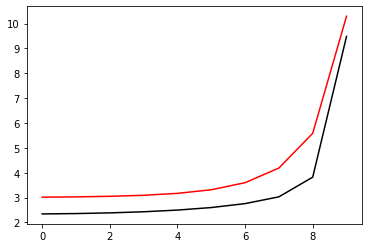

398200 0.07621623976211521 -0.8826283294427142 0.8622270023655036
[2.3346517  2.34468681 2.36356046 2.39309639 2.43729935 2.50353125
 2.61059454 2.82646613 3.57150831 9.45271306]


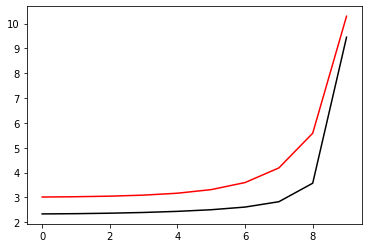

399300 0.03798381889956538 -0.8695866307301847 0.8722024439343845
[2.3618196  2.35313799 2.34860248 2.34878107 2.35343737 2.36451504
 2.3965987  2.53521235 3.25563363 9.40138755]


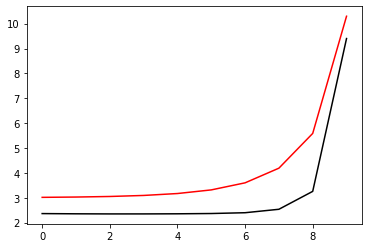

400400 0.03400297968040727 -0.8721687282729933 0.8683048752073307
[2.5321274  2.53843041 2.54824501 2.56626071 2.59935965 2.65747465
 2.760462   2.97635639 3.74318893 9.48783263]


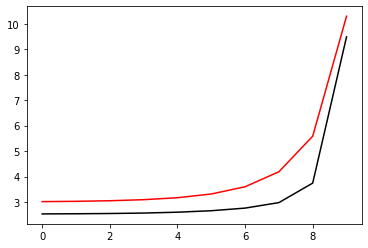

401500 0.030241015261593295 -0.8681621867072783 0.8742539471897041
[2.41503578 2.42794703 2.45705778 2.50638822 2.58777382 2.72157095
 2.94270948 3.32654821 4.25391885 9.50317683]


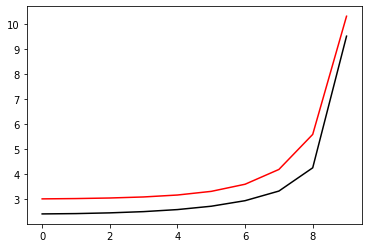

402600 0.09953697198347325 -0.8602424627934339 0.879271326663068
[2.52311599 2.51056898 2.49442137 2.47734545 2.46042696 2.4481807
 2.46438676 2.61115589 3.36358757 9.43673455]


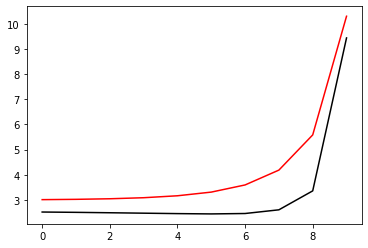

403700 0.06754226145284041 -0.8556548659291469 0.8736417990443767
[2.78058274 2.76514321 2.73416439 2.68456477 2.60877451 2.49650398
 2.35202058 2.28263152 2.88549212 9.34025421]


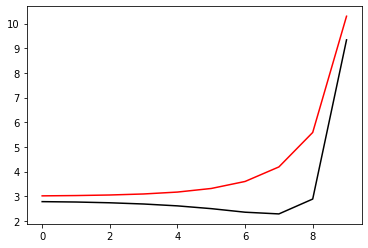

404800 0.054972833802094855 -0.8735032013300532 0.8639696931722709
[2.57663559 2.56846939 2.54550095 2.50121977 2.42783354 2.31652475
 2.16888428 2.06846406 2.62388562 9.38228216]


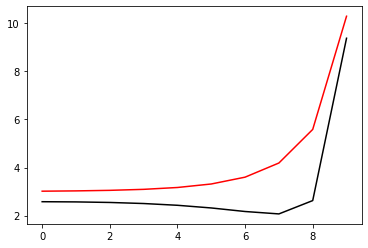

405900 0.04635519876065132 -0.8674044673150892 0.8702230437636681
[2.52115811 2.52206494 2.51654266 2.49868265 2.46095273 2.39562462
 2.30292257 2.24927324 2.80313459 9.33938594]


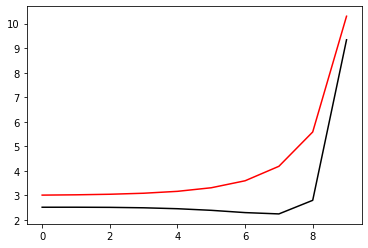

407000 0.08368608483041667 -0.869346670563414 0.8688664227085379
[2.53703978 2.53922204 2.54411988 2.55032279 2.55529499 2.55718692
 2.56172562 2.62820491 3.26100372 9.36410888]


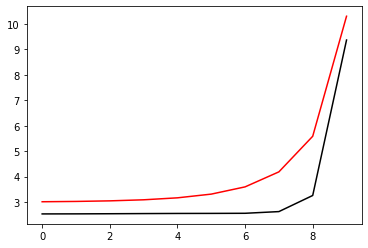

408100 0.05168455089109603 -0.8730248266837767 0.8678371300838021
[2.3352198  2.33726638 2.34733176 2.3707615  2.41544368 2.49577959
 2.64024251 2.92308706 3.76336262 9.46356534]


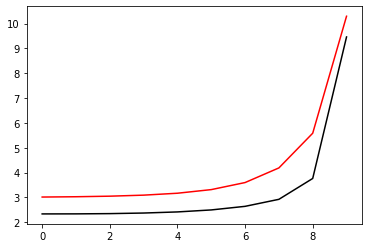

409200 0.09040339578160984 -0.87732083787742 0.8626533751776367
[2.5130419  2.48991126 2.46970715 2.46326427 2.48191446 2.54217858
 2.67374163 2.96241234 3.83374357 9.46792481]


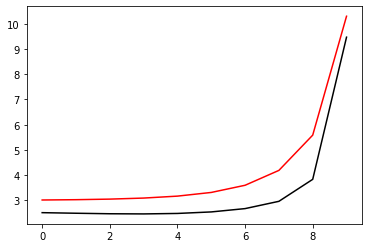

410300 0.03472190753385929 -0.8797044155525147 0.8652126600692774
[2.37025518 2.35327999 2.32868282 2.30727992 2.30307221 2.33718736
 2.45110006 2.75514218 3.71059137 9.37663891]


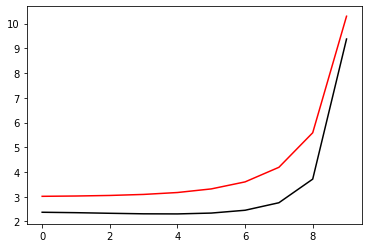

411400 0.036615446560707435 -0.8658284713082521 0.871949097114895
[2.56452042 2.54474094 2.51290413 2.47239295 2.42688785 2.38550006
 2.3792794  2.53633633 3.40604881 9.362633  ]


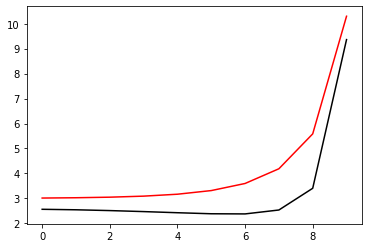

412500 0.032879479926194166 -0.8683704025522193 0.8704070175980899
[2.55287116 2.54296808 2.52512663 2.50329534 2.48491995 2.48572367
 2.54432435 2.77861226 3.71332952 9.46575586]


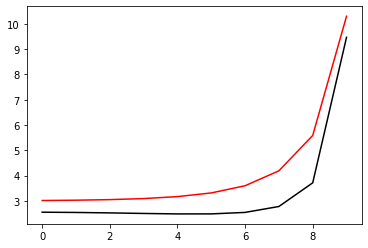

413600 0.033964501725786966 -0.8749460542250852 0.8674903981688449
[2.42258508 2.41753498 2.41748918 2.43140712 2.47393181 2.57318694
 2.78439454 3.22686247 4.338413   9.5004    ]


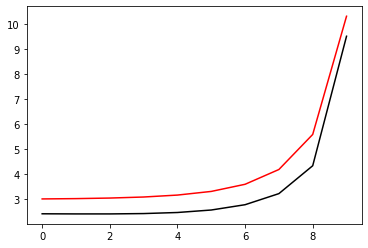

414700 0.05282373525717097 -0.8639840568953133 0.8765924340108131
[2.51677836 2.52748683 2.5543126  2.60460501 2.69105812 2.83744193
 3.0946072  3.58740043 4.74429003 9.58340363]


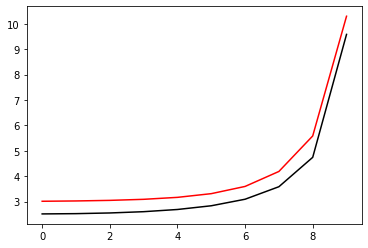

415800 0.08079838858757521 -0.8616138973194918 0.8810984496711523
[2.53024415 2.51966584 2.51586054 2.52971821 2.57090526 2.65423178
 2.81382688 3.16942188 4.19974272 9.55744466]


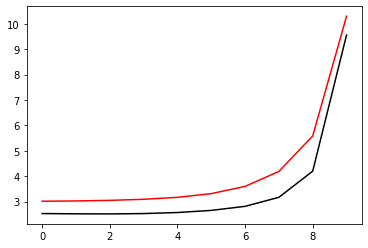

416900 0.05903951849295357 -0.8546897061968186 0.873077229958458
[2.68962339 2.67297975 2.64927636 2.63201749 2.63008212 2.65169392
 2.71920796 2.94399546 3.86823289 9.4648492 ]


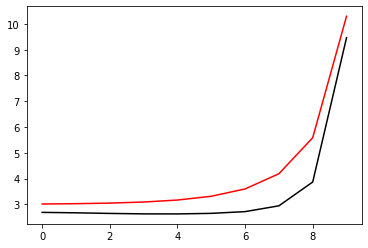

418000 0.06462661047587222 -0.8645350593442636 0.8688878950040148
[2.65683842 2.65349703 2.64530006 2.63956404 2.64731898 2.68452747
 2.78479971 3.05676919 4.01266447 9.50213591]


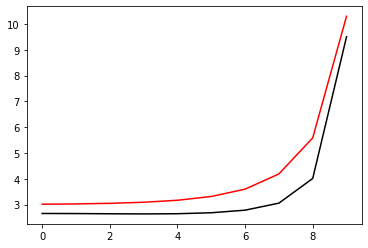

419100 0.06220090876853249 -0.8660346980841304 0.8700743320219494
[2.55263068 2.55440409 2.55729147 2.56332484 2.57953112 2.62216235
 2.73019937 3.02072778 4.00495335 9.45656945]


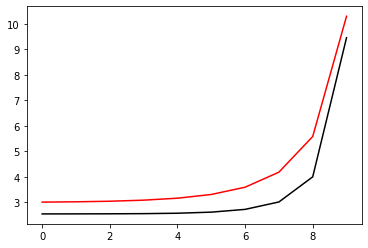

420200 0.055830035313798904 -0.8726831059771303 0.8683645789161678
[2.41546595 2.42026718 2.42938274 2.45221924 2.50296544 2.60947859
 2.83116302 3.30448874 4.4799039  9.50812979]


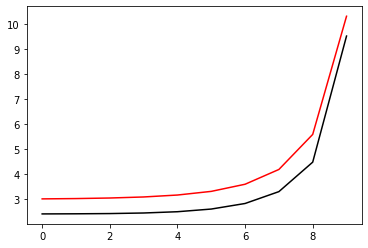

421300 0.056133697103945994 -0.8567208194652535 0.8745108150152856
[2.50084741 2.50277068 2.51882401 2.56012631 2.64306623 2.79467325
 3.03478832 3.08445033 4.50351571 9.53509047]


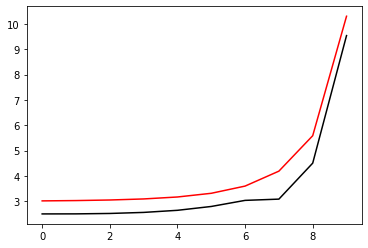

422400 0.0343445571273747 -0.8691752567113306 0.8682444609760082
[2.43019156 2.43633183 2.45421227 2.49428519 2.57216628 2.70818466
 2.91172738 3.15207228 4.49438727 9.46991071]


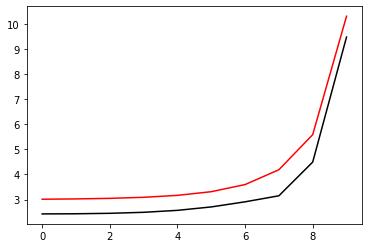

423500 0.024669286999763895 -0.8724525613587942 0.8688536328413178
[2.38887564 2.40071144 2.4295839  2.4855367  2.58662864 2.76240304
 3.05921378 3.56779172 4.88336109 9.55641457]


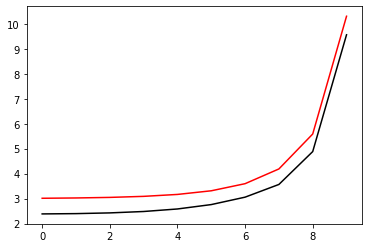

424600 0.017934533488301214 -0.8745290963457161 0.871199554339771
[2.23746868 2.2569705  2.3016971  2.38334847 2.52393614 2.76582084
 3.18922325 3.93003876 5.35696829 9.57229423]


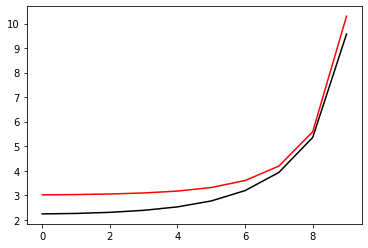

425700 0.05876542198267919 -0.8617935472423134 0.8688660933062562
[2.73665742 2.71400435 2.69903325 2.69605042 2.70002485 2.67902053
 2.56066663 2.60350372 3.81487958 9.5008909 ]


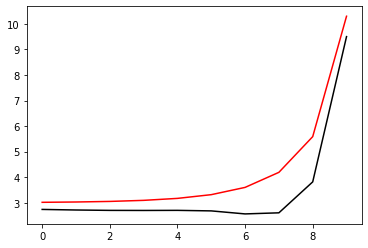

426800 0.03681964072701677 -0.8562522177477542 0.8722896851110793
[2.64478758 2.63411675 2.61797276 2.60008804 2.57264249 2.51386085
 2.41854588 2.49154725 3.69876956 9.38007953]


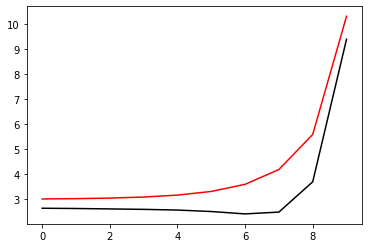

427900 0.05319223309466211 -0.8598521281619811 0.8682630433566529
[2.66140115 2.65896381 2.65425377 2.64823718 2.64104258 2.63185008
 2.62705998 2.71758072 3.81588575 9.48301049]


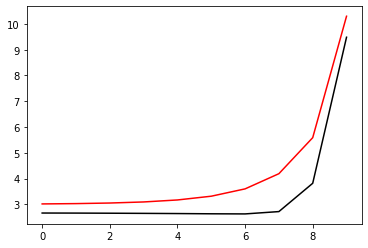

429000 0.06409090832748793 -0.8586162682324294 0.86980129309029
[2.64174538 2.64245441 2.64490393 2.64964062 2.65966333 2.68168429
 2.73675563 2.90153109 3.90582865 9.46190837]


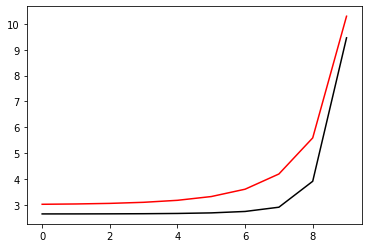

430100 0.05382795632031206 -0.8595182999300973 0.8696115999797417
[2.60764368 2.61195002 2.6214227  2.63852548 2.66810724 2.72227125
 2.82968309 3.07840181 4.03096048 9.53530351]


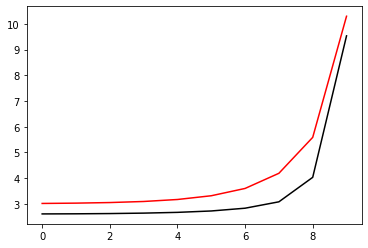

431200 0.13628730882079484 -0.8671252160616032 0.8788961613130244
[2.39886786 2.40312259 2.41102524 2.42510286 2.45011152 2.49346666
 2.56820128 2.7486978  3.57063837 9.37677641]


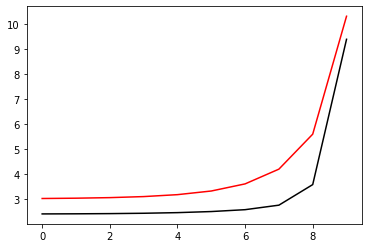

432300 0.052391933254649775 -0.8592761040761193 0.8736317643111365
[2.52453692 2.51818128 2.511747   2.50971516 2.51565382 2.5347323
 2.57911448 2.7224951  3.49919697 9.47977609]


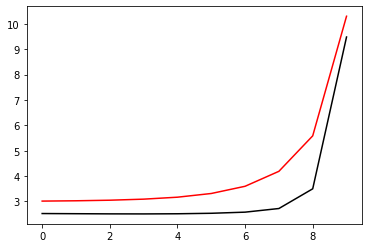

433400 0.034235725051982795 -0.8659792385700953 0.8663152598683511
[2.53090449 2.52701067 2.52237487 2.52186113 2.53091904 2.55713896
 2.61802956 2.79147414 3.59541799 9.43530858]


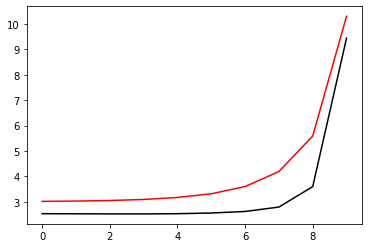

434500 0.03150684281984287 -0.8683814441242245 0.865229681908765
[2.49959646 2.50076263 2.50460737 2.51503456 2.5392429  2.58962837
 2.69223544 2.93234158 3.80078494 9.46799103]


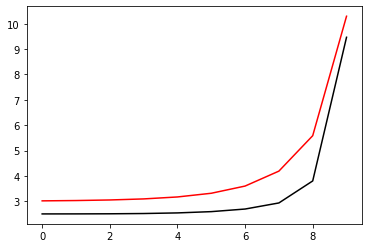

435600 0.07090364605867097 -0.8661939179476477 0.8722499377008607
[2.31565977 2.32440826 2.34328675 2.37357412 2.42355562 2.51022139
 2.6699438  3.00304709 3.9742083  9.49510598]


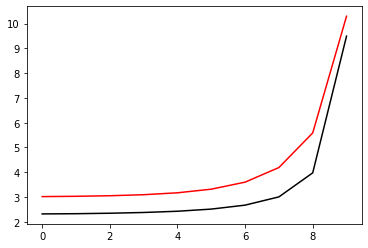

436700 0.03484284680578928 -0.8698875122825428 0.8671473127728418
[2.39100411 2.39358346 2.40085627 2.41978134 2.46049683 2.54143826
 2.70366294 3.06061611 4.08384842 9.47758037]


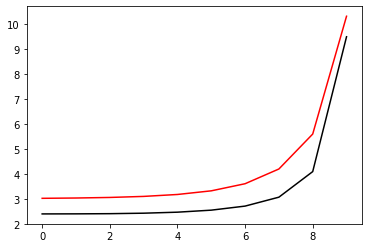

437800 0.044381772925038275 -0.8693551111647043 0.8688770898077907
[2.38134327 2.39022405 2.41272224 2.45837144 2.54199919 2.69222343
 2.96685068 3.49750158 4.7137305  9.49422667]


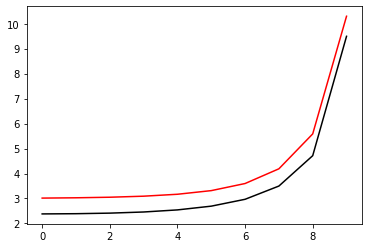

438900 0.04058363728935139 -0.8744996769411689 0.8650115065669051
[2.36426605 2.38223679 2.42414215 2.50284737 2.64153107 2.88087525
 3.29330834 4.01658953 5.41244423 9.66122856]


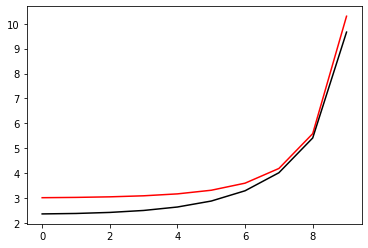

440000 0.19033981989454704 -0.8770903474265274 0.8572899185151392
[2.57448755 2.58067653 2.60636335 2.6615892  2.76376466 2.93631806
 3.20304161 3.64275806 4.92429164 9.55273249]


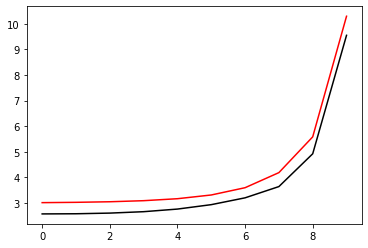

441100 0.055204997855347555 -0.8718441885785543 0.8685355049818377
[2.42297138 2.41607904 2.41429509 2.42867155 2.47126417 2.559696
 2.73222216 3.11865623 4.37480096 9.51689216]


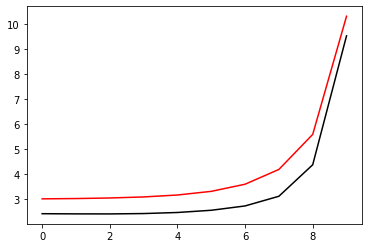

442200 0.05860994643328622 -0.8800093340552857 0.8632679607718099
[2.34765131 2.35455272 2.37357139 2.41807795 2.50865473 2.68223326
 3.00679853 3.61291489 4.95243385 9.48023756]


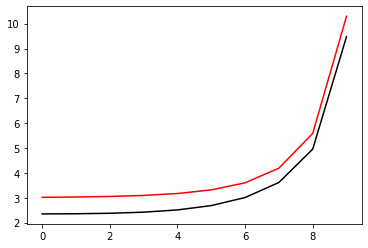

443300 0.2792574055089457 -0.850376474605931 0.8971890836798382
[2.07912688 2.07140411 2.07388019 2.10360094 2.18607565 2.36813353
 2.73165718 3.4120682  4.8037376  9.58800218]


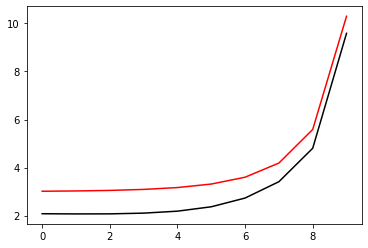

444400 0.0341599785085631 -0.871277986164722 0.8700707050116181
[2.62370804 2.61162188 2.59100846 2.57080596 2.55882069 2.57100236
 2.65617049 3.01962505 4.21590182 9.46637392]


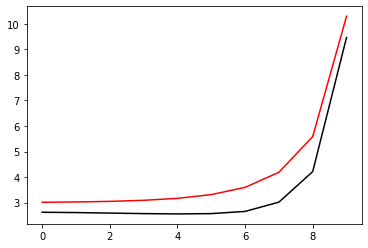

445500 0.03371760003113967 -0.8647558467337051 0.8731382499415916
[2.61756832 2.61595798 2.61282275 2.61116886 2.62083745 2.66369164
 2.78989399 3.14275027 4.30036973 9.53595486]


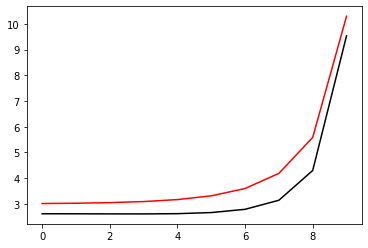

446600 0.04333700407787892 -0.8641108929622656 0.8743113856091297
[2.60151668 2.60426718 2.61159618 2.62798475 2.66292644 2.737044
 2.8983872  3.28159961 4.41723119 9.43857039]


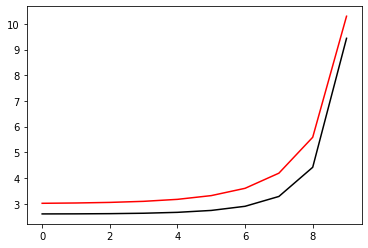

447700 0.033713995506221686 -0.8746594428180006 0.8689587361346423
[2.32873645 2.33823506 2.35614845 2.39468845 2.47363824 2.62831756
 2.92272504 3.4896494  4.79012382 9.55103302]


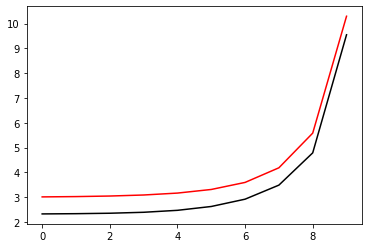

448800 0.05993556235242534 -0.8605664571058806 0.8713615546986746
[2.40038382 2.40301672 2.41520895 2.44340388 2.49520574 2.57344552
 2.635743   2.59758534 4.06415274 9.45330749]


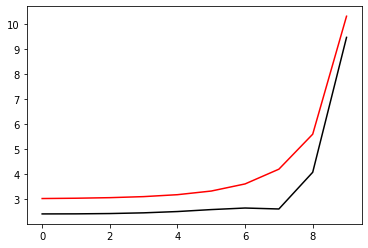

449900 0.044043367157213756 -0.8634134322672701 0.8660132036010367
[2.47146111 2.47152024 2.47727885 2.49604145 2.53355939 2.58857505
 2.64266779 2.72157041 4.02792708 9.4734738 ]


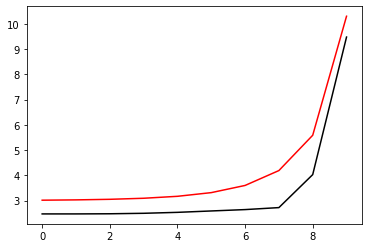

451000 0.0660131122757963 -0.8672769385721403 0.8654174745432364
[2.38541354 2.38692365 2.39716618 2.42298551 2.4744017  2.56688279
 2.73266677 3.07155304 4.33002543 9.50429081]


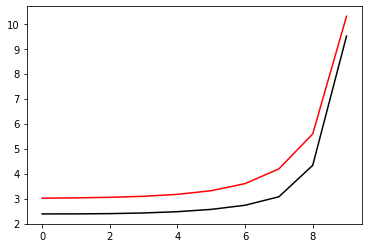

452100 0.029706246526841514 -0.8734081519030634 0.8628872457135353
[2.25146362 2.25743303 2.27923435 2.32737223 2.41985064 2.59217919
 2.91725884 3.52721774 4.85413076 9.58305234]


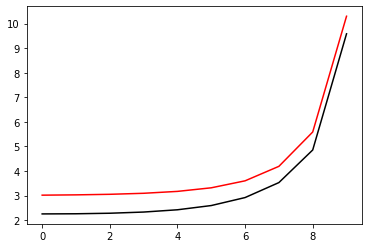

453200 0.4066582804778585 -0.8252026895914389 0.9212504832213968
[1.89353013 1.90481119 1.9305268  1.97290111 2.04100128 2.15344128
 2.35516209 2.80814706 4.07579296 9.46347633]


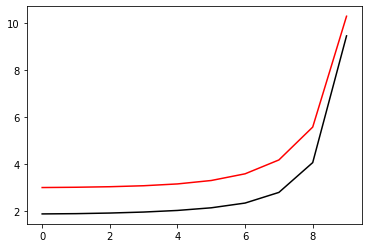

454300 0.29108814620976214 -0.8444594982116811 0.9028709283012544
[1.92136815 1.93371295 1.95650982 1.9893624  2.03446421 2.09855573
 2.2096432  2.52245668 3.70824829 9.46474667]


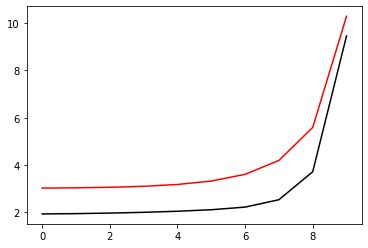

455400 0.057803737096458356 -0.8807740748865704 0.8586330144127208
[2.35437188 2.35804631 2.3641695  2.3665739  2.35330663 2.30055292
 2.17314186 2.07075106 2.92871635 9.29157649]


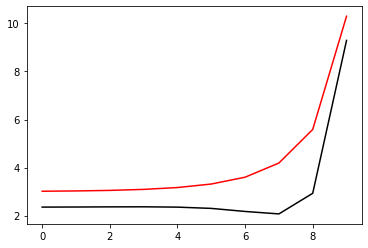

456500 0.1869767404737529 -0.8476366300106724 0.8895560880935248
[2.17114691 2.18577469 2.20179683 2.20903328 2.19449907 2.13609521
 2.00259962 1.83262611 2.50032948 9.36672929]


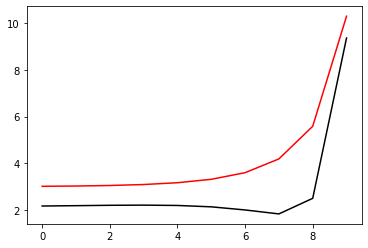

457600 0.03055997854552181 -0.876608650776952 0.8590201558184467
[2.34406822 2.34912711 2.35725959 2.36155956 2.35083412 2.30784527
 2.21061731 2.08053593 2.62683927 9.34452499]


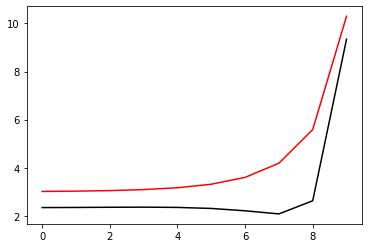

458700 0.06246681487654539 -0.8643496877051259 0.8604144730423746
[2.42367993 2.42418586 2.42392337 2.41314731 2.37532838 2.27864215
 2.06114822 1.70919087 2.09640392 9.33507376]


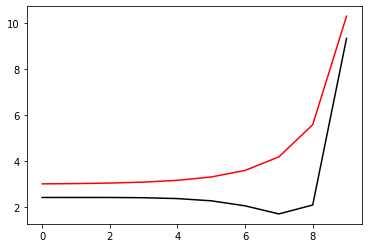

459800 0.04577998987370503 -0.8597241063114273 0.8627612607502271
[2.53871823 2.5432737  2.54885221 2.55007781 2.5364868  2.48859294
 2.37353115 2.17129375 2.46712709 9.28597011]


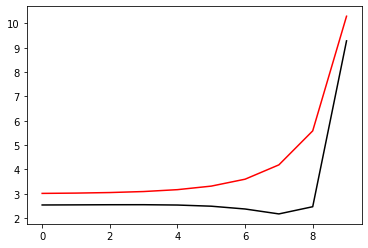

460900 0.045570366810323365 -0.8596370229641137 0.8633155095493268
[2.51411025 2.51734856 2.52597553 2.53763843 2.54785472 2.54976026
 2.53499209 2.51151252 2.87895813 9.42051614]


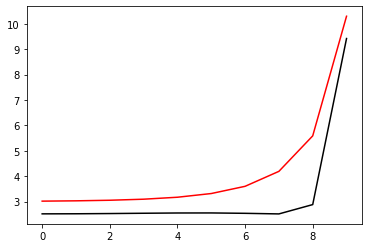

462000 0.0832056380460631 -0.8630472395595846 0.8614801286489461
[2.47922429 2.48288445 2.49269501 2.51054686 2.5388738  2.58199963
 2.65080134 2.78343742 3.30317119 9.39259637]


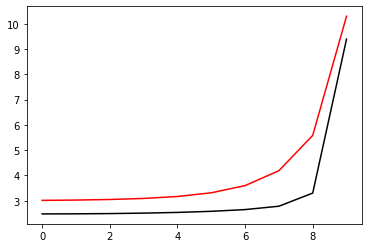

463100 0.056309007382124646 -0.8670556519338548 0.8609265203045351
[2.31041559 2.32047136 2.33602454 2.35748346 2.38666167 2.42624106
 2.48147573 2.58212066 3.0759855  9.43237435]


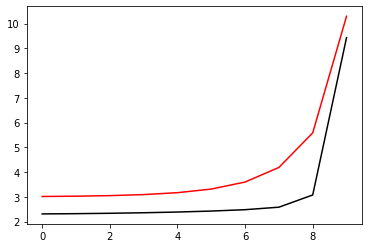

464200 0.07249593455167025 -0.8683954238423442 0.860246923134673
[2.37044226 2.37428426 2.38278917 2.39875736 2.42563722 2.46828108
 2.53619287 2.66780359 3.23185004 9.47403671]


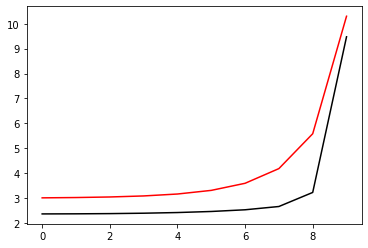

465300 0.03215330405358714 -0.873653699779705 0.858660688030435
[2.28858186 2.29588256 2.31849016 2.36465251 2.44820538 2.59155486
 2.82824238 3.20417771 3.99466358 9.44173935]


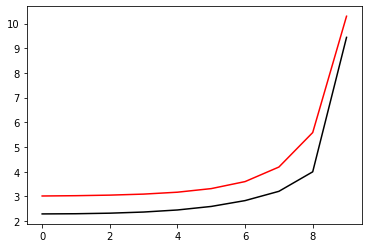

466400 0.4259942652312097 -0.8189100227627178 0.9071010883693444
[2.08199717 2.10482259 2.14222678 2.19227782 2.25803976 2.33774414
 2.40986261 2.53600729 3.33019568 9.42173845]


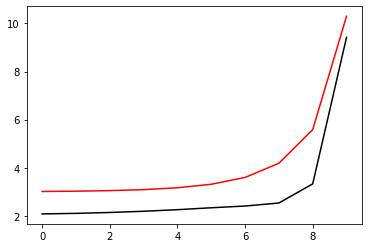

467500 0.03590405328092037 -0.8694666907459982 0.8623522460419257
[2.24260059 2.2499368  2.26740205 2.29242038 2.31850683 2.32780159
 2.28105499 2.21354909 2.91059074 9.34223332]


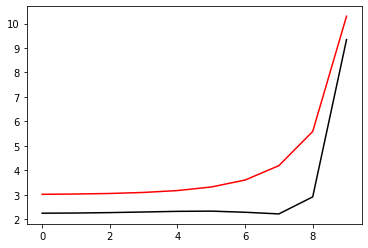

468600 0.02585925818897896 -0.872258435040638 0.8572043782518325
[2.29139899 2.29884358 2.31769609 2.34899234 2.39235484 2.44667207
 2.51486678 2.62612209 3.26626507 9.42757243]


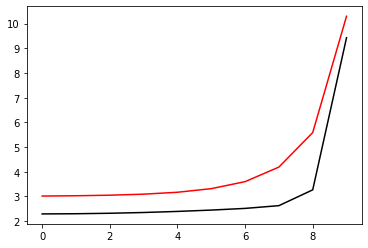

469700 0.05408605873754841 -0.8666687620397254 0.8574052114981855
[2.2938608  2.30727742 2.32940261 2.35350275 2.37162126 2.36903351
 2.32464564 2.26723727 2.78643401 9.37210667]


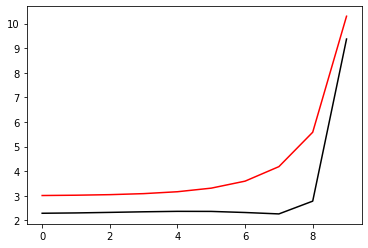

470800 0.05363675268657321 -0.8727011161854159 0.8543755931499203
[2.31238003 2.32378167 2.34629338 2.38009629 2.42494047 2.48432859
 2.56998723 2.68782246 3.18240688 9.3118428 ]


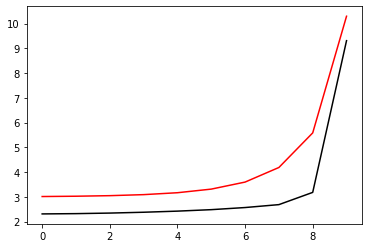

471900 0.12544001044696063 -0.8682689292897149 0.8564811275883369
[2.52901162 2.5444825  2.57262754 2.6187402  2.69108093 2.80154113
 2.95928375 3.14458805 3.57637616 9.40402076]


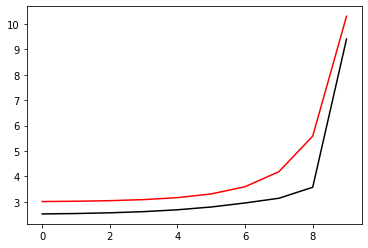

473000 0.06789913586746386 -0.8560851619885075 0.863532610453952
[2.54269489 2.5510471  2.56857447 2.60073355 2.65399055 2.73779288
 2.86747878 3.0737901  3.64177692 9.44314485]


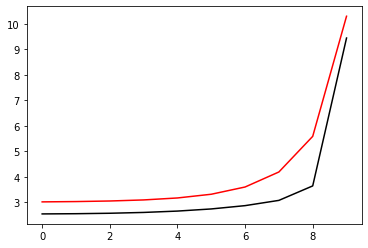

474100 0.05684203532473545 -0.8624098550050542 0.861806700484541
[2.3573351  2.35551543 2.36353857 2.39088953 2.4469935  2.54788079
 2.7237512  3.04201008 3.81975442 9.41300836]


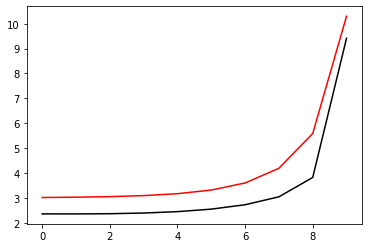

475200 0.058843448792686236 -0.8662529750894216 0.8609135827462798
[2.3204638  2.33442432 2.36197538 2.41441248 2.50682186 2.66400248
 2.93058684 3.39920159 4.40628891 9.57488215]


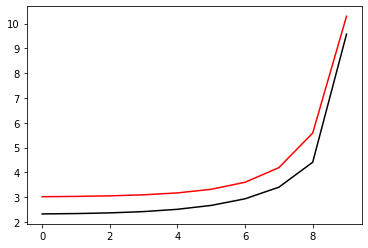

476300 0.3419021441077315 -0.8434305172867697 0.8652345126255581
[2.55907098 2.57365031 2.6107534  2.68241148 2.80836332 3.02005794
 3.33477718 3.40107699 4.502434   9.44058824]


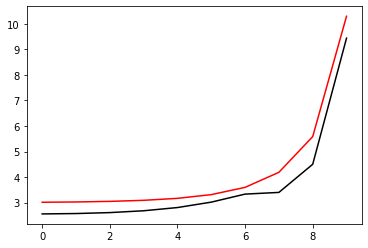

477400 0.03401035863173458 -0.8486808396975086 0.8562773671051387
[2.53665127 2.53707958 2.54607808 2.57294134 2.62854457 2.72738589
 2.86631138 2.84793425 3.85132157 9.46257392]


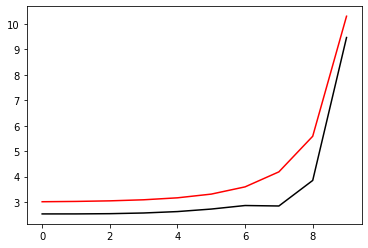

478500 0.03392890310524247 -0.8479804020979955 0.8563523605187566
[2.56358888 2.56852008 2.58225981 2.61213206 2.66886361 2.76388379
 2.89135881 2.9696118  3.93366953 9.41415571]


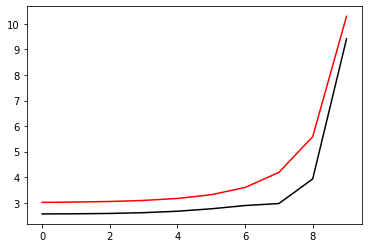

479600 0.043707265645792685 -0.8488986789257591 0.8558910766569953
[2.56062404 2.56664756 2.58206279 2.61252759 2.66631163 2.75348437
 2.88077651 3.06543941 4.00927315 9.47670808]


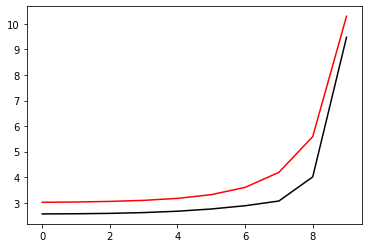

480700 0.042345055894456245 -0.8537776134447095 0.855585370074247
[2.36756067 2.37716651 2.39993197 2.44079108 2.50813818 2.6165708
 2.79233111 3.11131255 4.12905944 9.48447127]


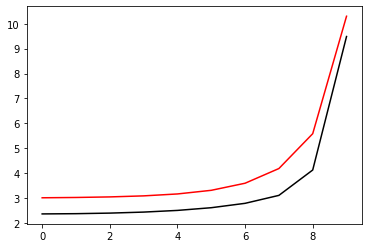

481800 0.04415210043075034 -0.8549673730886915 0.855619699731853
[2.37805706 2.38930899 2.41701303 2.46840693 2.55495265 2.69715567
 2.9360528  3.37719872 4.49025083 9.46546971]


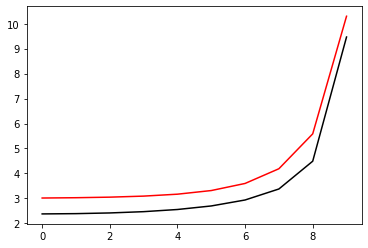

482900 0.034892299933763755 -0.8603538159729213 0.8538354272949661
[2.1406768  2.1595412  2.20650683 2.2952186  2.44859594 2.70749304
 3.14105383 3.86424676 5.2312875  9.56572429]


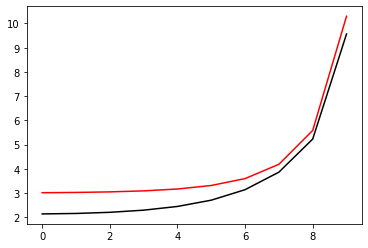

484000 0.08173529379214073 -0.8341905925118085 0.8536431065793849
[2.5068015  2.51525366 2.54546221 2.6080051  2.71311738 2.85817607
 2.96991385 2.8911956  4.31356561 9.5081497 ]


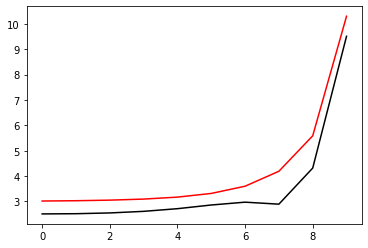

485100 0.054040659744866895 -0.8411731067957904 0.8510321536604102
[2.47411289 2.48842494 2.52086638 2.58088487 2.67702727 2.8093142
 2.96033375 3.1588437  4.40403316 9.59777542]


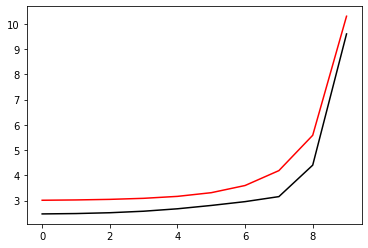

486200 0.06779940502048562 -0.8557283389026186 0.8431163889058606
[2.22637763 2.24170612 2.27277843 2.32674634 2.41150391 2.53826404
 2.732082   3.08943346 4.28962734 9.53985158]


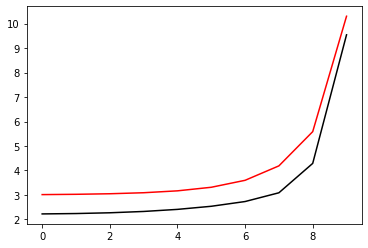

487300 0.04587567018544177 -0.8418185624918317 0.8537845882072752
[2.3625527  2.36536418 2.37829314 2.40653297 2.45546697 2.53447166
 2.67041714 2.97695595 4.07823935 9.44500575]


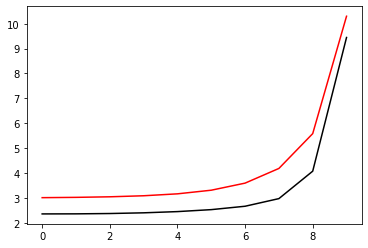

488400 0.03428456551005762 -0.8376963442890791 0.8521495736344933
[2.47745585 2.47469157 2.46884526 2.45961026 2.44378733 2.4162171
 2.38770099 2.48694533 3.44278695 9.46733572]


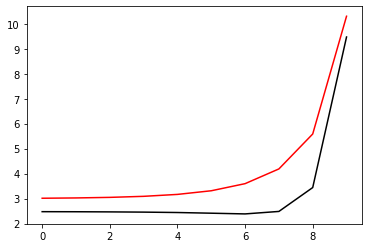

489500 0.033953219513138615 -0.8430350817333663 0.8472519541785264
[2.48331299 2.48169192 2.47879429 2.47535409 2.47324056 2.47924365
 2.51983179 2.70429149 3.63176771 9.41445363]


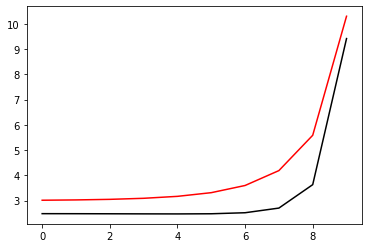

490600 0.04380521945432164 -0.8454247594111959 0.8466456288408418
[2.42472897 2.42579151 2.42976836 2.44053334 2.4665064  2.52570072
 2.65909624 2.97730964 3.95874097 9.48830795]


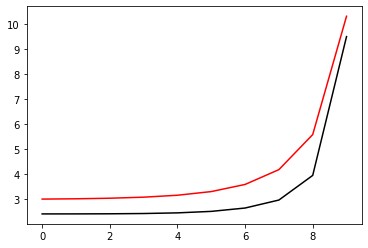

491700 0.2647400540949098 -0.8323329013616778 0.8717310327160946
[1.96036943 1.96405859 1.97929197 2.01313221 2.08066695 2.21083214
 2.45767912 2.92637558 4.0152707  9.46775028]


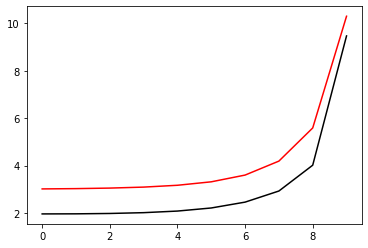

492800 0.05404921240040663 -0.8534252598304126 0.840515296893191
[2.32839771 2.32996687 2.33438747 2.3430832  2.35777922 2.38291842
 2.43278016 2.58806934 3.37889074 9.3843404 ]


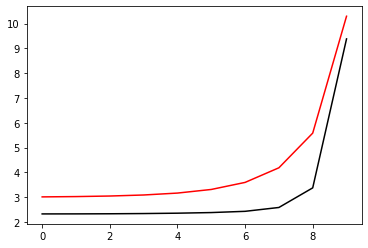

493900 0.04310473211831236 -0.8550098196052438 0.8433090075770558
[2.22178853 2.23063993 2.25072596 2.28821426 2.35368478 2.46491495
 2.6543232  2.99927519 3.93728138 9.45849255]


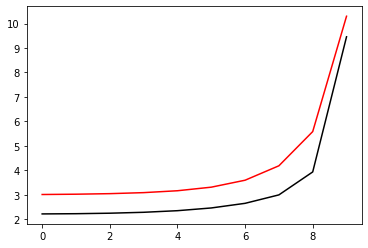

495000 0.2534671920661655 -0.8363820605094686 0.874466077295462
[1.91072692 1.92627364 1.9610472  2.02004293 2.11294248 2.2579307
 2.48827812 2.8851763  3.87257303 9.48247081]


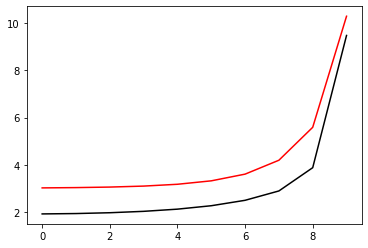

496100 0.13972119279517542 -0.8468507674096605 0.8554122187452312
[2.21325295 2.22721723 2.25589774 2.29560729 2.34370107 2.39937391
 2.47013062 2.62275416 3.35028655 9.39800477]


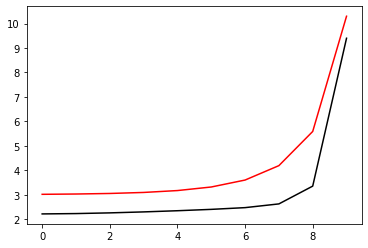

497200 0.055645520955880164 -0.8441930593316608 0.8519157886977592
[2.4645398  2.47534775 2.49081314 2.51251347 2.54072693 2.5734364
 2.61219104 2.71534749 3.3813263  9.41011461]


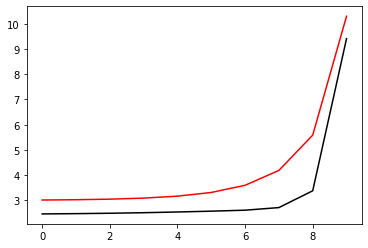

498300 0.046376190912126435 -0.8482036347283043 0.8491085736020849
[2.41646745 2.42130505 2.43614835 2.46311956 2.50727566 2.57566075
 2.68124852 2.87961973 3.62268047 9.54062832]


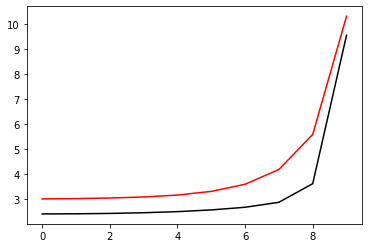

499400 0.03414414880817693 -0.850417370625459 0.8486235063124868
[2.3817423  2.39739085 2.43094571 2.4862876  2.57046137 2.69893093
 2.89750153 3.23250635 4.10093771 9.46902153]


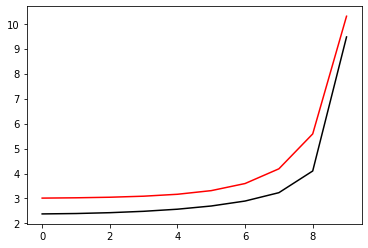

In [117]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, m2_2, lam2, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h, m2_2, lam2])
    for i in range (90):
        optimizer.apply_gradients(zip(gradients, [h]))
    for i in range (10):
        optimizer.apply_gradients(zip(gradients, [h, m2_2, lam2]))
    if j%11==0: 
        print(j*100, Error_func(h, m2_2, lam2, Positive[j%10], Negative[j%10]).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

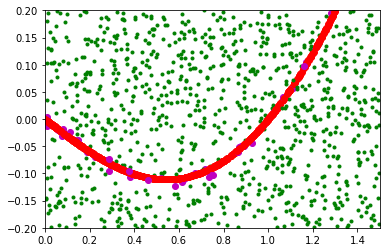

In [118]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, m2_2, lam2, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, m2_2, lam2, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()